# Anomaly Detection from Customer Purchasing Pattern

**Outlier Data - Penambangan Data B**

- Ariana Nurlayla Syabandini - 2206081950
- Lucinda Laurent - 2206024745
- Rayhan Adhisworo Jardine Hidayat - 2006484186
- Syahrul Apriansyah - 2106708311
- Wahyu Hidayat - 2206081894

## i. Import Libraries

In [ ]:
%pip install shap

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

## ii. Load Dataset

In [ ]:
url = "https://docs.google.com/spreadsheets/d/1F0uxac7IHuXq9rNPQ37gPVMAAdX45MxM/export?format=csv"
df = pd.read_csv(url)

In [ ]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/10 8:26,"2,55",17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/10 8:26,"3,39",17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/10 8:26,"2,75",17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/10 8:26,"3,39",17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/10 8:26,"3,39",17850.0,United Kingdom


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  object 
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(1), int64(1), object(6)
memory usage: 33.1+ MB


**Struktur Dataset**
- **Jumlah kolom**: 8
- **Kolom-kolom utama**:
  - `InvoiceNo` (int64): Nomor transaksi unik (bisa diawali dengan 'C' untuk pembatalan).
  - `StockCode` (object): Kode produk.
  - `Description` (object): Nama produk.
  - `Quantity` (int64): Jumlah produk dalam transaksi.
  - `InvoiceDate` (datetime64): Tanggal dan waktu transaksi.
  - `UnitPrice` (float64): Harga per unit produk.
  - `CustomerID` (int64): Kode unik pelanggan.
  - `Country` (object): Negara asal pelanggan.

- **Ciri dataset**:
  - Data mencakup **1 tahun transaksi** dari **Desember 2010 hingga Desember 2011**.
  - Berasal dari berbagai negara.



## 1. Exploratory Data Analysis (EDA)

### 1.1. Informasi Dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  object 
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(1), int64(1), object(6)
memory usage: 33.1+ MB


### 1.2. Statistik Deskriptif

In [ ]:
df.describe()

,Quantity,CustomerID
count,541909.000000,406829.000000
mean,9.552250,15287.690570
std,218.081158,1713.600303
min,-80995.000000,12346.000000
25%,1.000000,13953.000000
50%,3.000000,15152.000000
75%,10.000000,16791.000000
max,80995.000000,18287.000000


### 1.3. Missing Values

In [ ]:
df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,1454
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,135080
Country,0


### 1.4. Duplicate Data

In [ ]:
df.duplicated().sum()

np.int64(5268)

### 1.5. Distribusi Quantity dan UnitPrice (Kolom Numerik Utama)

In [ ]:
df['UnitPrice'] = df['UnitPrice'].replace('[,]', '.', regex=True).astype(float)

In [ ]:
plt.figure(figsize=(15, 5))

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

#### 1.5.1. Distribusi Quantity dan UnitPrice

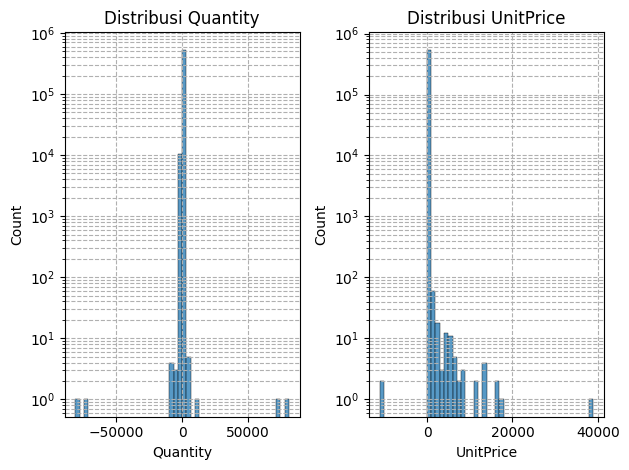

In [ ]:
plt.subplot(1, 2, 1)
sns.histplot(df['Quantity'], bins=50)
plt.title('Distribusi Quantity')
plt.xlabel('Quantity')
plt.ylabel('Count')

plt.yscale('log')
plt.grid(True, which="both", ls="--")

plt.subplot(1, 2, 2)
sns.histplot(df['UnitPrice'], bins=50)
plt.title('Distribusi UnitPrice')
plt.xlabel('UnitPrice')
plt.ylabel('Count')

plt.yscale('log')
plt.grid(True, which="both", ls="--")

plt.tight_layout()
plt.show()

Terdapat sejumlah entri dalam dataset dimana Quantity dan/atau Unit Price bernilai negatif.

#### 1.5.2. Distribusi Quantity dan UnitPrice (adjusted)

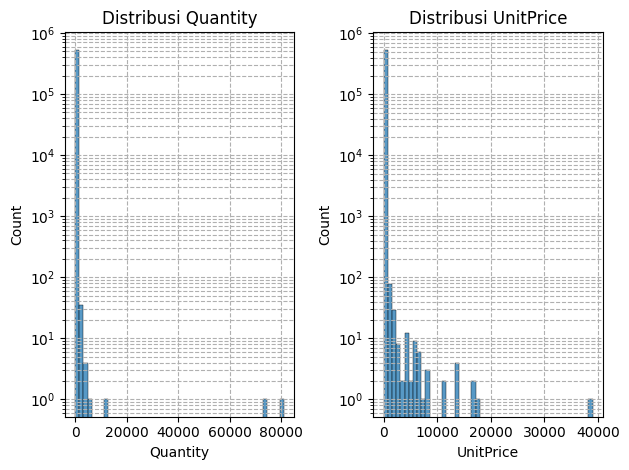

In [ ]:
plt.subplot(1, 2, 1)
sns.histplot(df[df['Quantity'] > 0]['Quantity'], bins=50)  # Hanya Quantity > 0
plt.title('Distribusi Quantity')
plt.xlabel('Quantity')
plt.ylabel('Count')

plt.yscale('log')
plt.grid(True, which="both", ls="--")

plt.subplot(1, 2, 2)
sns.histplot(df[df['UnitPrice'] > 0]['UnitPrice'], bins=50)  # Hanya UnitPrice > 0
plt.title('Distribusi UnitPrice')
plt.xlabel('UnitPrice')
plt.ylabel('Count')

plt.yscale('log')
plt.grid(True, which="both", ls="--")

plt.tight_layout()
plt.show()


Mengabaikan nilai negatif, berikut adalah distribusi dari Quantity dan UnitPrice.

#### 1.5.3. Rentang nilai Quantity dan UnitPrice

In [ ]:
print("Range Quantity:", df['Quantity'].min(), "hingga", df['Quantity'].max())
print("Range UnitPrice:", df['UnitPrice'].min(), "hingga", df['UnitPrice'].max())

Range Quantity: -80995 hingga 80995
Range UnitPrice: -11062.06 hingga 38970.0


#### 1.5.4. Scatter Plot: Quantity vs UnitPrice

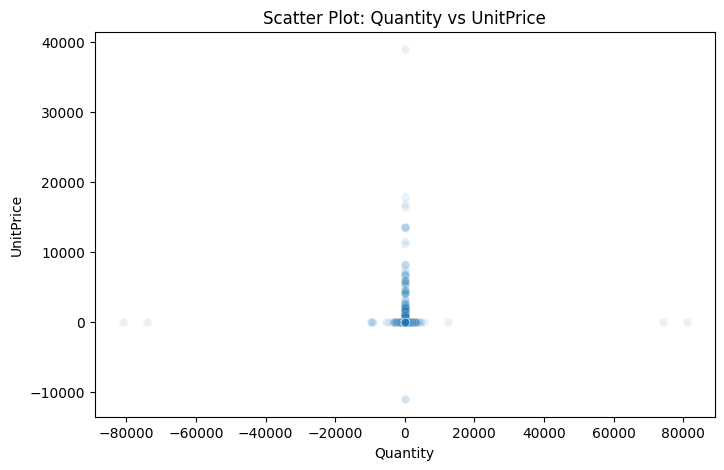

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Quantity', y='UnitPrice', data=df, alpha=0.1)  # Alpha untuk mengurangi overplotting
plt.title('Scatter Plot: Quantity vs UnitPrice')
plt.xlabel('Quantity')
plt.ylabel('UnitPrice')
plt.show()

Temuan:
1. Outliers yang Sangat Ekstrim
Ada nilai Quantity yang sangat besar (positif dan negatif), hingga puluhan ribu unit.
Ada juga UnitPrice yang sangat tinggi, mencapai lebih dari 40.000.
2. Quantity Negatif
Ada beberapa transaksi dengan Quantity negatif, yang kemungkinan besar adalah retur (pengembalian barang).
3. Pusat Data yang Padat di Sekitar Nol
Sebagian besar transaksi tampaknya berada di sekitar Quantity kecil (antara 0 hingga beberapa ratus) dan harga unit yang tidak terlalu tinggi.
Ini menunjukkan pola normal bahwa mayoritas pelanggan membeli dalam jumlah yang tidak terlalu besar.

### 1.6. Analisis Nilai Negatif pada Kolom Numerik

#### 1.6.1. Cek Quantity Negatif

##### 1.6.1.1. Cek transaksi dengan Quantity negatif

In [ ]:
# Cek transaksi dengan Quantity negatif
negative_quantity = df[df['Quantity'] < 0]
print(negative_quantity)

# Cek InvoiceNo yang memiliki Quantity negatif
# Jika diawali dengan 'C', maka menunjukkan pembatalan
negative_quantity['IsCancelled'] = negative_quantity['InvoiceNo'].astype(str).str.startswith('C')
print(negative_quantity[['InvoiceNo', 'Quantity', 'IsCancelled']].head())

       InvoiceNo StockCode                       Description  Quantity  \
141      C536379         D                          Discount        -1   
154      C536383    35004C   SET OF 3 COLOURED  FLYING DUCKS        -1   
235      C536391     22556    PLASTERS IN TIN CIRCUS PARADE        -12   
236      C536391     21984  PACK OF 12 PINK PAISLEY TISSUES        -24   
237      C536391     21983  PACK OF 12 BLUE PAISLEY TISSUES        -24   
...          ...       ...                               ...       ...   
540449   C581490     23144   ZINC T-LIGHT HOLDER STARS SMALL       -11   
541541   C581499         M                            Manual        -1   
541715   C581568     21258        VICTORIAN SEWING BOX LARGE        -5   
541716   C581569     84978  HANGING HEART JAR T-LIGHT HOLDER        -1   
541717   C581569     20979     36 PENCILS TUBE RED RETROSPOT        -5   

          InvoiceDate  UnitPrice  CustomerID         Country  
141      12/1/10 9:41      27.50     14527.0  Un

<ipython-input-16-431367751>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_quantity['IsCancelled'] = negative_quantity['InvoiceNo'].astype(str).str.startswith('C')


Sekilas terlihat bahwa transaksi dengan quantity negatif memiliki InvoiceNo yang diawali dengan huruf "C". Seakan-akan seluruh transaksi dengan quantity negatif ini menunjukkan pembatalan transaksi. Mari kita cek lebih lanjut untuk memastikannya.

##### 1.6.1.2. Cek apakah semua transaksi dengan InvoiceNo yang diawali huruf "C" memiliki Quantity negatif

In [ ]:
# Filter invoice yang diawali dengan 'C'
cancelled_invoices = df[df['InvoiceNo'].astype(str).str.startswith('C')]

# Cek apakah semua Quantity dalam subset ini negatif
all_negative = (cancelled_invoices['Quantity'] < 0).all()
if all_negative:
    print("Semua InvoiceNo yang diawali 'C' memiliki Quantity negatif.")
else:
    print("Ada InvoiceNo yang diawali 'C' tetapi Quantity-nya tidak selalu negatif.")


Semua InvoiceNo yang diawali 'C' memiliki Quantity negatif.


##### 1.6.1.3. Cek transaksi yang InvoiceNo diawali huruf "C", tetapi Quantity tidak negatif

In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str)

# Filter transaksi yang InvoiceNo diawali dengan 'C' tetapi memiliki Quantity >= 0
invalid_cancelled = df[(df['InvoiceNo'].str.startswith('C')) & (df['Quantity'] >= 0)]

print("\nTransaksi yang InvoiceNo-nya diawali huruf 'C', tetapi Quantity tidak negatif:\n")
invalid_cancelled[['InvoiceNo', 'Quantity']]


Transaksi yang InvoiceNo-nya diawali huruf 'C', tetapi Quantity tidak negatif:



,InvoiceNo,Quantity


##### 1.6.1.4. Cek duplikasi InvoiceNo yang diawali huruf "C" dan yang tidak

In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str)

cancelled_invoices = df[df['InvoiceNo'].str.startswith('C')]['InvoiceNo'].str[1:]
adjust_bad_debt_invoices = df[df['InvoiceNo'].str.startswith('A')]['InvoiceNo']

normal_invoices = df[~df['InvoiceNo'].isin(cancelled_invoices) & ~df['InvoiceNo'].isin(adjust_bad_debt_invoices)]

duplicate_cancelled = normal_invoices[normal_invoices['InvoiceNo'].isin(cancelled_invoices).isin(adjust_bad_debt_invoices)]

if not duplicate_cancelled.empty:
    print("Ditemukan Invoice yang memiliki pasangan pembatalan:")
    print(duplicate_cancelled['InvoiceNo'].unique())
else:
    print("Tidak ditemukan Invoice yang memiliki pasangan pembatalan.")


Tidak ditemukan Invoice yang memiliki pasangan pembatalan.


##### 1.6.1.5. Cek transaksi dengan Quantity negatif yang InvoiceNo tidak diawali dengan huruf "C"

In [ ]:
# Cek transaksi dengan Quantity negatif
negative_quantity = df[df['Quantity'] < 0]

# Kolom untuk menandai apakah InvoiceNo diawali dengan 'C'
negative_quantity['IsCancelled'] = negative_quantity['InvoiceNo'].astype(str).str.startswith('C')

# Filter transaksi yang Quantity-nya negatif, tetapi tidak diawali dengan 'C'
invalid_negative_transactions = negative_quantity[~negative_quantity['IsCancelled']]

print("Transaksi dengan Quantity negatif yang tidak diawali huruf 'C':\n")
print(invalid_negative_transactions[['InvoiceNo', 'Quantity']])

Transaksi dengan Quantity negatif yang tidak diawali huruf 'C':

       InvoiceNo  Quantity
2406      536589       -10
4347      536764       -38
7188      536996       -20
7189      536997       -20
7190      536998        -6
...          ...       ...
535333    581210       -26
535335    581212     -1050
535336    581213       -30
536908    581226      -338
538919    581422      -235

[1336 rows x 2 columns]


<ipython-input-20-805543834>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_quantity['IsCancelled'] = negative_quantity['InvoiceNo'].astype(str).str.startswith('C')


Ternyata tidak semua transaksi dengan quantity negatif memiliki InvoiceNo yang diawali huruf "C". Apakah artinya tidak semua transaksi dengan quantity negatif merupakan pembatalan transaksi?

##### 1.6.1.6. Pemeriksaan Karakter Unik Pertama InvoiceNo pada Transaksi dengan Quantity Negatif

In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str)

first_chars = df['InvoiceNo'].str[0]

print("Karakter pertama yang unik dalam InvoiceNo:", first_chars.unique())

first_chars.value_counts()


Karakter pertama yang unik dalam InvoiceNo: ['5' 'C' 'A']


,count
InvoiceNo,
5,532618
C,9288
A,3


###### Description InvoiceNo yang Diawali dengan huruf "C"

In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str)

# Filter transaksi yang InvoiceNo diawali dengan 'C'
products_with_C = df[df['InvoiceNo'].str.startswith('C')]

print("Deskripsi produk dengan InvoiceNo diawali huruf 'C':")
products_with_C['Description'].unique()

Deskripsi produk dengan InvoiceNo diawali huruf 'C':


array(['Discount', 'SET OF 3 COLOURED  FLYING DUCKS',
       'PLASTERS IN TIN CIRCUS PARADE ', ...,
       'SMALL SQUARE CUT GLASS CANDLESTICK',
       'HOUSE SHAPE PENCIL SHARPENER', 'PAPER CRAFT , LITTLE BIRDIE'],
      dtype=object)

###### Description InvoiceNo yang Diawali dengan huruf "A"

In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str)

# Filter transaksi yang InvoiceNo diawali dengan 'A'
products_with_A = df[df['InvoiceNo'].str.startswith('A')]

print("Deskripsi produk dengan InvoiceNo diawali huruf 'A':")
print(products_with_A['Description'].unique())

Deskripsi produk dengan InvoiceNo diawali huruf 'A':
['Adjust bad debt']


In [ ]:
customer_ids_A = products_with_A['CustomerID'].dropna().unique()

print("CustomerID yang terkait dengan InvoiceNo diawali 'A':")
print(customer_ids_A)

print("Jumlah CustomerID unik terkait:", len(customer_ids_A))

CustomerID yang terkait dengan InvoiceNo diawali 'A':
[]
Jumlah CustomerID unik terkait: 0


###### Description InvoiceNo yang Diawali dengan angka "5"

In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str)

# Filter transaksi yang InvoiceNo diawali dengan '5'
products_with_5 = df[df['InvoiceNo'].str.startswith('5')]

print("Deskripsi produk dengan InvoiceNo diawali huruf '5':")
print(products_with_5['Description'].unique())


Deskripsi produk dengan InvoiceNo diawali huruf '5':
['WHITE HANGING HEART T-LIGHT HOLDER' 'WHITE METAL LANTERN'
 'CREAM CUPID HEARTS COAT HANGER' ... 'lost'
 'CREAM HANGING HEART T-LIGHT HOLDER' 'PAPER CRAFT , LITTLE BIRDIE']


#### 1.6.2. Cek UnitPrice Negatif

In [ ]:
negative_price_transactions = df[df['UnitPrice'] < 0]

if not negative_price_transactions.empty:
    print("Ditemukan transaksi dengan UnitPrice negatif:")
    print(negative_price_transactions[['InvoiceNo', 'Description', 'Quantity', 'UnitPrice']])
else:
    print("Tidak ada transaksi dengan UnitPrice negatif.")


Ditemukan transaksi dengan UnitPrice negatif:
       InvoiceNo      Description  Quantity  UnitPrice
299983   A563186  Adjust bad debt         1  -11062.06
299984   A563187  Adjust bad debt         1  -11062.06


#### 1.6.3. Temuan

1. Semua transaksi dengan InvoiceNo yang diawali huruf "C" memiliki Quantity negatif

2. Tidak ada transaksi dengan InvoiceNo yang diawali huruf "C" yang memiliki Quantity non negatif (sama seperti nomor 1)

3. Tidak ditemukan duplikasi InvoiceNo yang diawali "C" dengan InvoiceNo yang lain

4. Ada transaksi dengan Quantity negatif yang tidak diawali dengan huruf "C"

5. Transaksi dengan Quantity negatif memiliki InvoiceNo yang diawali dengan huruf "C", huruf "A", atau angka "5"

6. Transaksi dengan Quantity negatif yang memiliki InvoiceNo yang diawali dengan C mengindikasikan pembatalan transaksi

7. Transaksi dengan Quantity negatif yang memiliki InvoiceNo yang diawali dengan A mengindikasikan "Adjust bad debt", kemungkinan sistem catatan untuk internal. Tidak ada CustomerID yang berhubungan dengan InvoiceNo yang diawali huruf "A"

8. UnitPrice negatif hanya ditemukan pada dua InvoiceNo yang diawali dengan huruf "A" dan tidak terkait dengan CustomerID manapun.

### 1.7. Distribusi Transaksi

#### 1.7.1. Distribusi Transaksi per Bulan (Analisis Temporal)

<ipython-input-27-4055733630>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])


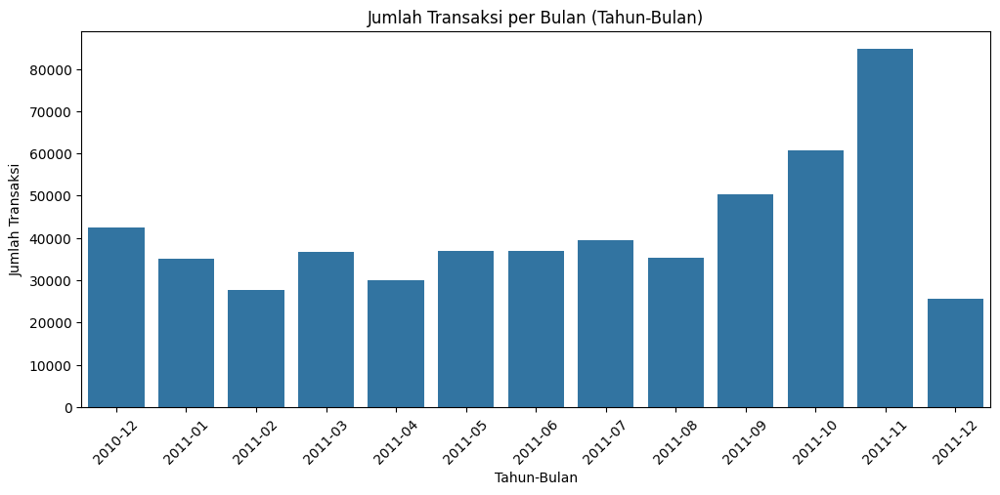

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month
df['YearMonth'] = df['InvoiceDate'].dt.strftime('%Y-%m')

plt.figure(figsize=(12, 5))
sns.countplot(x='YearMonth', data=df)
plt.title('Jumlah Transaksi per Bulan (Tahun-Bulan)')
plt.xlabel('Tahun-Bulan')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation=45)
plt.show()

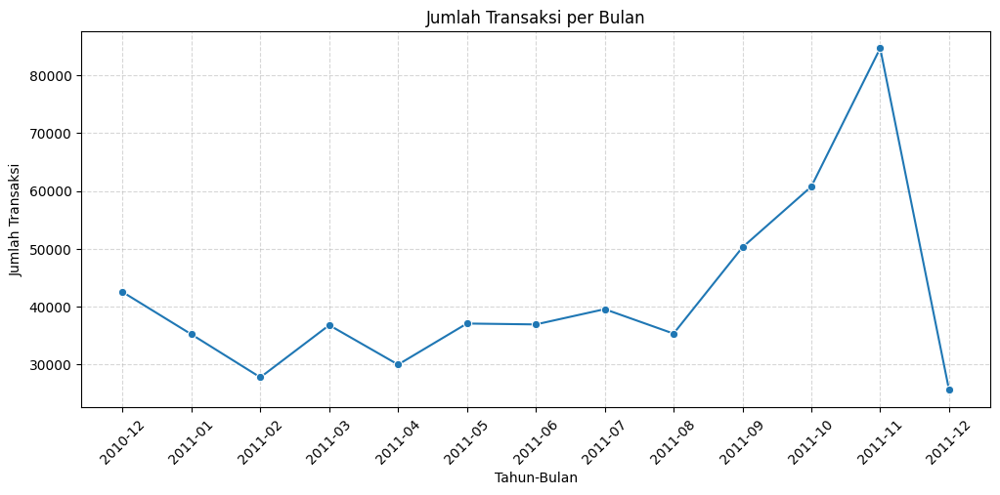

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

df['YearMonth'] = df['InvoiceDate'].dt.strftime('%Y-%m')

monthly_transactions = df.groupby('YearMonth').size().reset_index(name='TransactionCount')

plt.figure(figsize=(12, 5))
sns.lineplot(x='YearMonth', y='TransactionCount', data=monthly_transactions, marker='o')

plt.title('Jumlah Transaksi per Bulan')
plt.xlabel('Tahun-Bulan')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)

plt.show()

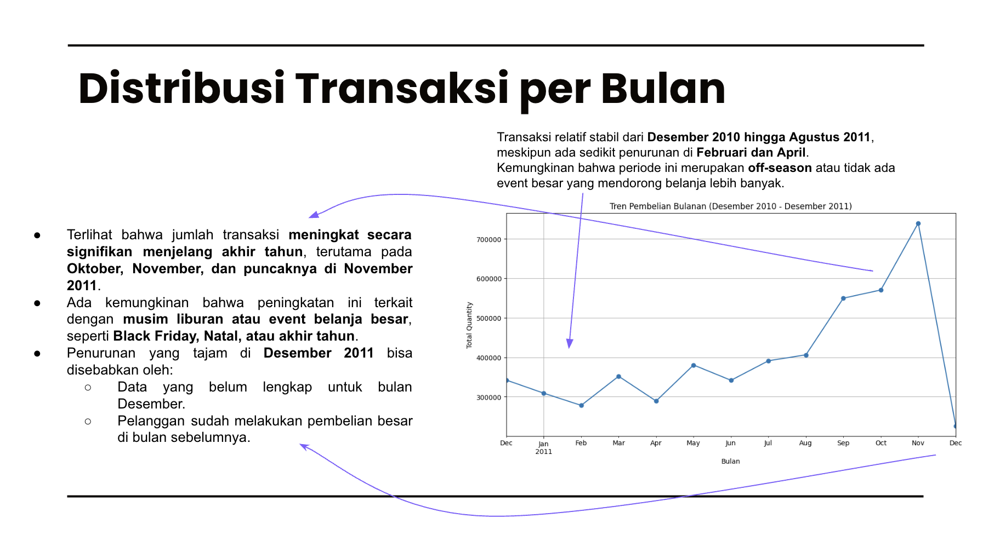

#### 1.7.2. Distribusi Transaksi per Hari

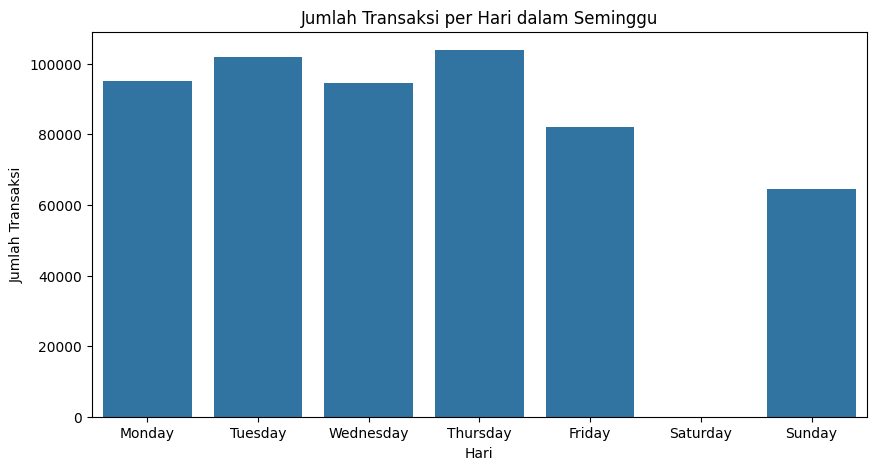

In [ ]:
df['DayOfWeek'] = df['InvoiceDate'].dt.day_name()
plt.figure(figsize=(10, 5))
sns.countplot(x='DayOfWeek', data=df, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Jumlah Transaksi per Hari dalam Seminggu')
plt.xlabel('Hari')
plt.ylabel('Jumlah Transaksi')
plt.show()

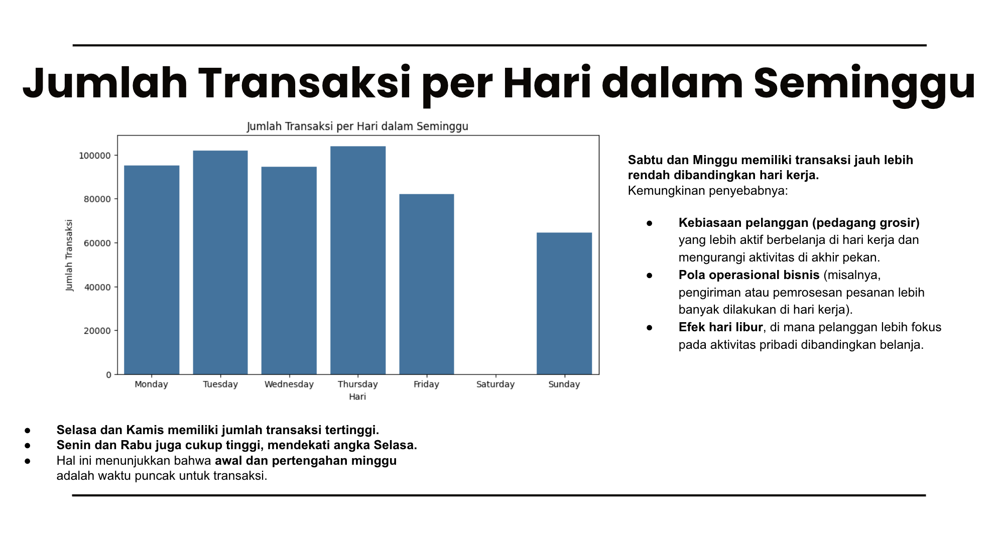

Tidak ditemukan adanya transaksi pada hari Sabtu, mungkin toko tutup setiap hari Sabtu.

#### 1.7.3. Distribusi Transaksi per Pelanggan

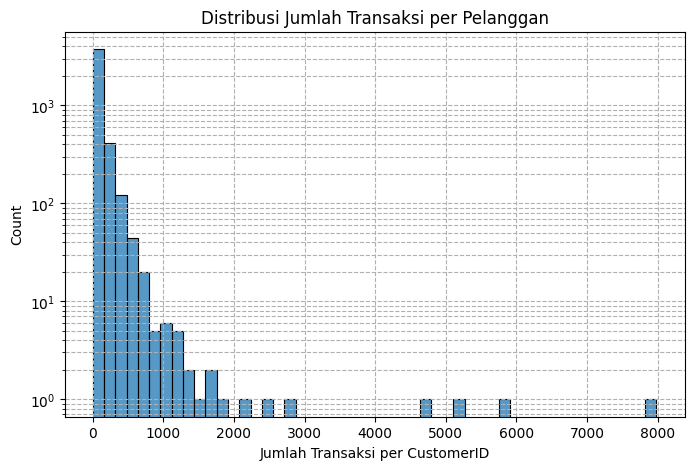

In [ ]:
plt.figure(figsize=(8, 5))
customer_counts = df['CustomerID'].value_counts().dropna()  # Hanya pelanggan dengan CustomerID
sns.histplot(customer_counts, bins=50)
plt.title('Distribusi Jumlah Transaksi per Pelanggan')
plt.xlabel('Jumlah Transaksi per CustomerID')
plt.ylabel('Count')

plt.yscale('log')  # Skala logaritmik untuk menangani distribusi skewed
plt.grid(True, which="both", ls="--")
plt.show()

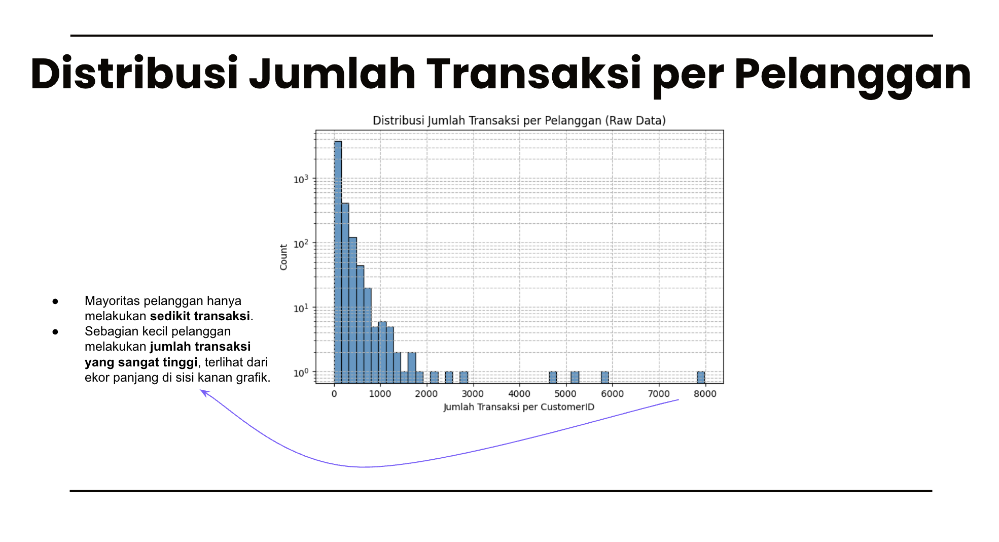

### 1.8. Transaksi dan Country

#### 1.8.1. Overview Transaksi per Country

In [ ]:
transaction_country = df.groupby('Country')['InvoiceNo'].count()

transaction_country_neg = df[df['Quantity'] < 0].groupby('Country')['InvoiceNo'].count()

summary = pd.DataFrame({
    'Total Semua Transaksi': transaction_country,
    'Total Transaksi Negatif': transaction_country_neg
}).fillna(0)

summary['Total Valid Transaksi'] = summary['Total Semua Transaksi'] - summary['Total Transaksi Negatif']

summary = summary.reset_index()

print(summary)


                 Country  Total Semua Transaksi  Total Transaksi Negatif  \
0              Australia                   1259                     74.0   
1                Austria                    401                      3.0   
2                Bahrain                     19                      1.0   
3                Belgium                   2069                     38.0   
4                 Brazil                     32                      0.0   
5                 Canada                    151                      0.0   
6        Channel Islands                    758                     10.0   
7                 Cyprus                    622                      8.0   
8         Czech Republic                     30                      5.0   
9                Denmark                    389                      9.0   
10                  EIRE                   8196                    302.0   
11    European Community                     61                      1.0   
12          

#### 1.8.2. Distribusi Transaksi per Country

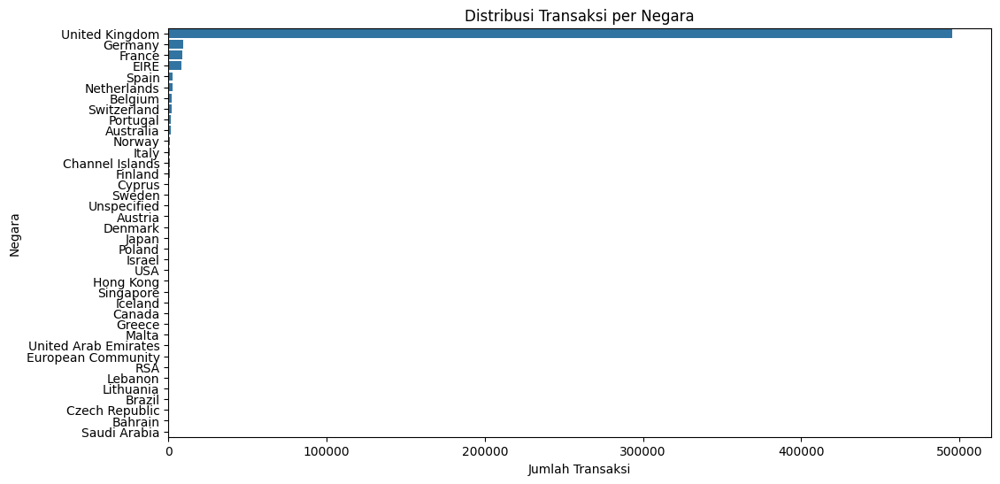

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Country', data=df, order=df['Country'].value_counts().index)
plt.title('Distribusi Transaksi per Negara')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Negara')
plt.show()

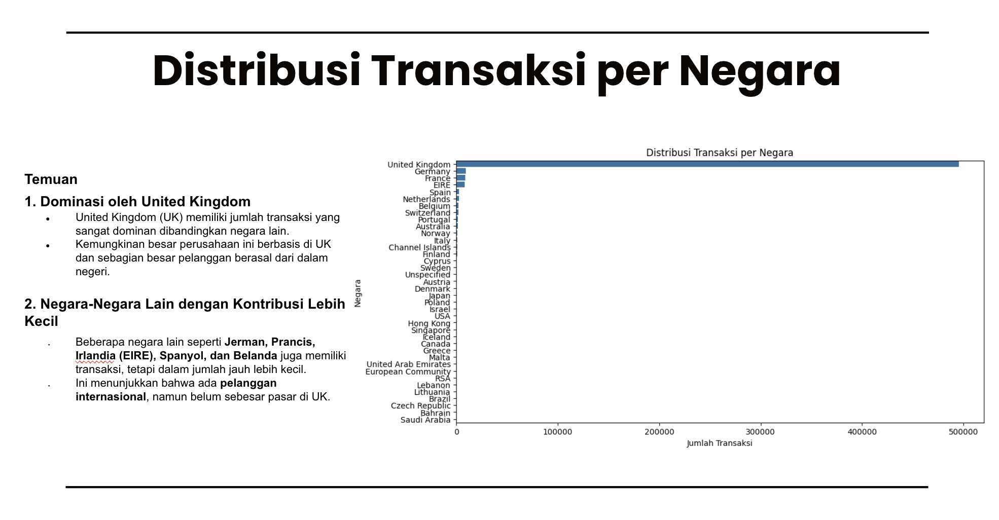

In [ ]:
negative_quantity = df[df['Quantity'] < 0]

print("Negara dengan transaksi Quantity negatif:")
print(negative_quantity['Country'].unique())

Negara dengan transaksi Quantity negatif:
['United Kingdom' 'Germany' 'EIRE' 'Italy' 'France' 'Australia' 'Sweden'
 'Portugal' 'Austria' 'Israel' 'Belgium' 'Bahrain' 'Spain' 'Japan'
 'Channel Islands' 'Netherlands' 'Switzerland' 'Cyprus' 'Norway'
 'Saudi Arabia' 'Hong Kong' 'Poland' 'Finland' 'Czech Republic'
 'Singapore' 'European Community' 'Malta' 'Greece' 'Denmark' 'USA']


In [ ]:
num_countries_neg_quant = negative_quantity['Country'].nunique()

print("Jumlah negara dengan transaksi Quantity negatif:", num_countries_neg_quant)


Jumlah negara dengan transaksi Quantity negatif: 30


In [ ]:
num_countries = df['Country'].nunique()
print("Total jumlah negara:", num_countries)


Total jumlah negara: 38


### 1.9. Produk dengan Quantity Pembelian Paling Banyak

In [ ]:
products_desc_quant_sorted = df.groupby('Description')['Quantity'].sum().sort_values(ascending=False)

In [ ]:
products_desc_quant_sorted

,Quantity
Description,
WORLD WAR 2 GLIDERS ASSTD DESIGNS,53847
JUMBO BAG RED RETROSPOT,47363
ASSORTED COLOUR BIRD ORNAMENT,36381
POPCORN HOLDER,36334
PACK OF 72 RETROSPOT CAKE CASES,36039
...,...
Damaged,-7540
Printing smudges/thrown away,-9058
check,-12030


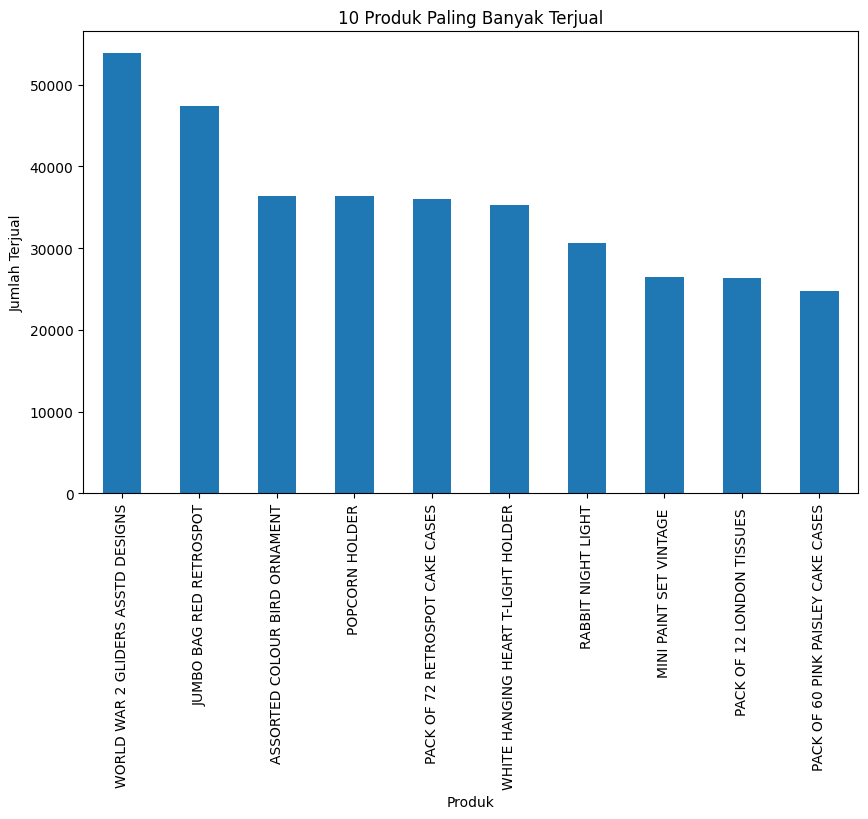

In [ ]:
top10_products = products_desc_quant_sorted.head(10)
plt.figure(figsize=(10, 6))
top10_products.plot(kind='bar')
plt.title('10 Produk Paling Banyak Terjual')
plt.xlabel('Produk')
plt.ylabel('Jumlah Terjual')
plt.show()

## 2. Data Preprocessing

### 2.1. Handle Missing Values

In [ ]:
df_clean = df.copy()

Drop missing values di kolom Description karena jumlahnya kecil dan tidak terlalu berpengaruh (masih bisa pake StockCode)

In [ ]:
df_clean = df_clean.dropna(subset=["Description"])
print("Missing values setelah drop Description:")
df_clean.isnull().sum()

Missing values setelah drop Description:


,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,133626
Country,0
Year,0
Month,0


Karena CustomerID terlalu banyak missing-nya dan jika di-drop akan kehilangan terlalu banyak data (atau jika diimpute distribusinya akan berubah), maka dibuat kolom CustomerType yang mengassign missing value di CustomerID sebagai "Guest" dan sisanya "Registered" dan isi CustomerID yang empty dengan unique number berdasarkan InvoiceNo

In [ ]:
df_clean['CustomerType'] = df_clean['CustomerID'].apply(lambda x: 'Guest' if pd.isna(x) else 'Registered')
df_clean['CustomerID'] = df_clean.apply(lambda row: f"Guest_{row['InvoiceNo']}" if pd.isna(row['CustomerID']) else row['CustomerID'], axis=1)
print("\nSetelah assign CustomerType:")
df_clean.isnull().sum()


Setelah assign CustomerType:


,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0
Year,0
Month,0


In [ ]:
df_clean.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,YearMonth,DayOfWeek,CustomerType
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,2010-12,Wednesday,Registered


### 2.2. Handle Duplicate Data

Cek apakah ada Invoice yang muncul lebih dari sekali untuk customer yang sama

In [ ]:
df_clean[df_clean.duplicated(subset=['CustomerID', 'InvoiceNo'], keep=False)].sort_values(['CustomerID', 'InvoiceNo']).head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,YearMonth,DayOfWeek,CustomerType
14938,537626,85116,BLACK CANDELABRA T-LIGHT HOLDER,12,2010-12-07 14:57:00,2.10,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14939,537626,22375,AIRLINE BAG VINTAGE JET SET BROWN,4,2010-12-07 14:57:00,4.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14940,537626,71477,COLOUR GLASS. STAR T-LIGHT HOLDER,12,2010-12-07 14:57:00,3.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14941,537626,22492,MINI PAINT SET VINTAGE,36,2010-12-07 14:57:00,0.65,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14942,537626,22771,CLEAR DRAWER KNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14943,537626,22772,PINK DRAWER KNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14944,537626,22773,GREEN DRAWER KNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14945,537626,22774,RED DRAWER KNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14946,537626,22775,PURPLE DRAWERKNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered
14947,537626,22805,BLUE DRAWER KNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010,12,2010-12,Tuesday,Registered




> Invoice yang sama muncul lebih dari sekali untuk customer yang sama sehingga tidak perlu dihapus karena 1 invoice bisa punya banyak produk



Cek apakah ada duplicate data yang benar-benar identik di semua kolom

In [ ]:
df_clean[df_clean.duplicated(subset=['CustomerID', 'InvoiceNo', 'StockCode', 'Quantity', 'UnitPrice'], keep=False)].head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,YearMonth,DayOfWeek,CustomerType
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
548,536412,22327,ROUND SNACK BOXES SET OF 4 SKULLS,1,2010-12-01 11:49:00,2.95,17920.0,United Kingdom,2010,12,2010-12,Wednesday,Registered
555,536412,22327,ROUND SNACK BOXES SET OF 4 SKULLS,1,2010-12-01 11:49:00,2.95,17920.0,United Kingdom,2010,12,2010-12,Wednesday,Registered




> Data duplicate yang benar-benar identik di subset ['CustomerID', 'InvoiceNo', 'StockCode', 'Quantity', 'UnitPrice'] harus dihapus



Cek apakah ada transaksi dengan StockCode yang sama dalam invoice yang sama

In [ ]:
df_clean[df_clean.duplicated(subset=['InvoiceNo', 'CustomerID', 'StockCode', 'UnitPrice'], keep=False)].sort_values(['CustomerID', 'InvoiceNo', 'StockCode']).head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,YearMonth,DayOfWeek,CustomerType
395372,571034,22423,REGENCY CAKESTAND 3 TIER,4,2011-10-13 12:47:00,12.75,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395435,571034,22423,REGENCY CAKESTAND 3 TIER,6,2011-10-13 12:47:00,12.75,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395456,571034,22423,REGENCY CAKESTAND 3 TIER,3,2011-10-13 12:47:00,12.75,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395388,571034,23239,SET OF 4 KNICK KNACK TINS POPPIES,6,2011-10-13 12:47:00,4.15,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395410,571034,23239,SET OF 4 KNICK KNACK TINS POPPIES,6,2011-10-13 12:47:00,4.15,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395371,571034,23245,SET OF 3 REGENCY CAKE TINS,4,2011-10-13 12:47:00,4.95,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395455,571034,23245,SET OF 3 REGENCY CAKE TINS,4,2011-10-13 12:47:00,4.95,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395442,571034,23494,VINTAGE DOILY DELUXE SEWING KIT,3,2011-10-13 12:47:00,5.95,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
395443,571034,23494,VINTAGE DOILY DELUXE SEWING KIT,3,2011-10-13 12:47:00,5.95,12359.0,Cyprus,2011,10,2011-10,Thursday,Registered
29743,538826,22749,FELTCRAFT PRINCESS CHARLOTTE DOLL,1,2010-12-14 12:58:00,3.75,12370.0,Cyprus,2010,12,2010-12,Tuesday,Registered




> Produk yang sama dalam satu invoice masih terpecah ke beberapa baris dengan Quantity berbeda



In [ ]:
df_clean = df_clean.groupby(['InvoiceNo', 'StockCode', 'UnitPrice'], as_index=False).agg({
    'Quantity': 'sum',
    'InvoiceDate': 'first',
    'CustomerID': 'first',
    'Country': 'first',
    'Description': 'first'
})

dup_count_after = df_clean.duplicated(subset=['InvoiceNo','StockCode','UnitPrice']).sum()
print("Jumlah duplikat setelah digabungkan:", dup_count_after)

Jumlah duplikat setelah digabungkan: 0


In [ ]:
df_clean.head()

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE


### 2.3. Convert Data Types

In [ ]:
df_clean['CustomerID'] = df_clean['CustomerID'].astype(str)
df_clean['InvoiceDate'] = pd.to_datetime(df_clean['InvoiceDate'], errors='coerce')
df_clean['UnitPrice'] = df_clean['UnitPrice'].astype(str).str.replace(',', '.').astype(float)

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 530347 entries, 0 to 530346
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    530347 non-null  object        
 1   StockCode    530347 non-null  object        
 2   UnitPrice    530347 non-null  float64       
 3   Quantity     530347 non-null  int64         
 4   InvoiceDate  530347 non-null  datetime64[ns]
 5   CustomerID   530347 non-null  object        
 6   Country      530347 non-null  object        
 7   Description  530347 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 32.4+ MB


### 2.4. Handle Inconsistent Data

In [ ]:
print(df_clean["Country"].unique())

['United Kingdom' 'France' 'Australia' 'Netherlands' 'Germany' 'Norway'
 'EIRE' 'Switzerland' 'Spain' 'Poland' 'Portugal' 'Italy' 'Belgium'
 'Lithuania' 'Japan' 'Iceland' 'Channel Islands' 'Denmark' 'Cyprus'
 'Sweden' 'Finland' 'Austria' 'Bahrain' 'Israel' 'Greece' 'Hong Kong'
 'Singapore' 'Lebanon' 'United Arab Emirates' 'Saudi Arabia'
 'Czech Republic' 'Canada' 'Unspecified' 'Brazil' 'USA'
 'European Community' 'Malta' 'RSA']


In [ ]:
# Hapus "Unspecified"
df_clean = df_clean[df_clean["Country"] != "Unspecified"]

print(df_clean["Country"].unique())

['United Kingdom' 'France' 'Australia' 'Netherlands' 'Germany' 'Norway'
 'EIRE' 'Switzerland' 'Spain' 'Poland' 'Portugal' 'Italy' 'Belgium'
 'Lithuania' 'Japan' 'Iceland' 'Channel Islands' 'Denmark' 'Cyprus'
 'Sweden' 'Finland' 'Austria' 'Bahrain' 'Israel' 'Greece' 'Hong Kong'
 'Singapore' 'Lebanon' 'United Arab Emirates' 'Saudi Arabia'
 'Czech Republic' 'Canada' 'Brazil' 'USA' 'European Community' 'Malta'
 'RSA']


In [ ]:
# Hapus transaksi refund dan adjust bad debt karena fokus ke analisis transaksi penjualan
df_clean = df_clean[~df_clean["InvoiceNo"].str.startswith(("C", "A"))]

# Hapus quantity yang negatif
df_clean = df_clean[df_clean["Quantity"] > 0]

# Hapus unitprice yang < 0
df_clean = df_clean[df_clean["UnitPrice"] > 0]

In [ ]:
df_clean.head()

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE


In [ ]:
# Trim whitespace dan lowercase untuk Description
df_clean['Description'] = df_clean['Description'].str.strip().str.upper()
# Trim whitespace untuk Country
df_clean['Country'] = df_clean['Country'].str.strip()

In [ ]:
print("Setelah trim whitespace dan normalisasi capitalization:")
print(df_clean[['Description', 'Country']].head())

Setelah trim whitespace dan normalisasi capitalization:
                           Description         Country
0    GLASS STAR FROSTED T-LIGHT HOLDER  United Kingdom
1         SET 7 BABUSHKA NESTING BOXES  United Kingdom
2                  WHITE METAL LANTERN  United Kingdom
3       RED WOOLLY HOTTIE WHITE HEART.  United Kingdom
4  KNITTED UNION FLAG HOT WATER BOTTLE  United Kingdom


### 2.5. Feature Engineering

In [ ]:
df_clean.head()

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE


#### 2.5.1. Ekstraksi Kategori Produk dari `Description`

- Fungsi `category_extraction(description)` dirancang untuk mengekstrak **informasi kategori** atau tema dari deskripsi produk.
- Teknik yang digunakan:
  - **Lowercasing & trimming**: Deskripsi dibuat lowercase dan dihapus spasi berlebih.
  - **Hapus angka di awal** (misalnya tahun atau jumlah).
  - **Deteksi pola** seperti:
    - Produk bertema (`christmas`, `vintage`, `retro`, dll)
    - Produk dengan lokasi (`london`, `paris`, dll)
    - Produk dengan awalan “set” atau “pack”
    - Produk dengan kata umum seperti `ribbon`, `card`, dll
  - **Fallback default**: mengambil dua kata substantif pertama.

In [ ]:
def category_extraction(description):
    if not isinstance(description, str):
        return "unknown"

    # Ubah teks ke huruf kecil dan hapus spasi berlebih
    desc = description.lower().strip()

    # Normalisasi teks, hapus simbol, angka ukuran, dan spasi ganda
    desc = re.sub(r"[^\w\s]", " ", desc)       # hapus simbol seperti "/ , . ( )"
    desc = re.sub(r"s/\d+", "", desc)          # hapus format seperti "S/3"
    desc = re.sub(r"\b\d+('s)?\b", "", desc)   # hapus angka standalone (misal "15", "3")
    desc = re.sub(r"\s+", " ", desc)           # ubah spasi ganda jadi satu spasi

    # Deteksi pola produk yang strong (prioritas tinggi), langsung return
    strong_patterns = {
        r"\bchopsticks\b": "chopsticks",
        r"\bmilk pan\b": "milk pan",
        r"\bpencils?\b": "pencils",
        r"\bpen\b": "pen",
        r"\bwrap\b": "gift wrap",
        r"\btv dinner tray\b": "tray",
        r"\b(breakfast set|lunch set|dinner set)\b": "dining set",
        r"\bdrawer knob\b": "drawer knob",
        r"\bnecklace\b": "necklace",
        r"\bearrings?\b": "earrings",
        r"\bbracelet\b": "bracelet",
        r"\bt[ -]lights?\b": "t-lights",
        r"\bsoft toy\b": "soft toy",
        r"\bcake tins\b": "cake tins",
        r"\bherb tins\b": "herb tins",
        r"\bspice tins\b": "spice tins",
        r"\bbaking mould\b": "baking mould",
        r"\bribbons\b": "ribbons",
        r"\bphoto frame\b": "photo frame",
        r"\bdanish rose\b": "danish rose collection",
        r"\bsewing box\b": "sewing box"
    }

    for pattern, category in strong_patterns.items():
        if re.search(pattern, desc):
            return category

    # Deteksi koleksi khusus (misal series/collection yang punya nama)
    collections = {
        "danish rose": "danish rose collection"
    }

    for collection, category in collections.items():
        if collection in desc:
            return category

    # Tangani deskripsi yang mengandung kata "set" (misal set of 3 ...)
    if "set of" in desc or "set " in desc:
        # T-light
        if "t light" in desc or "t-light" in desc:
            return "t-lights"
        # Cake/herb/spice tins
        if "cake tin" in desc:
            return "cake tins"
        if "herb tin" in desc:
            return "herb tins"
        if "spice tin" in desc:
            return "spice tins"
        # Flying ducks
        if "flying duck" in desc:
            return "flying ducks"
        # Gift wrap
        if "gift wrap" in desc:
            return "gift wrap"
        # Cutlery
        if "cutlery" in desc:
            return "cutlery"

    # Deteksi item "metal sign" yang pasti -> return langsung
    if re.search(r"\bmetal sign\b", desc):
        return "sign"

    # Frasa produk prioritas
    keywords = [
        "money bank", "t light holder", "tea towel", "mug cosy", "bird ornament",
        "playhouse bedroom", "playhouse kitchen", "hot water bottle", "napkin charms",
        "building block word", "inflatable globe", "shopping bag", "hand warmer",
        "cake stand", "heart t light", "bathroom set", "lunch box", "sewing kit",
        "writing set", "glass cloche", "jigsaw puzzle", "mini jigsaw", "cabinet",
        "parasol", "mug", "bag", "balloons", "candle", "candlestick", "card holder",
        "heart wicker", "picnic basket", "flying ducks", "decorative plate", "photo frame",
        "trinket trays", "folding chair", "soft toy"
    ]
    for phrase in keywords:
        if phrase in desc:
            return phrase

    # Tangani pola seperti "set of 3 heart tins" -> ambil "heart tins"
    match = re.match(r"(box|pack|set) of \d+ ([a-z\s]+)", desc)
    if match:
        product = match.group(2).strip()
        # Beberapa pengecualian
        if product in ["heart", "cake", "strawberry"]:
            if "chopstick" in desc:
                return "chopsticks"
        if "ribbon" in product:
            return "ribbons"
        if "t light" in product or "t-light" in product:
            return "t-lights"
        return product

    # Kata benda umum yang diprioritaskan daripada tema
    product_words = [
        "pencil", "pen", "chopstick", "drawer", "knob", "pan", "milk", "breakfast",
        "mug", "plate", "bowl", "spoon", "fork", "knife", "towel", "napkin",
        "earring", "frame", "tin", "toy", "baking", "ribbon"
    ]

    for word in product_words:
        if word in desc:
            # Kasus khusus untuk kombinasi dua kata
            if word == "drawer" and "knob" in desc:
                return "drawer knob"
            if word == "milk" and "pan" in desc:
                return "milk pan"
            if word == "breakfast" and "set" in desc:
                return "breakfast set"
            if word == "earring":
                return "earrings"
            if word == "frame" and "photo" in desc:
                return "photo frame"
            if word == "tin" and "cake" in desc:
                return "cake tins"
            if word == "tin" and "herb" in desc:
                return "herb tins"
            if word == "tin" and "spice" in desc:
                return "spice tins"
            if word == "toy" and "soft" in desc:
                return "soft toy"
            if word == "baking" and "mould" in desc:
                return "baking mould"
            if word == "ribbon":
                return "ribbons"
            if word == "pen":
                return "pen"
            return word

    # Handle produk bertema (e.g. "christmas candle")
    theme_match = re.search(r'\b(christmas|vintage|retro|classic|modern|valentine|easter)\b', desc)
    if theme_match:
        theme = theme_match.group(1)
        tokens = desc.split()
        for t in tokens:
            if t not in {'the', 'of', 'for', 'and', 'in', 'on', 'with', theme} and len(t) > 2:
                # Kalau produk adalah ribbons dengan tema -> tetap pakai "ribbons"
                if t == "ribbons" and theme == "christmas":
                    return "ribbons"
                return f"{t} {theme}"
        return f"{theme} item"  # fallback kalau nggak nemu produk utama

    # Tangani berdasarkan lokasi, jika menyebut kota -> "souvenir [kota]"
    location_match = re.search(r"(london|paris|england|york|japan)", desc)
    if location_match:
        return f"souvenir {location_match.group(1)}"

    # Deteksi kata akhir yang umum digunakan sebagai produk
    endings = ['mug', 'parasol', 'box', 'globe', 'sign', 'towel', 'bracelet', 'necklace', 'plate']
    for word in endings:
        if desc.endswith(word):
            return word

    # Kombinasi dua kata yang sering muncul (e.g. "ceramic drawer", "flying ducks")
    word_pairs = [
        "childs breakfast", "picnic basket", "heart wicker", "ceramic drawer",
        "danish rose", "flying ducks", "soft toy"
    ]
    for pair in word_pairs:
        if pair in desc:
            if pair == "ceramic drawer" and "knob" in desc:
                return "drawer knob"
            if pair == "danish rose":
                return "danish rose collection"
            return pair

    # Ambil 1–2 kata utama (tidak termasuk warna, size, atau kata tidak penting)
    non_substantive = {'the', 'of', 'and', 'in', 'on', 'for', 'with', 'a', 'to', 'set', 'pack', 'mrs', 'mr'}
    color_words = {'red', 'blue', 'green', 'white', 'black', 'pink', 'purple', 'yellow', 'turq', 'turquoise', 'silver'}
    size_words = {'small', 'large', 'mini', 'tall', 'short', 'big', 'medium'}

    words = desc.split()
    content_words = []

    for word in words:
        if (word not in non_substantive
            and word not in color_words
            and word not in size_words
            and len(word) > 2):
            content_words.append(word)

    # Return kombinasi 1–2 kata substantif sebagai fallback
    if len(content_words) >= 2:
        return ' '.join(content_words[:2])
    elif content_words:
        return content_words[0]
    else:
        # Fallback terakhir, ambil kata pertama yang bukan warna/ukuran
        for word in words:
            if word not in color_words and word not in size_words and len(word) > 2:
                return word
        return words[0] if words else "misc"

df_clean["CategoryExtraction"] = df_clean["Description"].apply(category_extraction)

In [ ]:
df_clean.head()

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description,CategoryExtraction
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER,t-lights
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES,tin
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN,metal lantern
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,woolly hottie
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,hot water bottle


#### 2.5.2. Perhitungan Total Harga
- Menghasilkan kolom **`TotalPrice`**: total belanja untuk tiap baris/invoice line.


In [ ]:
# Total spending per invoice
df_clean["TotalPrice"] = df_clean["Quantity"] * df_clean["UnitPrice"]
df_clean

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description,CategoryExtraction,TotalPrice
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER,t-lights,25.50
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES,tin,15.30
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN,metal lantern,20.34
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,woolly hottie,20.34
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,hot water bottle,20.34
...,...,...,...,...,...,...,...,...,...,...
521121,581587,22730,3.75,4,2011-12-09 12:50:00,12680.0,France,ALARM CLOCK BAKELIKE IVORY,alarm clock,15.00
521122,581587,22899,2.10,6,2011-12-09 12:50:00,12680.0,France,CHILDREN'S APRON DOLLY GIRL,children apron,12.60
521123,581587,23254,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY DOLLY GIRL,childrens cutlery,16.60
521124,581587,23255,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY CIRCUS PARADE,childrens cutlery,16.60


#### 2.5.3. Ekstraksi Waktu dari `InvoiceDate`
- Menambahkan dua fitur waktu:
  - **`DayOfWeek`**: nama hari transaksi (Senin, Selasa, dst)
  - **`Hour`**: jam transaksi

In [ ]:
# Ekstrak fitur waktu dari InvoiceDate
df_clean['DayOfWeek'] = df_clean['InvoiceDate'].dt.day_name()
df_clean['Hour'] = df_clean['InvoiceDate'].dt.hour
df_clean

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description,CategoryExtraction,TotalPrice,DayOfWeek,Hour
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER,t-lights,25.50,Wednesday,8
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES,tin,15.30,Wednesday,8
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN,metal lantern,20.34,Wednesday,8
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,woolly hottie,20.34,Wednesday,8
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,hot water bottle,20.34,Wednesday,8
...,...,...,...,...,...,...,...,...,...,...,...,...
521121,581587,22730,3.75,4,2011-12-09 12:50:00,12680.0,France,ALARM CLOCK BAKELIKE IVORY,alarm clock,15.00,Friday,12
521122,581587,22899,2.10,6,2011-12-09 12:50:00,12680.0,France,CHILDREN'S APRON DOLLY GIRL,children apron,12.60,Friday,12
521123,581587,23254,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY DOLLY GIRL,childrens cutlery,16.60,Friday,12
521124,581587,23255,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY CIRCUS PARADE,childrens cutlery,16.60,Friday,12


#### 2.5.3. Frekuensi Transaksi per Customer
- Menghitung **berapa kali** masing-masing customer melakukan transaksi berbeda.
- Disimpan dalam kolom **`Frequency`**.

In [ ]:
# Frequency of purchase per customer
df_clean["Frequency"] = df_clean.groupby("CustomerID")["InvoiceNo"].transform("nunique")
df_clean

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description,CategoryExtraction,TotalPrice,DayOfWeek,Hour,Frequency
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER,t-lights,25.50,Wednesday,8,34
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES,tin,15.30,Wednesday,8,34
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN,metal lantern,20.34,Wednesday,8,34
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,woolly hottie,20.34,Wednesday,8,34
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,hot water bottle,20.34,Wednesday,8,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...
521121,581587,22730,3.75,4,2011-12-09 12:50:00,12680.0,France,ALARM CLOCK BAKELIKE IVORY,alarm clock,15.00,Friday,12,4
521122,581587,22899,2.10,6,2011-12-09 12:50:00,12680.0,France,CHILDREN'S APRON DOLLY GIRL,children apron,12.60,Friday,12,4
521123,581587,23254,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY DOLLY GIRL,childrens cutlery,16.60,Friday,12,4
521124,581587,23255,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY CIRCUS PARADE,childrens cutlery,16.60,Friday,12,4


#### 2.5.4. Recency (Hari sejak transaksi terakhir)
- Mengukur **berapa hari yang telah berlalu sejak transaksi terakhir** (terhadap tanggal terbaru yang tersedia).
- Disimpan dalam kolom **`Recency`**.


In [ ]:
# Days since last purchase
latest_date = df_clean["InvoiceDate"].max()
df_clean["Recency"] = (latest_date - df_clean["InvoiceDate"]).dt.days
df_clean

,InvoiceNo,StockCode,UnitPrice,Quantity,InvoiceDate,CustomerID,Country,Description,CategoryExtraction,TotalPrice,DayOfWeek,Hour,Frequency,Recency
0,536365,21730,4.25,6,2010-12-01 08:26:00,17850.0,United Kingdom,GLASS STAR FROSTED T-LIGHT HOLDER,t-lights,25.50,Wednesday,8,34,373
1,536365,22752,7.65,2,2010-12-01 08:26:00,17850.0,United Kingdom,SET 7 BABUSHKA NESTING BOXES,tin,15.30,Wednesday,8,34,373
2,536365,71053,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,WHITE METAL LANTERN,metal lantern,20.34,Wednesday,8,34,373
3,536365,84029E,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,woolly hottie,20.34,Wednesday,8,34,373
4,536365,84029G,3.39,6,2010-12-01 08:26:00,17850.0,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,hot water bottle,20.34,Wednesday,8,34,373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521121,581587,22730,3.75,4,2011-12-09 12:50:00,12680.0,France,ALARM CLOCK BAKELIKE IVORY,alarm clock,15.00,Friday,12,4,0
521122,581587,22899,2.10,6,2011-12-09 12:50:00,12680.0,France,CHILDREN'S APRON DOLLY GIRL,children apron,12.60,Friday,12,4,0
521123,581587,23254,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY DOLLY GIRL,childrens cutlery,16.60,Friday,12,4,0
521124,581587,23255,4.15,4,2011-12-09 12:50:00,12680.0,France,CHILDRENS CUTLERY CIRCUS PARADE,childrens cutlery,16.60,Friday,12,4,0


## Tambahan EDA

### 1.10 Seasonality Transaksi Harian

Run setelah preprocessing.

In [ ]:
# Mengubah kolom InvoiceDate menjadi index
df_time = df_clean.set_index('InvoiceDate')

# Mengagregasi total penjualan per hari
daily_sales = df_time['UnitPrice'].resample('D').sum()

ACF di lag 7: 0.5182
ACF di lag 14: 0.4584
ACF di lag 21: 0.3359
ACF di lag 28: 0.3598


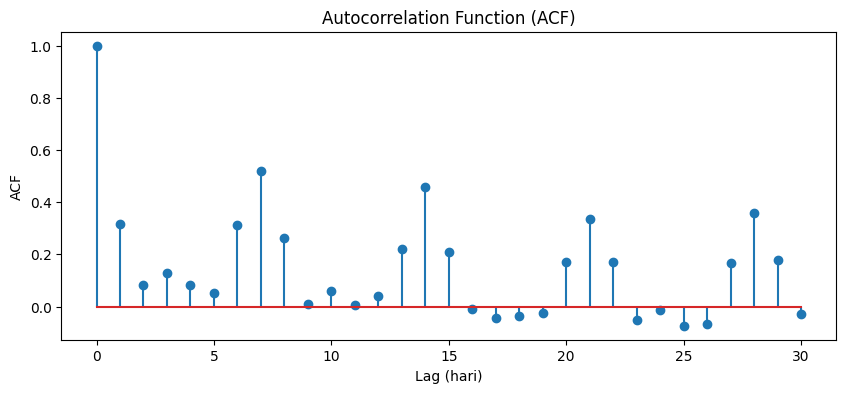

In [ ]:
from statsmodels.tsa.stattools import acf
import numpy as np
import matplotlib.pyplot as plt

# Hitung ACF hingga lag 30
acf_values = acf(daily_sales, nlags=30)

# Tampilkan nilai ACF untuk lag 7, 14, 21, dan 28
lags_to_check = [7, 14, 21, 28]
for lag in lags_to_check:
    print(f"ACF di lag {lag}: {acf_values[lag]:.4f}")

# Plot ACF
plt.figure(figsize=(10,4))
plt.stem(range(len(acf_values)), acf_values)
plt.xlabel('Lag (hari)')
plt.ylabel('ACF')
plt.title('Autocorrelation Function (ACF)')
plt.show()


## 3. Modeling

### 3.1. Segmentasi Pelanggan (Clustering)

**Tujuan Segmentasi Pelanggan**

Clustering ini dilakukan sebagai langkah pendukung untuk mencapai tujuan utama proyek, yaitu anomaly detection dan association rule mining.

1. Segmentasi Pelanggan untuk Memahami Pola Belanja: Mengelompokkan pelanggan ke dalam segmen berdasarkan fitur RFM untuk memahami variasi perilaku belanja.
Mendukung association rule mining per segmen (misalnya, pola belanja "Elite Loyal Customers").

2. Mendukung Anomaly Detection: Memberikan baseline perilaku normal per segmen untuk mendeteksi anomali.
Membantu memahami apakah anomali terkait dengan segmen spesifik, perubahan tren, atau musiman.

3. Memberikan Insight untuk Strategi Bisnis: Menghasilkan segmen pelanggan yang dapat digunakan untuk strategi pemasaran yang ditargetkan (misalnya, kampanye reaktivasi untuk "Inactive Customers").
Mendukung tujuan bisnis seperti menghindari kehilangan pelanggan dan mencapai keunggulan kompetitif.

4. Mendukung Analisis Lebih Lanjut: Hasil clustering digunakan untuk association rule mining (pola belanja per segmen) dan anomaly detection (membandingkan perilaku dengan pola normal).

Konteks yang lebih kaya untuk analisis anomali dan asosiasi dapat didapatkan melalui clustering yang kemudian menghasilkan insight yang actionable untuk strategi bisnis, sesuai dengan tujuan proyek.

Dalam analisis ritel, RFM (Recency, Frequency, Monetary) adalah metrik yang paling relevan untuk mengelompokkan pelanggan berdasarkan perilaku pembelian:

- `Recency`: Menunjukkan jumlah hari sejak transaksi terakhir pelanggan (indikator aktivitas).
- `Frequency`: Menunjukkan jumlah transaksi atau seberapa sering pelanggan bertransaksi (indikator loyalitas).
- `Monetary`: Menunjukkan total nilai belanja dari transaksi pelanggan per `CustomerID` (indikator nilai pelanggan).

Kolom `IsGuest` ditambahkan untuk melacak tipe akun.

---

**Alasan Menggabungkan Guest dan Registered**


1. **Wawasan yang Komprehensif**  
   Pelanggan Guest tetap melakukan transaksi dan bahkan bisa menyumbang nilai pembelian yang signifikan. Mengabaikan mereka berarti kehilangan insight penting dari perilaku pasar. Menggabungkan pelanggan terdaftar dan guest memungkinkan analisis perilaku pelanggan secara menyeluruh, dari guest hingga pelanggan terdaftar sehingga pola yang beragam dapat diidentifikasi.

2. **Identifikasi Potensi Loyalitas**  
   Dengan melihat RFM pelanggan Guest, kita dapat mendeteksi apakah sebagian dari mereka berpotensi menjadi pelanggan loyal dan ditargetkan untuk konversi ke akun terdaftar.

3. **Clustering Lebih Komprehensif**  
   Segmentasi seluruh pelanggan (tanpa diskriminasi tipe akun) memberikan gambaran lebih utuh, mencerminkan realitas pasar yang sesungguhnya.

4. **Analisis Distribusi Guest per Cluster**  
   Analisis tambahan dilakukan untuk melihat sebaran Guest di setiap cluster, memberikan pandangan strategis untuk pendekatan pemasaran yang lebih spesifik.


Menggabungkan pelanggan Guest dalam proses segmentasi:

- Memberikan **gambaran perilaku yang lebih utuh dan nyata**,
- Memungkinkan identifikasi **potensi pelanggan loyal dari kalangan Guest**,
- Menyediakan dasar strategi marketing untuk **konversi Guest menjadi Registered**,
- Menghindari bias analisis yang terjadi jika hanya fokus pada pelanggan terdaftar.


---

**Alasan Pemilihan Metode Clustering (K-Means)**

**1. Kesesuaian dengan Data RFM:**

  - RFM adalah metrik numerik (Recency, Frequency, Monetary), dan K-Means bekerja optimal pada data numerik dengan bentuk cluster spherical.
  - Metode lain seperti DBSCAN atau hierarchical clustering kurang cocok karena:
    - DBSCAN sulit di-tune untuk data dengan kepadatan variabel (misalnya, pelanggan VIP yang jarang).
    - Hierarchical clustering tidak efisien untuk dataset besar.

**2. Interpretabilitas untuk Bisnis:**

  - Hasil K-Means mudah diinterpretasikan sebagai segmen pelanggan (misalnya, "VIP/Wholesale Customers"), yang langsung dapat digunakan untuk strategi pemasaran.

  - Hyperparameter tuning (jumlah cluster) menggunakan Silhouette Score memastikan pemilihan cluster yang optimal.

**3. Efisiensi Komputasi:**

  - K-Means lebih cepat dibanding metode seperti K-Medoids, di mana efisiensi menjadi semakin penting untuk dataset besar seperti transaksi ritel.

**Alasan Penggunaan K-Means**:

- K-Means cocok untuk data numerik seperti RFM dan memberikan jumlah cluster yang jelas.
  - K-Means adalah algoritma clustering yang sangat efektif untuk data numerik. Metrik RFM (Recency, Frequency, Monetary) adalah data numerik yang merepresentasikan perilaku pembelian pelanggan. K-Means dapat dengan mudah mengelompokkan pelanggan berdasarkan metrik ini.
  - K-Means juga memberikan jumlah cluster yang jelas, yang memudahkan dalam interpretasi hasil clustering.

- Efisien untuk dataset besar seperti dataset "Online Retail"
  - K-Means memiliki kompleksitas komputasi yang rendah, sehingga sangat cocok untuk dataset besar. Dataset "Online Retail" yang digunakan dalam proyek ini memiliki jumlah transaksi yang besar, dan K-Means dapat menangani dataset ini dengan efisien.

- Mudah diinterpretasikan untuk strategi bisnis (misalnya, "VIP/Wholesale Customers").
  - Hasil clustering dari K-Means mudah diinterpretasikan dan dapat langsung digunakan untuk strategi bisnis. Misalnya, cluster "Elite Loyal Customers" dapat digunakan untuk *campaign* pemasaran khusus atau penawaran premium.

- Mendukung hyperparameter tuning (jumlah cluster) menggunakan Silhouette Score.
  - K-Means memungkinkan tuning jumlah cluster menggunakan metode seperti Silhouette Score. Ini memastikan bahwa jumlah cluster yang dipilih adalah optimal dan menghasilkan cluster yang kohesif dan terpisah dengan baik.


- Cluster yang dihasilkan menjadi baseline "perilaku normal" untuk mendeteksi anomali.
  - Cluster yang dihasilkan dari K-Means dapat digunakan sebagai baseline untuk perilaku normal pelanggan. Jika ada pelanggan yang tiba-tiba berhenti bertransaksi atau menunjukkan perilaku yang tidak biasa, ini dapat diidentifikasi sebagai anomali.

- Hasil clustering dapat digunakan untuk association rule mining per segmen.
  - Hasil clustering dapat digunakan untuk melakukan association rule mining per segmen. Misalnya, pola belanja khusus dari segmen "VIP/Wholesale Customers" dapat dianalisis untuk mengidentifikasi produk-produk yang sering dibeli bersama.

**Kelebihan K-Means dibanding metode lain**:

- K-Medoids:
  - K-Medoids lebih robust terhadap outlier, tetapi lebih lambat secara komputasi. Dalam proyek ini, outlier telah ditangani sebelumnya dan fitur sudah diskalakan sehingga K-Means sudah cukup robust.

- K-Modes:
  - K-Modes dirancang untuk data kategorikal, sedangkan data RFM adalah numerik. K-Means lebih cocok untuk data numerik dan dapat menghasilkan cluster yang lebih akurat.

- DBSCAN:
  - DBSCAN tidak memerlukan jumlah cluster yang ditentukan sebelumnya, tetapi sulit menentukan parameter optimal, seperti epsilon dan minPts. K-Means lebih mudah dalam hal pemilihan parameter.




> Referensi:

- "Data clustering: 50 years beyond K-means"

  (https://remote-lib.ui.ac.id:2054/science/article/pii/S0167865509002323).

  Artikel ini membahas tentang analisis klaster sebagai metode eksploratif untuk mengelompokkan data berdasarkan kemiripan tanpa menggunakan label kategori. Salah satu algoritma yang disorot adalah K-Means, yang meskipun sudah lama dikembangkan, tetap menjadi algoritma klasterisasi yang paling populer dan banyak digunakan. Hal ini menunjukkan bahwa K-Means memiliki keunggulan dalam hal kesederhanaan, efisiensi, dan kemampuannya dalam mengelompokkan data numerik secara efektif. Artikel juga menyinggung tantangan umum dalam klasterisasi dan perkembangan riset terbaru seperti semi-supervised dan ensemble clustering.

- "Customer segmentation and strategy development based on customer lifetime value: A case study"

  (https://remote-lib.ui.ac.id:2054/science/article/pii/S0957417405001934).
  Artikel ini membahas bagaimana clustering pelanggan dapat mendukung strategi bisnis dengan mengidentifikasi segmen pelanggan yang berbeda.

---

**Visualisasi Hasil Clustering Menggunakan 2D PCA dan 3D dengan Jitter**

Meskipun hanya menggunakan 3 fitur (Recency, Frequency, Monetary), pendekatan visualisasi tetap penting untuk memahami hasil clustering. Dalam proses ini, digunakan dua pendekatan visualisasi utama: PCA 2D dan scatter plot 3D dengan jitter.

**1. Clustering Berdasarkan Data RFM**

- Algoritma K-Means diterapkan langsung pada data RFM yang telah dinormalisasi (`rfm_scaled`), yang memiliki 3 fitur asli: Recency, Frequency, dan Monetary.
- Clustering dilakukan **tanpa reduksi dimensi** — artinya, K-Means bekerja pada ruang 3 dimensi penuh.

**2. Visualisasi dengan PCA 2D**

Setelah proses clustering, data divisualisasikan menggunakan **Principal Component Analysis (PCA)** untuk mereduksi dimensi dari 3D menjadi 2D.


**Tujuan PCA dalam Visualisasi:**

- **PCA tidak digunakan dalam proses clustering**, melainkan **setelahnya**, hanya untuk visualisasi.
- PCA mereduksi data menjadi dua komponen utama:
  - **PC1** (Principal Component 1): Menangkap arah variansi terbesar.
  - **PC2** (Principal Component 2): Menangkap variansi terbesar kedua yang ortogonal terhadap PC1.
- Dengan PCA, kita mendapatkan representasi 2D yang mempertahankan struktur data sebanyak mungkin.

> Cluster divisualisasikan dalam ruang 2 dimensi untuk kemudahan interpretasi dan presentasi.

**3. Visualisasi 3D dengan Jitter**

Selain PCA, data juga divisualisasikan dalam bentuk 3D menggunakan scatter plot. Visualisasi ini menampilkan data dalam tiga sumbu aslinya: Recency, Frequency, dan Monetary (yang sudah dinormalisasi).

- **Jitter** digunakan untuk mengurangi tumpang tindih antar titik dan membuat sebaran data lebih terlihat jelas, terutama saat data padat.
- Scatter plot 3D memungkinkan pemahaman tambahan terhadap distribusi spasial antar cluster.

> Meskipun bisa divisualisasikan dalam 3D, interpretasinya kadang sulit terutama jika titik saling tumpang tindih. Oleh karena itu, visualisasi 2D dengan PCA tetap berguna untuk memberikan gambaran yang lebih bersih.

---

**Kesimpulan**

- **K-Means** diterapkan pada data 3D asli (`rfm_scaled`).
- **PCA 2D** digunakan **hanya untuk visualisasi**, bukan untuk input clustering.
- **3D scatter plot** dengan jitter membantu memberikan konteks spasial terhadap hasil clustering, namun kadang sulit dibaca.
- Kombinasi **PCA 2D dan 3D dengan jitter** memberikan pemahaman visual yang lebih menyeluruh terhadap hasil segmentasi pelanggan.


Meskipun hanya menggunakan 3 fitur (Recency, Frequency, Monetary), pendekatan visualisasi tetap penting untuk memahami hasil clustering. Dalam proses ini, digunakan dua pendekatan visualisasi utama: PCA 2D dan scatter plot 3D dengan jitter.

**1. Clustering Berdasarkan Data RFM**

- Algoritma K-Means diterapkan langsung pada data RFM yang telah dinormalisasi (`rfm_scaled`), yang memiliki 3 fitur asli: Recency, Frequency, dan Monetary.
- Clustering dilakukan **tanpa reduksi dimensi** — artinya, K-Means bekerja pada ruang 3 dimensi penuh.

**2. Visualisasi dengan PCA 2D**

Setelah proses clustering, data divisualisasikan menggunakan **Principal Component Analysis (PCA)** untuk mereduksi dimensi dari 3D menjadi 2D.

---

**Tujuan PCA dalam Visualisasi:**

- **PCA tidak digunakan dalam proses clustering**, melainkan **setelahnya**, hanya untuk visualisasi.
- PCA mereduksi data menjadi dua komponen utama:
  - **PC1** (Principal Component 1): Menangkap arah variansi terbesar.
  - **PC2** (Principal Component 2): Menangkap variansi terbesar kedua yang ortogonal terhadap PC1.
- Dengan PCA, kita mendapatkan representasi 2D yang mempertahankan struktur data sebanyak mungkin.

> Cluster divisualisasikan dalam ruang 2 dimensi untuk kemudahan interpretasi dan presentasi.

**3. Visualisasi 3D dengan Jitter**

Selain PCA, data juga divisualisasikan dalam bentuk 3D menggunakan scatter plot. Visualisasi ini menampilkan data dalam tiga sumbu aslinya: Recency, Frequency, dan Monetary (yang sudah dinormalisasi).

- **Jitter** digunakan untuk mengurangi tumpang tindih antar titik dan membuat sebaran data lebih terlihat jelas, terutama saat data padat.
- Scatter plot 3D memungkinkan pemahaman tambahan terhadap distribusi spasial antar cluster.

> Meskipun bisa divisualisasikan dalam 3D, interpretasinya kadang sulit terutama jika titik saling tumpang tindih. Oleh karena itu, visualisasi 2D dengan PCA tetap berguna untuk memberikan gambaran yang lebih bersih.

---

**Kesimpulan**

- **K-Means** diterapkan pada data 3D asli (`rfm_scaled`).
- **PCA 2D** digunakan **hanya untuk visualisasi**, bukan untuk input clustering.
- **3D scatter plot** dengan jitter membantu memberikan konteks spasial terhadap hasil clustering, namun kadang sulit dibaca.
- Kombinasi **PCA 2D dan 3D dengan jitter** memberikan pemahaman visual yang lebih menyeluruh terhadap hasil segmentasi pelanggan.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

In [ ]:
# ----------------------------
# 1. DATA CLEANING & RFM AGGREGATION
# ----------------------------
df = df_clean.copy()
num_customers = df['CustomerID'].nunique()
print(f"Total unik CustomerID awal: {num_customers}")

# Identifikasi guest
df['IsGuest'] = df['CustomerID'].isna() | df['CustomerID'].astype(str).str.startswith('Guest_')
df['CustomerID'] = df['CustomerID'].fillna('Guest_' + df.groupby('InvoiceNo').ngroup().astype(str))

max_date = df['InvoiceDate'].max() + pd.Timedelta(days=1)
rfm = df.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (max_date - x.max()).days,
    'InvoiceNo': 'nunique',
    'TotalPrice': 'sum',
    'IsGuest': 'first'
}).rename(columns={'InvoiceDate':'Recency', 'InvoiceNo':'Frequency', 'TotalPrice':'Monetary'})

rfm = rfm.dropna()
print(f"Number of RFM records: {len(rfm)}")

Total unik CustomerID awal: 5756
Number of RFM records: 5756


K = 2, Silhouette = 0.532
K = 3, Silhouette = 0.558
K = 4, Silhouette = 0.561
K = 5, Silhouette = 0.586
K = 6, Silhouette = 0.535
K = 7, Silhouette = 0.499
K = 8, Silhouette = 0.441
K = 9, Silhouette = 0.446
K = 10, Silhouette = 0.492


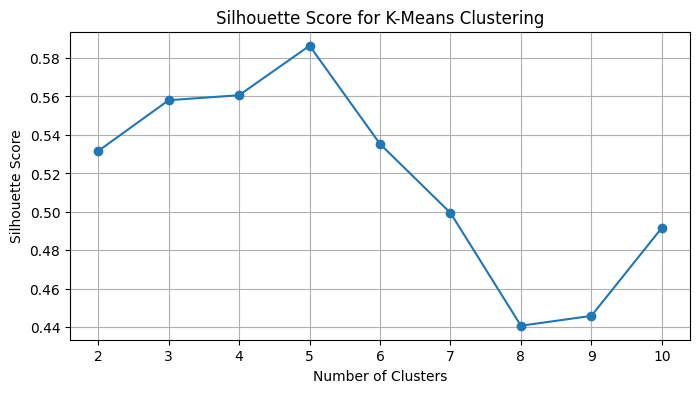


Optimal K = 5, Score = 0.586


In [ ]:
# ----------------------------
# 2. NORMALISASI & PENGUJIAN CLUSTER
# ----------------------------
X = rfm[['Recency', 'Frequency', 'Monetary']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

scores = []
K_range = range(2, 11)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    scores.append(score)
    print(f"K = {k}, Silhouette = {score:.3f}")

plt.figure(figsize=(8,4))
plt.plot(K_range, scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for K-Means Clustering')
plt.grid()
plt.show()

# ----------------------------
# 3. CLUSTERING FINAL
# ----------------------------
opt_k = K_range[int(np.argmax(scores))]
print(f"\nOptimal K = {opt_k}, Score = {max(scores):.3f}")
rfm['Cluster'] = KMeans(n_clusters=opt_k, random_state=42).fit_predict(X_scaled)

cluster_names = {
    0: 'Casual Buyers',
    1: 'Inactive Customers',
    2: 'Loyal High-Value Customers',
    3: 'VIP/Wholesale Customers',
    4: 'Frequent Mid-to-High Value Customers'
}

rfm['Cluster_Name'] = rfm['Cluster'].map(lambda x: cluster_names.get(x, f'Cluster_{x}'))


Silhouette Score tertinggi adalah 0.586 pada k=5, yang menunjukkan bahwa 5 merupakan jumlah cluster yang memberikan pemisahan terbaik antar-cluster.

Skor ini cukup untuk menunjukkan bahwa data dalam setiap cluster cukup kohesif (mirip satu sama lain) dan terpisah dengan baik dari cluster lain.

Setelah 5 cluster, skor menurun signifikan, yang menunjukkan bahwa menambah jumlah cluster tidak lagi menghasilkan pemisahan yang bermakna.

**Berdasarkan Silhouette Score, jumlah cluster optimal untuk K-Means adalah 5.**


Distribusi Guest vs Registered per Cluster:
IsGuest  False  True  Total  Guest_%
Cluster                             
0         3057   495   3552    13.94
1         1029   925   1954    47.34
2            9     0      9     0.00
3            5     0      5     0.00
4          234     2    236     0.85


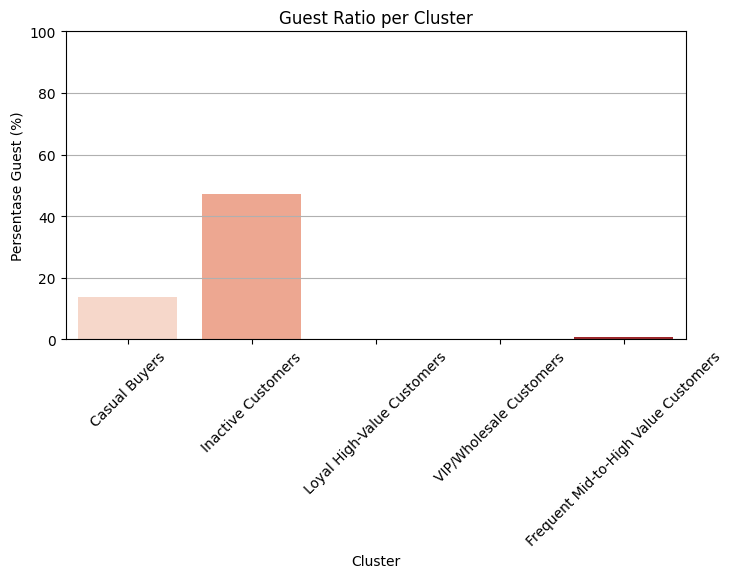

In [ ]:
# ----------------------------
# 4. GUEST DISTRIBUTION PER CLUSTER
# ----------------------------
dist = rfm.groupby(['Cluster', 'IsGuest']).size().unstack(fill_value=0)
guest_col = True if True in dist.columns else dist.columns[0]
dist['Total'] = dist.sum(axis=1)
dist['Guest_%'] = (dist[guest_col] / dist['Total'] * 100).round(2)
print("\nDistribusi Guest vs Registered per Cluster:")
print(dist)

plt.figure(figsize=(8,4))
sns.barplot(x=dist.index.map(lambda x: cluster_names.get(x, f'Cluster_{x}')), y=dist['Guest_%'], hue=dist.index.map(lambda x: cluster_names.get(x, f'Cluster_{x}')), palette='Reds', legend=False)
plt.ylabel('Persentase Guest (%)')
plt.title('Guest Ratio per Cluster')
plt.ylim(0, 100)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

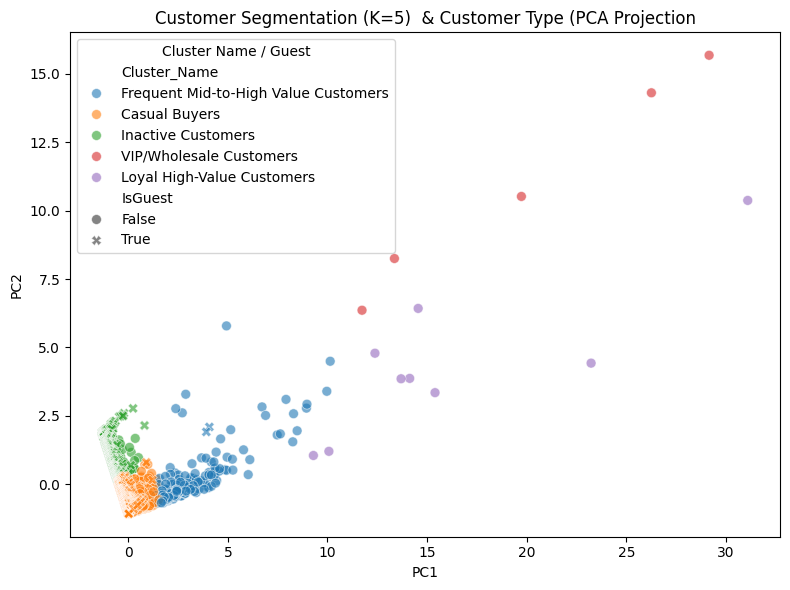

In [ ]:
# ----------------------------
# 5. VISUALISASI CLUSTER
# ----------------------------
# PCA 2D untuk visualisasi
coords_2d = PCA(n_components=2).fit_transform(X_scaled)
rfm['PC1'], rfm['PC2'] = coords_2d[:, 0], coords_2d[:, 1]

plt.figure(figsize=(8, 6))
sns.scatterplot(data=rfm, x='PC1', y='PC2', hue='Cluster_Name', style='IsGuest',
                palette='tab10', s=50, alpha=0.6)
plt.title(f'Customer Segmentation (K={opt_k})  & Customer Type (PCA Projection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Cluster Name / Guest')
plt.tight_layout()
plt.show()

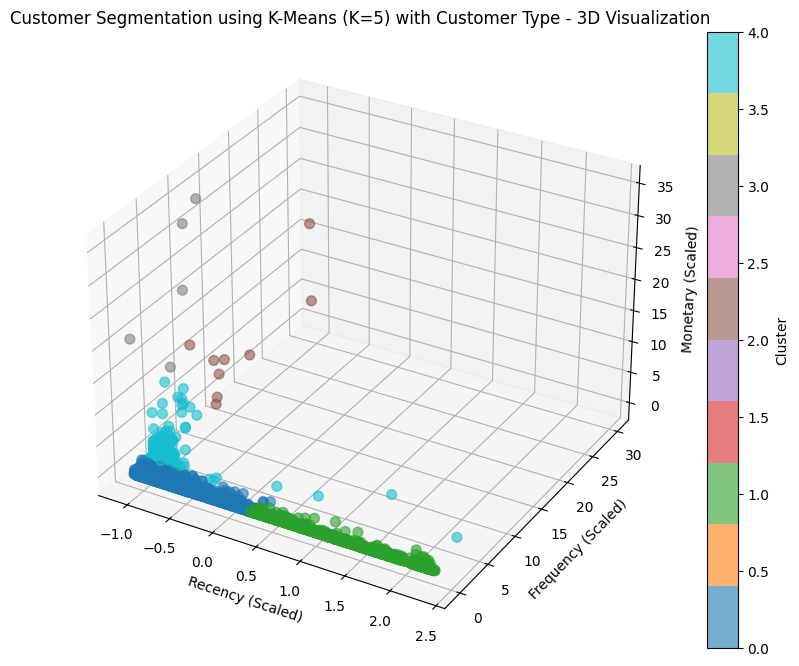

In [ ]:
# 3D Scatter Plot dengan Jitter
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

jitter = np.random.normal(0, 0.02, X_scaled.shape)
X_jittered = X_scaled + jitter

scatter = ax.scatter(X_jittered[:, 0], X_jittered[:, 1], X_jittered[:, 2], c=rfm['Cluster'], cmap='tab10', s=50, alpha=0.6)
ax.set_title(f'Customer Segmentation with K-Means Clusters (K={opt_k}) & Customer Type (3D with Jitter)')
ax.set_title(f'Customer Segmentation using K-Means (K={opt_k}) with Customer Type - 3D Visualization')
ax.set_xlabel('Recency (Scaled)')
ax.set_ylabel('Frequency (Scaled)')
ax.set_zlabel('Monetary (Scaled)')
plt.colorbar(scatter, label='Cluster')
plt.show()

#### 3.1.1. Statistik RFM setiap Cluster

In [ ]:
from tabulate import tabulate

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:.2f}'.format)

def create_stat_table(cluster_data, feature_name, unit=''):
    stats = cluster_data.describe()
    median = cluster_data.median()
    skewness = cluster_data.skew()
    stats_df = pd.DataFrame({
        'Count': stats['count'],
        'Mean': stats['mean'],
        'Std': stats['std'],
        'Min': stats['min'],
        '25%': stats['25%'],
        '50%': stats['50%'],
        '75%': stats['75%'],
        'Max': stats['max'],
        'Median': median,
        'Skewness': skewness
    }, index=[0])
    return tabulate(stats_df, headers='keys', tablefmt='pretty', floatfmt='.2f', showindex=False)


In [ ]:
# === Statistik untuk Recency ===
print("\n=== Statistik Recency per Cluster ===")
for cluster in sorted(rfm['Cluster'].unique()):
    cluster_name = cluster_names.get(cluster, f'Cluster_{cluster}')
    cluster_data = rfm[rfm['Cluster'] == cluster]['Recency']
    print(f"\n{cluster_name}:")
    print(create_stat_table(cluster_data, 'Recency', 'days'))



=== Statistik Recency per Cluster ===

Casual Buyers:
+--------+--------------------+------------------+-----+------+------+------+-------+--------+--------------------+
| Count  |        Mean        |       Std        | Min | 25%  | 50%  | 75%  |  Max  | Median |      Skewness      |
+--------+--------------------+------------------+-----+------+------+------+-------+--------+--------------------+
| 3552.0 | 48.719876126126124 | 39.6955474859933 | 1.0 | 17.0 | 37.0 | 73.0 | 163.0 |  37.0  | 0.8551424865828862 |
+--------+--------------------+------------------+-----+------+------+------+-------+--------+--------------------+

Inactive Customers:
+--------+--------------------+-------------------+-------+-------+-------+-------+-------+--------+--------------------+
| Count  |        Mean        |        Std        |  Min  |  25%  |  50%  |  75%  |  Max  | Median |      Skewness      |
+--------+--------------------+-------------------+-------+-------+-------+-------+-------+--------+

In [ ]:
# === Statistik untuk Frequency ===
print("\n=== Statistik Frequency per Cluster ===")
for cluster in sorted(rfm['Cluster'].unique()):
    cluster_name = cluster_names.get(cluster, f'Cluster_{cluster}')
    cluster_data = rfm[rfm['Cluster'] == cluster]['Frequency']
    print(f"\n{cluster_name}:")
    print(create_stat_table(cluster_data, 'Frequency', 'transactions'))



=== Statistik Frequency per Cluster ===

Casual Buyers:
+--------+--------------------+-------------------+-----+-----+-----+-----+------+--------+-------------------+
| Count  |        Mean        |        Std        | Min | 25% | 50% | 75% | Max  | Median |     Skewness      |
+--------+--------------------+-------------------+-----+-----+-----+-----+------+--------+-------------------+
| 3552.0 | 3.2148085585585586 | 2.659769485728437 | 1.0 | 1.0 | 2.0 | 4.0 | 14.0 |  2.0   | 1.430682048489864 |
+--------+--------------------+-------------------+-----+-----+-----+-----+------+--------+-------------------+

Inactive Customers:
+--------+--------------------+--------------------+-----+-----+-----+-----+------+--------+--------------------+
| Count  |        Mean        |        Std         | Min | 25% | 50% | 75% | Max  | Median |      Skewness      |
+--------+--------------------+--------------------+-----+-----+-----+-----+------+--------+--------------------+
| 1954.0 | 1.2778915

In [ ]:
# === Statistik untuk Monetary ===
print("\n=== Statistik Monetary per Cluster ===")
for cluster in sorted(rfm['Cluster'].unique()):
    cluster_name = cluster_names.get(cluster, f'Cluster_{cluster}')
    cluster_data = rfm[rfm['Cluster'] == cluster]['Monetary']
    print(f"\n{cluster_name}:")
    print(create_stat_table(cluster_data, 'Monetary', '$'))


=== Statistik Monetary per Cluster ===

Casual Buyers:
+--------+--------------------+-------------------+------+--------------------+---------+-----------+--------------------+---------+-------------------+
| Count  |        Mean        |        Std        | Min  |        25%         |   50%   |    75%    |        Max         | Median  |     Skewness      |
+--------+--------------------+-------------------+------+--------------------+---------+-----------+--------------------+---------+-------------------+
| 3552.0 | 1339.1715126689187 | 1552.518771210257 | 0.55 | 336.40000000000003 | 804.255 | 1791.9625 | 16874.579999999998 | 804.255 | 2.861209533121101 |
+--------+--------------------+-------------------+------+--------------------+---------+-----------+--------------------+---------+-------------------+

Inactive Customers:
+--------+-------------------+--------------------+------+----------+--------+---------+----------+--------+-------------------+
| Count  |       Mean        

#### 3.1.2. Statistik RFM Segmentasi Pelanggan (Guest vs. Registered)

In [ ]:
# Filter hanya untuk pelanggan guest
rfm_guest = rfm[rfm['IsGuest'] == True]

print("Statistik Deskriptif untuk Fitur RFM (Guest):")
print(rfm_guest[['Recency', 'Frequency', 'Monetary']].describe())
print("-"*50)
print(f"Median Recency: {rfm_guest['Recency'].median()}")
print(f"Median Frequency: {rfm_guest['Frequency'].median()}")
print(f"Median Monetary: {rfm_guest['Monetary'].median()}")
print(f"Skewness Recency: {rfm_guest['Recency'].skew()}")
print(f"Skewness Frequency: {rfm_guest['Frequency'].skew()}")
print(f"Skewness Monetary: {rfm_guest['Monetary'].skew()}")

Statistik Deskriptif untuk Fitur RFM (Guest):
       Recency  Frequency  Monetary
count  1422.00    1422.00   1422.00
mean    193.75       1.00   1225.13
std     109.48       0.00   2684.50
min       1.00       1.00      0.42
25%     102.00       1.00     17.36
50%     196.00       1.00    465.10
75%     284.75       1.00   1587.90
max     373.00       1.00  52940.94
--------------------------------------------------
Median Recency: 196.0
Median Frequency: 1.0
Median Monetary: 465.09999999999997
Skewness Recency: -0.08225340754806718
Skewness Frequency: 0.0
Skewness Monetary: 10.79837533980251


In [ ]:
# Filter hanya untuk pelanggan terdaftar
rfm_registered = rfm[rfm['IsGuest'] == False]

print("Statistik Deskriptif untuk Fitur RFM (Registered):")
print(rfm_registered[['Recency', 'Frequency', 'Monetary']].describe())
print("-"*50)
print(f"Median Recency: {rfm_registered['Recency'].median()}")
print(f"Median Frequency: {rfm_registered['Frequency'].median()}")
print(f"Median Monetary: {rfm_registered['Monetary'].median()}")
print(f"Skewness Recency: {rfm_registered['Recency'].skew()}")
print(f"Skewness Frequency: {rfm_registered['Frequency'].skew()}")
print(f"Skewness Monetary: {rfm_registered['Monetary'].skew()}")

Statistik Deskriptif untuk Fitur RFM (Registered):
       Recency  Frequency  Monetary
count  4334.00    4334.00   4334.00
mean     92.50       4.27   2055.55
std     100.05       7.70   8993.28
min       1.00       1.00      3.75
25%      18.00       1.00    307.17
50%      51.00       2.00    674.60
75%     142.00       5.00   1662.17
max     374.00     209.00 280206.02
--------------------------------------------------
Median Recency: 51.0
Median Frequency: 2.0
Median Monetary: 674.5999999999999
Skewness Recency: 1.2467818856652086
Skewness Frequency: 12.062131507840474
Skewness Monetary: 19.31627648916167


**Distribusi Guest**

In [ ]:
dist = rfm.groupby(['Cluster', 'IsGuest']).size().unstack(fill_value=0)
guest_col = True if True in dist.columns else dist.columns[0]
dist['Total'] = dist.sum(axis=1)
dist['Guest_%'] = (dist[guest_col] / dist['Total'] * 100).round(2)
print("\nDistribusi Guest vs Registered per Cluster:")
print(dist)


Distribusi Guest vs Registered per Cluster:
IsGuest  False  True  Total  Guest_%
Cluster                             
0         3057   495   3552    13.94
1         1029   925   1954    47.34
2            9     0      9     0.00
3            5     0      5     0.00
4          234     2    236     0.85


Dari data di atas, terlihat bahwa Guest berada pada cluster 0 sebanyak 495 pelanggan, cluster 1 sebanyak 925 pelanggan, dan cluster 4 sebanyak 2 pelanggan.

##### 3.1.2.1. Cluster 0

In [ ]:
cluster_0 = rfm[rfm['Cluster'] == 0]

guest_0 = cluster_0[cluster_0['IsGuest'] == True]
registered_0 = cluster_0[cluster_0['IsGuest'] == False]

print("Statistik Guest (Cluster 0):")
print(guest_0[['Recency', 'Frequency', 'Monetary']].describe())

print("\nStatistik Registered (Cluster 0):")
print(registered_0[['Recency', 'Frequency', 'Monetary']].describe())


Statistik Guest (Cluster 0):
       Recency  Frequency  Monetary
count   495.00     495.00    495.00
mean     70.42       1.00   1517.23
std      45.58       0.00   2122.94
min       1.00       1.00      0.55
25%      30.50       1.00     13.73
50%      65.00       1.00    526.80
75%     108.00       1.00   2200.44
max     150.00       1.00  16874.58

Statistik Registered (Cluster 0):
       Recency  Frequency  Monetary
count  3057.00    3057.00   3057.00
mean     45.21       3.57   1310.34
std      37.50       2.70   1437.44
min       1.00       1.00      6.20
25%      16.00       1.00    380.55
50%      33.00       3.00    813.11
75%      67.00       5.00   1740.48
max     163.00      14.00  13375.87


##### 3.1.2.2. Cluster 1

In [ ]:
cluster_1 = rfm[rfm['Cluster'] == 1]

guest_1 = cluster_1[cluster_1['IsGuest'] == True]
registered_1 = cluster_1[cluster_1['IsGuest'] == False]

print("Statistik Guest (Cluster 1):")
print(guest_1[['Recency', 'Frequency', 'Monetary']].describe())

print("\nStatistik Registered (Cluster 1):")
print(registered_1[['Recency', 'Frequency', 'Monetary']].describe())


Statistik Guest (Cluster 1):
       Recency  Frequency  Monetary
count   925.00     925.00    925.00
mean    260.10       1.00    959.47
std      68.62       0.00   1737.32
min     149.00       1.00      0.42
25%     199.00       1.00     20.75
50%     257.00       1.00    461.52
75%     320.00       1.00   1321.39
max     373.00       1.00  21627.72

Statistik Registered (Cluster 1):
       Recency  Frequency  Monetary
count  1029.00    1029.00   1029.00
mean    251.74       1.53    466.79
std      64.69       1.06    629.89
min     149.00       1.00      3.75
25%     196.00       1.00    168.40
50%     247.00       1.00    307.90
75%     303.00       2.00    519.68
max     374.00      12.00   9864.26


##### 3.1.2.3. Cluster 2

In [ ]:
cluster_2 = rfm[rfm['Cluster'] == 2]

guest_2 = cluster_2[cluster_2['IsGuest'] == True]
registered_2 = cluster_2[cluster_2['IsGuest'] == False]

print("Statistik Guest (Cluster 2):")
print(guest_2[['Recency', 'Frequency', 'Monetary']].describe())

print("\nStatistik Registered (Cluster 2):")
print(registered_2[['Recency', 'Frequency', 'Monetary']].describe())

Statistik Guest (Cluster 2):
       Recency  Frequency  Monetary
count     0.00       0.00      0.00
mean       NaN        NaN       NaN
std        NaN        NaN       NaN
min        NaN        NaN       NaN
25%        NaN        NaN       NaN
50%        NaN        NaN       NaN
75%        NaN        NaN       NaN
max        NaN        NaN       NaN

Statistik Registered (Cluster 2):
       Recency  Frequency  Monetary
count     9.00       9.00      9.00
mean      6.89     113.22  62209.01
std      12.38      55.69  45335.61
min       1.00      55.00  11189.91
25%       1.00      86.00  33719.73
50%       2.00      93.00  58825.83
75%       4.00     124.00  81024.84
max      39.00     209.00 143825.06


##### 3.1.2.4. Cluster 3

In [ ]:
cluster_3 = rfm[rfm['Cluster'] == 3]

guest_3 = cluster_3[cluster_3['IsGuest'] == True]
registered_3 = cluster_3[cluster_3['IsGuest'] == False]

print("Statistik Guest (Cluster 3):")
print(guest_3[['Recency', 'Frequency', 'Monetary']].describe())

print("\nStatistik Registered (Cluster 3):")
print(registered_3[['Recency', 'Frequency', 'Monetary']].describe())

Statistik Guest (Cluster 3):
       Recency  Frequency  Monetary
count     0.00       0.00      0.00
mean       NaN        NaN       NaN
std        NaN        NaN       NaN
min        NaN        NaN       NaN
25%        NaN        NaN       NaN
50%        NaN        NaN       NaN
75%        NaN        NaN       NaN
max        NaN        NaN       NaN

Statistik Registered (Cluster 3):
       Recency  Frequency  Monetary
count     5.00       5.00      5.00
mean      7.20      40.40 205560.23
std       9.83      28.85  64224.07
min       1.00       2.00 124914.53
25%       1.00      21.00 168472.50
50%       2.00      46.00 194550.79
75%       8.00      60.00 259657.30
max      24.00      73.00 280206.02


##### 3.1.2.5. Cluster 4

In [ ]:
cluster_4 = rfm[rfm['Cluster'] == 4]

guest_4 = cluster_4[cluster_4['IsGuest'] == True]
registered_4 = cluster_4[cluster_4['IsGuest'] == False]

print("Statistik Guest (Cluster 4):")
print(guest_4[['Recency', 'Frequency', 'Monetary']].describe())

print("\nStatistik Registered (Cluster 4):")
print(registered_4[['Recency', 'Frequency', 'Monetary']].describe())


Statistik Guest (Cluster 4):
       Recency  Frequency  Monetary
count     2.00       2.00      2.00
mean     28.50       1.00  51797.43
std       4.95       0.00   1617.17
min      25.00       1.00  50653.91
25%      26.75       1.00  51225.67
50%      28.50       1.00  51797.43
75%      30.25       1.00  52369.18
max      32.00       1.00  52940.94

Statistik Registered (Cluster 4):
       Recency  Frequency  Monetary
count   234.00     234.00    234.00
mean     15.24      20.54  12115.46
std      38.40       9.46  13612.07
min       1.00       1.00   1296.44
25%       3.00      15.00   4839.57
50%       6.50      18.00   7279.54
75%      15.00      24.75  12659.47
max     372.00      62.00  91062.38


**Justifikasi Keberadaan Guest dalam Cluster Berdasarkan Metrik RFM**

Berdasarkan data distribusi guest vs. registered per cluster serta statistik deskriptif RFM untuk setiap cluster, berikut adalah justifikasi mengapa guest masuk ke cluster 0, 1, dan 4 (cluster 2 dan 3 tidak memiliki guest, sehingga tidak perlu dianalisis untuk kehadiran guest). Perhatikan juga bahwa frekuensi guest = 1 disebabkan oleh ketiadaan identitas konsisten untuk melacak apakah invoice yang berbeda milik satu pelanggan yang sama.

---

**Justifikasi Kenapa Ada Guest yang Masuk Cluster 0**

- **Distribusi**: Cluster 0 memiliki 3552 pelanggan, dengan 495 guest (13.94% guest), menunjukkan proporsi guest yang moderat.
- **Statistik Guest (Cluster 0)**:
  - **Recency**: Rata-rata 70.42 hari, median 65.00 hari, menunjukkan guest di cluster ini memiliki jeda transaksi yang cukup lama tetapi masih dalam rentang yang dapat dianggap aktif relatif dibandingkan cluster lain seperti cluster 1.
  - **Frequency**: Rata-rata 1.00 transaksi, konsisten dengan perilaku guest yang biasanya melakukan satu pembelian tunggal. Hal ini disebabkan oleh ketiadaan identitas konsisten untuk melacak apakah invoice berbeda milik satu pelanggan yang sama, sehingga setiap transaksi guest dihitung sebagai frekuensi 1.
  - **Monetary**: Rata-rata 1517.23, dengan median 526.80 dan maksimum 16874.58, menunjukkan variasi besar dalam pengeluaran, dari nilai rendah hingga outlier yang signifikan.
- **Perbandingan dengan Registered (Cluster 0)**:
  - Registered memiliki Recency lebih rendah (rata-rata 45.21 hari), Frequency lebih tinggi (rata-rata 3.57), dan Monetary sedikit lebih rendah (rata-rata 1310.34), menunjukkan mereka lebih aktif dan konsisten dalam bertransaksi.
- **Justifikasi**: Guest masuk cluster 0 karena metrik mereka (Recency sedang, Frequency rendah, Monetary bervariasi) selaras dengan segmen yang mencakup pelanggan dengan pola pembelian sporadis. Variasi Monetary yang tinggi, termasuk adanya outlier dengan pengeluaran besar, memungkinkan beberapa guest untuk masuk ke cluster ini, meskipun Frequency mereka tetap khas untuk guest (satu transaksi) akibat keterbatasan pelacakan identitas. Cluster 0 tampaknya mewakili segmen "pembeli santai" yang dapat mencakup baik guest maupun registered dengan karakteristik serupa.

---

**Justifikasi Kenapa Ada Guest yang Masuk Cluster 1**

- **Distribusi**: Cluster 1 memiliki 1954 pelanggan, dengan 925 guest (47.34% guest), menjadikannya cluster dengan proporsi guest tertinggi.
- **Statistik Guest (Cluster 1)**:
  - **Recency**: Rata-rata 260.10 hari, median 257.00 hari, menunjukkan guest di cluster ini sangat lama tidak bertransaksi, mencerminkan ketidakaktifan yang signifikan.
  - **Frequency**: Rata-rata 1.00 transaksi, sesuai dengan perilaku guest yang biasanya melakukan pembelian sekali pakai, didorong oleh ketiadaan identitas konsisten untuk melacak transaksi berulang.
  - **Monetary**: Rata-rata 959.47, dengan median 461.52 dan maksimum 21627.72, menunjukkan pengeluaran yang bervariasi tetapi cenderung rendah hingga sedang, dengan beberapa outlier tinggi.
- **Perbandingan dengan Registered (Cluster 1)**:
  - Registered memiliki Recency serupa (rata-rata 251.74 hari), Frequency sedikit lebih tinggi (rata-rata 1.53), dan Monetary lebih rendah (rata-rata 466.79), menunjukkan pola ketidakaktifan yang konsisten dengan guest.
- **Justifikasi**: Guest dominan di cluster 1 karena metrik mereka (Recency tinggi, Frequency rendah, Monetary rendah hingga sedang) sesuai dengan segmen "pelanggan tidak aktif". Tingginya Recency menunjukkan bahwa guest ini tidak kembali setelah pembelian awal, yang merupakan karakteristik umum guest, diperparah oleh ketidakmampuan pelacakan identitas yang membuat Frequency tetap 1. Distribusi Monetary yang tumpang tindih dengan registered memperkuat pengelompokan ini berdasarkan ketidakaktifan, menjadikan cluster 1 sebagai segmen yang mencerminkan perilaku serupa antara guest dan registered yang jarang bertransaksi.

---

**Justifikasi Kenapa Ada Guest yang Masuk Cluster 4**

- **Distribusi**: Cluster 4 memiliki 236 pelanggan, dengan 2 guest (0.85% guest), menunjukkan proporsi guest yang sangat kecil.
- **Statistik Guest (Cluster 4)**:
  - **Recency**: Rata-rata 28.50 hari, median 28.50 hari, menunjukkan guest ini relatif aktif dibandingkan cluster lain seperti cluster 1.
  - **Frequency**: Rata-rata 1.00 transaksi, tetap khas untuk guest dengan satu pembelian, akibat ketiadaan identitas konsisten untuk melacak transaksi lebih lanjut.
  - **Monetary**: Rata-rata 51797.43, dengan median 51797.43 dan rentang 50653.91 hingga 52940.94, menunjukkan pengeluaran yang sangat tinggi untuk guest.
- **Perbandingan dengan Registered (Cluster 4)**:
  - Registered memiliki Recency lebih rendah (rata-rata 15.24 hari), Frequency lebih tinggi (rata-rata 20.54), dan Monetary lebih rendah (rata-rata 12115.46), menunjukkan mereka lebih sering bertransaksi dengan nilai lebih moderat.
- **Justifikasi**: Guest masuk cluster 4 karena mereka memiliki Monetary yang sangat tinggi, yang mendekati distribusi registered dalam cluster ini, meskipun Recency dan Frequency mereka tetap rendah (khas guest). Cluster 4 tampaknya mencerminkan segmen dengan nilai pengeluaran besar, dan outlier guest dengan pembelian sekali pakai dalam jumlah besar (misalnya pembelian grosir atau barang mahal) dapat masuk ke sini. Jumlah guest yang sangat sedikit (2 dari 236) menegaskan bahwa ini adalah kasus langka, kemungkinan besar didorong oleh nilai Monetary yang luar biasa tinggi, meskipun Frequency tetap 1 akibat keterbatasan pelacakan.

---

> "Kenapa ada guest yang masuk ke **Cluster 0 (Casual Buyers)**, bukan ke **Cluster 1 (Inactive Customers)**, padahal sama-sama jarang beli dan guest identik dengan *once buyers*?"

**Perbedaan Cluster 0 dan Cluster 1 Secara Konsep**

| Fitur         | Cluster 0 (*Casual Buyers*) | Cluster 1 (*Inactive Customers*)   |
|---------------|-----------------------------|------------------------------------|
| **Recency**   | Sedang – Tinggi             | Tinggi (sangat lama tidak belanja) |
| **Frequency** | 1 atau sangat rendah        | 1 atau sangat rendah               |
| **Monetary**  | Menengah ke bawah           | Sangat rendah                      |

> Keduanya **sama-sama memiliki Frequency = 1** (karena ketiadaan identitas konsisten untuk guest), tetapi **Recency dan Monetary** adalah penentu yang lebih membedakan.

Jadi, alasan Guest masuk Cluster 0, dan bukan Cluster 1 adalah sebagai berikut.

1. **Monetary Guest Masih Lebih Tinggi dari Cluster 1**
- Median *Monetary* guest (berdasarkan data gabungan): **465.10** (mendekati nilai median Cluster 0).
- Sementara Cluster 1 didominasi oleh pelanggan yang:
  - **Beli 1 kali**
  - **Transaksi sangat kecil (Monetary rendah, median 461.52 untuk guest, 307.90 untuk registered)**

> **Jadi, guest dengan nominal pembelian agak besar (meskipun cuma sekali)** akan lebih cocok di Cluster 0, yang memiliki Monetary lebih tinggi dibandingkan Cluster 1.

2. **Recency Guest Tidak Setinggi Cluster 1**
- Median *Recency* guest (berdasarkan data gabungan): **196 hari** (mendekati nilai median Cluster 0).
- Cluster 1 biasanya berisi customer dengan Recency **di atas 250–300 hari** (median 257.00 untuk guest, 247.00 untuk registered), menunjukkan ketidakaktifan yang lebih ekstrem.

> **Guest yang belanja sekitar 150–250 hari lalu dianggap masih mungkin kembali** → cocok ke Cluster 0 daripada Cluster 1, yang mencerminkan pelanggan benar-benar tidak aktif.

3. **K-Means Berbasis Jarak (Vector Similarity)**
- Clustering K-Means memisahkan data berdasarkan **kedekatan vektor fitur yang telah dinormalisasi** menggunakan `StandardScaler`.
- Setelah distandarisasi, **guest dengan Monetary menengah + Recency sedang** akan lebih dekat ke pusat Cluster 0 dibanding Cluster 1.

> **Meski Frequency-nya sama (1) karena keterbatasan pelacakan identitas, kombinasi Recency + Monetary yang lebih "baik"** membuat mereka lebih mirip *Casual Buyers* daripada *Inactive Customers*.

**Contoh Ilustrasi**

Misal dua guest berikut (berdasarkan data hipotetis yang konsisten dengan statistik):

| Customer | Recency | Frequency | Monetary | Cluster |
|----------|---------|-----------|----------|---------|
| Guest A  | 180     | 1         | 800      | 0       |
| Guest B  | 310     | 1         | 90       | 1       |

- **Guest A**: Baru belanja sekitar 6 bulan lalu, dan cukup banyak (800) → dianggap masih mungkin kembali → masuk *Cluster 0 (Casual Buyers)*.
- **Guest B**: Sudah hampir setahun tidak belanja dan nominalnya kecil (90) → dianggap benar-benar tidak aktif → masuk *Cluster 1 (Inactive Customers)*.

Guest masuk ke **Cluster 0 (Casual Buyers)** karena meskipun hanya belanja satu kali (dibatasi oleh ketiadaan identitas konsisten):
- Mereka **tidak terlalu lama absen** (Recency sedang, sekitar 150–250 hari).
- **Nilai transaksi mereka cukup signifikan** (Monetary menengah, mendekati 465–1500).
- Sehingga, secara karakteristik mereka **lebih mirip "Casual Buyers"** daripada pelanggan benar-benar tidak aktif.

Kalau ingin visualnya, saya bisa bantu plot distribusi Recency–Monetary untuk Guest di Cluster 0 vs Cluster 1. Ingin?

---

**Kesimpulan**

- **Cluster 0**: Guest masuk karena kombinasi Recency sedang dan Monetary bervariasi, meskipun Frequency rendah (dibatasi oleh ketiadaan identitas konsisten), yang sesuai dengan pola "pembeli santai" yang dapat mencakup kedua tipe pelanggan.
- **Cluster 1**: Guest dominan karena Recency tinggi dan Frequency rendah (dibatasi oleh ketiadaan pelacakan), mencerminkan ketidakaktifan yang khas untuk guest yang tidak kembali setelah pembelian awal.
- **Cluster 4**: Guest masuk karena Monetary sangat tinggi, meskipun jumlahnya minimal, menunjukkan outlier guest dengan pembelian besar yang tumpang tindih dengan registered, dengan Frequency tetap 1 akibat keterbatasan pelacakan.
- **Cluster 2 dan 3**: Tidak ada guest karena Recency sangat rendah, Frequency sangat tinggi, dan Monetary sangat besar, yang hanya sesuai dengan registered dengan pola loyalitas dan pengeluaran tinggi.

Analisis ini didukung oleh perbedaan metrik RFM yang mencerminkan perilaku berbeda antara guest dan registered, dengan clustering yang berhasil menangkap variasi ini berdasarkan data yang diberikan.

**Justifikasi Kehadiran Guest dalam Cluster Berdasarkan Metrik RFM**

Berdasarkan data distribusi guest vs. registered per cluster serta statistik deskriptif RFM untuk setiap cluster, berikut adalah justifikasi mengapa guest masuk ke cluster 0, 1, dan 4 (cluster 2 dan 3 tidak memiliki guest, sehingga tidak perlu dianalisis untuk kehadiran guest):

---

1. **Justifikasi Kenapa Ada Guest yang Masuk Cluster 0**

- **Distribusi**: Cluster 0 memiliki 3552 pelanggan, dengan 495 guest (13.94% guest), menunjukkan proporsi guest yang moderat.
- **Statistik Guest (Cluster 0)**:
  - **Recency**: Rata-rata 70.42 hari, median 65.00 hari, menunjukkan guest di cluster ini memiliki jeda transaksi yang cukup lama tetapi masih dalam rentang yang dapat dianggap aktif relatif dibandingkan cluster lain seperti cluster 1.
  - **Frequency**: Rata-rata 1.00 transaksi, konsisten dengan perilaku guest yang biasanya melakukan satu pembelian tunggal.
  - **Monetary**: Rata-rata 1517.23, dengan median 526.80 dan maksimum 16874.58, menunjukkan variasi besar dalam pengeluaran, dari nilai rendah hingga outlier yang signifikan.
- **Perbandingan dengan Registered (Cluster 0)**:
  - Registered memiliki Recency lebih rendah (rata-rata 45.21 hari), Frequency lebih tinggi (rata-rata 3.57), dan Monetary sedikit lebih rendah (rata-rata 1310.34), menunjukkan mereka lebih aktif dan konsisten dalam bertransaksi.
- **Justifikasi**: Guest masuk cluster 0 karena metrik mereka (Recency sedang, Frequency rendah, Monetary bervariasi) selaras dengan segmen yang mencakup pelanggan dengan pola pembelian sporadis. Variasi Monetary yang tinggi, termasuk adanya outlier dengan pengeluaran besar, memungkinkan beberapa guest untuk masuk ke cluster ini, meskipun Frequency mereka tetap khas untuk guest (satu transaksi). Cluster 0 tampaknya mewakili segmen "pembeli santai" yang dapat mencakup baik guest maupun registered dengan karakteristik serupa.

---

2. **Justifikasi Kenapa Ada Guest yang Masuk Cluster 1**

- **Distribusi**: Cluster 1 memiliki 1954 pelanggan, dengan 925 guest (47.34% guest), menjadikannya cluster dengan proporsi guest tertinggi.
- **Statistik Guest (Cluster 1)**:
  - **Recency**: Rata-rata 260.10 hari, median 257.00 hari, menunjukkan guest di cluster ini sangat lama tidak bertransaksi, mencerminkan ketidakaktifan yang signifikan.
  - **Frequency**: Rata-rata 1.00 transaksi, sesuai dengan perilaku guest yang biasanya melakukan pembelian sekali pakai.
  - **Monetary**: Rata-rata 959.47, dengan median 461.52 dan maksimum 21627.72, menunjukkan pengeluaran yang bervariasi tetapi cenderung rendah hingga sedang, dengan beberapa outlier tinggi.
- **Perbandingan dengan Registered (Cluster 1)**:
  - Registered memiliki Recency serupa (rata-rata 251.74 hari), Frequency sedikit lebih tinggi (rata-rata 1.53), dan Monetary lebih rendah (rata-rata 466.79), menunjukkan pola ketidakaktifan yang konsisten dengan guest.
- **Justifikasi**: Guest dominan di cluster 1 karena metrik mereka (Recency tinggi, Frequency rendah, Monetary rendah hingga sedang) sesuai dengan segmen "pelanggan tidak aktif". Tingginya Recency menunjukkan bahwa guest ini tidak kembali setelah pembelian awal, yang merupakan karakteristik umum guest. Distribusi Monetary yang tumpang tindih dengan registered memperkuat pengelompokan ini berdasarkan ketidakaktifan, menjadikan cluster 1 sebagai segmen yang mencerminkan perilaku serupa antara guest dan registered yang jarang bertransaksi.

---

3. **Justifikasi Kenapa Ada Guest yang Masuk Cluster 4**

- **Distribusi**: Cluster 4 memiliki 236 pelanggan, dengan 2 guest (0.85% guest), menunjukkan proporsi guest yang sangat kecil.
- **Statistik Guest (Cluster 4)**:
  - **Recency**: Rata-rata 28.50 hari, median 28.50 hari, menunjukkan guest ini relatif aktif dibandingkan cluster lain seperti cluster 1.
  - **Frequency**: Rata-rata 1.00 transaksi, tetap khas untuk guest dengan satu pembelian.
  - **Monetary**: Rata-rata 51797.43, dengan median 51797.43 dan rentang 50653.91 hingga 52940.94, menunjukkan pengeluaran yang sangat tinggi untuk guest.
- **Perbandingan dengan Registered (Cluster 4)**:
  - Registered memiliki Recency lebih rendah (rata-rata 15.24 hari), Frequency lebih tinggi (rata-rata 20.54), dan Monetary lebih rendah (rata-rata 12115.46), menunjukkan mereka lebih sering bertransaksi dengan nilai lebih moderat.
- **Justifikasi**: Guest masuk cluster 4 karena mereka memiliki Monetary yang sangat tinggi, yang mendekati distribusi registered dalam cluster ini, meskipun Recency dan Frequency mereka tetap rendah (khas guest). Cluster 4 tampaknya mencerminkan segmen dengan nilai pengeluaran besar, dan outlier guest dengan pembelian sekali pakai dalam jumlah besar (misalnya pembelian grosir atau barang mahal) dapat masuk ke sini. Jumlah guest yang sangat sedikit (2 dari 236) menegaskan bahwa ini adalah kasus langka, kemungkinan besar didorong oleh nilai Monetary yang luar biasa tinggi.

---

**Kesimpulan**

- **Cluster 0**: Guest masuk karena kombinasi Recency sedang dan Monetary bervariasi, meskipun Frequency rendah, yang sesuai dengan pola "pembeli santai" yang dapat mencakup kedua tipe pelanggan.
- **Cluster 1**: Guest dominan karena Recency tinggi dan Frequency rendah, mencerminkan ketidakaktifan yang khas untuk guest yang tidak kembali setelah pembelian awal.
- **Cluster 4**: Guest masuk karena Monetary sangat tinggi, meskipun jumlahnya minimal, menunjukkan outlier guest dengan pembelian besar yang tumpang tindih dengan registered.
- **Cluster 2 dan 3**: Tidak ada guest karena Recency sangat rendah, Frequency sangat tinggi, dan Monetary sangat besar, yang hanya sesuai dengan registered dengan pola loyalitas dan pengeluaran tinggi.

Analisis ini didukung oleh perbedaan metrik RFM yang mencerminkan perilaku berbeda antara guest dan registered, dengan clustering yang berhasil menangkap variasi ini berdasarkan data yang diberikan.

### 3.2. Association Rule Mining

Association Rule Mining digunakan untuk mengidentifikasi pola pembelian produk oleh pelanggan yang terjadi secara bersamaan dalam satu transaksi. Teknik ini dapat memberikan wawasan strategis seperti kebiasaan pembelian pelanggan, produk pelengkap, dan peluang promosi bundling.

Analisis dilakukan per segmen pelanggan (cluster) berdasarkan RFM-KMeans. Selain itu pemrosesan dilakukan baik dengan kategori produk (CategoryExtraction) maupun deskripsi asli (Description) untuk dilakukan perbandingan.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth, association_rules
import random

In [ ]:
# ===== REPRODUCIBILITY SETTINGS =====
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
plt.rcParams['figure.max_open_warning'] = 0

# ===== VISUALIZATION SETTINGS =====
plt.style.use('default')
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)

COLORS = {
    'regular': '#4ECDC4',
    'accent': '#FFE66D',
    'text': '#2C3E50',
    'background': '#F7F9FC'
}

PLOT_SETTINGS = {
    'figure.figsize': (12, 8),
    'figure.dpi': 100,
    'figure.facecolor': COLORS['background'],
    'axes.facecolor': COLORS['background'],
    'axes.grid': True,
    'grid.alpha': 0.3,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'legend.frameon': True,
    'legend.facecolor': COLORS['background'],
    'legend.edgecolor': 'none',
    'text.color': COLORS['text']
}

# Apply settings
plt.rcParams.update(PLOT_SETTINGS)

In [ ]:
# Reset index agar kolom CustomerID bisa digunakan untuk merge
rfm_reset = rfm.reset_index()

# Ambil mapping CustomerID ke Cluster (includes both registered and guest customers)
cluster_mapping = rfm_reset[['CustomerID', 'Cluster']]

# Gabungkan data transaksi dengan cluster yang sudah ditentukan
df_with_clusters = df_clean.merge(cluster_mapping, on='CustomerID', how='left')

# Drop rows with NaN clusters
df_with_clusters = df_with_clusters.dropna(subset=['Cluster'])
print(f"Transaksi setelah drop NaN: {len(df_with_clusters)}")
df_with_clusters

# ===== VALIDASI DAN INFORMASI CLUSTER =====
unique_clusters = sorted(df_with_clusters['Cluster'].unique())
print(f"\nCluster unik: {unique_clusters}")
print(f"\nJumlah cluster unik: {df_with_clusters['Cluster'].nunique()}")
print(f"\nDistribusi jumlah transaksi per cluster:\n{df_with_clusters['Cluster'].value_counts()}")

Transaksi setelah drop NaN: 519641

Cluster unik: [np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4)]

Jumlah cluster unik: 5

Distribusi jumlah transaksi per cluster:
Cluster
0    301338
1    100153
4     88386
2     26204
3      3560
Name: count, dtype: int64


In [ ]:
# ===== STATISTIK DATASET =====

stats = {
    'Total transaksi': f"{len(df_with_clusters):,}",
    'Transaksi unik': f"{df_with_clusters['InvoiceNo'].nunique():,}",
    'Produk unik': f"{df_with_clusters['StockCode'].nunique():,}",
    'Kategori produk': f"{df_with_clusters['CategoryExtraction'].nunique():,}",
    'Total customer': f"{df_with_clusters['CustomerID'].nunique():,}",
    'Total cluster': f"{df_with_clusters['Cluster'].nunique()}",
    'Penggunaan memori (MB)': f"{df_with_clusters.memory_usage(deep=True).sum() / (1024 * 1024):.2f}"
}

for key, value in stats.items():
    print(f"{key}: {value}")

def analyze_cluster_statistics(df_with_clusters):
    """Return statistics for each cluster"""

    result = {}

    for cluster in df_with_clusters['Cluster'].unique():
        cluster_data = df_with_clusters[df_with_clusters['Cluster'] == cluster]
        n_transactions = cluster_data['InvoiceNo'].nunique()
        items_per_transaction = cluster_data.groupby('InvoiceNo').size()

        result[cluster] = {
            'n_customers': cluster_data['CustomerID'].nunique(),
            'n_transactions': n_transactions,
            'n_items': cluster_data['StockCode'].nunique(),
            'avg_items_per_txn': items_per_transaction.mean(),
            'max_items_per_txn': items_per_transaction.max(),
            'median_items_per_txn': items_per_transaction.median()
        }

    return result

analyze_cluster_statistics(df_with_clusters)

Total transaksi: 519,641
Transaksi unik: 19,946
Produk unik: 3,921
Kategori produk: 1,522
Total customer: 5,756
Total cluster: 5
Penggunaan memori (MB): 263.09


{np.int32(4): {'n_customers': 236,
  'n_transactions': 4809,
  'n_items': 3148,
  'avg_items_per_txn': np.float64(18.379288833437304),
  'max_items_per_txn': 542,
  'median_items_per_txn': 12.0},
 np.int32(0): {'n_customers': 3552,
  'n_transactions': 11419,
  'n_items': 3747,
  'avg_items_per_txn': np.float64(26.389175934845433),
  'max_items_per_txn': 1114,
  'median_items_per_txn': 16.0},
 np.int32(1): {'n_customers': 1954,
  'n_transactions': 2497,
  'n_items': 3339,
  'avg_items_per_txn': np.float64(40.10933119743692),
  'max_items_per_txn': 705,
  'median_items_per_txn': 15.0},
 np.int32(2): {'n_customers': 9,
  'n_transactions': 1019,
  'n_items': 2804,
  'avg_items_per_txn': np.float64(25.71540726202159),
  'max_items_per_txn': 184,
  'median_items_per_txn': 19.0},
 np.int32(3): {'n_customers': 5,
  'n_transactions': 202,
  'n_items': 1033,
  'avg_items_per_txn': np.float64(17.623762376237625),
  'max_items_per_txn': 138,
  'median_items_per_txn': 8.0}}

In [ ]:
# ===== HELPER FUNCTIONS =====

def get_min_occurrence(n_transactions):
    """Determine min_occurrence based on transaction count"""
    if n_transactions < 100:
        return 2
    elif n_transactions < 1000:
        return 3
    else:
        return 5

def sample_large_cluster(cluster_data, sample_size=1000, cluster_id=None):
    """Sample cluster jika terlalu besar untuk menghindari memory issues"""
    n_transactions = cluster_data['InvoiceNo'].nunique()

    # Handle guest cluster with special sampling bcs its too large
    if cluster_id == 'Guest':
        if n_transactions > 500:
            guest_sample_size = min(500, sample_size)
            print(f"Guest cluster optimization: Sampling {guest_sample_size} from {n_transactions} transactions for faster execution")
            unique_invoices = sorted(cluster_data['InvoiceNo'].unique())
            sampled_invoices = pd.Series(unique_invoices).head(guest_sample_size).values
            sampled_data = cluster_data[cluster_data['InvoiceNo'].isin(sampled_invoices)]
            print(f"After Guest sampling: {sampled_data['InvoiceNo'].nunique()} transactions")
            return sampled_data
        else:
            return cluster_data

    # Regular sampling for other clusters
    if n_transactions <= 3000:
        return cluster_data

    print(f"Large cluster detected. Sampling {sample_size} from {n_transactions} transactions")
    unique_invoices = sorted(cluster_data['InvoiceNo'].unique())
    sampled_invoices = pd.Series(unique_invoices).head(sample_size).values
    sampled_data = cluster_data[cluster_data['InvoiceNo'].isin(sampled_invoices)]
    print(f"After sampling: {sampled_data['InvoiceNo'].nunique()} transactions")

    return sampled_data

def prepare_transactions(data, column, min_occurrence, max_items_per_transaction=50, cluster_id=None):
    """Prepare dan filter transaksi untuk mining"""
    if column not in data.columns:
        print(f"Error: Kolom {column} tidak ditemukan!")
        return []

    if cluster_id == 'Guest':
        max_items_per_transaction = min(20, max_items_per_transaction)
        min_occurrence = max(min_occurrence, 8)
        print(f"Guest cluster optimization: max_items={max_items_per_transaction}, min_occurrence={min_occurrence}")

    # Build transaction dictionary
    transactions_dict = {}
    for _, row in data[['InvoiceNo', column]].iterrows():
        invoice, item = row['InvoiceNo'], row[column]
        if invoice not in transactions_dict:
            transactions_dict[invoice] = []
        if item not in transactions_dict[invoice]:
            transactions_dict[invoice].append(item)

    # Filter by frequency
    item_counts = {}
    for items in transactions_dict.values():
        for item in items:
            item_counts[item] = item_counts.get(item, 0) + 1

    frequent_items = {item for item, count in item_counts.items() if count >= min_occurrence}
    print(f"Ditemukan {len(frequent_items)} item dengan min occurrence {min_occurrence}")

    if cluster_id == 'Guest' and len(frequent_items) > 200:
        top_items = sorted(item_counts.items(), key=lambda x: x[1], reverse=True)[:200]
        frequent_items = {item for item, count in top_items}
        print(f"Guest cluster optimization: Limited to top {len(frequent_items)} most frequent items")

    # Filter and limit transactions
    filtered_transactions = []
    for items in transactions_dict.values():
        filtered = [item for item in items if item in frequent_items][:max_items_per_transaction]
        if filtered:
            filtered_transactions.append(filtered)

    return sorted([sorted(t) for t in filtered_transactions])

def calculate_additional_metrics(rules):
    """Calculate leverage dan conviction metrics"""
    rules['leverage'] = rules['support'] - (rules['antecedent support'] * rules['consequent support'])
    rules['conviction'] = rules.apply(
        lambda row: ((1 - row['consequent support']) / (1 - row['confidence']))
        if row['confidence'] < 1 else float('inf'), axis=1
    )

    # Handle infinite values
    if not rules.empty and (rules['conviction'] != np.inf).any():
        max_non_inf = rules[rules['conviction'] != np.inf]['conviction'].max()
        rules['conviction'] = rules['conviction'].replace([np.inf, -np.inf], max_non_inf)
    else:
        rules['conviction'] = rules['conviction'].replace([np.inf, -np.inf], np.nan).fillna(1.0)

    return rules

In [ ]:
# ===== CORE FUNCTIONS =====

def generate_association_rules(cluster_data, column, min_support, min_confidence, min_lift, min_occurrence, max_items_per_transaction=50, cluster_id=None):
    """Generate association rules dengan parameter yang diberikan"""

    print(f"Generating rules using column: {column}")

    # Prepare transactions
    filtered_transactions = prepare_transactions(
        cluster_data, column, min_occurrence, max_items_per_transaction, cluster_id
    )

    if len(filtered_transactions) < 10:
        print("Terlalu sedikit transaksi setelah filtering")
        return pd.DataFrame()

    print(f"Encoding {len(filtered_transactions)} transaksi")

    # Transaction encoding
    te = TransactionEncoder()
    te_ary = te.fit(filtered_transactions).transform(filtered_transactions)
    df_encoded = pd.DataFrame(te_ary, columns=te.columns_)
    df_encoded = df_encoded.reindex(sorted(df_encoded.columns), axis=1)

    # FP-Growth
    print("Mencari frequent itemsets dengan FP-Growth...")
    frequent_itemsets = fpgrowth(df_encoded, min_support=min_support, use_colnames=True)

    if frequent_itemsets.empty:
        return pd.DataFrame()

    # Generate rules
    print(f"Membuat rules dengan min_confidence={min_confidence}...")
    rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=min_confidence)

    # Add additional metrics
    rules = calculate_additional_metrics(rules)

    if cluster_id == 'Guest':
        max_rules = 500
    else:
        max_rules = 5000

    # Limit rules if too many
    if len(rules) > max_rules:
        print(f"Terlalu banyak rules ({len(rules)}), mengambil {max_rules} teratas berdasarkan lift")
        # Sort by multiple columns for consistent ordering
        rules = rules.sort_values(['lift', 'confidence', 'support'],
                                ascending=[False, False, False]).head(max_rules)

    # Filter by lift and ensure consistent ordering
    rules = rules[rules['lift'] >= min_lift]

    # Final sort for reproducible output
    if not rules.empty:
        rules = rules.sort_values(['lift', 'confidence', 'support'],
                                ascending=[False, False, False]).reset_index(drop=True)
    else:
        rules = rules.reset_index(drop=True)

    return rules

def visualize_tuning_results(results_df, cluster_id):
    """Create comprehensive visualization of tuning results"""

    plt.figure(figsize=(18, 15))

    # Heatmap jumlah rules
    plt.subplot(3, 2, 1)
    pivot_rules = results_df.groupby(['min_support', 'min_confidence'])['num_rules'].mean().reset_index()
    pivoted_rules = pivot_rules.pivot(index="min_support", columns="min_confidence", values="num_rules")
    sns.heatmap(pivoted_rules, annot=True, cmap="YlGnBu", fmt="g")
    plt.title(f'Jumlah Rules (Cluster {cluster_id})')

    # Heatmap avg lift
    plt.subplot(3, 2, 2)
    pivot_lift = results_df.groupby(['min_support', 'min_confidence'])['avg_lift'].mean().reset_index()
    pivoted_lift = pivot_lift.pivot(index="min_support", columns="min_confidence", values="avg_lift")
    sns.heatmap(pivoted_lift, annot=True, cmap="YlGnBu", fmt=".2f")
    plt.title(f'Rata-rata Lift (Cluster {cluster_id})')

    # Scatter plot
    plt.subplot(3, 2, 3)
    scatter = plt.scatter(
        results_df['num_rules'], results_df['avg_lift'],
        c=results_df['min_confidence'], s=results_df['min_lift']*100,
        cmap='viridis', edgecolor='black', alpha=0.8
    )
    plt.colorbar(scatter, label='min_confidence')
    plt.xlabel('Jumlah Rules')
    plt.ylabel('Rata-rata Lift')
    plt.title('Perbandingan Rules vs Lift')

    # Support vs Lift heatmap
    plt.subplot(3, 2, 4)
    pivot_support_lift = results_df.groupby(['min_support', 'min_lift'])['num_rules'].mean().reset_index()
    pivoted_support_lift = pivot_support_lift.pivot(index="min_support", columns="min_lift", values="num_rules")
    sns.heatmap(pivoted_support_lift, annot=True, cmap="YlGnBu", fmt=".1f")
    plt.title(f'Rules: Support vs Lift (Cluster {cluster_id})')

    # Boxplot lift influence
    plt.subplot(3, 2, 5)
    sns.boxplot(x='min_lift', y='avg_lift', data=results_df)
    plt.title('Pengaruh min_lift terhadap avg_lift')

    # Optimal parameters
    plt.subplot(3, 2, 6)
    filtered = results_df[(results_df['num_rules'] >= 20) & (results_df['num_rules'] <= 1000)]

    if not filtered.empty:
        optimal = filtered.sort_values('avg_lift', ascending=False).iloc[0]
        metrics = ['avg_lift', 'avg_confidence', 'avg_leverage']
        values = [optimal[m] for m in metrics]

        bars = plt.bar(metrics, values, color='cornflowerblue')
        plt.title(f"Parameter Optimal\nsup={optimal['min_support']}, conf={optimal['min_confidence']}, lift={optimal['min_lift']}")

        for bar, val in zip(bars, values):
            plt.text(bar.get_x() + bar.get_width()/2, val + 0.05, f"{val:.2f}",
                    ha='center', fontsize=9)
    else:
        plt.text(0.5, 0.5, "Tidak ada parameter optimal", ha='center', va='center')

    plt.suptitle(f"Parameter Tuning Results - Cluster {cluster_id}", fontsize=15, y=1.02)
    plt.tight_layout()
    plt.show()

def tune_association_parameters(cluster_data, cluster_id):
    """Perform grid search untuk find optimal parameters"""

    if cluster_id == 'Guest':
        support_values = [0.08]
        confidence_values = [0.4]
        lift_values = [1.3]
        print(f"Using optimized parameters for Guest cluster (much faster execution)")
        print(f"Parameters: support=0.08, confidence=0.4, lift=1.3 (higher thresholds for speed)")
    else:
        # Full parameter tuning for regular clusters (0, 1, 2)
        support_values = [0.03, 0.05]
        confidence_values = [0.3, 0.4]
        lift_values = [1.2, 1.5]
        print(f"Using full parameter tuning for regular cluster")

    n_transactions = cluster_data['InvoiceNo'].nunique()
    min_occurrence = get_min_occurrence(n_transactions)

    print(f"Memulai parameter tuning untuk Cluster {cluster_id}...")
    print(f"Min occurrence: {min_occurrence}")
    print(f"Parameter combinations to test: {len(support_values) * len(confidence_values) * len(lift_values)}")

    tuning_results = []

    # Grid search
    for min_support in support_values:
        for min_confidence in confidence_values:
            for min_lift in lift_values:
                try:
                    rules = generate_association_rules(
                        cluster_data, 'CategoryExtraction', min_support,
                        min_confidence, min_lift, min_occurrence, cluster_id=cluster_id
                    )

                    if not rules.empty:
                        result = {
                            'min_support': min_support,
                            'min_confidence': min_confidence,
                            'min_lift': min_lift,
                            'num_rules': len(rules),
                            'avg_lift': rules['lift'].mean(),
                            'max_lift': rules['lift'].max(),
                            'avg_confidence': rules['confidence'].mean(),
                            'avg_leverage': rules['leverage'].mean(),
                            'avg_conviction': rules['conviction'].mean()
                        }
                        tuning_results.append(result)
                        print(f"  {min_support}, {min_confidence}, {min_lift}: {len(rules)} rules")
                    else:
                        print(f"  {min_support}, {min_confidence}, {min_lift}: No rules")

                except Exception as e:
                    print(f"  Error pada {min_support}, {min_confidence}: {e}")

    if not tuning_results:
        print("Tidak ada hasil valid dari tuning")
        if cluster_id == 'Guest':
            return 0.08, 0.4, 1.3 # Fallback tapi ga kepake
        else:
            return 0.03, 0.3, 1.2  # Fallback tapi ga kepake

    # Analyze results
    results_df = pd.DataFrame(tuning_results)
    print("\nHasil tuning:")
    display(results_df)

    # Skip tuning visualization for Guest cluster (karena lama dan computationally expensive)
    if cluster_id != 'Guest':
        # Visualize results
        visualize_tuning_results(results_df, cluster_id)
    else:
        print("Skipping visualization for Guest cluster (speed optimization)")

    # Select optimal parameters
    filtered_results = results_df[
        (results_df['num_rules'] >= 20) & (results_df['num_rules'] <= 1000)
    ]

    if not filtered_results.empty:
        optimal = filtered_results.sort_values('avg_lift', ascending=False).iloc[0]
        return optimal['min_support'], optimal['min_confidence'], optimal['min_lift']
    else:
        if cluster_id == 'Guest':
            return 0.08, 0.4, 1.3
        else:
            return 0.03, 0.3, 1.2

def analyze_product_influence(rules, cluster_id):
    """Analyze product influence berdasarkan frequency dan lift"""

    if rules.empty:
        return pd.DataFrame()

    # Count product appearances
    all_products = {}
    for items in rules['antecedents']:
        for item in items:
            all_products[item] = all_products.get(item, 0) + 1
    for items in rules['consequents']:
        for item in items:
            all_products[item] = all_products.get(item, 0) + 1

    # Calculate average lift per product
    product_lift = {}
    # Use sorted keys for consistent ordering
    for product in sorted(all_products.keys()):
        product_rules = rules[
            rules['antecedents'].apply(lambda x: product in x) |
            rules['consequents'].apply(lambda x: product in x)
        ]
        if not product_rules.empty:
            product_lift[product] = product_rules['lift'].mean()

    # Create influence dataframe
    influence_df = pd.DataFrame.from_dict(all_products, orient='index', columns=['Frequency'])
    influence_df['Avg_Lift'] = pd.Series(product_lift).reindex(influence_df.index).fillna(0)
    influence_df['Influence_Score'] = influence_df['Frequency'] * influence_df['Avg_Lift']
    influence_df = influence_df.sort_values('Influence_Score', ascending=False)

    print(f"\nTop 5 produk paling berpengaruh untuk cluster {cluster_id}:")
    print(influence_df.head(5))

    # Visualize top products
    try:
        plt.figure(figsize=(12, 10))
        top_products = influence_df.head(5)
        sns.barplot(x='Influence_Score', y=top_products.index, data=top_products)
        plt.title(f'Top 5 Produk Paling Berpengaruh (Cluster {cluster_id})')
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error creating visualization: {e}")

    return influence_df

def create_network_visualization(rules, cluster_id, top_n=10):
    """Create network graph dari top association rules"""

    try:
        top_rules = rules.sort_values('lift', ascending=False).head(top_n)
        G = nx.DiGraph()

        for _, row in top_rules.iterrows():
            for ant in row['antecedents']:
                for con in row['consequents']:
                    G.add_edge(ant, con,
                             weight=row['lift'],
                             confidence=row['confidence'],
                             support=row['support'])

        if G.number_of_edges() > 0:
            plt.figure(figsize=(12, 10))
            pos = nx.spring_layout(G, seed=42)

            # Draw network
            nx.draw_networkx_nodes(G, pos, node_size=2000, node_color='lightblue', alpha=0.8)
            edge_widths = [G[u][v]['weight'] * 0.5 for u, v in G.edges()]
            nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.7, edge_color='blue', arrows=True, arrowsize=20)
            nx.draw_networkx_labels(G, pos, font_size=8)

            plt.title(f"Association Rules Network - Cluster {cluster_id}", fontsize=14)
            plt.axis('off')
            plt.tight_layout()
            plt.show()
        else:
            print("Tidak ada edges untuk visualisasi network")

    except Exception as e:
        print(f"Error membuat network visualization: {e}")

def print_rule_summary(rules, cluster_id, top_n=10):
    """Print comprehensive summary of rules"""

    if rules.empty:
        print(f"Tidak ada rules untuk cluster {cluster_id}")
        return

    print(f"\n=== SUMMARY CLUSTER {cluster_id} ===")
    print(f"Total rules: {len(rules)}")

    # Top rules
    print(f"\nTop {top_n} rules (by lift):")
    if 'rule_str' not in rules.columns:
        rules['rule_str'] = rules.apply(
            lambda x: f"{sorted(list(x['antecedents']))}{sorted(list(x['consequents']))}",
            axis=1
        )

    top_rules = rules.sort_values(['lift', 'support', 'confidence', 'rule_str'],
                                ascending=[False, False, False, True]).head(top_n)
    display(top_rules.drop('rule_str', axis=1, errors='ignore'))

    # Best rules
    print(f"\n5 Best Association Rules:")
    for _, row in top_rules.head(5).iterrows():
        antecedents = ' & '.join(list(row['antecedents']))
        consequents = ' & '.join(list(row['consequents']))
        print(f"{antecedents} -> {consequents} "
              f"(support: {row['support']:.3f}, confidence: {row['confidence']:.3f}, lift: {row['lift']:.3f})")

    # Product role analysis
    antecedent_counts = {}
    consequent_counts = {}

    for items in rules['antecedents']:
        for item in items:
            antecedent_counts[item] = antecedent_counts.get(item, 0) + 1
    for items in rules['consequents']:
        for item in items:
            consequent_counts[item] = consequent_counts.get(item, 0) + 1

    if antecedent_counts:
        antecedent_df = pd.DataFrame.from_dict(antecedent_counts, orient='index', columns=['Count'])
        antecedent_df = antecedent_df.reset_index().sort_values(['Count', 'index'], ascending=[False, True]).set_index('index')
        print(f"\nTop 5 Produk sebagai Antecedent:")
        print(antecedent_df.head(5))

    if consequent_counts:
        consequent_df = pd.DataFrame.from_dict(consequent_counts, orient='index', columns=['Count'])
        consequent_df = consequent_df.reset_index().sort_values(['Count', 'index'], ascending=[False, True]).set_index('index')
        print(f"\nTop 5 Produk sebagai Consequent:")
        print(consequent_df.head(5))

    # Metrics summary
    metrics = ['support', 'confidence', 'lift', 'leverage', 'conviction']
    summary = pd.DataFrame({
        'min': [rules[m].min() for m in metrics],
        'max': [rules[m].max() for m in metrics],
        'mean': [rules[m].mean() for m in metrics],
        'median': [rules[m].median() for m in metrics]
    }, index=metrics)

    print(f"\nMetrics Summary:")
    print(summary)

def visualize_category_comparison(rules_with, rules_without, cluster_id):
    """Visualize comparison between with/without category extraction"""

    with_count = len(rules_with) if not rules_with.empty else 0
    without_count = len(rules_without) if not rules_without.empty else 0

    print(f"\n>>> COMPARISON RESULTS")
    print(f"Rules with CategoryExtraction: {with_count}")
    print(f"Rules without CategoryExtraction: {without_count}")

    plt.figure(figsize=(12, 6))

    # Bar chart comparison
    plt.subplot(1, 2, 1)
    counts = [with_count, without_count]
    labels = ['With\nCategoryExtraction', 'Without\nCategoryExtraction']
    colors = ['cornflowerblue', 'lightcoral']

    bars = plt.bar(labels, counts, color=colors)

    # Add count labels on bars
    for bar, count in zip(bars, counts):
        if count > 0:
            plt.text(bar.get_x() + bar.get_width()/2., count + max(counts)*0.02,
                     f'{count}', ha='center', va='bottom')
        else:
            plt.annotate('No rules found (0)',
                       xy=(bar.get_x() + bar.get_width()/2., 0),
                       xytext=(bar.get_x() + bar.get_width()/2., max(counts)*0.1),
                       ha='center', va='bottom', color='red',
                       bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))

    plt.title('Rule Count Comparison')
    plt.ylabel('Number of Rules')
    plt.ylim(0, max(counts) * 1.2 if max(counts) > 0 else 100)

    # Metrics comparison
    plt.subplot(1, 2, 2)

    if not rules_with.empty and not rules_without.empty:
        metrics = ['support', 'confidence', 'lift']
        with_metrics = [rules_with[m].mean() for m in metrics]
        without_metrics = [rules_without[m].mean() for m in metrics]

        x = np.arange(len(metrics))
        width = 0.35

        plt.bar(x - width/2, with_metrics, width, label='With CategoryExtraction', color='cornflowerblue', alpha=0.8)
        plt.bar(x + width/2, without_metrics, width, label='Without CategoryExtraction', color='lightcoral', alpha=0.8)

        plt.xlabel('Metrics')
        plt.ylabel('Average Value')
        plt.title('Average Metrics Comparison')
        plt.xticks(x, metrics)
        plt.legend()

        # Print comparison table
        comparison_df = pd.DataFrame({
            'With_Category': with_metrics,
            'Without_Category': without_metrics
        }, index=metrics)

        print("\nAverage metrics comparison:")
        print(comparison_df)

    else:
        plt.text(0.5, 0.5, "Cannot compare metrics\n(one or both rule sets empty)",
                ha='center', va='center', fontsize=12,
                bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.7))
        plt.xlim(0, 1)
        plt.ylim(0, 1)

    plt.suptitle(f"Category Extraction Impact - Cluster {cluster_id}", fontsize=14, y=1.05)
    plt.tight_layout()
    plt.show()

In [ ]:
# ===== MAIN ANALYSIS FUNCTIONS =====

def run_association_for_cluster(df_with_clusters, cluster_id, perform_tuning=True):
    """Run complete analysis untuk satu cluster"""

    random_seed = 42
    np.random.seed(random_seed)

    print(f"\n{'='*50}\nAnalyzing Cluster {cluster_id}")

    # Get cluster data
    cluster_data = df_with_clusters[df_with_clusters['Cluster'] == cluster_id].copy()
    n_transactions = cluster_data['InvoiceNo'].nunique()
    n_customers = cluster_data['CustomerID'].nunique()

    print(f"Customers: {n_customers}, Transactions: {n_transactions}")

    # Sample if too large
    cluster_data = sample_large_cluster(cluster_data, cluster_id=cluster_id)
    n_transactions = cluster_data['InvoiceNo'].nunique()  # Update after sampling

    # Parameter tuning
    print("Performing parameter tuning...")
    min_support, min_confidence, min_lift = tune_association_parameters(cluster_data, cluster_id)
    print(f"Optimal parameters: support={min_support}, confidence={min_confidence}, lift={min_lift}")

    # Generate rules
    min_occurrence = get_min_occurrence(n_transactions)
    rules = generate_association_rules(
        cluster_data, 'CategoryExtraction', min_support,
        min_confidence, min_lift, min_occurrence, cluster_id=cluster_id
    )

    if not rules.empty:
        print(f"\nFound {len(rules)} association rules for Cluster {cluster_id}")

        # Rule summary
        print_rule_summary(rules, cluster_id)

        # Product influence analysis
        product_influence = analyze_product_influence(rules, cluster_id)

        # Network visualization
        create_network_visualization(rules, cluster_id)

    else:
        print(f"No rules found for Cluster {cluster_id}")

    return rules, min_support, min_confidence, min_lift

def compare_association_rules(df_with_clusters, cluster_id, min_support=0.03, min_confidence=0.3, min_lift=1.2):
    """Compare rules dengan dan tanpa CategoryExtraction"""

    print(f"\n{'='*50}\nComparing Category Impact for Cluster {cluster_id}")

    cluster_data = df_with_clusters[df_with_clusters['Cluster'] == cluster_id].copy()
    n_transactions = cluster_data['InvoiceNo'].nunique()

    print(f"Transactions: {n_transactions}")

    # Sample if needed
    cluster_data = sample_large_cluster(cluster_data, cluster_id=cluster_id)
    n_transactions = cluster_data['InvoiceNo'].nunique()
    min_occurrence = get_min_occurrence(n_transactions)

    # Generate rules with CategoryExtraction
    print("\n>>> WITH CATEGORY EXTRACTION")
    rules_with = generate_association_rules(
        cluster_data, 'CategoryExtraction', min_support,
        min_confidence, min_lift, min_occurrence, cluster_id=cluster_id
    )

    # Generate rules without CategoryExtraction
    print("\n>>> WITHOUT CATEGORY EXTRACTION (using Description)")
    rules_without = generate_association_rules(
        cluster_data, 'Description', min_support,
        min_confidence, min_lift, min_occurrence, cluster_id=cluster_id
    )

    # Compare results
    visualize_category_comparison(rules_with, rules_without, cluster_id)

    return rules_with, rules_without

# Initialize storage untuk results
all_rules = []
optimal_params = {}


CLUSTER 0 ANALYSIS

Analyzing Cluster 0
Customers: 3552, Transactions: 11419
Large cluster detected. Sampling 1000 from 11419 transactions
After sampling: 1000 transactions
Performing parameter tuning...
Using full parameter tuning for regular cluster
Memulai parameter tuning untuk Cluster 0...
Min occurrence: 5
Parameter combinations to test: 8
Generating rules using column: CategoryExtraction
Ditemukan 551 item dengan min occurrence 5
Encoding 996 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
  0.03, 0.3, 1.2: 753 rules
Generating rules using column: CategoryExtraction
Ditemukan 551 item dengan min occurrence 5
Encoding 996 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
  0.03, 0.3, 1.5: 589 rules
Generating rules using column: CategoryExtraction
Ditemukan 551 item dengan min occurrence 5
Encoding 996 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan mi

,min_support,min_confidence,min_lift,num_rules,avg_lift,max_lift,avg_confidence,avg_leverage,avg_conviction
0,0.03,0.30,1.20,753,1.86,6.41,0.49,0.02,1.51
1,0.03,0.30,1.50,589,2.00,6.41,0.50,0.02,1.59
2,0.03,0.40,1.20,541,1.80,6.41,0.55,0.02,1.61
3,0.03,0.40,1.50,437,1.91,6.41,0.56,0.02,1.69
4,0.05,0.30,1.20,211,1.62,2.69,0.48,0.03,1.37
5,0.05,0.30,1.50,143,1.74,2.69,0.49,0.03,1.45
6,0.05,0.40,1.20,159,1.63,2.63,0.51,0.03,1.43
7,0.05,0.40,1.50,116,1.74,2.63,0.52,0.03,1.50


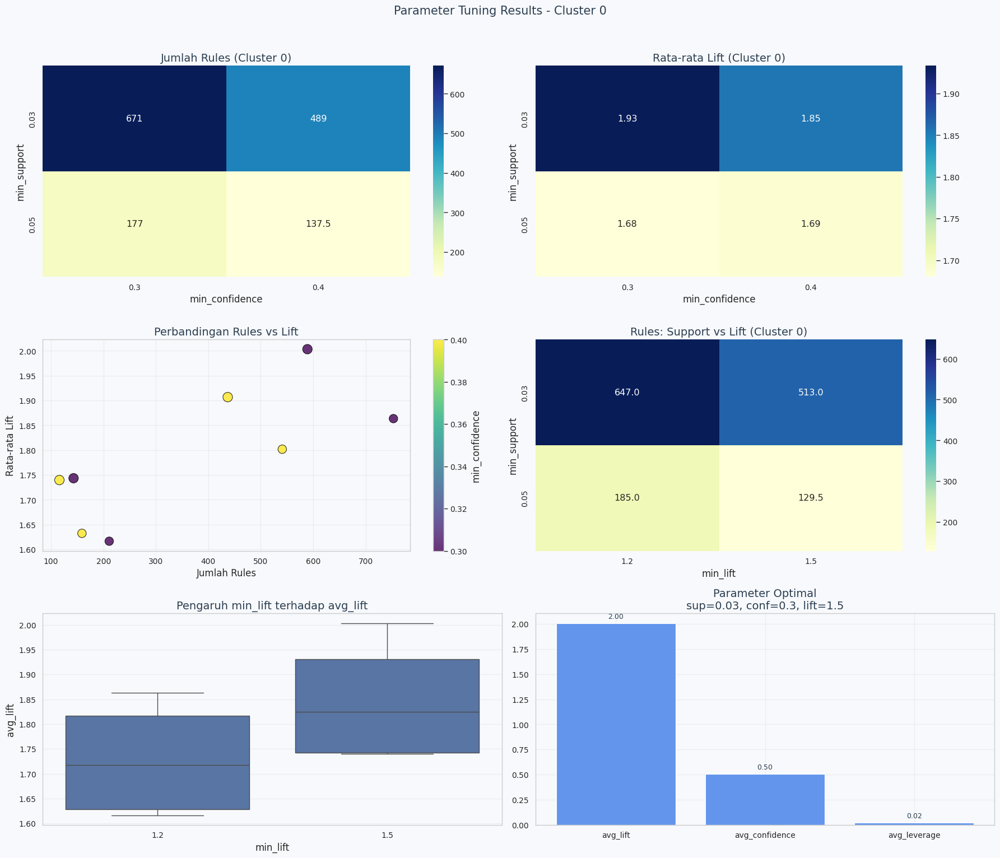

Optimal parameters: support=0.03, confidence=0.3, lift=1.5
Generating rules using column: CategoryExtraction
Ditemukan 551 item dengan min occurrence 5
Encoding 996 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...

Found 589 association rules for Cluster 0

=== SUMMARY CLUSTER 0 ===
Total rules: 589

Top 10 rules (by lift):


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(spice tins),(cake tins),0.04,0.12,0.03,0.77,6.41,1.00,0.03,3.87,0.88,0.26,0.74,0.53
1,(cabinet),(frame),0.07,0.11,0.03,0.43,3.74,1.00,0.02,1.55,0.79,0.19,0.35,0.35
2,"(hot water bottle, box)",(hand warmer),0.08,0.14,0.04,0.46,3.27,1.00,0.03,1.60,0.75,0.20,0.37,0.36
3,(lunch box),"(sign, bag)",0.10,0.13,0.04,0.42,3.24,1.00,0.03,1.49,0.77,0.22,0.33,0.36
4,"(sign, bag)",(lunch box),0.13,0.10,0.04,0.31,3.24,1.00,0.03,1.31,0.79,0.22,0.24,0.36
5,"(sign, box)","(mug, tin)",0.10,0.12,0.04,0.40,3.21,1.00,0.03,1.45,0.76,0.21,0.31,0.35
6,"(mug, tin)","(sign, box)",0.12,0.10,0.04,0.31,3.21,1.00,0.03,1.31,0.78,0.21,0.24,0.35
7,(woolly hottie),(hot water bottle),0.04,0.27,0.03,0.84,3.11,1.00,0.02,4.51,0.71,0.11,0.78,0.48
8,"(hot water bottle, box)","(mug, tin)",0.08,0.12,0.03,0.38,3.04,1.00,0.02,1.40,0.73,0.17,0.29,0.31
9,"(sign, candle)","(mug, t-lights)",0.10,0.10,0.03,0.30,2.96,1.00,0.02,1.28,0.74,0.18,0.22,0.30



5 Best Association Rules:
spice tins -> cake tins (support: 0.034, confidence: 0.773, lift: 6.414)
cabinet -> frame (support: 0.030, confidence: 0.429, lift: 3.744)
hot water bottle & box -> hand warmer (support: 0.037, confidence: 0.462, lift: 3.267)
lunch box -> sign & bag (support: 0.040, confidence: 0.417, lift: 3.242)
sign & bag -> lunch box (support: 0.040, confidence: 0.312, lift: 3.242)

Top 5 Produk sebagai Antecedent:
        Count
index        
tin       130
candle    120
sign      120
bag       115
mug       109

Top 5 Produk sebagai Consequent:
        Count
index        
tin       135
bag        99
sign       91
candle     79
box        69

Metrics Summary:
            min  max  mean  median
support    0.03 0.16  0.04    0.04
confidence 0.30 0.91  0.50    0.50
lift       1.50 6.41  2.00    1.91
leverage   0.01 0.06  0.02    0.02
conviction 1.18 7.16  1.59    1.45

Top 5 produk paling berpengaruh untuk cluster 0:
        Frequency  Avg_Lift  Influence_Score
tin           

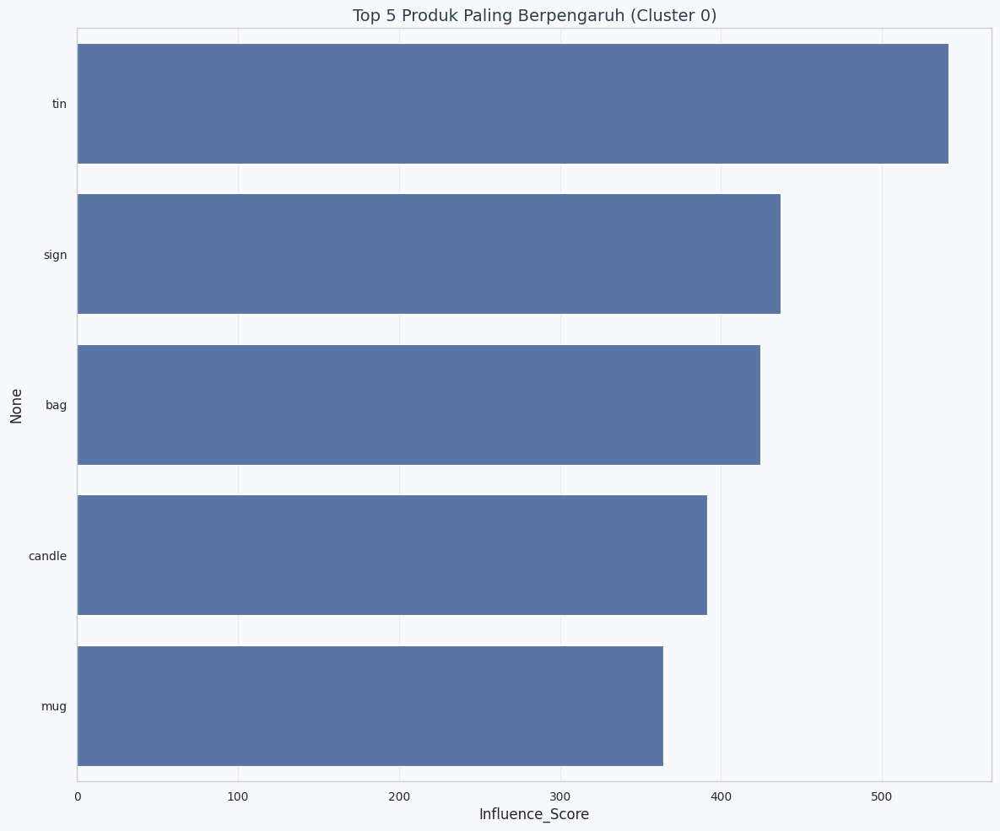

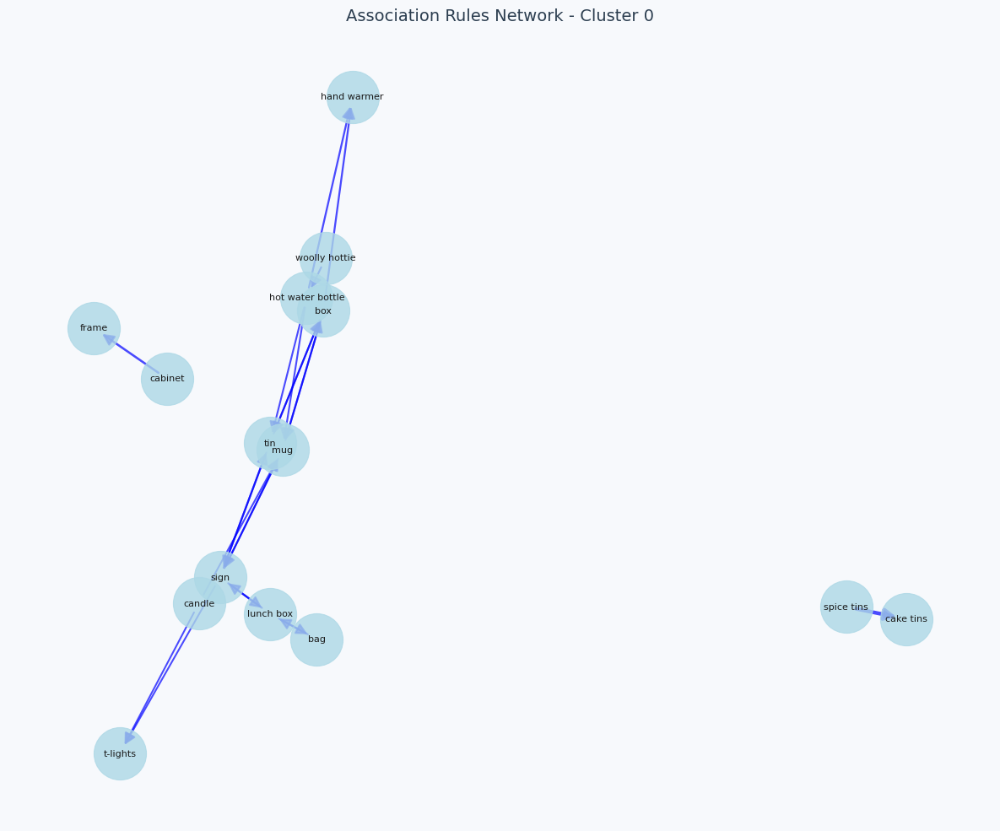


Cluster 0 analysis completed - 589 rules found


In [ ]:
# ===== CLUSTER 0 ANALYSIS =====
print("\n" + "="*60)
print("CLUSTER 0 ANALYSIS")
print("="*60)

cluster_id = 0
rules_cluster0, min_support_0, min_confidence_0, min_lift_0 = run_association_for_cluster(
    df_with_clusters, cluster_id, perform_tuning=True
)

if not rules_cluster0.empty:
    optimal_params[cluster_id] = (min_support_0, min_confidence_0, min_lift_0)
    rules_cluster0['Cluster'] = cluster_id
    all_rules.append(rules_cluster0.copy())
    print(f"\nCluster {cluster_id} analysis completed - {len(rules_cluster0)} rules found")
else:
    print(f"\nNo rules found for Cluster {cluster_id}")
    rules_cluster0 = pd.DataFrame()

**Karakteristik Cluster**

- **Jumlah customer**: 3.552  
- **Transaksi**: 11.419 (disampling jadi 1.000)  
- **Rata-rata item/transaksi**: 14.9  
- **Produk unik setelah filter (min_occurrence ≥ 5)**: 551  
- **Total rule ditemukan**: 589  
- **Min occurrence**: 5  

Cluster ini adalah yang paling besar dari segi customer dan transaksi, menunjukkan kontribusi tinggi terhadap keseluruhan bisnis.

**Contoh Produk yang Dibeli**

- Tin, mug, hot water bottle, lunch box, bag → produk fungsional dan household  
- Candle, t-lights → produk dekoratif atau untuk ambience  
- Spice tins, cake tins → kategori dapur dengan fungsi spesifik  
- Cabinet, frame → elemen dekorasi rumah  

Produk-produk ini punya kesan homey, cozy, dan practical — fokusnya ke kebutuhan sehari-hari atau home aesthetic minimalis.

**Ciri Pola Belanja**

- **Rata-rata lift**: 2.00  
- **Lift maksimum**: 6.41  
- **Rata-rata confidence**: 0.50  
- **Rata-rata conviction**: 1.59  
- **Support**: mostly antara 0.03–0.04  

Artinya pelanggan cenderung membeli produk dengan pola cukup berulang. Lift berada pada tingkat menengah, menunjukkan ada asosiasi signifikan tapi tidak ekstrem. Confidence 0.5 menandakan probabilitas separuh, masih cukup kuat untuk dipertimbangkan dalam cross-sell.

**Network Analysis**

- Produk seperti tin, box, sign, dan mug menjadi simpul penting (hub) dalam network  
- Ada kelompok produk yang saling terkoneksi erat seperti:
  - tin - mug - box - hot water bottle  
  - sign - candle - lunch box - bag  
  - spice tins - cake tins (terpisah dari network utama, tapi sangat kuat liftnya)  

Node-node ini membentuk subkomunitas tematik seperti dapur dan dekorasi ringan.

**Top Influential Products**

1. Tin  
2. Sign  
3. Bag  
4. Candle  
5. Mug  

Produk-produk ini sering muncul sebagai antecedent maupun consequent, artinya sangat sentral dalam rule mining dan menjadi trigger untuk pembelian produk lain.

**Rekomendasi untuk Bisnis**

- Cross-sell set dapur: tin, mug, box, lunch box  
- Bundle dekorasi rumah: candle + sign + t-lights  
- Tampilkan produk sentral seperti *tin* dan *bag* di landing page karena mereka mendorong pembelian lain  
- Gunakan rule *spice tins → cake tins* sebagai dasar rekomendasi dengan lift sangat tinggi  
- Perluas kategori seperti "Cozy Home Essentials" atau "Smart Kitchen Set"  

**Kesimpulan**

Cluster ini berisi pelanggan dengan:
- Pola pembelian stabil dan berulang  
- Ketertarikan pada item fungsional + estetika ringan  
- Strength asosiasi yang cukup kuat untuk strategi rekomendasi  
- Lift & leverage moderate, cocok untuk model rekomendasi rule-based di platform e-commerce  

**Kemungkinan Profil Customer**

- Home organizer: Suka produk-produk yang membuat rumah rapi dan efisien  
- Young adult/home setter*: Baru menempati rumah/kos dan butuh kebutuhan harian  
- Practical shopper: Fokus ke kegunaan barang, tapi tetap memperhatikan estetika


CLUSTER 1 ANALYSIS

Analyzing Cluster 1
Customers: 1954, Transactions: 2497
Performing parameter tuning...
Using full parameter tuning for regular cluster
Memulai parameter tuning untuk Cluster 1...
Min occurrence: 5
Parameter combinations to test: 8
Generating rules using column: CategoryExtraction
Ditemukan 1045 item dengan min occurrence 5
Encoding 2479 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (31152), mengambil 5000 teratas berdasarkan lift
  0.03, 0.3, 1.2: 5000 rules
Generating rules using column: CategoryExtraction
Ditemukan 1045 item dengan min occurrence 5
Encoding 2479 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (31152), mengambil 5000 teratas berdasarkan lift
  0.03, 0.3, 1.5: 5000 rules
Generating rules using column: CategoryExtraction
Ditemukan 1045 item dengan min occurrence 5
Encoding 2479 transaksi
Mencari frequent i

,min_support,min_confidence,min_lift,num_rules,avg_lift,max_lift,avg_confidence,avg_leverage,avg_conviction
0,0.03,0.30,1.20,5000,6.18,10.97,0.51,0.03,2.11
1,0.03,0.30,1.50,5000,6.18,10.97,0.51,0.03,2.11
2,0.03,0.40,1.20,5000,5.79,10.97,0.57,0.03,2.31
3,0.03,0.40,1.50,5000,5.79,10.97,0.57,0.03,2.31
4,0.05,0.30,1.20,4621,2.64,7.85,0.59,0.04,3.24
5,0.05,0.30,1.50,4558,2.65,7.85,0.59,0.04,3.27
6,0.05,0.40,1.20,3640,2.60,7.85,0.65,0.04,3.75
7,0.05,0.40,1.50,3583,2.62,7.85,0.65,0.04,3.79


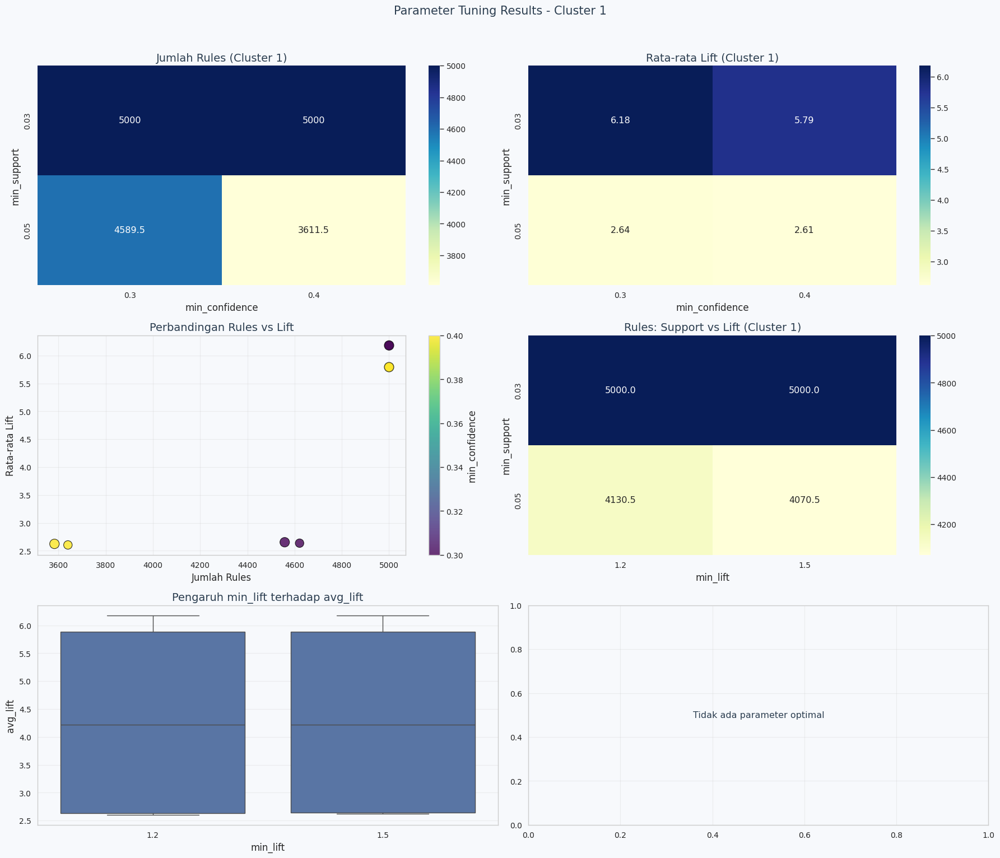

Optimal parameters: support=0.03, confidence=0.3, lift=1.2
Generating rules using column: CategoryExtraction
Ditemukan 1045 item dengan min occurrence 5
Encoding 2479 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (31152), mengambil 5000 teratas berdasarkan lift

Found 5000 association rules for Cluster 1

=== SUMMARY CLUSTER 1 ===
Total rules: 5000

Top 10 rules (by lift):


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,"(tin, roses regency)",(regency teacup),0.04,0.07,0.03,0.75,10.97,1.00,0.03,3.76,0.95,0.39,0.73,0.60
1,(regency teacup),"(tin, roses regency)",0.07,0.04,0.03,0.45,10.97,1.00,0.03,1.73,0.98,0.39,0.42,0.60
2,(roses regency),(regency teacup),0.06,0.07,0.04,0.75,10.94,1.00,0.04,3.73,0.96,0.52,0.73,0.69
3,(regency teacup),(roses regency),0.07,0.06,0.04,0.64,10.94,1.00,0.04,2.58,0.98,0.52,0.61,0.69
4,"(tin, regency teacup)",(roses regency),0.05,0.06,0.03,0.62,10.72,1.00,0.03,2.50,0.95,0.40,0.60,0.58
5,(roses regency),"(tin, regency teacup)",0.06,0.05,0.03,0.53,10.72,1.00,0.03,2.01,0.96,0.40,0.50,0.58
6,"(jumbo vintage, lunch box)","(dotcom postage, frame, bag)",0.06,0.06,0.03,0.56,10.11,1.00,0.03,2.14,0.96,0.40,0.53,0.57
7,"(dotcom postage, frame, bag)","(jumbo vintage, lunch box)",0.06,0.06,0.03,0.59,10.11,1.00,0.03,2.30,0.95,0.40,0.57,0.57
8,"(dotcom postage, frame)","(jumbo vintage, lunch box, bag)",0.06,0.06,0.03,0.59,10.10,1.00,0.03,2.28,0.95,0.40,0.56,0.57
9,"(jumbo vintage, lunch box, bag)","(dotcom postage, frame)",0.06,0.06,0.03,0.56,10.10,1.00,0.03,2.16,0.96,0.40,0.54,0.57



5 Best Association Rules:
tin & roses regency -> regency teacup (support: 0.031, confidence: 0.752, lift: 10.973)
regency teacup -> tin & roses regency (support: 0.031, confidence: 0.447, lift: 10.973)
roses regency -> regency teacup (support: 0.044, confidence: 0.750, lift: 10.937)
regency teacup -> roses regency (support: 0.044, confidence: 0.635, lift: 10.937)
tin & regency teacup -> roses regency (support: 0.031, confidence: 0.623, lift: 10.724)

Top 5 Produk sebagai Antecedent:
       Count
index       
bag     1755
sign    1450
tin     1442
box      974
bowl     952

Top 5 Produk sebagai Consequent:
       Count
index       
bag     1861
tin     1446
sign    1402
bowl     944
plate    867

Metrics Summary:
            min   max  mean  median
support    0.03  0.07  0.04    0.03
confidence 0.30  0.93  0.51    0.49
lift       4.68 10.97  6.18    5.78
leverage   0.02  0.06  0.03    0.03
conviction 1.34 13.21  2.11    1.79

Top 5 produk paling berpengaruh untuk cluster 1:
           

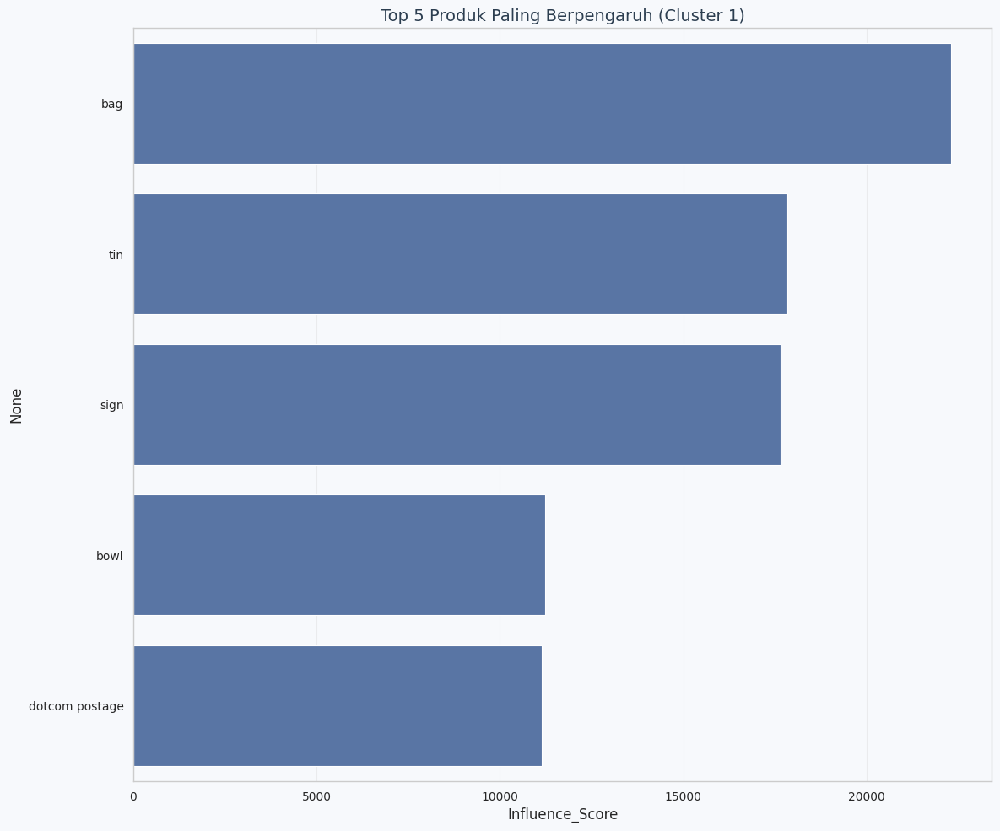

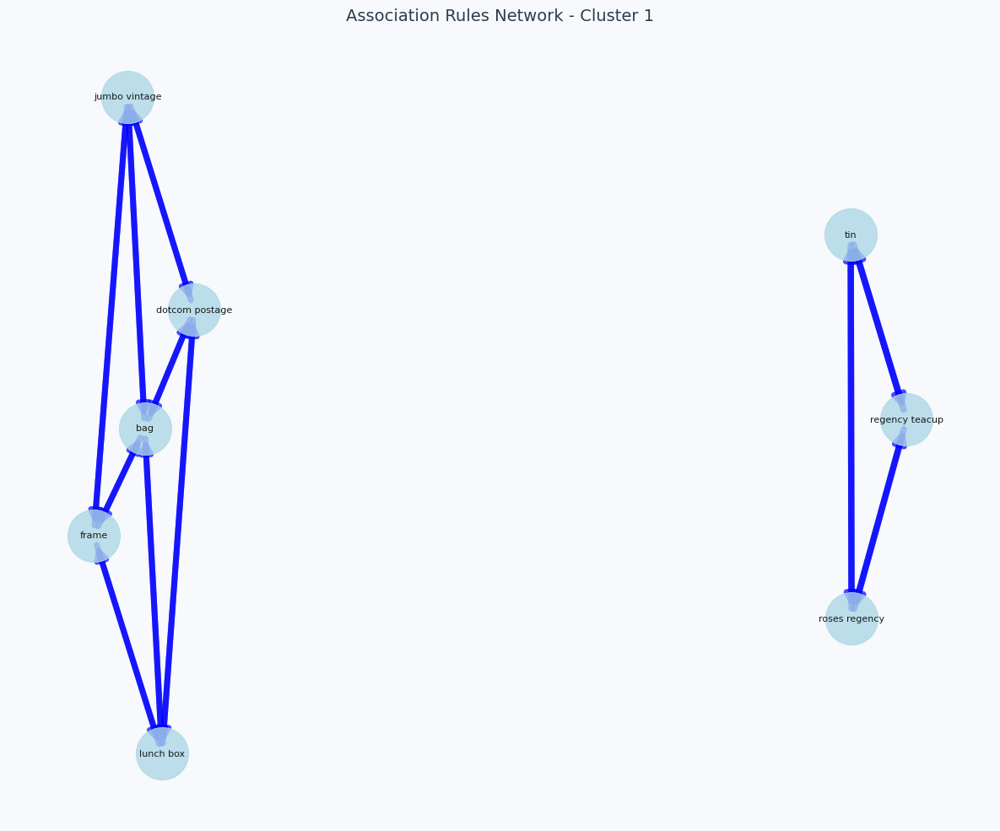


Cluster 1 analysis completed - 5000 rules found


In [ ]:
# ===== CLUSTER 1 ANALYSIS =====
print("\n" + "="*60)
print("CLUSTER 1 ANALYSIS")
print("="*60)

cluster_id = 1
rules_cluster1, min_support_1, min_confidence_1, min_lift_1 = run_association_for_cluster(
    df_with_clusters, cluster_id, perform_tuning=True
)

if not rules_cluster1.empty:
    optimal_params[cluster_id] = (min_support_1, min_confidence_1, min_lift_1)
    rules_cluster1['Cluster'] = cluster_id
    all_rules.append(rules_cluster1.copy())
    print(f"\nCluster {cluster_id} analysis completed - {len(rules_cluster1)} rules found")
else:
    print(f"\nNo rules found for Cluster {cluster_id}")
    rules_cluster1 = pd.DataFrame()

**Karakteristik Cluster**

- **Jumlah customer**: 1.954  
- **Transaksi**: 2.497  
- **Rata-rata item/transaksi**: 17.8  
- **Produk unik setelah filter (min_occurrence ≥ 5)**: 1.045  
- **Total rule ditemukan**: 5.000  
- **Min occurrence**: 5  

Cluster ini cukup besar dan memiliki kepadatan item yang tinggi per transaksi, menunjukkan pelanggan yang belanja dalam jumlah banyak sekaligus.

**Contoh Produk yang Dibeli**

- **Bag, frame, lunch box, dotcom postage** → kebutuhan pengemasan, penyimpanan, dan household
- **Roses regency, regency teacup, tin** → produk estetik dan klasik, condong ke arah dekoratif atau hadiah

Produk yang dibeli memperlihatkan kombinasi antara fungsi dan estetika — ada kesan elegan, feminin, dan cozy. Beberapa produk juga cocok untuk keperluan gift set atau hampers.

**Ciri Pola Belanja**

- **Rata-rata lift**: 6.18  
- **Lift maksimum**: 10.97  
- **Rata-rata confidence**: 0.51  
- **Rata-rata conviction**: 2.11  
- **Support**: mayoritas di 0.03  

Pola belanja pelanggan di cluster ini memperlihatkan asosiasi yang **sangat kuat**, terlihat dari lift > 6 dan banyak rule dengan confidence ≥ 0.5. Ini berarti pelanggan cenderung membeli produk secara **berpasangan atau dalam set tertentu** yang konsisten.

**Network Analysis**

- Ada dua **komunitas produk utama** yang sangat kuat:
  - *frame - lunch box - dotcom postage - bag - jumbo vintage*
  - *roses regency - regency teacup - tin*

- Kedua grup tersebut **terpisah** dalam network, menandakan **dua jenis kebutuhan atau gaya belanja berbeda**: satu lebih fungsional-praktis, satu lagi estetik-dekoratif

- Produk seperti **bag**, **dotcom postage**, dan **regency teacup** jadi **hub sentral** yang mengaitkan produk lain dalam rule association

**Top Influential Products**

1. **Bag**  
2. **Tin**  
3. **Sign**  
4. **Bowl**  
5. **Dotcom Postage**

Produk-produk ini memiliki skor influence tinggi karena sering muncul baik sebagai antecedent maupun consequent, dengan lift yang konsisten tinggi.

**Rekomendasi untuk Bisnis**

- Buat **bundle praktis**: bag + lunch box + dotcom postage untuk kebutuhan pengiriman atau storage  
- Buat **paket hadiah/estetik**: roses regency + regency teacup + tin  
- Tampilkan *bag* dan *tin* di rekomendasi utama (homepage/checkout) karena keduanya sering muncul dalam kombinasi yang mendorong pembelian lain  
- Soroti dua kategori curated berbeda:  
  - **"Classy Gift Set"** (roses regency, tin, teacup)  
  - **"Everyday Organizer"** (bag, lunch box, frame)

**Kesimpulan**

Cluster ini memiliki pelanggan dengan:
- Preferensi tinggi terhadap produk yang **salin mendukung** (strong lift)
- Pola belanja **tersegmentasi secara tematik** (fungsi vs estetika)
- Sangat cocok digunakan dalam strategi **rekomendasi berbasis rule** dan **curated collection**

**Kemungkinan Profil Customer**

- *The gifter*: Suka membeli produk yang cocok dijadikan hadiah atau paket  
- *Efficient packer*: Fokus ke pengemasan dan alat penyimpanan rumah  
- *Stylish organizer*: Kombinasi gaya dan fungsi, suka produk yang cantik sekaligus berguna


CLUSTER 2 ANALYSIS

Analyzing Cluster 2
Customers: 9, Transactions: 1019
Performing parameter tuning...
Using full parameter tuning for regular cluster
Memulai parameter tuning untuk Cluster 2...
Min occurrence: 5
Parameter combinations to test: 8
Generating rules using column: CategoryExtraction
Ditemukan 713 item dengan min occurrence 5
Encoding 1013 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (7003), mengambil 5000 teratas berdasarkan lift
  0.03, 0.3, 1.2: 5000 rules
Generating rules using column: CategoryExtraction
Ditemukan 713 item dengan min occurrence 5
Encoding 1013 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (7003), mengambil 5000 teratas berdasarkan lift
  0.03, 0.3, 1.5: 5000 rules
Generating rules using column: CategoryExtraction
Ditemukan 713 item dengan min occurrence 5
Encoding 1013 transaksi
Mencari frequent itemsets 

,min_support,min_confidence,min_lift,num_rules,avg_lift,max_lift,avg_confidence,avg_leverage,avg_conviction
0,0.03,0.30,1.20,5000,2.50,14.60,0.53,0.02,2.47
1,0.03,0.30,1.50,5000,2.50,14.60,0.53,0.02,2.47
2,0.03,0.40,1.20,5000,2.23,14.60,0.64,0.02,2.88
3,0.03,0.40,1.50,4883,2.25,14.60,0.64,0.02,2.91
4,0.05,0.30,1.20,1514,1.89,3.82,0.56,0.03,1.96
5,0.05,0.30,1.50,1317,1.96,3.82,0.55,0.03,2.02
6,0.05,0.40,1.20,1150,1.85,3.82,0.63,0.03,2.18
7,0.05,0.40,1.50,979,1.93,3.82,0.63,0.03,2.28


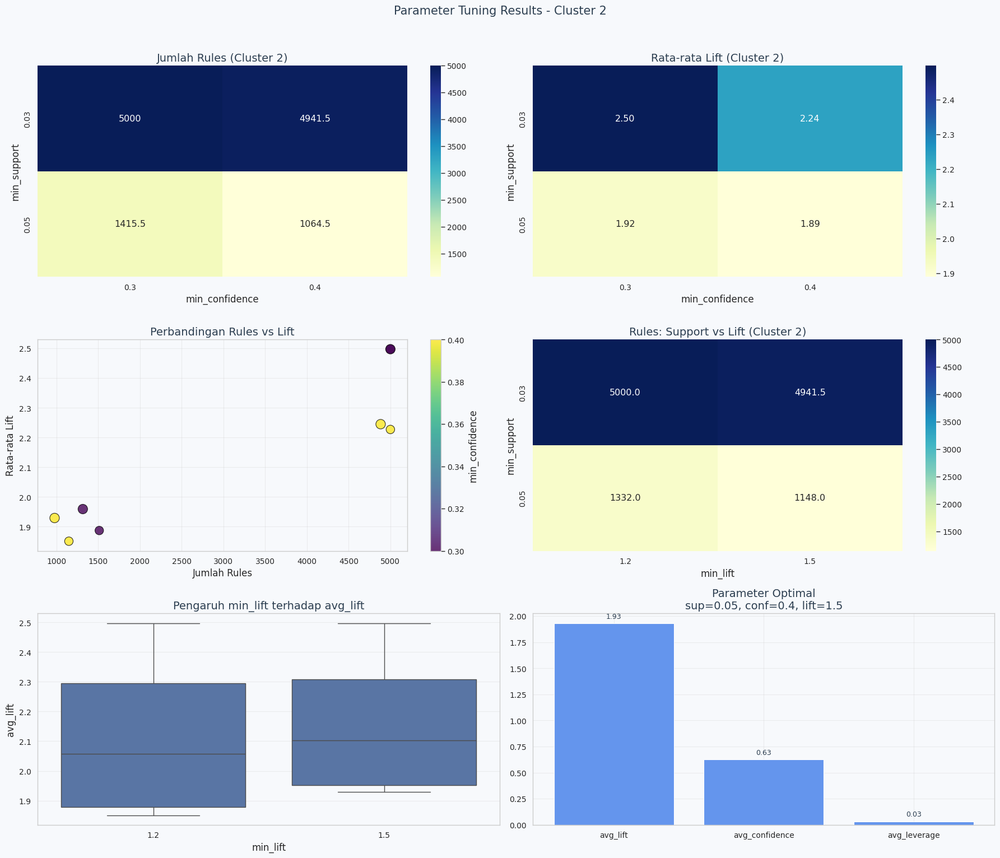

Optimal parameters: support=0.05, confidence=0.4, lift=1.5
Generating rules using column: CategoryExtraction
Ditemukan 713 item dengan min occurrence 5
Encoding 1013 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.4...

Found 979 association rules for Cluster 2

=== SUMMARY CLUSTER 2 ===
Total rules: 979

Top 10 rules (by lift):


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(babushka notebook),"(drawer knob, tin, bag)",0.11,0.12,0.05,0.46,3.82,1.00,0.04,1.63,0.83,0.28,0.39,0.44
1,"(drawer knob, tin, bag)",(babushka notebook),0.12,0.11,0.05,0.42,3.82,1.00,0.04,1.53,0.84,0.28,0.35,0.44
2,"(tin, babushka notebook)","(drawer knob, bag)",0.09,0.16,0.05,0.59,3.64,1.00,0.04,2.03,0.79,0.26,0.51,0.45
3,"(babushka notebook, bag)","(drawer knob, tin)",0.10,0.14,0.05,0.52,3.61,1.00,0.04,1.78,0.80,0.26,0.44,0.43
4,(babushka notebook),"(drawer knob, bag)",0.11,0.16,0.06,0.55,3.42,1.00,0.04,1.86,0.79,0.29,0.46,0.46
5,(babushka notebook),"(drawer knob, tin)",0.11,0.14,0.05,0.49,3.38,1.00,0.04,1.67,0.79,0.27,0.40,0.43
6,"(tin, frame)","(drawer knob, bag)",0.10,0.16,0.05,0.51,3.17,1.00,0.04,1.71,0.76,0.25,0.42,0.42
7,"(tin, babushka notebook, bag)",(drawer knob),0.08,0.20,0.05,0.63,3.11,1.00,0.03,2.15,0.74,0.22,0.54,0.44
8,"(babushka notebook, bag)",(drawer knob),0.10,0.20,0.06,0.62,3.08,1.00,0.04,2.11,0.75,0.25,0.53,0.46
10,"(tin, babushka notebook)",(drawer knob),0.09,0.20,0.05,0.62,3.07,1.00,0.04,2.10,0.74,0.23,0.52,0.44



5 Best Association Rules:
babushka notebook -> drawer knob & tin & bag (support: 0.050, confidence: 0.459, lift: 3.815)
drawer knob & tin & bag -> babushka notebook (support: 0.050, confidence: 0.418, lift: 3.815)
tin & babushka notebook -> drawer knob & bag (support: 0.050, confidence: 0.586, lift: 3.643)
babushka notebook & bag -> drawer knob & tin (support: 0.050, confidence: 0.520, lift: 3.611)
babushka notebook -> drawer knob & bag (support: 0.060, confidence: 0.550, lift: 3.415)

Top 5 Produk sebagai Antecedent:
          Count
index          
bag         303
tin         278
sign        274
candle      187
t-lights    180

Top 5 Produk sebagai Consequent:
          Count
index          
bag         365
tin         315
sign        235
candle      126
t-lights    112

Metrics Summary:
            min   max  mean  median
support    0.05  0.20  0.07    0.06
confidence 0.40  1.00  0.63    0.60
lift       1.50  3.82  1.93    1.84
leverage   0.02  0.09  0.03    0.03
conviction 1.25 25.

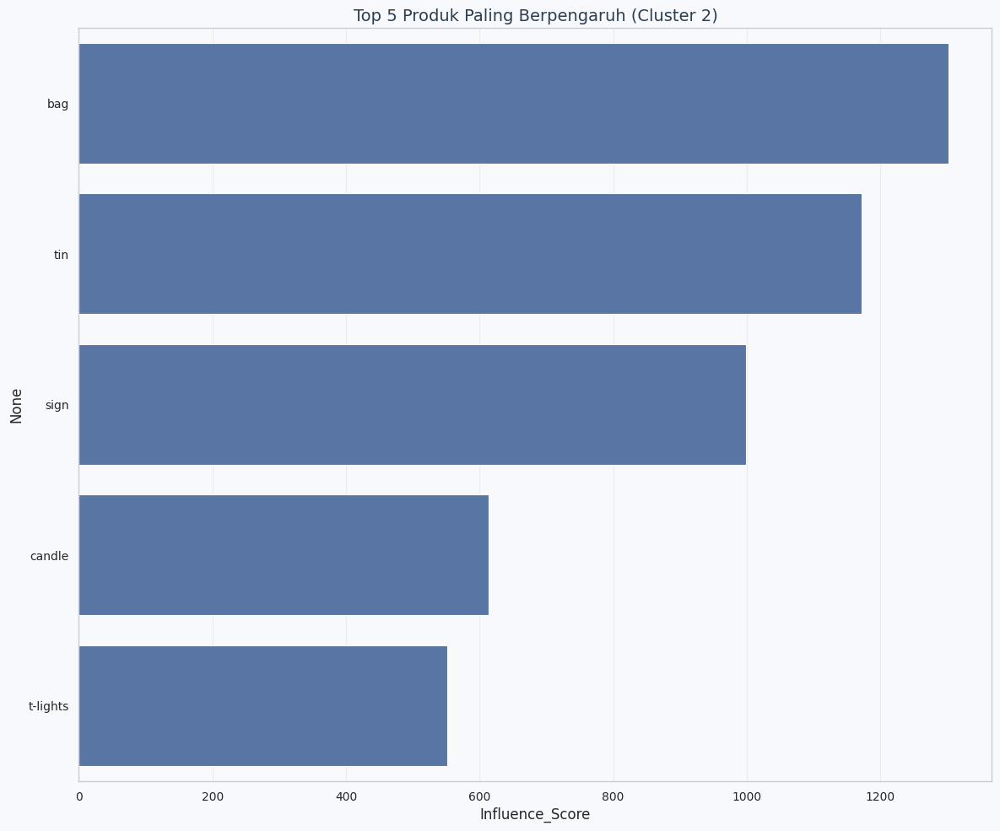

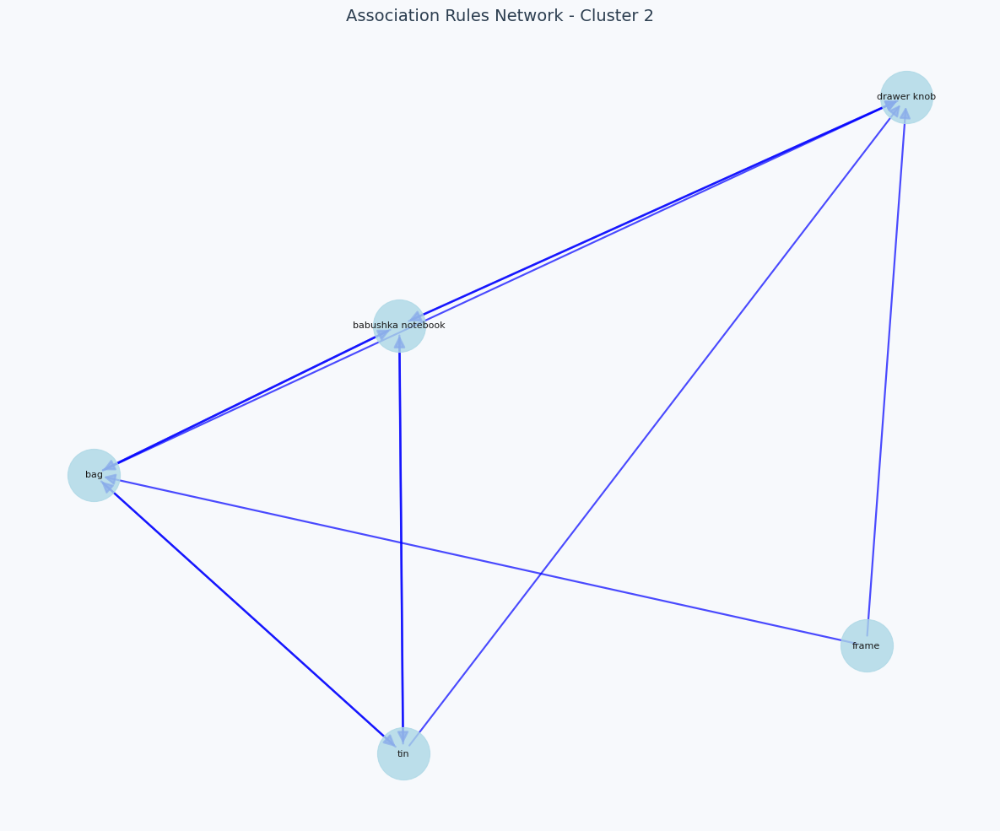


Cluster 2 analysis completed - 979 rules found


In [ ]:
# ===== CLUSTER 2 ANALYSIS =====
print("\n" + "="*60)
print("CLUSTER 2 ANALYSIS")
print("="*60)

cluster_id = 2
rules_cluster2, min_support_2, min_confidence_2, min_lift_2 = run_association_for_cluster(
    df_with_clusters, cluster_id, perform_tuning=True
)

if not rules_cluster2.empty:
    optimal_params[cluster_id] = (min_support_2, min_confidence_2, min_lift_2)
    rules_cluster2['Cluster'] = cluster_id
    all_rules.append(rules_cluster2.copy())
    print(f"\nCluster {cluster_id} analysis completed - {len(rules_cluster2)} rules found")
else:
    print(f"\nNo rules found for Cluster {cluster_id}")
    rules_cluster2 = pd.DataFrame()

**Karakteristik Cluster**

- **Jumlah customer**: 9  
- **Transaksi**: 1.019  
- **Rata-rata item/transaksi**: ~12.6  
- **Produk unik setelah filter (min_occurrence ≥ 5)**: 713  
- **Total rule ditemukan**: 979  
- **Min occurrence**: 5  

Cluster ini sangat kecil dari sisi jumlah customer, tapi tiap transaksi cukup padat. Cocok dianalisis sebagai niche cluster dengan preferensi pembelian yang spesifik.

**Contoh Produk yang Dibeli**

- **Babushka notebook, drawer knob, tin, frame** → produk dengan nilai estetik unik, home decor, atau stationary
- **Bag, sign, candle, t-lights** → fungsional dan dekoratif ringan

Produk-produk ini mengarah ke kombinasi antara aksesoris rumah dan personal items yang artsy atau quirky, dengan sentuhan feminin dan craft-style.

**Ciri Pola Belanja**

- **Rata-rata lift**: 1.93  
- **Lift maksimum**: 3.82  
- **Rata-rata confidence**: 0.63  
- **Rata-rata conviction**: 2.28  
- **Support**: rata-rata 0.05–0.06  

Meskipun asosiasi antar produk tidak sekuat cluster sebelumnya, **confidence tergolong tinggi**, artinya pelanggan dalam cluster ini cukup konsisten membeli produk secara berpasangan.

**Network Analysis**

- Produk seperti **bag**, **drawer knob**, dan **babushka notebook** merupakan simpul dominan
- Banyak edge saling menyilang antar 4–5 node, membentuk **network kecil tapi padat**
- Struktur network menunjukkan **komunitas item bertema dekoratif dan personal gifting** yang kuat

**Top Influential Products**

1. **Bag**  
2. **Tin**  
3. **Sign**  
4. **Candle**  
5. **T-lights**

Produk-produk ini punya skor pengaruh tinggi, meskipun frekuensinya lebih rendah dibanding cluster lain, karena lift dan confidence relatif stabil.

**Rekomendasi untuk Bisnis**

- Ciptakan curated section seperti **"Cozy Desk Setup"** (babushka notebook, candle, t-lights)  
- Tawarkan **gift set kecil** berisi bag + tin + drawer knob, cocok untuk segmentasi pelanggan estetika  
- Fokus pada **rekomendasi berpasangan dengan confidence tinggi**, meskipun lift sedang  
- **Eksplorasi upsell artistik atau customisasi** karena cluster ini menunjukkan ketertarikan pada produk non-mainstream

**Kesimpulan**

Cluster ini terdiri dari:
- Pelanggan yang jumlahnya sedikit tapi punya preferensi kuat
- Cenderung membeli produk **unik dan dekoratif** secara konsisten  
- Cocok untuk strategi **custom campaign** atau **aesthetic bundles**
- Kombinasi lift sedang tapi confidence tinggi membuatnya cocok untuk rekomendasi produk tematik

**Kemungkinan Profil Customer**

- *Creative gift giver*: Sering beli produk yang unik untuk hadiah atau kebutuhan personal  
- *Aesthetic seeker*: Fokus ke tampilan dan keunikan produk  
- *Minimalist decorator*: Suka sentuhan kecil yang mengubah suasana rumah tanpa banyak item besar


CLUSTER 3 ANALYSIS

Analyzing Cluster 3
Customers: 5, Transactions: 202
Performing parameter tuning...
Using full parameter tuning for regular cluster
Memulai parameter tuning untuk Cluster 3...
Min occurrence: 3
Parameter combinations to test: 8
Generating rules using column: CategoryExtraction
Ditemukan 223 item dengan min occurrence 3
Encoding 197 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (192186), mengambil 5000 teratas berdasarkan lift
  0.03, 0.3, 1.2: 5000 rules
Generating rules using column: CategoryExtraction
Ditemukan 223 item dengan min occurrence 3
Encoding 197 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (192186), mengambil 5000 teratas berdasarkan lift
  0.03, 0.3, 1.5: 5000 rules
Generating rules using column: CategoryExtraction
Ditemukan 223 item dengan min occurrence 3
Encoding 197 transaksi
Mencari frequent itemsets 

,min_support,min_confidence,min_lift,num_rules,avg_lift,max_lift,avg_confidence,avg_leverage,avg_conviction
0,0.03,0.30,1.20,5000,22.29,32.83,0.85,0.03,9.40
1,0.03,0.30,1.50,5000,22.29,32.83,0.85,0.03,9.40
2,0.03,0.40,1.20,5000,22.29,32.83,0.85,0.03,9.40
3,0.03,0.40,1.50,5000,22.29,32.83,0.85,0.03,9.40
4,0.05,0.30,1.20,5000,5.84,17.91,0.61,0.05,3.55
5,0.05,0.30,1.50,5000,5.84,17.91,0.61,0.05,3.55
6,0.05,0.40,1.20,5000,5.56,17.91,0.70,0.05,5.15
7,0.05,0.40,1.50,5000,5.56,17.91,0.70,0.05,5.15


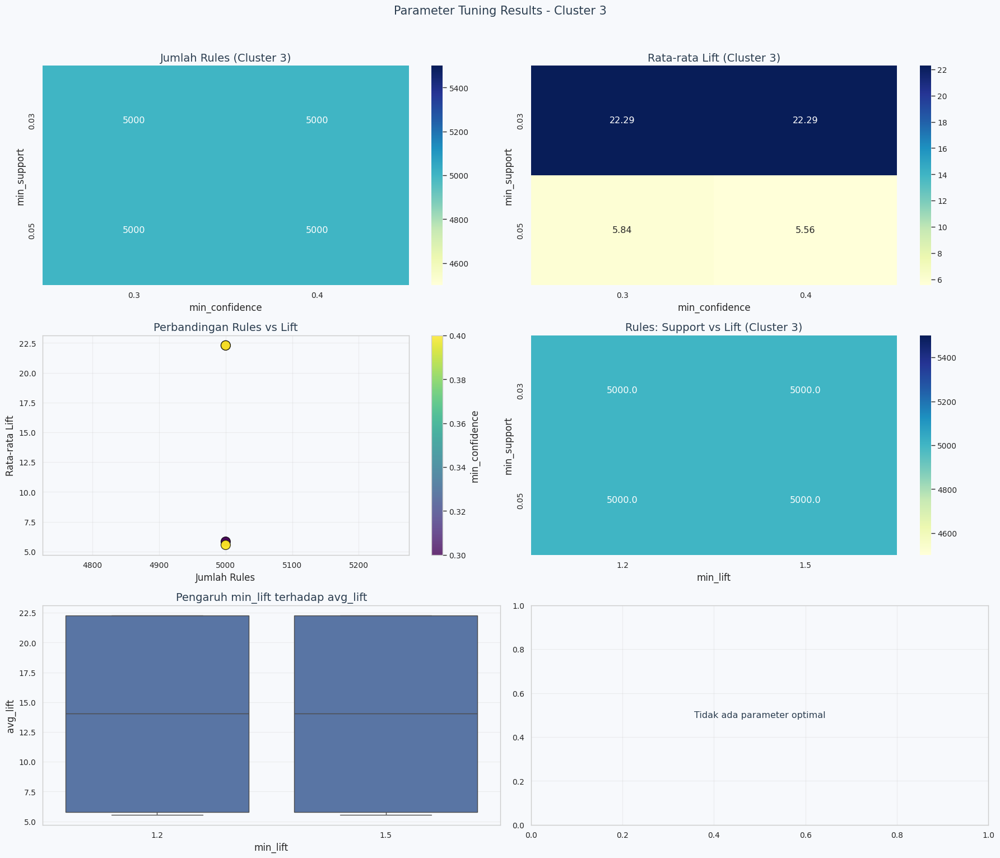

Optimal parameters: support=0.03, confidence=0.3, lift=1.2
Generating rules using column: CategoryExtraction
Ditemukan 223 item dengan min occurrence 3
Encoding 197 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (192186), mengambil 5000 teratas berdasarkan lift

Found 5000 association rules for Cluster 3

=== SUMMARY CLUSTER 3 ===
Total rules: 5000

Top 10 rules (by lift):


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
38,"(lunch box, baking, regency cakestand, tin, bag)","(napkin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
41,"(regency cakestand, lunch box, baking, bag)","(napkin, tin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
14,"(regency cakestand, lunch box, baking, bag)","(napkin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
44,"(regency cakestand, tin, baking, bag)","(napkin, lunch box, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
22,"(regency cakestand, tin, baking, bag)","(napkin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
49,"(regency cakestand, baking, bag)","(napkin, lunch box, tin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
18,"(regency cakestand, baking, bag)","(napkin, lunch box, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
25,"(regency cakestand, baking, bag)","(napkin, tin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
2,"(regency cakestand, baking, bag)","(napkin, roses regency)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00
172,"(lunch box, sign, bread bin, round snack, tin,...","(spaceboy birthday, food container)",0.03,0.03,0.03,1.00,32.83,1.00,0.03,18.02,1.00,1.00,1.00,1.00



5 Best Association Rules:
lunch box & baking & regency cakestand & tin & bag -> napkin & roses regency (support: 0.030, confidence: 1.000, lift: 32.833)
regency cakestand & lunch box & baking & bag -> napkin & tin & roses regency (support: 0.030, confidence: 1.000, lift: 32.833)
regency cakestand & lunch box & baking & bag -> napkin & roses regency (support: 0.030, confidence: 1.000, lift: 32.833)
regency cakestand & tin & baking & bag -> napkin & lunch box & roses regency (support: 0.030, confidence: 1.000, lift: 32.833)
regency cakestand & tin & baking & bag -> napkin & roses regency (support: 0.030, confidence: 1.000, lift: 32.833)

Top 5 Produk sebagai Antecedent:
                   Count
index                   
tin                 1524
bag                 1475
lunch box           1333
sign                1162
spaceboy birthday    949

Top 5 Produk sebagai Consequent:
                   Count
index                   
tin                 1524
bag                 1513
lunch box    

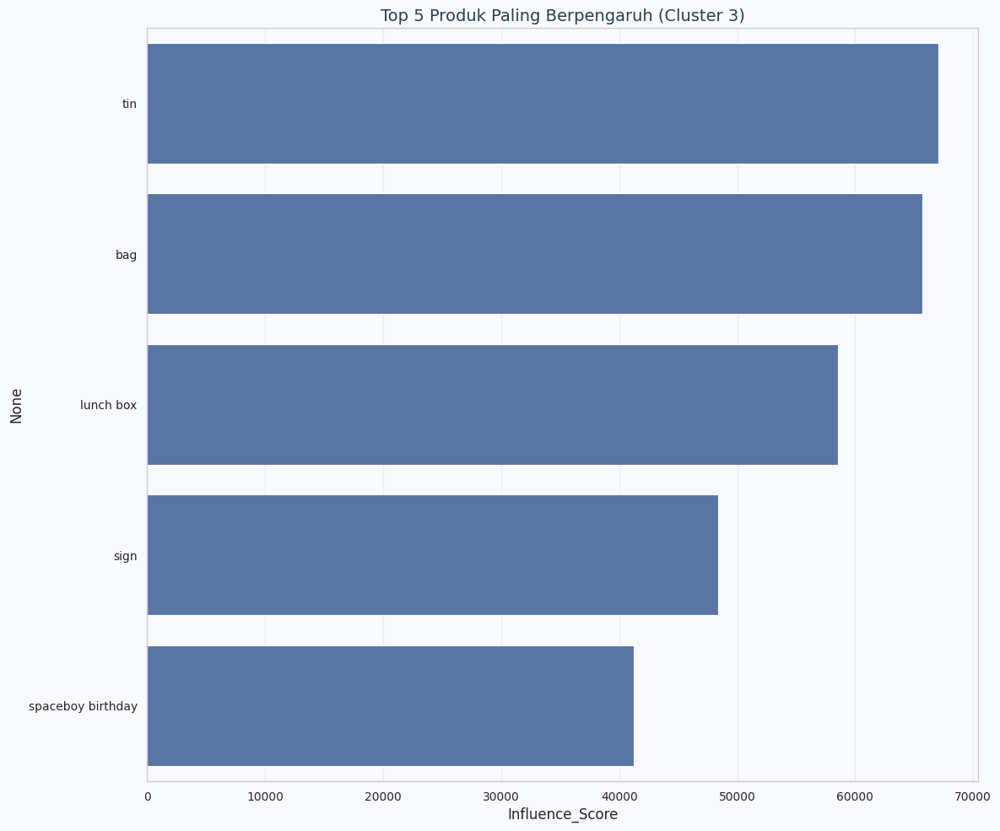

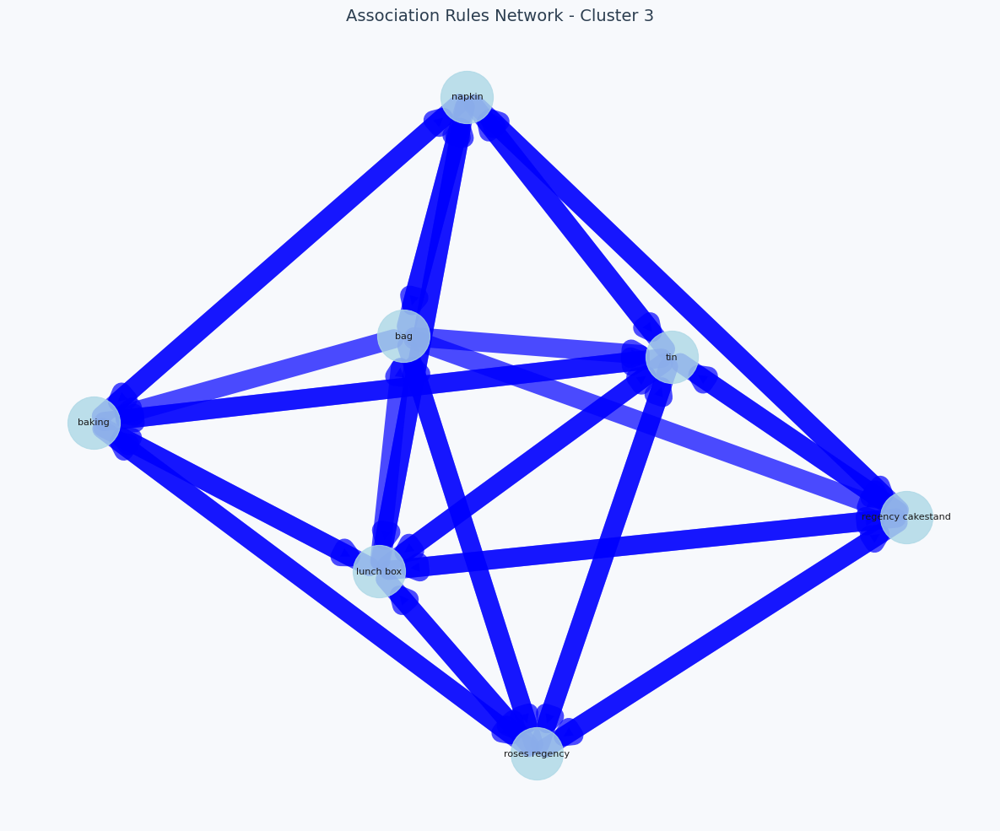


Cluster 3 analysis completed - 5000 rules found


In [ ]:
# ===== CLUSTER 3 ANALYSIS =====
print("\n" + "="*60)
print("CLUSTER 3 ANALYSIS")
print("="*60)

cluster_id = 3
rules_cluster3, min_support_3, min_confidence_3, min_lift_3 = run_association_for_cluster(
    df_with_clusters, cluster_id, perform_tuning=True
)

if not rules_cluster3.empty:
    optimal_params[cluster_id] = (min_support_3, min_confidence_3, min_lift_3)
    rules_cluster3['Cluster'] = cluster_id
    all_rules.append(rules_cluster3.copy())
    print(f"\nCluster {cluster_id} analysis completed - {len(rules_cluster3)} rules found")
else:
    print(f"\nNo rules found for Cluster {cluster_id}")
    rules_cluster3 = pd.DataFrame()

**Karakteristik Cluster**

- **Jumlah customer**: 5  
- **Transaksi**: 202  
- **Rata-rata item/transaksi**: sangat tinggi (>17)  
- **Produk unik setelah filter (min_occurrence ≥ 3)**: 223  
- **Total rule ditemukan**: 5.000  
- **Min occurrence**: 3  

Cluster ini sangat kecil dari sisi jumlah customer dan transaksi, tapi luar biasa padat. Terlihat ada pola belanja **yang sangat konsisten dan kuat**, mirip bulk-buyer atau pelanggan loyal untuk jenis produk tertentu.

**Contoh Produk yang Dibeli**

- **Baking, lunch box, tin, napkin, bag, regency cakestand** → peralatan dapur, penyimpanan makanan, dan perlengkapan dekoratif
- **Roses regency, spaceboy birthday** → produk tematik dan dekoratif khas untuk acara atau tema tertentu

Kumpulan produk ini menunjukkan preferensi ke arah *preparation-based shopping*, misalnya untuk acara, pesta, atau hampers.

**Ciri Pola Belanja**

- **Rata-rata lift**: 22.29  
- **Lift maksimum**: 32.83  
- **Rata-rata confidence**: 0.85  
- **Rata-rata conviction**: 9.40  
- **Support**: rata-rata 0.03  

Cluster ini memiliki **asosiasi produk yang sangat kuat dan nyaris absolut**. Banyak rule dengan **confidence = 1.0**, artinya pelanggan dalam cluster ini **selalu** membeli item tertentu secara bersamaan. Lift > 20 adalah sinyal ekstrem untuk kolerasi, cocok digunakan dalam campaign rekomendasi super-spesifik.

**Network Analysis**

- Struktur network sangat rapat dan terhubung penuh. Produk seperti **tin**, **bag**, dan **lunch box** saling berkaitan kuat dengan item lainnya seperti **baking**, **napkin**, dan **regency cakestand**
- Hampir semua simpul terhubung dua arah dengan tebal edge besar, mencerminkan **asosiasi mutual yang kuat**
- Kombinasi produk menunjukkan pola belanja **bertema acara rumah atau hampers kitchen gift**

**Top Influential Products**

1. **Tin**  
2. **Bag**  
3. **Lunch box**  
4. **Sign**  
5. **Spaceboy birthday**

Item-item ini muncul secara masif sebagai antecedent dan consequent, memiliki skor lift yang ekstrem, dan menjadi core penghubung dalam network.

**Rekomendasi untuk Bisnis**

- **Bundle tema kitchen & party**: baking + tin + napkin + regency cakestand  
- Buat curated collection seperti **"Luxury Kitchen Gift Set"** atau **"Home Baking Essentials"**
- Gunakan *napkin*, *lunch box*, dan *tin* sebagai produk utama untuk starter recommendations
- Cocokkan campaign dengan event musiman (e.g., ulang tahun, natal) karena item seperti **spaceboy birthday** muncul cukup sering
- Jalankan strategi upsell dengan paket besar karena pembelian pelanggan ini cenderung dalam jumlah banyak dan kombinasi lengkap

**Kesimpulan**

Cluster ini sangat khas:
- Pelanggan yang jarang tapi memiliki **pola pembelian absolut dan berulang**  
- Lift dan confidence ekstrem, cocok untuk campaign yang **highly targeted**
- Network graph menunjukkan komunitas produk yang hampir sepenuhnya terintegrasi  
- Sangat cocok untuk curated experiences dan event-based marketing

**Kemungkinan Profil Customer**

- *Event planner*: Belanja untuk keperluan acara (dekorasi, penyajian, paket makanan)  
- *Gifting enthusiast*: Fokus ke aesthetic hamper dengan set produk lengkap  
- *Professional organizer*: Suka merancang tampilan meja, pesta rumah, dan kitchen gift dengan tone tertentu


CLUSTER 4 ANALYSIS

Analyzing Cluster 4
Customers: 236, Transactions: 4809
Large cluster detected. Sampling 1000 from 4809 transactions
After sampling: 1000 transactions
Performing parameter tuning...
Using full parameter tuning for regular cluster
Memulai parameter tuning untuk Cluster 4...
Min occurrence: 5
Parameter combinations to test: 8
Generating rules using column: CategoryExtraction
Ditemukan 456 item dengan min occurrence 5
Encoding 992 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
  0.03, 0.3, 1.2: 503 rules
Generating rules using column: CategoryExtraction
Ditemukan 456 item dengan min occurrence 5
Encoding 992 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
  0.03, 0.3, 1.5: 420 rules
Generating rules using column: CategoryExtraction
Ditemukan 456 item dengan min occurrence 5
Encoding 992 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_c

,min_support,min_confidence,min_lift,num_rules,avg_lift,max_lift,avg_confidence,avg_leverage,avg_conviction
0,0.03,0.30,1.20,503,2.05,16.65,0.50,0.02,1.58
1,0.03,0.30,1.50,420,2.18,16.65,0.51,0.02,1.64
2,0.03,0.40,1.20,361,2.02,16.65,0.56,0.02,1.70
3,0.03,0.40,1.50,301,2.15,16.65,0.57,0.02,1.79
4,0.05,0.30,1.20,106,1.63,2.12,0.48,0.03,1.38
5,0.05,0.30,1.50,67,1.77,2.12,0.50,0.03,1.47
6,0.05,0.40,1.20,80,1.63,2.12,0.52,0.03,1.44
7,0.05,0.40,1.50,51,1.76,2.12,0.54,0.03,1.54


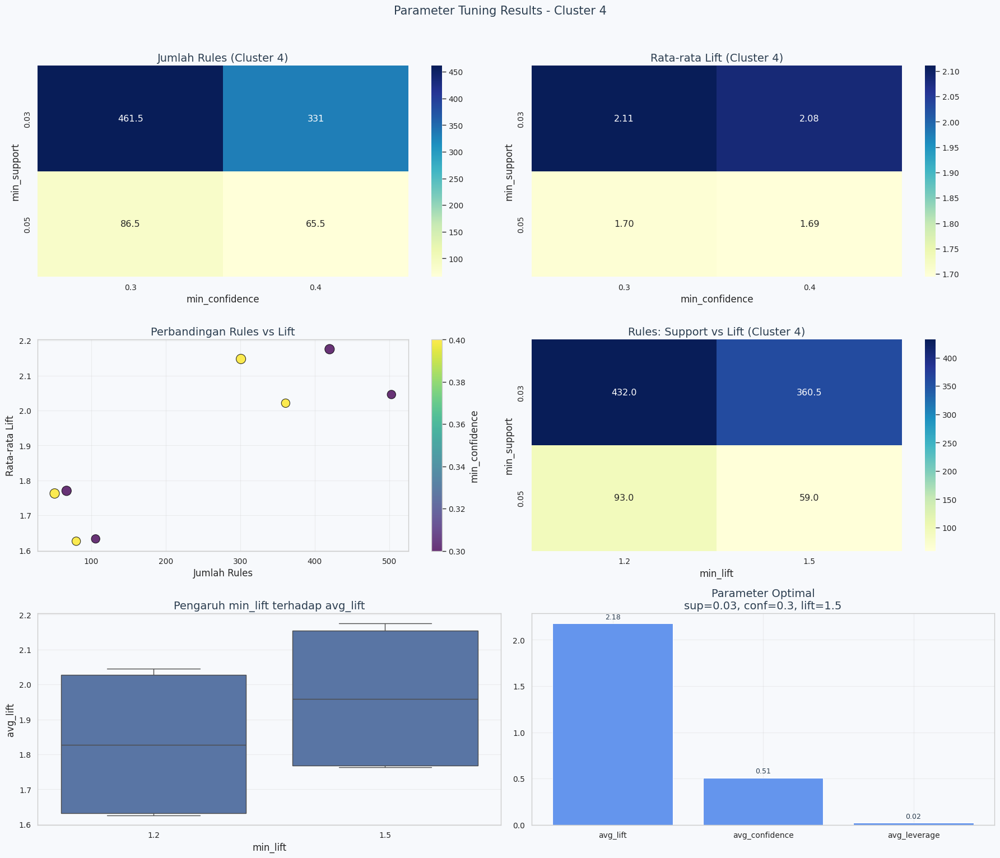

Optimal parameters: support=0.03, confidence=0.3, lift=1.5
Generating rules using column: CategoryExtraction
Ditemukan 456 item dengan min occurrence 5
Encoding 992 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...

Found 420 association rules for Cluster 4

=== SUMMARY CLUSTER 4 ===
Total rules: 420

Top 10 rules (by lift):


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(roses regency),(regency teacup),0.05,0.05,0.04,0.82,16.65,1.00,0.04,5.35,0.98,0.65,0.81,0.79
1,(regency teacup),(roses regency),0.05,0.05,0.04,0.76,16.65,1.00,0.04,3.90,0.99,0.65,0.74,0.79
2,"(t-lights, frame)",(cabinet),0.07,0.09,0.03,0.47,5.19,1.00,0.03,1.72,0.87,0.25,0.42,0.41
3,(cabinet),"(t-lights, frame)",0.09,0.07,0.03,0.36,5.19,1.00,0.03,1.45,0.89,0.25,0.31,0.41
4,(plate),"(bowl, bag)",0.07,0.08,0.03,0.43,5.08,1.00,0.03,1.61,0.87,0.25,0.38,0.40
5,"(bowl, bag)",(plate),0.08,0.07,0.03,0.37,5.08,1.00,0.03,1.47,0.88,0.25,0.32,0.40
6,(spice tins),(cake tins),0.06,0.14,0.04,0.68,4.88,1.00,0.03,2.72,0.84,0.25,0.63,0.48
7,(woolly hottie),(hot water bottle),0.05,0.20,0.05,0.92,4.68,1.00,0.04,10.04,0.83,0.23,0.90,0.58
8,"(cabinet, t-lights)",(frame),0.06,0.12,0.03,0.56,4.56,1.00,0.03,2.00,0.83,0.22,0.50,0.41
9,(plate),(napkin),0.07,0.11,0.03,0.47,4.42,1.00,0.03,1.69,0.83,0.24,0.41,0.40



5 Best Association Rules:
roses regency -> regency teacup (support: 0.037, confidence: 0.822, lift: 16.646)
regency teacup -> roses regency (support: 0.037, confidence: 0.755, lift: 16.646)
t-lights & frame -> cabinet (support: 0.032, confidence: 0.471, lift: 5.187)
cabinet -> t-lights & frame (support: 0.032, confidence: 0.356, lift: 5.187)
plate -> bowl & bag (support: 0.031, confidence: 0.431, lift: 5.085)

Top 5 Produk sebagai Antecedent:
          Count
index          
t-lights     95
tin          92
bag          91
sign         79
mug          76

Top 5 Produk sebagai Consequent:
          Count
index          
tin          94
bag          80
t-lights     80
sign         64
mug          46

Metrics Summary:
            min   max  mean  median
support    0.03  0.12  0.04    0.04
confidence 0.30  0.92  0.51    0.51
lift       1.50 16.65  2.18    1.94
leverage   0.01  0.04  0.02    0.02
conviction 1.15 10.04  1.64    1.48

Top 5 produk paling berpengaruh untuk cluster 4:
          

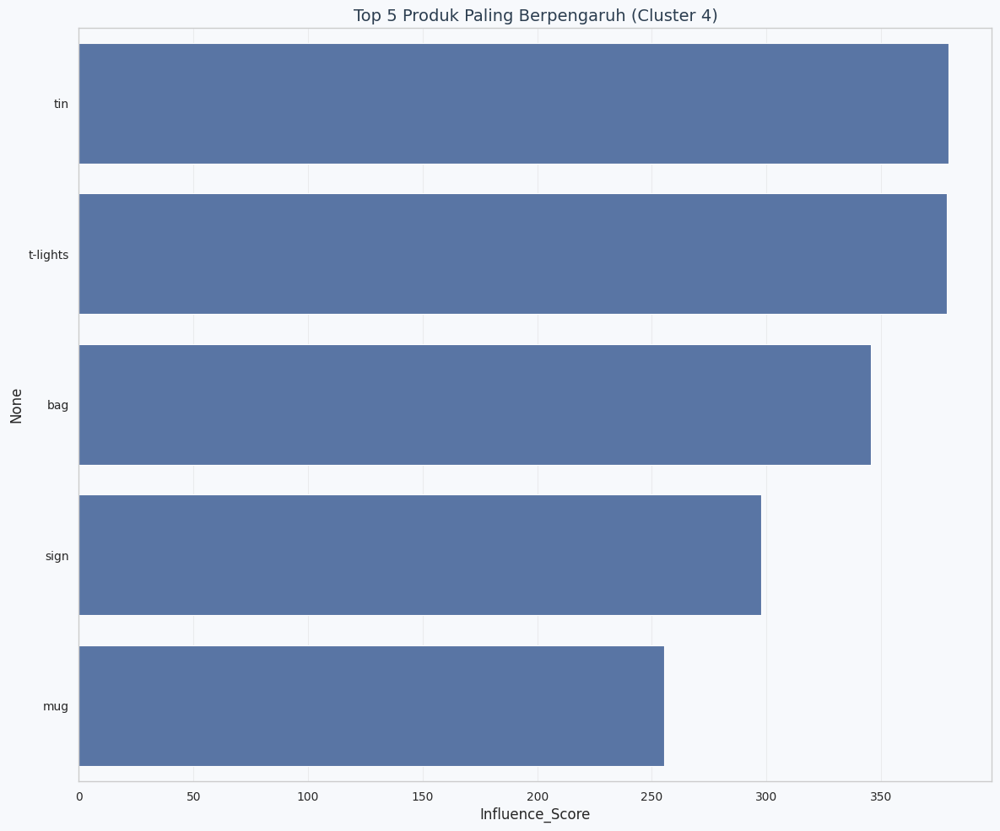

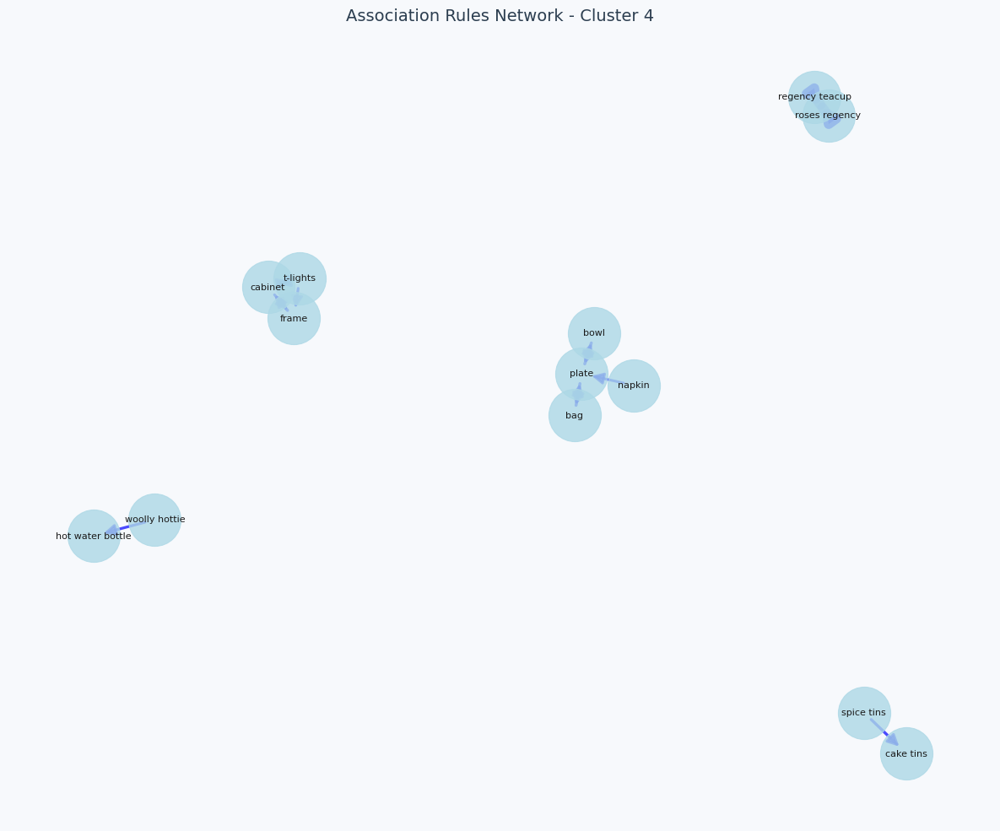


Cluster 4 analysis completed - 420 rules found


In [ ]:
# ===== CLUSTER 4 ANALYSIS =====
print("\n" + "="*60)
print("CLUSTER 4 ANALYSIS")
print("="*60)

cluster_id = 4
rules_cluster4, min_support_4, min_confidence_4, min_lift_4 = run_association_for_cluster(
    df_with_clusters, cluster_id, perform_tuning=True
)

if not rules_cluster4.empty:
    optimal_params[cluster_id] = (min_support_4, min_confidence_4, min_lift_4)
    rules_cluster4['Cluster'] = cluster_id
    all_rules.append(rules_cluster4.copy())
    print(f"\nCluster {cluster_id} analysis completed - {len(rules_cluster4)} rules found")
else:
    print(f"\nNo rules found for Cluster {cluster_id}")
    rules_cluster4 = pd.DataFrame()

**Karakteristik Cluster**

- **Jumlah customer**: 236  
- **Transaksi**: 4.809 (disampling jadi 1.000)  
- **Rata-rata item/transaksi**: sedang (~10–13)  
- **Produk unik setelah filter (min_occurrence ≥ 5)**: 456  
- **Total rule ditemukan**: 420  
- **Min occurrence**: 5  

Cluster ini merupakan cluster besar, tapi jumlah rule hasil tuning relatif sedikit. Ini menandakan **keragaman produk yang tinggi**, namun asosiasi antar produk tidak sekuat cluster sebelumnya.

**Contoh Produk yang Dibeli**

- **Tin, mug, t-lights, sign, bag** → household items dengan fungsi dekoratif dan penggunaan sehari-hari
- **Spice tins, cake tins, hot water bottle, regency teacup** → produk-produk tematik, home-style, dan agak unik

Produk-produk dalam cluster ini menunjukkan **perpaduan antara fungsi dan gaya vintage atau homey**. Tidak terlalu fokus pada satu kategori, lebih tersebar namun masih dalam nuansa cozy living.

**Ciri Pola Belanja**

- **Rata-rata lift**: 2.18  
- **Lift maksimum**: 16.65  
- **Rata-rata confidence**: 0.51  
- **Rata-rata conviction**: 1.64  
- **Support**: mayoritas 0.03–0.04  

Rule confidence dan lift masih berada dalam zona **menengah**, cukup baik untuk mendeteksi asosiasi tanpa overfit. Banyak rule memiliki confidence 0.4–0.5, artinya cocok untuk rekomendasi **berdasarkan kemungkinan** alih-alih kepastian absolut.

**Network Analysis**

- Network terbagi menjadi **beberapa subkomunitas kecil**:
  - *T-lights – frame – cabinet*
  - *Bag – bowl – plate – napkin*
  - *Spice tins – cake tins*
  - *Roses regency – regency teacup*
  - *Hot water bottle – woolly hottie*

- Produk **tidak saling terkoneksi dalam satu superhub**, tapi membentuk **grup kecil** dengan asosiasi internal kuat. Cocok untuk curated collection bertema.

**Top Influential Products**

1. **Tin**  
2. **T-lights**  
3. **Bag**  
4. **Sign**  
5. **Mug**

Produk ini punya influence tertinggi dalam cluster ini, muncul konsisten di berbagai rule meski tidak dalam rule yang mutlak kuat.

**Rekomendasi untuk Bisnis**

- Tawarkan **produk berpasangan ringan** seperti *sign + mug* atau *tin + bag*  
- Buat kategori curated bertema seperti:  
  - **"Warm Corner Decor"** (t-lights, frame, cabinet)  
  - **"Simple Table Set"** (plate, bowl, napkin)  
- Gunakan *tin*, *t-lights*, dan *bag* sebagai anchor untuk engine rekomendasi dengan confidence sedang  
- Gunakan asosiasi *roses regency → regency teacup* sebagai mini-campaign tematik

**Kesimpulan**

Cluster ini memiliki:
- **Keragaman preferensi**, namun masih dalam nuansa cozy household
- Tidak memiliki komunitas besar tapi terdiri dari **grup item yang kohesif**
- Cocok untuk strategi **rekomendasi berdasarkan tema** daripada kombinasi belanja tetap
- Strength asosiasi sedang tapi stabil

**Kemungkinan Profil Customer**

- *Cozy decor shopper*: Suka beli item rumah tangga yang sederhana tapi bikin suasana hangat  
- *The casual buyer*: Tidak terlalu terikat pada satu produk, tapi terbuka pada item bergaya homey  
- *The cllector*: Mencari produk tematik seperti teacup, spice tins, dll untuk personal collection


COMBINED RESULTS SUMMARY
Total rules from all clusters: 11988

Rule distribution per cluster:
   Cluster 0: 589 rules
   Cluster 1: 5000 rules
   Cluster 2: 979 rules
   Cluster 3: 5000 rules
   Cluster 4: 420 rules
Statistical Summary per Cluster:


,total_rules,mean_support,std_support,min_support,max_support,median_support,mean_confidence,std_confidence,min_confidence,max_confidence,median_confidence,mean_lift,std_lift,min_lift,max_lift,median_lift,mean_leverage,std_leverage,min_leverage,max_leverage,mean_conviction,std_conviction,min_conviction,max_conviction
Cluster,,,,,,,,,,,,,,,,,,,,,,,,
0,589,0.04,0.02,0.03,0.16,0.04,0.51,0.13,0.30,0.91,0.50,2.00,0.44,1.50,6.41,1.91,0.02,0.01,0.01,0.06,1.59,0.49,1.18,7.16
1,5000,0.04,0.01,0.03,0.07,0.03,0.51,0.14,0.30,0.93,0.49,6.18,1.31,4.68,10.97,5.78,0.03,0.00,0.02,0.06,2.11,1.02,1.34,13.21
2,979,0.07,0.02,0.05,0.20,0.06,0.63,0.16,0.40,1.00,0.60,1.93,0.34,1.50,3.81,1.84,0.03,0.01,0.02,0.09,2.28,1.90,1.25,25.93
3,5000,0.03,0.00,0.03,0.04,0.03,0.85,0.14,0.60,1.00,0.86,22.29,3.37,18.76,32.83,21.11,0.03,0.00,0.03,0.04,9.40,6.46,2.42,18.02
4,420,0.04,0.01,0.03,0.12,0.04,0.51,0.14,0.30,0.92,0.51,2.18,1.17,1.50,16.65,1.94,0.02,0.01,0.01,0.04,1.64,0.67,1.15,10.04



KEY INSIGHTS PER CLUSTER:

CROSS-CLUSTER COMPARISON
Highest Avg Lift: Cluster 3 (22.289)
Most Rules: Cluster 1 (5000 rules)
Most Diverse: Cluster 3 (57 unique products)


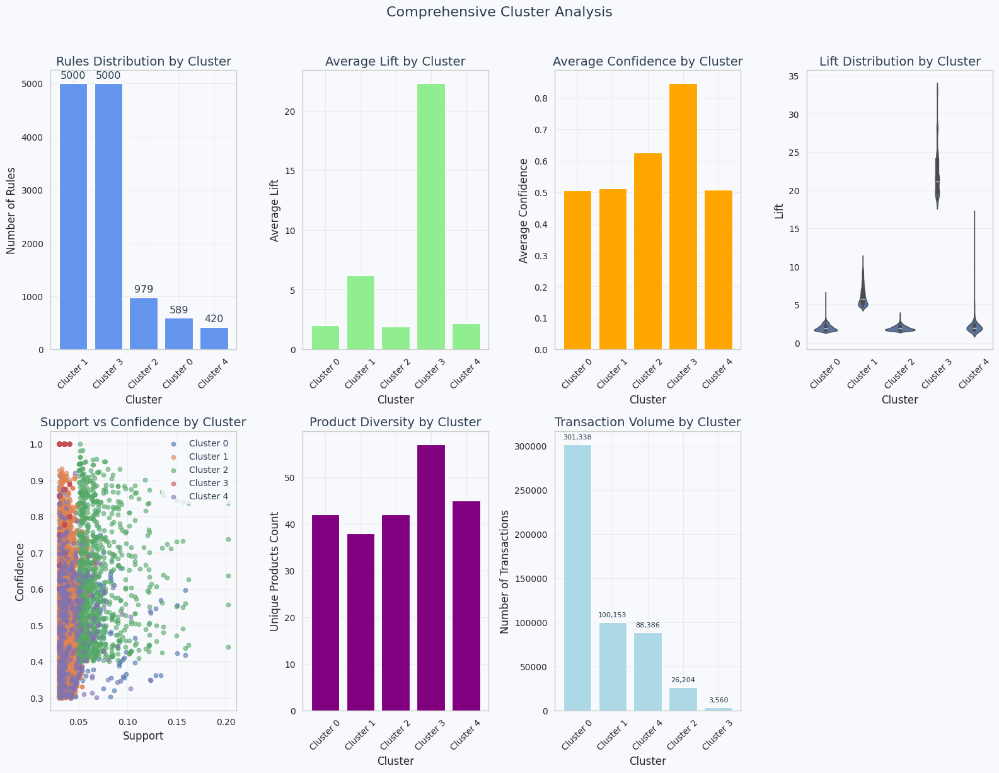


Combined Rules Summary:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski,rule_str,Cluster
0,(spice tins),(cake tins),0.04,0.12,0.03,0.77,6.41,1.00,0.03,3.87,0.88,0.26,0.74,0.53,['spice tins']['cake tins'],0
1,(cabinet),(frame),0.07,0.11,0.03,0.43,3.74,1.00,0.02,1.55,0.79,0.19,0.35,0.35,['cabinet']['frame'],0
2,"(hot water bottle, box)",(hand warmer),0.08,0.14,0.04,0.46,3.27,1.00,0.03,1.60,0.75,0.20,0.37,0.36,"['box', 'hot water bottle']['hand warmer']",0
3,(lunch box),"(sign, bag)",0.10,0.13,0.04,0.42,3.24,1.00,0.03,1.49,0.77,0.22,0.33,0.36,"['lunch box']['bag', 'sign']",0
4,"(sign, bag)",(lunch box),0.13,0.10,0.04,0.31,3.24,1.00,0.03,1.31,0.79,0.22,0.24,0.36,"['bag', 'sign']['lunch box']",0


Combined analysis completed successfully!


In [ ]:
# ===== COMBINED RESULTS SUMMARY =====
print("\n" + "="*60)
print("COMBINED RESULTS SUMMARY")
print("="*60)

if all_rules:
    combined_rules_df = pd.concat(all_rules, ignore_index=True)
    print(f"Total rules from all clusters: {len(combined_rules_df)}")

    # Distribusi rules per cluster
    cluster_rule_counts = combined_rules_df['Cluster'].value_counts()

    # Sort numeric clusters only
    numeric_clusters = sorted([c for c in cluster_rule_counts.index if isinstance(c, (int, float))])

    # Reorder the series
    cluster_rule_counts = cluster_rule_counts.reindex(numeric_clusters)

    print("\nRule distribution per cluster:")
    for cluster, count in cluster_rule_counts.items():
        print(f"   Cluster {cluster}: {count} rules")

    # Calculate comprehensive statistics per cluster
    cluster_metrics = combined_rules_df.groupby('Cluster').agg({
        'support': ['count', 'mean', 'std', 'min', 'max', 'median'],
        'confidence': ['mean', 'std', 'min', 'max', 'median'],
        'lift': ['mean', 'std', 'min', 'max', 'median'],
        'leverage': ['mean', 'std', 'min', 'max'],
        'conviction': ['mean', 'std', 'min', 'max']
    }).round(4)

    # Flatten column names
    cluster_metrics.columns = [f'{col[1]}_{col[0]}' if col[1] != '' else col[0] for col in cluster_metrics.columns]
    cluster_metrics = cluster_metrics.rename(columns={'count_support': 'total_rules'})

    print("Statistical Summary per Cluster:")
    display(cluster_metrics)

    # Key insights per cluster
    print("\nKEY INSIGHTS PER CLUSTER:")
    print("="*40)

    # Sort clusters: numeric first, then string
    unique_clusters = sorted([c for c in combined_rules_df['Cluster'].unique() if isinstance(c, (int, float))]) + \
                     sorted([c for c in combined_rules_df['Cluster'].unique() if isinstance(c, str)])

    for cluster in unique_clusters:
        cluster_data = combined_rules_df[combined_rules_df['Cluster'] == cluster]

        cluster_name = f"CLUSTER {cluster}"
        print(f"\n{cluster_name}:")
        print(f"   • Total Rules: {len(cluster_data)}")
        print(f"   • Avg Lift: {cluster_data['lift'].mean():.3f} (std: {cluster_data['lift'].std():.3f})")
        print(f"   • Avg Confidence: {cluster_data['confidence'].mean():.3f}")
        print(f"   • Avg Support: {cluster_data['support'].mean():.3f}")
        print(f"   • Best Rule Lift: {cluster_data['lift'].max():.3f}")

        # Top rule for this cluster
        best_rule = cluster_data.loc[cluster_data['lift'].idxmax()]
        antecedents = ' & '.join(list(best_rule['antecedents']))
        consequents = ' & '.join(list(best_rule['consequents']))
        print(f"   • Best Rule: {antecedents} → {consequents}")
        print(f"     (lift: {best_rule['lift']:.3f}, conf: {best_rule['confidence']:.3f})")

        # Unique products count
        unique_products = set()
        for items in cluster_data['antecedents']:
            unique_products.update(items)
        for items in cluster_data['consequents']:
            unique_products.update(items)
        print(f"   • Unique Products in Rules: {len(unique_products)}")

    # Cross-cluster comparison
    print("\n" + "="*40)
    print("CROSS-CLUSTER COMPARISON")
    print("="*40)

    # Best performing cluster by average lift
    avg_lifts = combined_rules_df.groupby('Cluster')['lift'].mean().sort_values(ascending=False)
    best_cluster = avg_lifts.index[0]
    print(f"Highest Avg Lift: Cluster {best_cluster} ({avg_lifts.iloc[0]:.3f})")

    # Most rules cluster
    cluster_rule_counts = combined_rules_df['Cluster'].value_counts()
    most_rules_cluster = cluster_rule_counts.index[0]
    print(f"Most Rules: Cluster {most_rules_cluster} ({cluster_rule_counts.iloc[0]} rules)")

    # Most diverse cluster (most unique products)
    cluster_diversity = {}
    for cluster in combined_rules_df['Cluster'].unique():
        cluster_data = combined_rules_df[combined_rules_df['Cluster'] == cluster]
        unique_products = set()
        for items in cluster_data['antecedents']:
            unique_products.update(items)
        for items in cluster_data['consequents']:
            unique_products.update(items)
        cluster_diversity[cluster] = len(unique_products)

    most_diverse = max(cluster_diversity, key=cluster_diversity.get)
    print(f"Most Diverse: Cluster {most_diverse} ({cluster_diversity[most_diverse]} unique products)")

    # Visualisasi distribusi rules per cluster
    plt.figure(figsize=(16, 12))

    # 1. Rule count distribution
    plt.subplot(2, 4, 1)
    cluster_rule_counts = combined_rules_df['Cluster'].value_counts()

    # Create labels for better readability
    cluster_labels = []
    for cluster in cluster_rule_counts.index:
        cluster_labels.append(f'Cluster {cluster}')

    ax1 = plt.bar(range(len(cluster_rule_counts)), cluster_rule_counts.values, color='cornflowerblue')
    plt.title('Rules Distribution by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Rules')
    plt.xticks(range(len(cluster_rule_counts)), cluster_labels, rotation=45)

    for i, v in enumerate(cluster_rule_counts.values):
        plt.text(i, v + max(cluster_rule_counts.values)*0.02, str(v), ha='center')

    # 2. Average lift by cluster
    plt.subplot(2, 4, 2)
    avg_lifts = combined_rules_df.groupby('Cluster')['lift'].mean()
    plt.bar(range(len(avg_lifts)), avg_lifts.values, color='lightgreen')
    plt.title('Average Lift by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Average Lift')
    labels = [f'Cluster {x}' for x in avg_lifts.index]
    plt.xticks(range(len(avg_lifts)), labels, rotation=45)

    # 3. Average confidence by cluster
    plt.subplot(2, 4, 3)
    avg_confidence = combined_rules_df.groupby('Cluster')['confidence'].mean()
    plt.bar(range(len(avg_confidence)), avg_confidence.values, color='orange')
    plt.title('Average Confidence by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Average Confidence')
    labels = [f'Cluster {x}' for x in avg_confidence.index]
    plt.xticks(range(len(avg_confidence)), labels, rotation=45)

    # 4. Lift distribution violin plot
    plt.subplot(2, 4, 4)
    cluster_data_for_violin = []
    cluster_labels_for_violin = []
    for cluster in combined_rules_df['Cluster'].unique():
        cluster_data_for_violin.extend(combined_rules_df[combined_rules_df['Cluster'] == cluster]['lift'].values)
        label = f'Cluster {cluster}'
        cluster_labels_for_violin.extend([label] * len(combined_rules_df[combined_rules_df['Cluster'] == cluster]))

    violin_df = pd.DataFrame({'Cluster': cluster_labels_for_violin, 'Lift': cluster_data_for_violin})
    sns.violinplot(data=violin_df, x='Cluster', y='Lift')
    plt.title('Lift Distribution by Cluster')
    plt.xticks(rotation=45)

    # 5. Support vs Confidence scatter
    plt.subplot(2, 4, 5)
    for cluster in combined_rules_df['Cluster'].unique():
        cluster_data = combined_rules_df[combined_rules_df['Cluster'] == cluster]
        label = f'Cluster {cluster}'
        plt.scatter(cluster_data['support'], cluster_data['confidence'], label=label, alpha=0.6)
    plt.xlabel('Support')
    plt.ylabel('Confidence')
    plt.title('Support vs Confidence by Cluster')
    plt.legend()

    # 6. Product diversity comparison
    plt.subplot(2, 4, 6)
    diversity_series = pd.Series(cluster_diversity)
    plt.bar(range(len(diversity_series)), diversity_series.values, color='purple')
    plt.title('Product Diversity by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Unique Products Count')
    labels = [f'Cluster {x}' for x in diversity_series.index]
    plt.xticks(range(len(diversity_series)), labels, rotation=45)

    # 7. Transaction volume per cluster (from original data)
    plt.subplot(2, 4, 7)
    transaction_counts = df_with_clusters['Cluster'].value_counts()
    plt.bar(range(len(transaction_counts)), transaction_counts.values, color='lightblue')
    plt.title('Transaction Volume by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Transactions')
    labels = [f'Cluster {x}' for x in transaction_counts.index]
    plt.xticks(range(len(transaction_counts)), labels, rotation=45)

    for i, v in enumerate(transaction_counts.values):
        plt.text(i, v + max(transaction_counts.values)*0.02, f'{v:,}', ha='center', fontsize=8)

    plt.suptitle('Comprehensive Cluster Analysis', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

    # Quick summary table
    print(f"\nCombined Rules Summary:")
    display(combined_rules_df.head())

    print("Combined analysis completed successfully!")
else:
    print("No rules found across all clusters")


CATEGORY EXTRACTION IMPACT - CLUSTER 1
Using tuned optimal parameters: support=0.03, confidence=0.3, lift=1.2

Comparing Category Impact for Cluster 1
Transactions: 2497

>>> WITH CATEGORY EXTRACTION
Generating rules using column: CategoryExtraction
Ditemukan 1045 item dengan min occurrence 5
Encoding 2479 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (31152), mengambil 5000 teratas berdasarkan lift

>>> WITHOUT CATEGORY EXTRACTION (using Description)
Generating rules using column: Description
Ditemukan 2523 item dengan min occurrence 5
Encoding 2462 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...

>>> COMPARISON RESULTS
Rules with CategoryExtraction: 5000
Rules without CategoryExtraction: 283

Average metrics comparison:
            With_Category  Without_Category
support              0.04              0.04
confidence           0.51              0.56
lift      

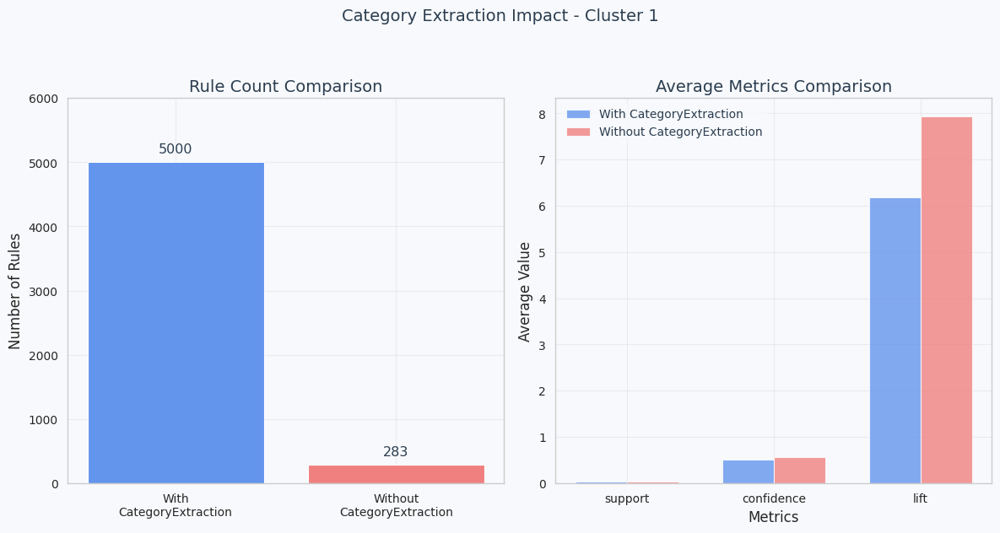

In [ ]:
# ===== CATEGORY EXTRACTION COMPARISON - CLUSTER 1 =====
print("\n" + "="*60)
print("CATEGORY EXTRACTION IMPACT - CLUSTER 1")
print("="*60)

if 1 in optimal_params:
    min_support, min_confidence, min_lift = optimal_params[1]
    print(f"Using tuned optimal parameters: support={min_support}, confidence={min_confidence}, lift={min_lift}")

    rules_with_cat_1, rules_without_cat_1 = compare_association_rules(
        df_with_clusters, 1, min_support, min_confidence, min_lift
    )
else:
    print("No optimal parameters found for Cluster 1. Skipping category comparison.")


CATEGORY EXTRACTION IMPACT - CLUSTER 2
Using tuned optimal parameters: support=0.05, confidence=0.4, lift=1.5

Comparing Category Impact for Cluster 2
Transactions: 1019

>>> WITH CATEGORY EXTRACTION
Generating rules using column: CategoryExtraction
Ditemukan 713 item dengan min occurrence 5
Encoding 1013 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.4...

>>> WITHOUT CATEGORY EXTRACTION (using Description)
Generating rules using column: Description
Ditemukan 1535 item dengan min occurrence 5
Encoding 1005 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.4...

>>> COMPARISON RESULTS
Rules with CategoryExtraction: 979
Rules without CategoryExtraction: 0


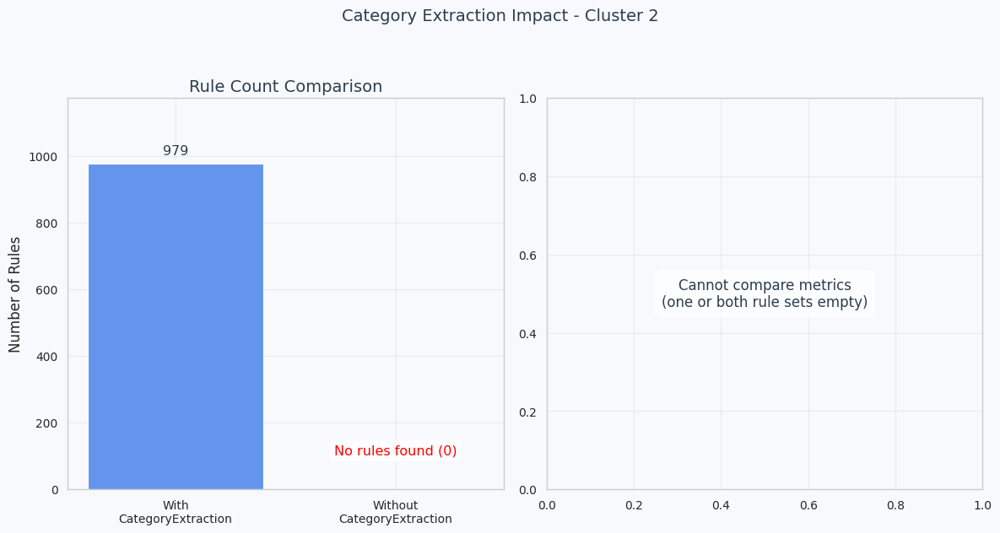

In [ ]:
# ===== CATEGORY EXTRACTION COMPARISON - CLUSTER 2 =====
print("\n" + "="*60)
print("CATEGORY EXTRACTION IMPACT - CLUSTER 2")
print("="*60)

if 2 in optimal_params:
    min_support, min_confidence, min_lift = optimal_params[2]
    print(f"Using tuned optimal parameters: support={min_support}, confidence={min_confidence}, lift={min_lift}")

    rules_with_cat_2, rules_without_cat_2 = compare_association_rules(
        df_with_clusters, 2, min_support, min_confidence, min_lift
    )
else:
    print("No optimal parameters found for Cluster 2. Skipping category comparison.")


CATEGORY EXTRACTION IMPACT - CLUSTER 3
Using tuned optimal parameters: support=0.03, confidence=0.3, lift=1.2

Comparing Category Impact for Cluster 3
Transactions: 202

>>> WITH CATEGORY EXTRACTION
Generating rules using column: CategoryExtraction
Ditemukan 223 item dengan min occurrence 3
Encoding 197 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (192186), mengambil 5000 teratas berdasarkan lift

>>> WITHOUT CATEGORY EXTRACTION (using Description)
Generating rules using column: Description
Ditemukan 447 item dengan min occurrence 3
Encoding 185 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...
Terlalu banyak rules (8783), mengambil 5000 teratas berdasarkan lift

>>> COMPARISON RESULTS
Rules with CategoryExtraction: 5000
Rules without CategoryExtraction: 5000

Average metrics comparison:
            With_Category  Without_Category
support              0.03       

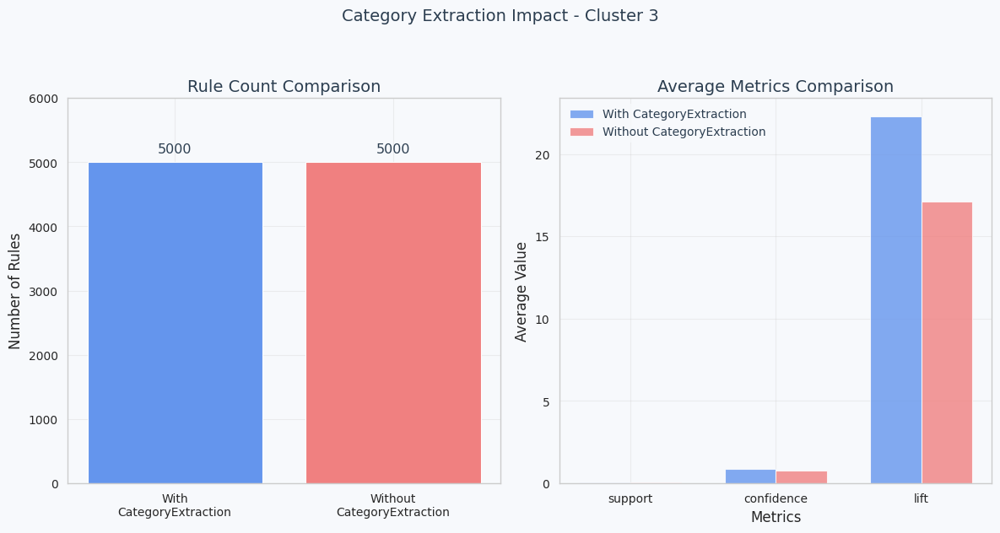

In [ ]:
# ===== CATEGORY EXTRACTION COMPARISON - CLUSTER 3 =====
print("\n" + "="*60)
print("CATEGORY EXTRACTION IMPACT - CLUSTER 3")
print("="*60)

if 3 in optimal_params:
    min_support, min_confidence, min_lift = optimal_params[3]
    print(f"Using tuned optimal parameters: support={min_support}, confidence={min_confidence}, lift={min_lift}")

    rules_with_cat_3, rules_without_cat_3 = compare_association_rules(
        df_with_clusters, 3, min_support, min_confidence, min_lift
    )
else:
    print("No optimal parameters found for Cluster 3. Skipping category comparison.")


CATEGORY EXTRACTION IMPACT - CLUSTER 4
Using tuned optimal parameters: support=0.03, confidence=0.3, lift=1.5

Comparing Category Impact for Cluster 4
Transactions: 4809
Large cluster detected. Sampling 1000 from 4809 transactions
After sampling: 1000 transactions

>>> WITH CATEGORY EXTRACTION
Generating rules using column: CategoryExtraction
Ditemukan 456 item dengan min occurrence 5
Encoding 992 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...

>>> WITHOUT CATEGORY EXTRACTION (using Description)
Generating rules using column: Description
Ditemukan 973 item dengan min occurrence 5
Encoding 987 transaksi
Mencari frequent itemsets dengan FP-Growth...
Membuat rules dengan min_confidence=0.3...

>>> COMPARISON RESULTS
Rules with CategoryExtraction: 420
Rules without CategoryExtraction: 12

Average metrics comparison:
            With_Category  Without_Category
support              0.04              0.03
confidence           0.51          

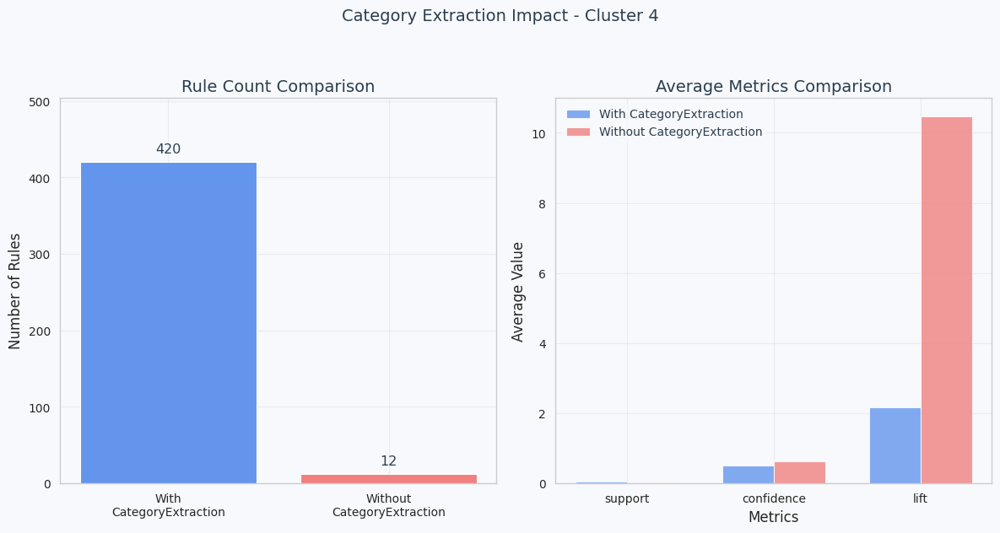

In [ ]:
# ===== CATEGORY EXTRACTION COMPARISON - CLUSTER 4 =====
print("\n" + "="*60)
print("CATEGORY EXTRACTION IMPACT - CLUSTER 4")
print("="*60)

if 4 in optimal_params:
    min_support, min_confidence, min_lift = optimal_params[4]
    print(f"Using tuned optimal parameters: support={min_support}, confidence={min_confidence}, lift={min_lift}")

    rules_with_cat_4, rules_without_cat_4 = compare_association_rules(
        df_with_clusters, 4, min_support, min_confidence, min_lift
    )
else:
    print("No optimal parameters found for Cluster 4. Skipping category comparison.")

In [ ]:
def create_combined_category_comparison_plot(category_comparison_df):
    """Create a single comprehensive plot comparing category extraction vs description across all clusters"""

    plt.figure(figsize=(15, 10))

    # Create subplots
    plt.subplot(2, 2, 1)
    x = np.arange(len(category_comparison_df))
    width = 0.35

    # Plot rule counts
    plt.bar(x - width/2, category_comparison_df['with_category_count'],
            width, label='With Category', color='cornflowerblue', alpha=0.8)
    plt.bar(x + width/2, category_comparison_df['without_category_count'],
            width, label='Without Category', color='lightcoral', alpha=0.8)

    plt.xlabel('Cluster')
    plt.ylabel('Number of Rules')
    plt.title('Rule Count Comparison')
    plt.xticks(x, [f'Cluster {i}' for i in category_comparison_df['cluster_id']], rotation=45)
    plt.legend()

    # Plot average lift
    plt.subplot(2, 2, 2)
    plt.bar(x - width/2, category_comparison_df['with_category_avg_lift'],
            width, label='With Category', color='cornflowerblue', alpha=0.8)
    plt.bar(x + width/2, category_comparison_df['without_category_avg_lift'],
            width, label='Without Category', color='lightcoral', alpha=0.8)

    plt.xlabel('Cluster')
    plt.ylabel('Average Lift')
    plt.title('Average Lift Comparison')
    plt.xticks(x, [f'Cluster {i}' for i in category_comparison_df['cluster_id']], rotation=45)
    plt.legend()

    # Plot average confidence
    plt.subplot(2, 2, 3)
    plt.bar(x - width/2, category_comparison_df['with_category_avg_confidence'],
            width, label='With Category', color='cornflowerblue', alpha=0.8)
    plt.bar(x + width/2, category_comparison_df['without_category_avg_confidence'],
            width, label='Without Category', color='lightcoral', alpha=0.8)

    plt.xlabel('Cluster')
    plt.ylabel('Average Confidence')
    plt.title('Average Confidence Comparison')
    plt.xticks(x, [f'Cluster {i}' for i in category_comparison_df['cluster_id']], rotation=45)
    plt.legend()

    # Plot improvement ratios
    plt.subplot(2, 2, 4)
    plt.bar(x, category_comparison_df['improvement_ratio'],
            color='mediumseagreen', alpha=0.8)

    plt.xlabel('Cluster')
    plt.ylabel('Improvement Ratio')
    plt.title('Rule Count Improvement Ratio\n(With/Without Category)')
    plt.xticks(x, [f'Cluster {i}' for i in category_comparison_df['cluster_id']], rotation=45)

    # Add value labels on bars
    for i, v in enumerate(category_comparison_df['improvement_ratio']):
        if v != float('inf'):
            plt.text(i, v + 0.1, f'{v:.1f}x', ha='center', va='bottom')
        else:
            plt.text(i, 1, 'N/A', ha='center', va='bottom')

    plt.suptitle('Category Extraction Impact Analysis Across All Clusters', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()


STORING RESULTS
Stored 11988 rules across all clusters

Cluster-wise rule statistics:


support                confidence                 lift             \
           mean  std  min  max       mean  std  min  max  mean  std   min   
Cluster                                                                     
0          0.04 0.02 0.03 0.16       0.51 0.13 0.30 0.91  2.00 0.44  1.50   
1          0.04 0.01 0.03 0.07       0.51 0.14 0.30 0.93  6.18 1.31  4.68   
2          0.07 0.02 0.05 0.20       0.63 0.16 0.40 1.00  1.93 0.34  1.50   
3          0.03 0.00 0.03 0.04       0.85 0.14 0.60 1.00 22.29 3.37 18.76   
4          0.04 0.01 0.03 0.12       0.51 0.14 0.30 0.92  2.18 1.17  1.50   

              rule_id  
          max   count  
Cluster                
0        6.41     589  
1       10.97    5000  
2        3.81     979  
3       32.83    5000  
4       16.65     420


Stored category extraction comparison for 5 clusters

Category extraction impact summary:


,cluster_id,with_category_count,without_category_count,improvement_ratio,with_category_avg_lift,without_category_avg_lift,with_category_avg_confidence,without_category_avg_confidence,lift_improvement,confidence_improvement
0,0,589,15,39.27,2.00,7.72,0.50,0.54,-5.72,-0.03
1,1,5000,283,17.67,6.18,7.93,0.51,0.56,-1.76,-0.05
2,2,979,0,inf,1.93,0.00,0.63,0.00,0.00,0.00
3,3,5000,5000,1.00,22.29,17.09,0.85,0.76,5.20,0.08
4,4,420,12,35.00,2.18,10.47,0.51,0.63,-8.29,-0.12



Creating combined category comparison plot...


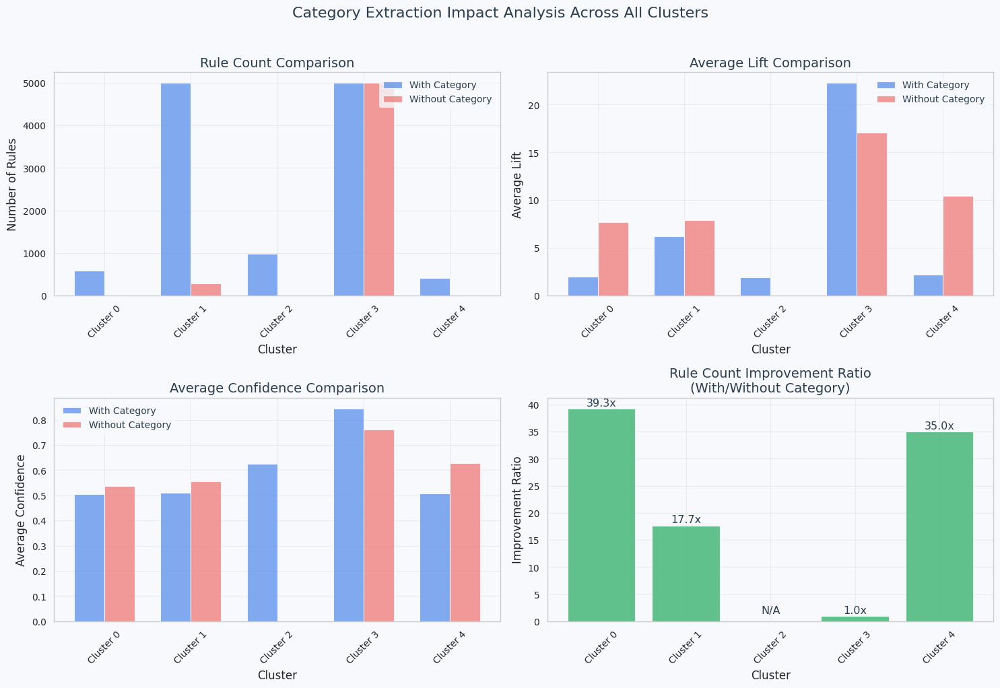

In [ ]:
# ===== DATA STORAGE =====
print("\n" + "="*50)
print("STORING RESULTS")
print("="*50)

# Store individual cluster rules
if all_rules:
    # Main results dataframe
    final_rules_df = pd.concat(all_rules, ignore_index=True)

    # Add rule metadata
    final_rules_df['rule_id'] = range(len(final_rules_df))
    final_rules_df['rule_description'] = final_rules_df.apply(
        lambda x: f"{list(x['antecedents'])} -> {list(x['consequents'])}", axis=1
    )

    print(f"Stored {len(final_rules_df)} rules across all clusters")

    # Quick stats per cluster
    cluster_stats = final_rules_df.groupby('Cluster').agg({
        'support': ['mean', 'std', 'min', 'max'],
        'confidence': ['mean', 'std', 'min', 'max'],
        'lift': ['mean', 'std', 'min', 'max'],
        'rule_id': 'count'
    }).round(4)

    print("\nCluster-wise rule statistics:")
    display(cluster_stats)

# Store category comparison results
category_comparison_results = []

# Collect comparison data
comparison_data = [
    (0, 'rules_with_cat_0', 'rules_without_cat_0'),
    (1, 'rules_with_cat_1', 'rules_without_cat_1'),
    (2, 'rules_with_cat_2', 'rules_without_cat_2'),
    (3, 'rules_with_cat_3', 'rules_without_cat_3'),
    (4, 'rules_with_cat_4', 'rules_without_cat_4')
]

for cluster_id, with_var, without_var in comparison_data:
    if cluster_id in optimal_params:
        with_rules = locals().get(with_var, pd.DataFrame())
        without_rules = locals().get(without_var, pd.DataFrame())

        comparison_record = {
            'cluster_id': cluster_id,
            'with_category_count': len(with_rules) if not with_rules.empty else 0,
            'without_category_count': len(without_rules) if not without_rules.empty else 0,
            'improvement_ratio': (len(with_rules) / len(without_rules)) if not without_rules.empty and len(without_rules) > 0 else float('inf'),
            'with_category_avg_lift': with_rules['lift'].mean() if not with_rules.empty else 0,
            'without_category_avg_lift': without_rules['lift'].mean() if not without_rules.empty else 0,
            'with_category_avg_confidence': with_rules['confidence'].mean() if not with_rules.empty else 0,
            'without_category_avg_confidence': without_rules['confidence'].mean() if not without_rules.empty else 0,
        }

        # Add lift improvement
        if not with_rules.empty and not without_rules.empty:
            comparison_record['lift_improvement'] = comparison_record['with_category_avg_lift'] - comparison_record['without_category_avg_lift']
            comparison_record['confidence_improvement'] = comparison_record['with_category_avg_confidence'] - comparison_record['without_category_avg_confidence']
        else:
            comparison_record['lift_improvement'] = 0
            comparison_record['confidence_improvement'] = 0

        category_comparison_results.append(comparison_record)

if category_comparison_results:
    category_comparison_df = pd.DataFrame(category_comparison_results)
    print(f"\nStored category extraction comparison for {len(category_comparison_df)} clusters")

    print("\nCategory extraction impact summary:")
    display(category_comparison_df)

    # Create combined comparison plot
    print("\nCreating combined category comparison plot...")
    create_combined_category_comparison_plot(category_comparison_df)
else:
    print("\nNo category comparison data available")

### 3.3. Anomaly Detection


In [ ]:
%pip install shap

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
# import library yang diperlukan untuk anomaly detection
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
import shap
from scipy.stats import spearmanr

#### 3.3.0 Pertimbangan Detail Anomaly Detection

Anomaly detection yang akan dilakukan adalah mendeteksi anomali pada _association rules_ yang sudah digali dari masing-masing _cluster_(segmen) pengguna.
Metode yang akan digunakan adalah _isolation forest_ untuk mendeteksi _global anomalies_ dari _association rules_ pada masing-masing _cluster_. Selain mendeteksi anomali, kita juga ingin tahu kenapa suatu rule dianggap sebagai anomali. Oleh karena itu kita menggunakan SHapley Additive exPlanations (SHAP) untuk menjelaskan fitur apa yang paling berkontribusi dalam penentuan suatu rule sebagai anomali. Hasil metode _isolation forest_ relevan untuk dianalisis lebih lanjut menggunakan SHAP karena SHAP memiliki `TreeExplainer` yang memang didesain untuk _tree based model_. Namun selain _isolation forest_, digunakan pula metode _local outlier factor_ (LOF) untuk melengkapi analisis dengan mendeteksi _local anomalies_ pada masing-masing _cluster_. LOF dapat membantu mendeteksi _local anomaly_ pada sekumpulan rule yang _dense_, serta menangani perbedaan kepadatan persebaran rule di ruang dimensi fitur dengan baik.

Karena anomaly detection diterapkan pada association rules, maka fitur yang digunakan adalah metriks-metriks yang merepresentasikan suatu association rule seperti _support, confidence, lift, leverage,_ dan _conviction_.

In [ ]:
def detect_anomalous_rules(rules_df, contamination=0.05, n_neighbors=20):
    """
    Apply Isolation Forest and LOF to detect anomalous rules.

    Parameters:
    -----------
    rules_df : pandas DataFrame
        DataFrame containing association rules with normalized metrics.
    contamination : float, default=0.05
        Expected proportion of anomalies for both algorithms.
    n_neighbors : int, default=20
        Number of neighbors for LOF algorithm.

    Returns:
    --------
    rules_df : pandas DataFrame
        Original DataFrame with added columns:
        - 'isolation_forest_anomaly': 1 for anomalies, 0 for inliers.
        - 'lof_anomaly': 1 for anomalies, 0 for inliers.
        - 'combined_anomaly': 1 if both algorithms detect anomaly, 0 otherwise.
        - 'anomaly_score': Isolation Forest anomaly score (negative = anomaly).
    iso_forest : IsolationForest
        Trained Isolation Forest model.
    features : pandas DataFrame
        Feature matrix used for anomaly detection.
    """
    if len(rules_df) < 10:
        print(f"Not enough rules ({len(rules_df)}) for anomaly detection")
        rules_df['isolation_forest_anomaly'] = 0
        rules_df['lof_anomaly'] = 0
        rules_df['combined_anomaly'] = 0
        rules_df['anomaly_score'] = 0.0
        return rules_df, None, None

    # Select normalized features
    feature_columns = [
        'antecedent support_normalized', 'consequent support_normalized', 'support_normalized',
        'confidence_normalized', 'lift_normalized', 'leverage_normalized', 'conviction_normalized'
    ]
    features = rules_df[feature_columns].copy()

    # Fill NaN with median to avoid skewing
    features = features.fillna(features.median())

    # Isolation Forest
    iso_forest = IsolationForest(n_estimators=100, contamination=contamination, random_state=42, n_jobs=1)
    iso_forest_preds = iso_forest.fit_predict(features)
    rules_df['isolation_forest_anomaly'] = np.where(iso_forest_preds == -1, 1, 0)

    # Local Outlier Factor
    lof = LocalOutlierFactor(n_neighbors=min(n_neighbors, len(features) - 1), contamination='auto')
    lof_preds = lof.fit_predict(features)
    rules_df['lof_anomaly'] = np.where(lof_preds == -1, 1, 0)

    # Combined anomaly (both algorithms agree)
    rules_df['combined_anomaly'] = (rules_df['isolation_forest_anomaly'] + rules_df['lof_anomaly'] > 1).astype(int)

    # Anomaly score (negative = anomaly, per scikit-learn convention)
    rules_df['anomaly_score'] = iso_forest.decision_function(features)

    return rules_df, iso_forest, features

Metode _isolation forest_ dan _LOF_ adalah metode _anomaly detection_ yang bersifat unsupervised learning_, sehingga cara melakukan _hyperparameter tuning_-nya agak berbeda karena kita tidak punya suatu _loss function_ atau metriks khusus untuk dioptimalkan. Tuning dalam konteks ini bertujuan untuk menyesuaikan _hyperparameter_ model dengan karakteristik data yang dimiliki. Di sisi lain, _default hyperparameter_ _isolation forest_ dan _LOF_ sudah dapat bekerja dengan baik untuk kebanyakan kasus. Oleh karena itu, tuning yang akan dilakukan hanya menentukan `contamination`(pada isolation forest): persentase data yang akan dianggap sebagai anomali, dan `n_neighbors`(pada LOF): jumlah tetangga yang digunakan untuk menghitung kepadatan lokal.

Saat menentukan contamination, kita akan memilih nilai contamination yang stabil. Artinya saat dibandingkan hasil prediksi anomali saat menggunakan suatu nilai contamination dengan nilai yang kurang dari dan nilai yang lebih dari nilai contamination tersebut, hasil prediksinya similar (tidak berubah banyak). Selain itu kita akan melihat bagaimana nilai contamination yang berbeda akan memengaruhi threshold dari skor anomali yang digunakan untuk menentukan apakah suatu rule termasuk anomali atau bukan.

Mirip dengan penentuan contamination, kita akan memilih nilai n_neighbors yang stabil. Jika sebelumnya nilai contamination hanya memengaruhi nilai threshold penentuan anomali atau tidaknya, tanpa mengubah skor anomali, kali ini nilai n_neighbors akan memengaruhi skor anomali suatu rule. Oleh karena itu, kita akan menggunakan korelasi skor anomali (LOF Score) pada nilai n_neighbors yang berbeda, dan memilih nilai yang menghasilkan korelasi cukup tinggi. Korelasi skor anomali yang tinggi menunjukkan deteksi anomali yang stabil: suatu rule yang cenderung dianggap anomali saat menggunakan n_neighbors x, juga akan cenderung dianggap anomali saat menggunakan n_neighbors y.

In [ ]:
def analyze_iforest_contamination(rules_df, cluster_id, contamination_rates=[0.01, 0.03, 0.05, 0.07, 0.1]):
    """
    Analyze Isolation Forest contamination rates for a specific cluster of rules.

    Parameters:
    -----------
    cluster_id : int or string
        The identifier of a cluster (e.g., 0 for rules_cluster0, "Guest" for rules_cluster_guest)
    contamination_rates : list, optional
        List of contamination rates to test

    Returns:
    --------
    dict
        Dictionary containing the analysis results
    """
    # Set global random seed for NumPy
    np.random.seed(42)

    numerical_features = [
        'antecedent support_normalized', 'consequent support_normalized', 'support_normalized',
        'confidence_normalized', 'lift_normalized', 'leverage_normalized', 'conviction_normalized'
    ]
    X = rules_df[numerical_features]

    # Store predictions
    all_predictions = {}

    # Fit the model once since scores won't change
    iforest = IsolationForest(random_state=42)
    iforest.fit(X)
    base_scores = iforest.score_samples(X)

    for rate in contamination_rates:
        threshold = np.percentile(base_scores, rate * 100)
        # Anomaly = low score, show that the point is easy to be separated from the rest
        predictions = (base_scores <= threshold).astype(int)
        all_predictions[rate] = predictions

    # Calculate Jaccard similarities
    jaccard_similarities = []
    for i in range(len(contamination_rates)-1):
        rate1, rate2 = contamination_rates[i], contamination_rates[i+1]
        pred1 = set(np.where(all_predictions[rate1] == 1)[0])
        pred2 = set(np.where(all_predictions[rate2] == 1)[0])

        intersection = len(pred1.intersection(pred2))
        union = len(pred1.union(pred2))
        jaccard = intersection / union if union > 0 else 1.0
        jaccard_similarities.append(jaccard)

    # Create visualization
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Plot 1: Score distribution with different thresholds
    ax1.hist(base_scores, bins=30, density=True)

    colors = ['red', 'blue', 'green', 'purple', 'orange']
    styles = ['--', '-.', ':', '-', '--']

    thresholds = {}
    for rate, color, style in zip(contamination_rates, colors, styles):
        threshold = np.percentile(base_scores, rate * 100)
        thresholds[rate] = threshold
        ax1.axvline(x=threshold, color=color, linestyle=style,
                    label=f'threshold at {rate}')

    ax1.set_xlabel('Anomaly Score')
    ax1.set_ylabel('Density')
    ax1.set_title(f'Distribution of Anomaly Scores with Different Thresholds (Cluster {cluster_id})')
    ax1.legend()
    ax1.grid(True)

    # Plot 2: Jaccard similarity
    ax2.plot(contamination_rates[1:], jaccard_similarities, marker='o')
    ax2.set_xlabel('Contamination Rate')
    ax2.set_ylabel('Jaccard Similarity with Previous Rate')
    ax2.set_title(f'Stability of Binary Predictions with Different Contamination Rates (Cluster {cluster_id})')
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\nAnalysis for Cluster {cluster_id}")
    print("\nThreshold values for each contamination rate:")
    for rate in contamination_rates:
        threshold = thresholds[rate]
        print(f"Rate {rate}: threshold = {threshold:.4f}")

    anomaly_counts = {}
    print("\nNumber of anomalies detected at each contamination rate:")
    for rate in contamination_rates:
        n_anomalies = sum(all_predictions[rate] == 1)
        anomaly_counts[rate] = n_anomalies
        print(f"Rate {rate}: {n_anomalies} anomalies")

    # Return results as a dictionary (uncomment if needed)
    # return {
    #     'base_scores': base_scores,
    #     'predictions': all_predictions,
    #     'jaccard_similarities': jaccard_similarities,
    #     'thresholds': thresholds,
    #     'anomaly_counts': anomaly_counts
    # }

# Cara penggunaan:
# results = analyze_iforest_contamination(0)  # Untuk menganalisis rules_cluster0

In [ ]:
def analyze_lof_parameters(rules_df, cluster_id, n_neighbors_values=[5, 10, 20, 30, 50]):
    """
    Analyze LOF parameters for a specific cluster of rules.

    Parameters:
    -----------
    cluster_id : int or string
        The identifier of a cluster (e.g., 0 for rules_cluster0, "Guest" for rules_cluster_guest)
    n_neighbors_values : list, optional
        List of k values to test for LOF

    Returns:
    --------
    dict
        Dictionary containing the analysis results
    """

    features = ['antecedent support_normalized', 'consequent support_normalized', 'support_normalized',
               'confidence_normalized', 'lift_normalized', 'leverage_normalized', 'conviction_normalized']

    # Store scores for each k
    all_scores = {}

    for k in n_neighbors_values:
        lof = LocalOutlierFactor(n_neighbors=k, contamination='auto')
        # First fit the model
        lof.fit(rules_df[features])
        # Get the actual LOF scores
        scores = lof.negative_outlier_factor_
        all_scores[k] = scores

    # Create a figure with multiple subplots
    _, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

    # Plot 1: Score distributions for different k values
    for k in n_neighbors_values:
        ax1.hist(all_scores[k], bins=30, alpha=0.5, label=f'k={k}', density=True)
    ax1.set_xlabel('LOF Score')
    ax1.set_ylabel('Density')
    ax1.set_title(f'Distribution of LOF Scores for Different k Values (Cluster {cluster_id})')
    ax1.legend()
    ax1.grid(True)

    # Plot 2: Score correlation between consecutive k values
    correlations = []
    for i in range(len(n_neighbors_values)-1):
        k1, k2 = n_neighbors_values[i], n_neighbors_values[i+1]
        corr = spearmanr(all_scores[k1], all_scores[k2])[0]
        correlations.append(corr)

    ax2.plot(n_neighbors_values[:-1], correlations, marker='o')
    ax2.set_xlabel('k')
    ax2.set_ylabel('Spearman Correlation with next k value')
    ax2.set_title(f'Score Stability Across k Values (Cluster {cluster_id})')
    ax2.grid(True)

    # Plot 3: Boxplot of scores for each k
    box_data = [all_scores[k] for k in n_neighbors_values]
    ax3.boxplot(box_data, labels=n_neighbors_values)
    ax3.set_xlabel('k value')
    ax3.set_ylabel('LOF Score')
    ax3.set_title(f'LOF Score Distribution by k (Cluster {cluster_id})')
    ax3.grid(True)

    plt.tight_layout()
    plt.show()

    # Print detailed statistics
    print(f"\nScore Statistics for Cluster {cluster_id}:")
    stats = {}
    for k in n_neighbors_values:
        scores = all_scores[k]
        print(f"\nk = {k}:")
        print(f"Mean score: {np.mean(scores):.4f}")
        print(f"Std score: {np.std(scores):.4f}")
        print(f"Min score (strongest outlier): {np.min(scores):.4f}")
        print(f"Max score (strongest inlier): {np.max(scores):.4f}")

        # Calculate percentage of potential outliers (scores < -1)
        outliers_percent = (scores < -1).mean() * 100
        print(f"Percentage of points with score < -1: {outliers_percent:.2f}%")

        stats[k] = {
            'mean': np.mean(scores),
            'std': np.std(scores),
            'min': np.min(scores),
            'max': np.max(scores),
            'outliers_percent': outliers_percent
        }

    # Calculate rank correlation
    print(f"\nSpearman Rank Correlations between consecutive k values (Cluster {cluster_id}):")
    rank_correlations = {}
    for i in range(len(n_neighbors_values)-1):
        k1, k2 = n_neighbors_values[i], n_neighbors_values[i+1]
        rank_corr = spearmanr(all_scores[k1], all_scores[k2])[0]
        print(f"k={k1} vs k={k2}: {rank_corr:.4f}")
        rank_correlations[f'{k1}_{k2}'] = rank_corr

    # Return results as a dictionary (uncomment if needed)
    # return {
    #     'scores': all_scores,
    #     'correlations': correlations,
    #     'statistics': stats,
    #     'rank_correlations': rank_correlations
    # }

# Cara penggunaan:
# results = analyze_lof_parameters(4)  # Untuk menganalisis rules_cluster4

Selanjutnya, kita ingin tahu fitur apa yang menjadi penentu utama suatu association rule dideteksi sebagai anomali di setiap segmen, serta item yang muncul pada asscociation rule yang terdeteksi sebagai anomali tersebut.

In [ ]:
def explain_anomalies(rules_df, model, features):
    """
    Compute feature importance ranking for anomaly detection using SHAP

    Parameters:
    -----------
    rules_df : pandas DataFrame
        DataFrame with anomaly detection results
    model : fitted Isolation Forest model
        The trained Isolation Forest model
    features : pandas DataFrame
        Feature matrix used for anomaly detection

    Returns:
    --------
    feature_importance : pandas DataFrame
        DataFrame with features ranked by their importance to anomaly detection
    """
    anomalies = rules_df[rules_df['isolation_forest_anomaly'] == 1]

    if len(anomalies) == 0:
        print("No anomalies detected")
        return None

    anomaly_indices = anomalies.index
    anomaly_features = features.loc[anomaly_indices]

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(anomaly_features)

    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    feature_importance = pd.DataFrame({
        'feature': features.columns,
        'importance': mean_abs_shap
    }).sort_values('importance', ascending=False)

    return feature_importance

In [ ]:
def display_anomaly_results(rules_with_anomalies, feature_importance, cluster_id=None):
    """
    Display anomaly detection results and feature importance ranking

    Parameters:
    -----------
    rules_with_anomalies : pandas DataFrame
        DataFrame with anomaly detection results
    feature_importance : pandas DataFrame or None
        Feature importance ranking from explain_anomalies
    cluster_id : int or None, optional
        Cluster identifier for labeling output
    """
    label = f"Cluster {cluster_id}" if cluster_id is not None else "Rules"
    print(f"\nProcessing {label} with {len(rules_with_anomalies)} rules...")

    iso_anomalies = rules_with_anomalies['isolation_forest_anomaly'].sum()
    lof_anomalies = rules_with_anomalies['lof_anomaly'].sum()
    combined_anomalies = rules_with_anomalies['combined_anomaly'].sum()

    print(f"Isolation Forest detected: {iso_anomalies} anomalies")
    print(f"LOF detected: {lof_anomalies} anomalies")
    print(f"Both methods agree on: {combined_anomalies} anomalies")

    if feature_importance is not None:
        print(f"\nFeature Importance Ranking for Anomalies in {label}:")
        print(feature_importance.to_string(index=False))

        plt.figure(figsize=(10, 6))
        plt.bar(feature_importance['feature'], feature_importance['importance'])
        plt.xticks(rotation=45, ha='right')
        plt.xlabel('Features')
        plt.ylabel('Mean Absolute SHAP Value')
        plt.title(f'Feature Importance for Anomalous Rules in {label}')
        plt.tight_layout()
        plt.show()

In [ ]:
def visualize_anomaly_methods(rules_df, x_metric='support', y_metric='lift', cluster_id=None):
    """
    Visualize rules detected as anomalies by Isolation Forest, LOF, or both.

    Parameters:
    -----------
    rules_df : pandas DataFrame
        DataFrame with anomaly detection results from detect_anomalous_rules
    x_metric : str
        Metric for x-axis (default: 'support')
    y_metric : str
        Metric for y-axis (default: 'lift')
    cluster_id : int or None, optional
        Cluster identifier for labeling the plot
    """
    # Ensure required columns exist
    required_cols = ['isolation_forest_anomaly', 'lof_anomaly', x_metric, y_metric]
    if not all(col in rules_df.columns for col in required_cols):
        print("Required columns missing from rules_df")
        return

    # Create figure
    plt.figure(figsize=(10, 6))

    # Define categories based on anomaly flags
    normal = rules_df[(rules_df['isolation_forest_anomaly'] == 0) &
                      (rules_df['lof_anomaly'] == 0)]
    iso_only = rules_df[(rules_df['isolation_forest_anomaly'] == 1) &
                        (rules_df['lof_anomaly'] == 0)]
    lof_only = rules_df[(rules_df['isolation_forest_anomaly'] == 0) &
                        (rules_df['lof_anomaly'] == 1)]
    both = rules_df[(rules_df['isolation_forest_anomaly'] == 1) &
                    (rules_df['lof_anomaly'] == 1)]

    # Plot each category with different markers/colors
    plt.scatter(normal[x_metric], normal[y_metric],
                c='gray', alpha=0.5, label='Normal Rules', marker='o')
    plt.scatter(iso_only[x_metric], iso_only[y_metric],
                c='blue', label='Isolation Forest Only', marker='x', s=100)
    plt.scatter(lof_only[x_metric], lof_only[y_metric],
                c='green', label='LOF Only', marker='+', s=100)
    plt.scatter(both[x_metric], both[y_metric],
                c='red', label='Both Methods', marker='*', s=150)

    label = f"Cluster {cluster_id}" if cluster_id is not None else "Rules"
    plt.xlabel(x_metric.capitalize())
    plt.ylabel(y_metric.capitalize())
    plt.title(f'Anomaly Detection Comparison for {label}')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()

    plt.show()

In [ ]:
def extract_items_from_rules(rules_df, anomaly_columns=['isolation_forest_anomaly', 'lof_anomaly', 'combined_anomaly']):
    result_dfs = {}

    for anomaly_col in anomaly_columns:
        anomalous_rules = rules_df[rules_df[anomaly_col] == 1]
        normal_rules = rules_df[rules_df[anomaly_col] == 0]

        anomalous_items = {}
        normal_items = {}

        for _, rule in anomalous_rules.iterrows():
            items = list(rule['antecedents']) + list(rule['consequents'])
            for item in items:
                anomalous_items[item] = anomalous_items.get(item, 0) + 1

        for _, rule in normal_rules.iterrows():
            items = list(rule['antecedents']) + list(rule['consequents'])
            for item in items:
                normal_items[item] = normal_items.get(item, 0) + 1

        item_ratios = {}
        n_anomalous = len(anomalous_rules)
        n_normal = len(normal_rules)

        all_items = set(anomalous_items.keys()).union(normal_items.keys())
        for item in all_items:
            freq_anomalous = anomalous_items.get(item, 0) / n_anomalous if n_anomalous > 0 else 0
            freq_normal = normal_items.get(item, 0) / n_normal if n_normal > 0 else 0
            ratio = freq_anomalous / freq_normal if freq_normal > 0 else float('inf')
            item_ratios[item] = {'anomalous_freq': freq_anomalous, 'normal_freq': freq_normal, 'ratio': ratio}

        result_dfs[anomaly_col] = pd.DataFrame.from_dict(item_ratios, orient='index').sort_values('ratio', ascending=False)

    return result_dfs

In [ ]:
import logging

# Setup logging
logging.basicConfig(level=logging.WARNING)

cluster_strategies = {
    0: {
        'name': 'Casual Buyers',
        'strategies': [
            ('cross_selling', 'Offer complementary souvenirs'),
            ('bundling', 'Create affordable bundles'),
            ('promotions', 'Use time-limited offers for popular items')
        ],
        'fallback_strategies': [('personalization', 'Offer tailored recommendations')]
    },
    1: {
        'name': 'Inactive Customers',
        'strategies': [
            ('reactivation', 'Re-engage with targeted offers'),
            ('cross_selling', 'Offer complementary products'),
            ('discounts', 'Provide special discounts')
        ],
        'fallback_strategies': [('promotions', 'Use time-limited offers')]
    },
    2: {
        'name': 'Loyal High-Value Customers',
        'strategies': [
            ('upselling', 'Offer premium products'),
            ('personalization', 'Offer tailored recommendations'),
            ('loyalty_program', 'Enroll in loyalty rewards')
        ],
        'fallback_strategies': [
            ('cross_selling', 'Offer complementary products'),
            ('promotions', 'Exclusive offers for loyal customers')
        ]
    },
    3: {
        'name': 'VIP/Wholesale Customers',
        'strategies': [
            ('wholesale', 'Offer bulk purchase deals'),
            ('cross_selling', 'Offer complementary products'),
            ('special_services', 'Provide dedicated account management')
        ],
        'fallback_strategies': [('promotions', 'Exclusive bulk offers')]
    },
    4: {
        'name': 'Frequent Mid-to-High Value Customers',
        'strategies': [
            ('cross_selling', 'Offer complementary products'),
            ('upselling', 'Offer premium products'),
            ('seasonal_promotions', 'Offer seasonal deals')
        ],
        'fallback_strategies': [('personalization', 'Offer tailored recommendations')]
    }
}


Fungsi untuk membantu pemetaan strategi bisnis secara otomatis berdasarkan nilai metriks yang dominan.

In [ ]:
def find_business_rules(rules_df, feature_importance=None, cluster_id=None, top_n=5,
                        min_support=None, min_confidence=None, use_initial_filters=True):
    df = rules_df.copy()
    business_rules = pd.DataFrame()

    # Filter by cluster_id if provided
    if cluster_id is not None:
        df = df[df['Cluster'] == cluster_id]
        if df.empty:
            logging.warning(f"No rules found for Cluster {cluster_id}")
            return None

    # Apply initial filters if available
    if use_initial_filters and 'min_support' in rules_df.attrs and 'min_confidence' in rules_df.attrs:
        df = df[(df['support'] >= rules_df.attrs['min_support']) &
                (df['confidence'] >= rules_df.attrs['min_confidence'])]
    elif min_support is not None and min_confidence is not None:
        df = df[(df['support'] >= min_support) & (df['confidence'] >= min_confidence)]

    # Filter for anomalous rules only if feature_importance is provided
    if feature_importance is not None:
        df = df[(df['isolation_forest_anomaly'] == 1) | df['lof_anomaly'] == 1]
        if df.empty:
            logging.warning(f"No anomalous rules found for Cluster {cluster_id} with given thresholds")
            return None

    # Determine key metrics
    if feature_importance is not None:
        key_metrics = feature_importance.sort_values('importance', ascending=False)['feature'].head(2).tolist()
        key_metrics = [m + '_normalized' if m + '_normalized' in df.columns else m for m in key_metrics]
    else:
        # Define default metrics
        key_metrics = [m for m in ['support_normalized', 'confidence_normalized', 'lift_normalized',
                                   'support', 'confidence', 'lift'] if m in df.columns][:3]

    if not key_metrics:
        logging.warning("No valid metrics found in DataFrame")
        return None

    # Calculate composite score
    df['composite_score'] = df[key_metrics].mean(axis=1)
    df = df.sort_values('composite_score', ascending=False)

    # Assign key_metric based on highest value for each rule if no feature_importance
    if feature_importance is None:
        def get_key_metric(row):
            metrics = {m: row[m] for m in key_metrics}
            return max(metrics, key=metrics.get)

        df['key_metric'] = df.apply(get_key_metric, axis=1)
    else:
        df['key_metric'] = key_metrics[0]  # Use primary metric from SHAP

    # Process rules and assign strategies
    strategy_recommendations = []
    for cluster in df['Cluster'].unique():
        cluster_df = df[df['Cluster'] == cluster].head(top_n)
        cluster_info = cluster_strategies.get(cluster, {'name': 'Unknown', 'strategies': [], 'fallback_strategies': []})

        for _, row in cluster_df.iterrows():
            key_metric = row['key_metric'] if feature_importance is None else key_metrics[0]
            metric_value = row[key_metric]
            recommended_strategy = None
            strategy_desc = None

            # Try primary strategies
            if key_metric in ['support', 'support_normalized']:
                recommended_strategy = next((s for s, desc in cluster_info['strategies']
                                            if s in ['bundling', 'promotions', 'wholesale']), None)
                if recommended_strategy:
                    strategy_desc = next((desc for s, desc in cluster_info['strategies']
                                         if s == recommended_strategy), '')
            elif key_metric in ['leverage', 'leverage_normalized']:
                recommended_strategy = next((s for s, desc in cluster_info['strategies']
                                            if s in ['cross_selling', 'wholesale']), None)
                if recommended_strategy:
                    strategy_desc = next((desc for s, desc in cluster_info['strategies']
                                         if s == recommended_strategy), '')
            elif key_metric in ['conviction', 'conviction_normalized']:
                recommended_strategy = next((s for s, desc in cluster_info['strategies']
                                            if s in ['personalization', 'reactivation', 'upselling']), None)
                if recommended_strategy:
                    strategy_desc = next((desc for s, desc in cluster_info['strategies']
                                         if s == recommended_strategy), '')
            elif key_metric in ['confidence', 'confidence_normalized', 'lift', 'lift_normalized']:
                recommended_strategy = next((s for s, desc in cluster_info['strategies']
                                            if s in ['cross_selling', 'promotions']), None)
                if recommended_strategy:
                    strategy_desc = next((desc for s, desc in cluster_info['strategies']
                                         if s == recommended_strategy), '')

            # Fallback to alternative strategies if no match
            if not recommended_strategy:
                if key_metric in ['support', 'support_normalized']:
                    recommended_strategy = next((s for s, desc in cluster_info['fallback_strategies']
                                                if s in ['personalization', 'cross_selling', 'promotions']), None)
                elif key_metric in ['leverage', 'leverage_normalized', 'confidence', 'confidence_normalized',
                                   'lift', 'lift_normalized']:
                    recommended_strategy = next((s for s, desc in cluster_info['fallback_strategies']
                                                if s in ['cross_selling', 'promotions']), None)
                if recommended_strategy:
                    strategy_desc = next((desc for s, desc in cluster_info['fallback_strategies']
                                         if s == recommended_strategy), '')
                else:
                    logging.warning(f"No suitable strategy found for Cluster {cluster} with key_metric {key_metric}")

            if recommended_strategy:
                strategy_recommendations.append({
                    'Cluster': cluster,
                    'Cluster_Name': cluster_info['name'],
                    'Rule': row['rule_str'],
                    'Antecedents': row['antecedents'],
                    'Consequents': row['consequents'],
                    'Support': row['support'],
                    'Confidence': row['confidence'],
                    'Lift': row['lift'],
                    'Leverage': row['leverage'],
                    'Conviction': row['conviction'],
                    'Key_Metric': key_metric,
                    'Key_Metric_Value': metric_value,
                    'Anomaly_Score': row['anomaly_score'],
                    'Recommended_Strategy': recommended_strategy,
                    'Strategy_Description': strategy_desc
                })

    business_rules = pd.DataFrame(strategy_recommendations)
    if business_rules.empty:
        logging.warning("No beneficial rules identified with given criteria")
        return None

    return business_rules.sort_values(['Cluster', 'Key_Metric_Value'], ascending=[True, False])

##### Preprocessing Rules Dataframe
Sebelum melakukan anomaly detection, akan dilakukan preprocessing pada df rules yang diperoleh untuk memastikan reproducibility

In [ ]:
def add_rule_id_column(rules_df):
    rules_df = rules_df.copy()
    # sort items for consistency
    rules_df["rule_id"] = rules_df.apply(
        lambda row: f"{sorted(row['antecedents'])}->{sorted(row['consequents'])}",
        axis=1
    )
    return rules_df

In [ ]:
def preprocess_rules(rules_df, features_to_normalize=None):
    """
    Preprocess association rules DataFrame by resetting index and normalizing features.

    Parameters:
    -----------
    rules_df : pandas DataFrame
        DataFrame containing association rules with metrics
    features_to_normalize : list, optional
        List of column names to normalize. If None, defaults to standard association rule metrics.

    Returns:
    --------
    rules_df : pandas DataFrame
        DataFrame with reset index and additional normalized feature columns
    features_scaled : pandas DataFrame
        DataFrame containing normalized features
    scaler : StandardScaler
        Trained StandardScaler object for inverse transformation if needed
    """
    # Default features to normalize if not specified
    if features_to_normalize is None:
        features_to_normalize = [
            'antecedent support', 'consequent support', 'support',
            'confidence', 'lift', 'leverage', 'conviction'
        ]

    # Reset index to ensure consistent row ordering
    rules_df = rules_df.reset_index(drop=True)

    # Validate that required columns exist
    missing_cols = [col for col in features_to_normalize if col not in rules_df.columns]
    if missing_cols:
        raise ValueError(f"Missing columns in rules_df: {missing_cols}")

    # Extract features for normalization
    features = rules_df[features_to_normalize].copy()

    # Handle undefined or extreme values (e.g., inf, -inf, NaN)
    features = features.replace([np.inf, -np.inf], np.nan)
    # Fill NaN with median for each column to preserve distribution
    for col in features.columns:
        median_value = features[col].median()
        features[col] = features[col].fillna(median_value)

    # Initialize and apply StandardScaler
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    features_scaled = pd.DataFrame(
        features_scaled,
        columns=[f"{col}_normalized" for col in features_to_normalize],
        index=rules_df.index
    )

    # Merge normalized features back into rules_df
    rules_df = pd.concat([rules_df, features_scaled], axis=1)

    # Add rule_id column and sort the rules by rule_id
    rules_df = add_rule_id_column(rules_df)
    rules_df = rules_df.sort_values(by='rule_id').reset_index(drop=True)

    return rules_df, features_scaled, scaler

Nilai metriks-metriks seperti antecedent support, consequent support, support, dan confidence memiliki rentang nilai antara 0 dan 1. Sedangkan metriks-metriks lain bisa bernilai jauh lebih besar dari rentang tersebut. Oleh karena itu, dilakukan standarisasi agar outlier yang terdeteksi bukan sekadar karena perbedaan skala nilai.

In [ ]:
rules0_df, features0_scaled, scaler0 = preprocess_rules(rules_cluster0.copy())
rules0_df.head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,...,rule_str,Cluster,antecedent support_normalized,consequent support_normalized,support_normalized,confidence_normalized,lift_normalized,leverage_normalized,conviction_normalized,rule_id
0,(antique tea),(t-lights),0.047189,0.379518,0.036145,0.765957,2.018237,1.0,0.018236,2.651150,...,['antique tea']['t-lights'],0,-0.981084,1.390846,-0.456249,2.010275,0.033749,-0.368762,2.170504,['antique tea']->['t-lights']
1,"(bowl, bag)",(box),0.066265,0.234940,0.033133,0.500000,2.128205,1.0,0.017564,1.530120,...,"['bag', 'bowl']['box']",0,-0.592257,-0.347681,-0.616049,-0.038319,0.283078,-0.461499,-0.114561,"['bag', 'bowl']->['box']"
2,"(bowl, bag)",(mug),0.066265,0.230924,0.031124,0.469697,2.033992,1.0,0.015822,1.450258,...,"['bag', 'bowl']['mug']",0,-0.592257,-0.395973,-0.722582,-0.271734,0.069471,-0.702114,-0.277349,"['bag', 'bowl']->['mug']"
3,"(candle, bag, box)",(t-lights),0.059237,0.379518,0.034137,0.576271,1.518429,1.0,0.011655,1.464337,...,"['bag', 'box', 'candle']['t-lights']",0,-0.735509,1.390846,-0.562782,0.549176,-1.099457,-1.277750,-0.248651,"['bag', 'box', 'candle']->['t-lights']"
4,"(candle, bag, box)",(tin),0.059237,0.355422,0.038153,0.644068,1.812123,1.0,0.017099,1.810958,...,"['bag', 'box', 'candle']['tin']",0,-0.735509,1.101091,-0.349715,1.071394,-0.433569,-0.525830,0.457888,"['bag', 'box', 'candle']->['tin']"


In [ ]:
rules1_df, features1_scaled, scaler1 = preprocess_rules(rules_cluster1.copy())
rules1_df.head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,...,rule_str,Cluster,antecedent support_normalized,consequent support_normalized,support_normalized,confidence_normalized,lift_normalized,leverage_normalized,conviction_normalized,rule_id
0,"(candle, bag, assorted colours)",(pencils),0.037515,0.137555,0.030254,0.806452,5.862738,1.0,0.025094,4.455963,...,"['assorted colours', 'bag', 'candle']['pencils']",1,-1.761237,1.963057,-0.952363,2.104806,-0.242486,-0.946226,2.285422,"['assorted colours', 'bag', 'candle']->['penci..."
1,"(bag, sign, assorted colours)",(pencils),0.041952,0.137555,0.030658,0.730769,5.312542,1.0,0.024887,3.203365,...,"['assorted colours', 'bag', 'sign']['pencils']",1,-1.546564,1.963057,-0.876025,1.566554,-0.663354,-0.992312,1.062711,"['assorted colours', 'bag', 'sign']->['pencils']"
2,"(bag, tin, assorted colours)",(pencils),0.045583,0.137555,0.033078,0.725664,5.275426,1.0,0.026808,3.143749,...,"['assorted colours', 'bag', 'tin']['pencils']",1,-1.370922,1.963057,-0.417997,1.530243,-0.691745,-0.564603,1.004518,"['assorted colours', 'bag', 'tin']->['pencils']"
3,"(bag, assorted colours)","(candle, pencils)",0.051230,0.082695,0.030254,0.590551,7.141348,1.0,0.026018,2.240342,...,"['assorted colours', 'bag']['candle', 'pencils']",1,-1.097701,-0.092927,-0.952363,0.569325,0.735578,-0.740505,0.122666,"['assorted colours', 'bag']->['candle', 'penci..."
4,"(bag, assorted colours)","(sign, pencils)",0.051230,0.088342,0.030658,0.598425,6.773955,1.0,0.026132,2.270207,...,"['assorted colours', 'bag']['pencils', 'sign']",1,-1.097701,0.118718,-0.876025,0.625325,0.454543,-0.715107,0.151818,"['assorted colours', 'bag']->['pencils', 'sign']"


In [ ]:
rules2_df, features2_scaled, scaler2 = preprocess_rules(rules_cluster2.copy())
rules2_df.head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,...,rule_str,Cluster,antecedent support_normalized,consequent support_normalized,support_normalized,confidence_normalized,lift_normalized,leverage_normalized,conviction_normalized,rule_id
0,"(drawer knob, bag, babushka notebook)",(tin),0.060217,0.459033,0.050346,0.836066,1.821364,1.0,0.022704,3.299901,...,"['babushka notebook', 'bag', 'drawer knob']['t...",2,-1.182936,1.042010,-0.834743,1.321669,-0.318673,-0.981026,0.536506,"['babushka notebook', 'bag', 'drawer knob']->[..."
1,"(bag, sign, babushka notebook)",(tin),0.066140,0.459033,0.054294,0.820896,1.788316,1.0,0.023934,3.020401,...,"['babushka notebook', 'bag', 'sign']['tin']",2,-1.063469,1.042010,-0.665363,1.226465,-0.416324,-0.852288,0.389288,"['babushka notebook', 'bag', 'sign']->['tin']"
2,"(tin, bag, babushka notebook)",(drawer knob),0.079961,0.202369,0.050346,0.629630,3.111292,1.0,0.034164,2.153603,...,"['babushka notebook', 'bag', 'tin']['drawer kn...",2,-0.784713,-1.166721,-0.834743,0.026125,3.492853,0.218625,-0.067273,"['babushka notebook', 'bag', 'tin']->['drawer ..."
3,"(tin, bag, babushka notebook)",(sign),0.079961,0.363277,0.054294,0.679012,1.869129,1.0,0.025246,1.983636,...,"['babushka notebook', 'bag', 'tin']['sign']",2,-0.784713,0.217984,-0.665363,0.336039,-0.177536,-0.714879,-0.156799,"['babushka notebook', 'bag', 'tin']->['sign']"
4,"(bag, babushka notebook)",(candle),0.096742,0.283317,0.057256,0.591837,2.088957,1.0,0.029847,1.755874,...,"['babushka notebook', 'bag']['candle']",2,-0.446222,-0.470121,-0.538329,-0.211055,0.472019,-0.233284,-0.276766,"['babushka notebook', 'bag']->['candle']"


In [ ]:
rules3_df, features3_scaled, scaler3 = preprocess_rules(rules_cluster3.copy())
rules3_df.head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,...,rule_str,Cluster,antecedent support_normalized,consequent support_normalized,support_normalized,confidence_normalized,lift_normalized,leverage_normalized,conviction_normalized,rule_id
0,"(lunch box, baking, regency cakestand, tin, na...",(roses regency),0.030457,0.040609,0.030457,1.0,24.625000,1.0,0.029220,18.020305,...,"['bag', 'baking', 'lunch box', 'napkin', 'rege...",3,-1.083216,0.361114,-0.315998,1.13579,0.693527,-0.219634,1.334567,"['bag', 'baking', 'lunch box', 'napkin', 'rege..."
1,"(lunch box, baking, regency cakestand, napkin,...","(tin, roses regency)",0.030457,0.040609,0.030457,1.0,24.625000,1.0,0.029220,18.020305,...,"['bag', 'baking', 'lunch box', 'napkin', 'rege...",3,-1.083216,0.361114,-0.315998,1.13579,0.693527,-0.219634,1.334567,"['bag', 'baking', 'lunch box', 'napkin', 'rege..."
2,"(lunch box, baking, regency cakestand, napkin,...",(roses regency),0.030457,0.040609,0.030457,1.0,24.625000,1.0,0.029220,18.020305,...,"['bag', 'baking', 'lunch box', 'napkin', 'rege...",3,-1.083216,0.361114,-0.315998,1.13579,0.693527,-0.219634,1.334567,"['bag', 'baking', 'lunch box', 'napkin', 'rege..."
3,"(lunch box, baking, bag, napkin, tin)","(regency cakestand, roses regency)",0.030457,0.035533,0.030457,1.0,28.142857,1.0,0.029375,18.020305,...,"['bag', 'baking', 'lunch box', 'napkin', 'tin'...",3,-1.083216,-0.361403,-0.315998,1.13579,1.737820,-0.119758,1.334567,"['bag', 'baking', 'lunch box', 'napkin', 'tin'..."
4,"(lunch box, baking, bag, napkin, tin)",(roses regency),0.030457,0.040609,0.030457,1.0,24.625000,1.0,0.029220,18.020305,...,"['bag', 'baking', 'lunch box', 'napkin', 'tin'...",3,-1.083216,0.361114,-0.315998,1.13579,0.693527,-0.219634,1.334567,"['bag', 'baking', 'lunch box', 'napkin', 'tin'..."


In [ ]:
rules4_df, features4_scaled, scaler4 = preprocess_rules(rules_cluster4.copy())
rules4_df.head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,...,rule_str,Cluster,antecedent support_normalized,consequent support_normalized,support_normalized,confidence_normalized,lift_normalized,leverage_normalized,conviction_normalized,rule_id
0,"(bowl, bag)",(box),0.084677,0.202621,0.033266,0.392857,1.938877,1.0,0.016109,1.313330,...,"['bag', 'bowl']['box']",4,-0.074972,-0.598632,-0.594014,-0.845542,-0.202518,-0.716578,-0.497940,"['bag', 'bowl']->['box']"
1,"(bowl, bag)",(mug),0.084677,0.227823,0.035282,0.416667,1.828909,1.0,0.015991,1.323733,...,"['bag', 'bowl']['mug']",4,-0.074972,-0.306331,-0.444532,-0.670034,-0.296617,-0.737348,-0.482291,"['bag', 'bowl']->['mug']"
2,"(bowl, bag)",(plate),0.084677,0.072581,0.031250,0.369048,5.084656,1.0,0.025104,1.469872,...,"['bag', 'bowl']['plate']",4,-0.074972,-2.106905,-0.743496,-1.021051,2.489287,0.868396,-0.262451,"['bag', 'bowl']->['plate']"
3,"(bowl, bag)",(sign),0.084677,0.261089,0.045363,0.535714,2.051848,1.0,0.023255,1.591501,...,"['bag', 'bowl']['sign']",4,-0.074972,0.079506,0.302879,0.207509,-0.105850,0.542520,-0.079483,"['bag', 'bowl']->['sign']"
4,"(bowl, bag)",(tin),0.084677,0.351815,0.046371,0.547619,1.556556,1.0,0.016580,1.432831,...,"['bag', 'bowl']['tin']",4,-0.074972,1.131789,0.377621,0.295264,-0.529665,-0.633498,-0.318173,"['bag', 'bowl']->['tin']"


#### 3.3.1 Anomaly Detection Cluster 0

Mula-mula kita akan menentukan nilai `contamination` dan `n_neighbors` yang sesuai untuk segmen ini.

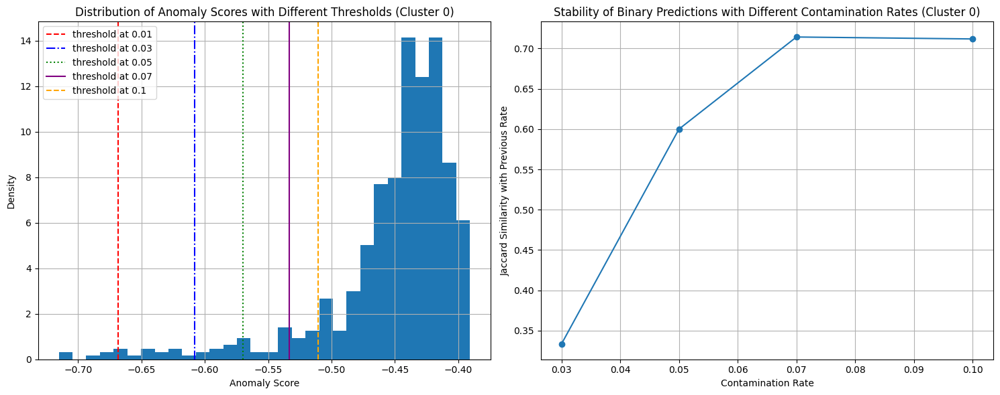


Analysis for Cluster 0

Threshold values for each contamination rate:
Rate 0.01: threshold = -0.6686
Rate 0.03: threshold = -0.6079
Rate 0.05: threshold = -0.5699
Rate 0.07: threshold = -0.5334
Rate 0.1: threshold = -0.5107

Number of anomalies detected at each contamination rate:
Rate 0.01: 6 anomalies
Rate 0.03: 18 anomalies
Rate 0.05: 30 anomalies
Rate 0.07: 42 anomalies
Rate 0.1: 59 anomalies


In [ ]:
analyze_iforest_contamination(rules0_df.copy(), 0)

Dari plot di sebelah kanan, diperoleh 0.1 sebagai nilai contamination yang stabil karena nilai similarity yang tinggi menunjukkan bahwa hasil prediksi saat menggunakan nilai 0.07 dan 0.1 tidak berbeda jauh. Selain itu dari plot sebelah kiri, terlihat posisi threshold yang memisahkan aturan yang outlier dan tidak (memotong ekor distribusi) saat menggunakan nilai contamination 0.1 juga cukup ideal.

C:\Users\lucin\AppData\Local\Temp\ipykernel_9608\582832218.py:59: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax3.boxplot(box_data, labels=n_neighbors_values)


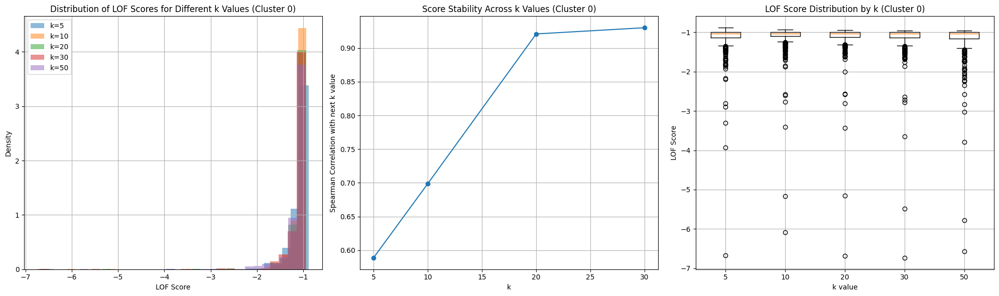


Score Statistics for Cluster 0:

k = 5:
Mean score: -1.1185
Std score: 0.3410
Min score (strongest outlier): -6.6752
Max score (strongest inlier): -0.8826
Percentage of points with score < -1: 69.95%

k = 10:
Mean score: -1.0997
Std score: 0.3321
Min score (strongest outlier): -6.0920
Max score (strongest inlier): -0.9349
Percentage of points with score < -1: 71.82%

k = 20:
Mean score: -1.1078
Std score: 0.3466
Min score (strongest outlier): -6.6815
Max score (strongest inlier): -0.9423
Percentage of points with score < -1: 71.48%

k = 30:
Mean score: -1.1238
Std score: 0.3659
Min score (strongest outlier): -6.7340
Max score (strongest inlier): -0.9505
Percentage of points with score < -1: 71.65%

k = 50:
Mean score: -1.1485
Std score: 0.4022
Min score (strongest outlier): -6.5745
Max score (strongest inlier): -0.9497
Percentage of points with score < -1: 68.42%

Spearman Rank Correlations between consecutive k values (Cluster 0):
k=5 vs k=10: 0.5887
k=10 vs k=20: 0.6987
k=20 vs k=30

In [ ]:
analyze_lof_parameters(rules0_df.copy(), 0)

Dari plot di atas diperoleh nilai n_neighbors yang ideal untuk digunakan adalah 20. Pemilihan ini paling terlihat dari plot di tengah yang menunjukkan bahwa k = 20 menghasilkan korelasi tertinggi, yang artinya hasil deteksi anomali dengan k = 20 sudah stabil, skornya tidak banyak berubah saat kita menambah lagi nilainya. Selain itu, dari plot kiri kita juga bisa melihat bahwa anomali pada association rule di segmen ini dapat dipisahkan dengan baik dari rule yang bukan anomali (beberapa aturan memiliki skor LOF yang sangat negatif). Dari plot kanan bisa dilihat bagaimana perubahan distribusi skor anomali saat menggunakan beberapa nilai n_neighbors berbeda. Terlihat bahwa menaikkan nilai k ke 30 akan menambah varians dari skor LOF yang diperoleh.

In [ ]:
rules_s0, iso_forest0, features0 = detect_anomalous_rules(rules0_df.copy(), contamination=0.07, n_neighbors=20)

In [ ]:
feature_importance0 = explain_anomalies(rules_s0, iso_forest0, features0)


Processing Cluster 0 with 589 rules...
Isolation Forest detected: 42 anomalies
LOF detected: 21 anomalies
Both methods agree on: 16 anomalies

Feature Importance Ranking for Anomalies in Cluster 0:
                      feature  importance
          leverage_normalized    1.046236
           support_normalized    1.039664
antecedent support_normalized    0.945794
        conviction_normalized    0.769893
        confidence_normalized    0.371435
              lift_normalized    0.337933
consequent support_normalized    0.242280


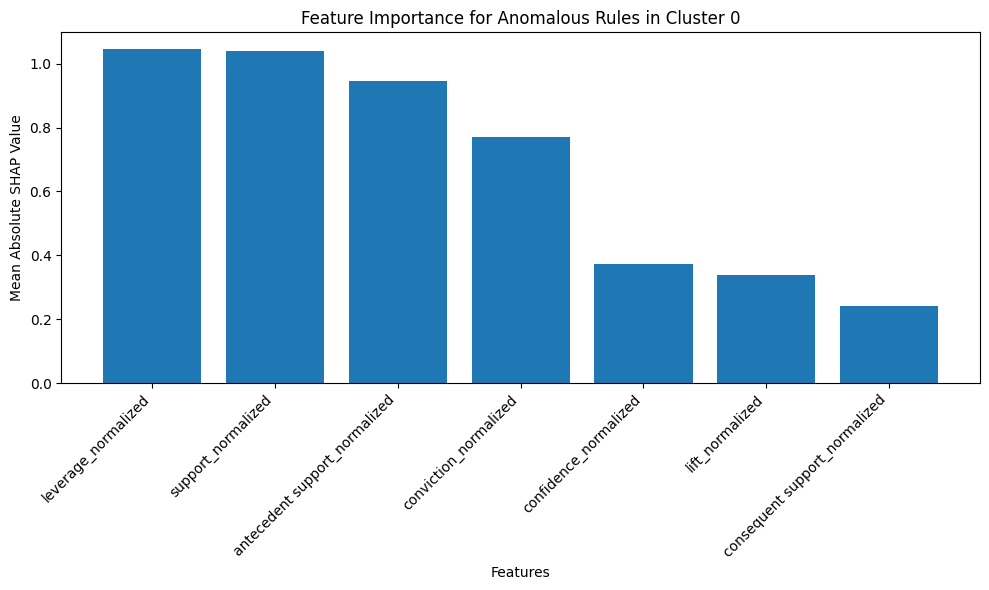

In [ ]:
display_anomaly_results(rules_s0, feature_importance0, cluster_id=0)

Dari diagram di atas, kita tahu bahwa 2 fitur yang paling berpengaruh dalam pendeteksian suatu association rule di segmen 0 sebagai anomali adalah leverage dan support. Selanjutnya kita coba visualisasikan 2 fitur paling penting tersebut untuk melihat sebaran anomalinya.

Automatically selected features: x_metric=leverage_normalized, y_metric=support_normalized


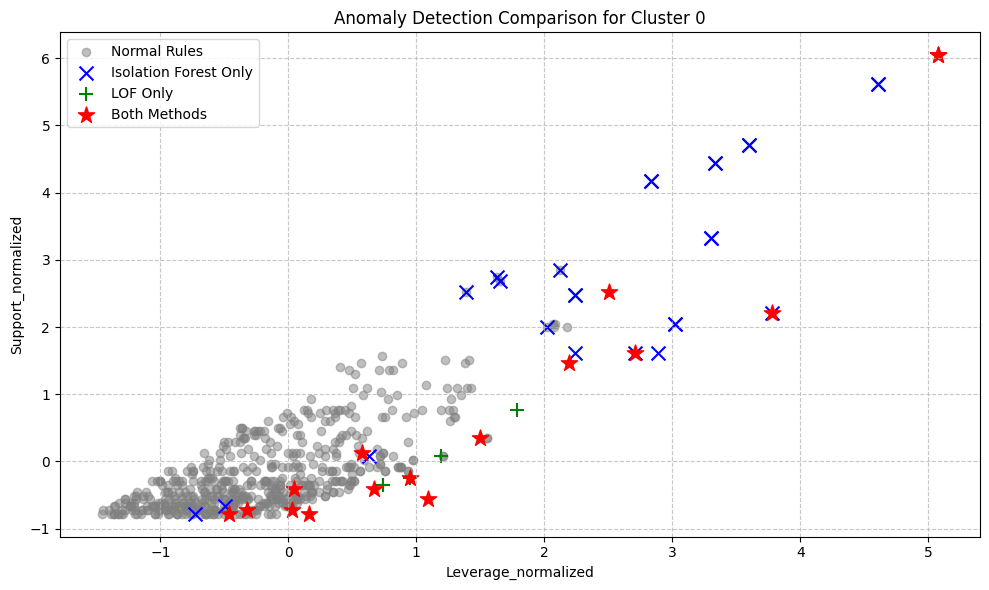

In [ ]:
# Ekstrak dua fitur dengan importance tertinggi
if feature_importance0 is not None and len(feature_importance0) >= 2:
    top_features = feature_importance0.nlargest(2, 'importance')['feature'].values
    x_metric, y_metric = top_features[0], top_features[1]
    print(f"Automatically selected features: x_metric={x_metric}, y_metric={y_metric}")
    visualize_anomaly_methods(rules_s0, x_metric=x_metric, y_metric=y_metric, cluster_id=0)
else:
    print("Not enough features in feature_importance or no anomalies detected. Using default metrics.")
    visualize_anomaly_methods(rules_s0, x_metric='support', y_metric='lift', cluster_id=0)

In [ ]:
general_business_rules0 = find_business_rules(rules_s0, cluster_id=0, use_initial_filters=True)
general_business_rules0

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,0,Casual Buyers,['spice tins']['cake tins'],(spice tins),(cake tins),0.034137,0.772727,6.413636,0.028814,3.869880,lift_normalized,9.999357,-0.181795,cross_selling,Offer complementary souvenirs
1,0,Casual Buyers,['candle']['t-lights'],(candle),(t-lights),0.158635,0.596226,1.571009,0.057658,1.536708,support_normalized,6.042288,-0.152768,bundling,Create affordable bundles
3,0,Casual Buyers,['t-lights']['candle'],(t-lights),(candle),0.158635,0.417989,1.571009,0.057658,1.261035,support_normalized,6.042288,-0.171451,bundling,Create affordable bundles
2,0,Casual Buyers,['sign']['tin'],(sign),(tin),0.150602,0.555556,1.563089,0.054253,1.450301,support_normalized,5.616155,-0.129103,bundling,Create affordable bundles
4,0,Casual Buyers,['woolly hottie']['hot water bottle'],(woolly hottie),(hot water bottle),0.031124,0.837838,3.113756,0.021129,4.507363,confidence_normalized,2.563949,-0.141944,cross_selling,Offer complementary souvenirs


In [ ]:
business_rules0 = find_business_rules(rules_s0, feature_importance0, cluster_id=0, use_initial_filters=True)
business_rules0

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,0,Casual Buyers,['candle']['t-lights'],(candle),(t-lights),0.158635,0.596226,1.571009,0.057658,1.536708,leverage_normalized,5.076808,-0.152768,cross_selling,Offer complementary souvenirs
1,0,Casual Buyers,['t-lights']['candle'],(t-lights),(candle),0.158635,0.417989,1.571009,0.057658,1.261035,leverage_normalized,5.076808,-0.171451,cross_selling,Offer complementary souvenirs
2,0,Casual Buyers,['sign']['tin'],(sign),(tin),0.150602,0.555556,1.563089,0.054253,1.450301,leverage_normalized,4.606440,-0.129103,cross_selling,Offer complementary souvenirs
3,0,Casual Buyers,['tin']['sign'],(tin),(sign),0.150602,0.423729,1.563089,0.054253,1.264883,leverage_normalized,4.606440,-0.134856,cross_selling,Offer complementary souvenirs
4,0,Casual Buyers,['bag']['box'],(bag),(box),0.133534,0.362398,1.542514,0.046965,1.199902,leverage_normalized,3.599703,-0.137414,cross_selling,Offer complementary souvenirs


Selanjutnya kita juga bisa mencari tahu association rules yang dianggap anomali itu kebanyakan terkait dengan produk apa saja. Semakin besar rasionya, semakin tinggi pula kecenderungan produk itu muncul dalam pola belanja yang anomali.

In [ ]:
items_analysis_dict0 = extract_items_from_rules(rules_s0)
for method, df in items_analysis_dict0.items():
    print(f"\nItems Contributing to Anomalous Rules ({method}):")
    print(df.head(10))


Items Contributing to Anomalous Rules (isolation_forest_anomaly):
                anomalous_freq  normal_freq     ratio
feltcraft doll        0.023810     0.000000       inf
spice tins            0.023810     0.000000       inf
woolly hottie         0.023810     0.000000       inf
jumbo vintage         0.023810     0.000000       inf
cabinet               0.023810     0.003656  6.511905
cake tins             0.023810     0.009141  2.604762
natural slate         0.023810     0.010969  2.170635
frame                 0.023810     0.010969  2.170635
lunch box             0.095238     0.054845  1.736508
hand warmer           0.095238     0.056673  1.680492

Items Contributing to Anomalous Rules (lof_anomaly):
                anomalous_freq  normal_freq      ratio
feltcraft doll        0.047619     0.000000        inf
spice tins            0.047619     0.000000        inf
woolly hottie         0.047619     0.000000        inf
jumbo vintage         0.047619     0.000000        inf
cabinet   

#### 3.3.2 Anomaly Detection Cluster 1

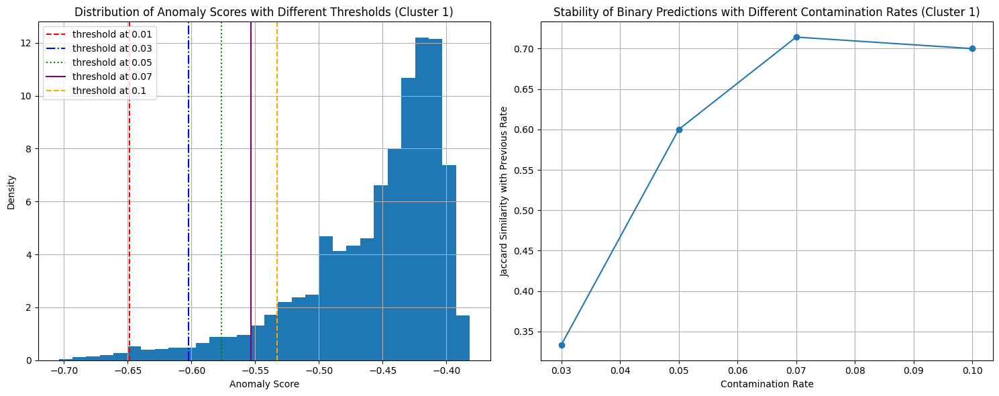


Analysis for Cluster 1

Threshold values for each contamination rate:
Rate 0.01: threshold = -0.6486
Rate 0.03: threshold = -0.6025
Rate 0.05: threshold = -0.5763
Rate 0.07: threshold = -0.5532
Rate 0.1: threshold = -0.5327

Number of anomalies detected at each contamination rate:
Rate 0.01: 50 anomalies
Rate 0.03: 150 anomalies
Rate 0.05: 250 anomalies
Rate 0.07: 350 anomalies
Rate 0.1: 500 anomalies


In [ ]:
analyze_iforest_contamination(rules1_df.copy(), 1)

Dari plot di sebelah kanan, diperoleh 0.07 sebagai nilai contamination yang stabil karena nilai similarity yang tinggi menunjukkan bahwa hasil prediksi saat menggunakan nilai 0.05 dan 0.07 tidak berbeda jauh. Bisa dilihat juga bahwa saat nilai contamination-nya dinaikkan lagi menjadi 0.1, nilai similaritynya justru malah turun. Selain itu dari plot sebelah kiri, terlihat posisi threshold yang memisahkan aturan yang outlier dan tidak (memotong ekor distribusi) saat menggunakan nilai contamination 0.07 juga cukup ideal.

C:\Users\lucin\AppData\Local\Temp\ipykernel_9608\582832218.py:59: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax3.boxplot(box_data, labels=n_neighbors_values)


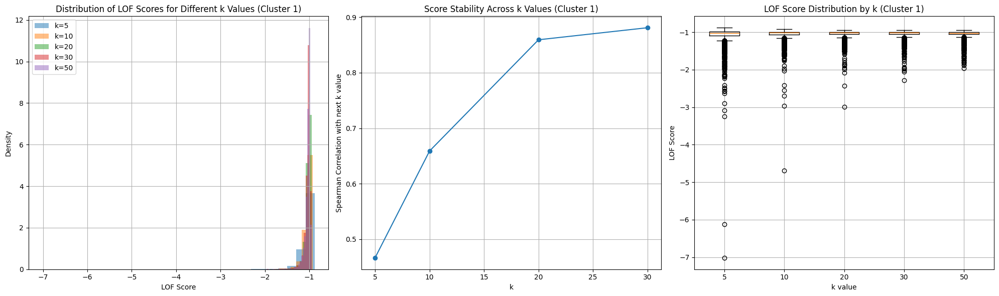


Score Statistics for Cluster 1:

k = 5:
Mean score: -1.0707
Std score: 0.1903
Min score (strongest outlier): -7.0170
Max score (strongest inlier): -0.8818
Percentage of points with score < -1: 68.48%

k = 10:
Mean score: -1.0472
Std score: 0.1143
Min score (strongest outlier): -4.6915
Max score (strongest inlier): -0.9213
Percentage of points with score < -1: 68.96%

k = 20:
Mean score: -1.0397
Std score: 0.0875
Min score (strongest outlier): -2.9880
Max score (strongest inlier): -0.9491
Percentage of points with score < -1: 68.48%

k = 30:
Mean score: -1.0391
Std score: 0.0804
Min score (strongest outlier): -2.2769
Max score (strongest inlier): -0.9466
Percentage of points with score < -1: 71.00%

k = 50:
Mean score: -1.0433
Std score: 0.0856
Min score (strongest outlier): -1.9623
Max score (strongest inlier): -0.9484
Percentage of points with score < -1: 74.02%

Spearman Rank Correlations between consecutive k values (Cluster 1):
k=5 vs k=10: 0.4665
k=10 vs k=20: 0.6589
k=20 vs k=30

In [ ]:
analyze_lof_parameters(rules1_df.copy(), 1)

Dari plot di atas diperoleh nilai n_neighbors yang ideal untuk digunakan adalah 30. Pemilihan ini paling terlihat dari plot di tengah yang menunjukkan bahwa k = 30 menghasilkan korelasi paling tinggi. Selain itu, dari plot kiri kita juga bisa melihat bahwa anomali pada association rule di segmen ini dapat dipisahkan dengan baik dari rule yang bukan anomali (beberapa aturan memiliki skor LOF yang sangat negatif). Dari plot kanan bisa dilihat bahwa perubahan distribusi skor anomali saat menggunakan beberapa nilai n_neighbors berbeda tidak begitu signifikan.


Processing Cluster 1 with 5000 rules...
Isolation Forest detected: 350 anomalies
LOF detected: 23 anomalies
Both methods agree on: 20 anomalies

Feature Importance Ranking for Anomalies in Cluster 1:
                      feature  importance
        conviction_normalized    0.981122
           support_normalized    0.926070
          leverage_normalized    0.806109
        confidence_normalized    0.705317
antecedent support_normalized    0.506634
consequent support_normalized    0.496311
              lift_normalized    0.356296


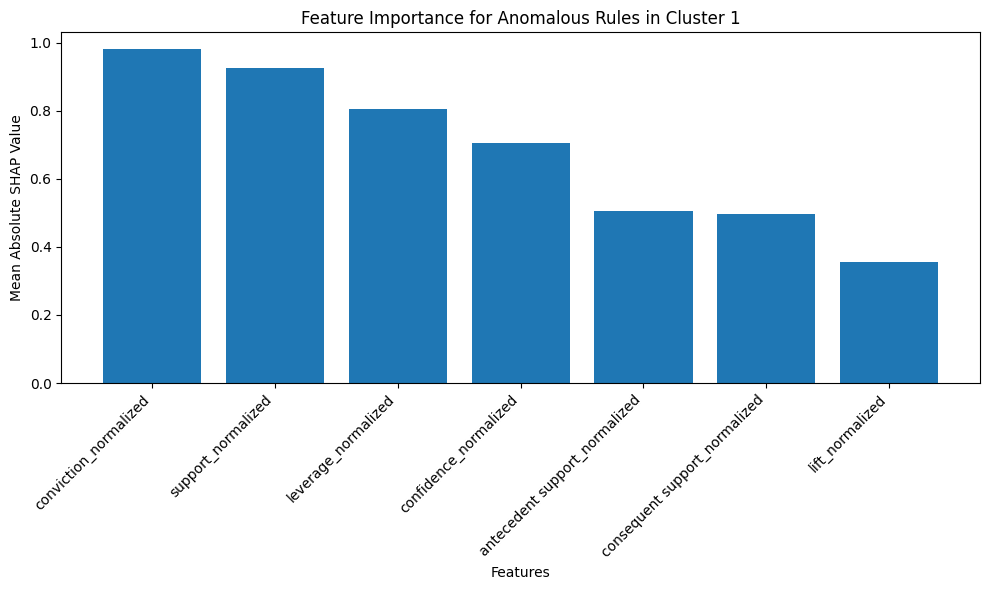

In [ ]:
rules_s1, iso_forest1, features1 = detect_anomalous_rules(rules1_df.copy(), contamination=0.07, n_neighbors=30)
feature_importance1 = explain_anomalies(rules_s1, iso_forest1, features1)
display_anomaly_results(rules_s1, feature_importance1, cluster_id=1)

Dari diagram di atas, kita tahu bahwa 2 fitur yang paling berpengaruh dalam pendeteksian suatu association rule di segmen 1 sebagai anomali adalah conviction dan support. Selanjutnya kita coba visualisasikan 2 fitur paling penting tersebut untuk melihat sebaran anomalinya.

Automatically selected features: x_metric=conviction_normalized, y_metric=support_normalized


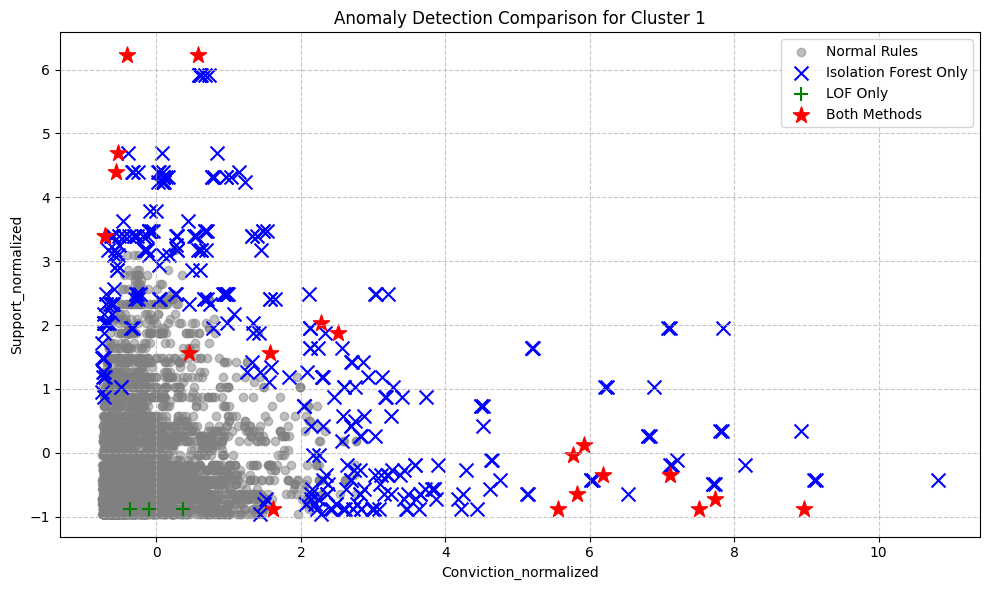

In [ ]:
# Ekstrak dua fitur dengan importance tertinggi
if feature_importance1 is not None and len(feature_importance1) >= 2:
    top_features = feature_importance1.nlargest(2, 'importance')['feature'].values
    x_metric, y_metric = top_features[0], top_features[1]
    print(f"Automatically selected features: x_metric={x_metric}, y_metric={y_metric}")
    visualize_anomaly_methods(rules_s1, x_metric=x_metric, y_metric=y_metric, cluster_id=1)
else:
    print("Not enough features in feature_importance or no anomalies detected. Using default metrics.")
    visualize_anomaly_methods(rules_s1, x_metric='support', y_metric='lift', cluster_id=1)

In [ ]:
general_business_rules1 = find_business_rules(rules_s1, cluster_id=1, use_initial_filters=True)
general_business_rules1

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,1,Inactive Customers,"['bag', 'dotcom postage']['jumbo vintage']","(dotcom postage, bag)",(jumbo vintage),0.066559,0.684647,6.899352,0.056912,2.856378,support_normalized,5.918062,-0.116880,promotions,Use time-limited offers
1,1,Inactive Customers,"['jumbo vintage']['bag', 'dotcom postage']",(jumbo vintage),"(dotcom postage, bag)",0.066559,0.670732,6.899352,0.056912,2.741787,support_normalized,5.918062,-0.116899,promotions,Use time-limited offers
2,1,Inactive Customers,"['bag', 'jumbo vintage']['dotcom postage']","(bag, jumbo vintage)",(dotcom postage),0.066559,0.679012,6.814865,0.056792,2.804977,support_normalized,5.918062,-0.117788,promotions,Use time-limited offers
3,1,Inactive Customers,"['dotcom postage']['bag', 'jumbo vintage']",(dotcom postage),"(bag, jumbo vintage)",0.066559,0.668016,6.814865,0.056792,2.716930,support_normalized,5.918062,-0.118715,promotions,Use time-limited offers
4,1,Inactive Customers,['jumbo vintage']['dotcom postage'],(jumbo vintage),(dotcom postage),0.066559,0.670732,6.731757,0.056672,2.734436,support_normalized,5.918062,-0.119170,promotions,Use time-limited offers


In [ ]:
business_rules1 = find_business_rules(rules_s1, feature_importance1, cluster_id=1, use_initial_filters=True)
business_rules1

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,1,Inactive Customers,"['bag', 'jumbo vintage', 'lunch box', 'picnic ...","(lunch box, bag, picnic basket, jumbo vintage)",(dotcom postage),0.033078,0.931818,9.352135,0.029541,13.205325,conviction_normalized,10.826021,-0.105766,reactivation,Re-engage with targeted offers
2,1,Inactive Customers,"['bag', 'jumbo vintage', 'picnic basket', 'sig...","(bag, picnic basket, jumbo vintage, sign)",(dotcom postage),0.037112,0.920000,9.233522,0.033092,11.254538,conviction_normalized,8.921781,-0.105464,reactivation,Re-engage with targeted offers
1,1,Inactive Customers,"['bag', 'jumbo vintage', 'picnic basket']['dot...","(picnic basket, bag, jumbo vintage)",(dotcom postage),0.045583,0.911290,9.146108,0.040599,10.149547,conviction_normalized,7.843155,-0.125437,reactivation,Re-engage with targeted offers
3,1,Inactive Customers,"['jumbo vintage', 'picnic basket']['bag', 'dot...","(picnic basket, jumbo vintage)","(dotcom postage, bag)",0.045583,0.904000,9.298822,0.040681,9.403994,conviction_normalized,7.115390,-0.134204,reactivation,Re-engage with targeted offers
4,1,Inactive Customers,"['jumbo vintage', 'picnic basket']['dotcom pos...","(picnic basket, jumbo vintage)",(dotcom postage),0.045583,0.904000,9.072939,0.040559,9.378782,conviction_normalized,7.090780,-0.124156,reactivation,Re-engage with targeted offers


In [ ]:
items_analysis_dict1 = extract_items_from_rules(rules_s1)
for method, df in items_analysis_dict1.items():
    print(f"\nItems Contributing to Anomalous Rules ({method}):")
    print(df.head(10))


Items Contributing to Anomalous Rules (isolation_forest_anomaly):
                anomalous_freq  normal_freq      ratio
polkadot cup          0.002857     0.000000        inf
gold tape             0.002857     0.000000        inf
roses regency         0.008571     0.000645  13.285714
regency teacup        0.008571     0.000645  13.285714
spotty paper          0.020000     0.004301   4.650000
toadstool led         0.020000     0.006667   3.000000
jumbo vintage         0.345714     0.169247   2.042657
dotcom postage        0.577143     0.293548   1.966091
picnic basket         0.200000     0.141290   1.415525
lunch box             0.211429     0.155484   1.359810

Items Contributing to Anomalous Rules (lof_anomaly):
                anomalous_freq  normal_freq     ratio
regency teacup        0.260870     0.000000       inf
roses regency         0.260870     0.000000       inf
lunch box             0.260870     0.158931  1.641401
retrospot cake        0.478261     0.293550  1.629230
bowl

#### 3.3.3 Anomaly Detection Cluster 2

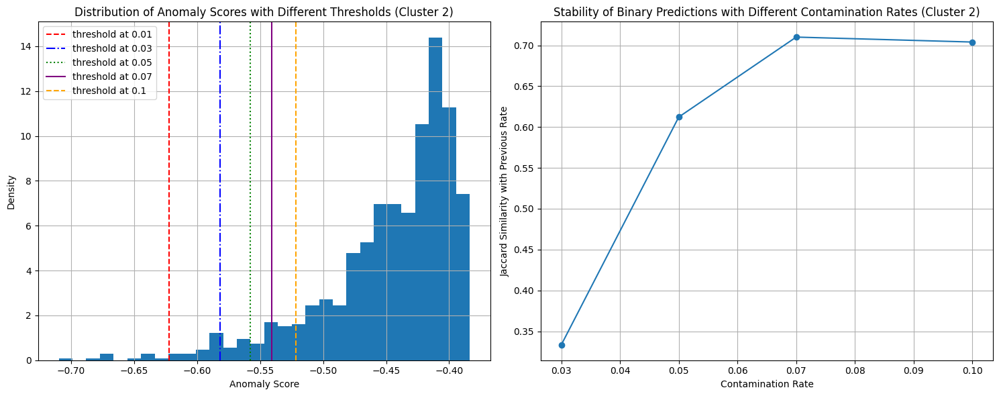


Analysis for Cluster 2

Threshold values for each contamination rate:
Rate 0.01: threshold = -0.6224
Rate 0.03: threshold = -0.5819
Rate 0.05: threshold = -0.5578
Rate 0.07: threshold = -0.5409
Rate 0.1: threshold = -0.5216

Number of anomalies detected at each contamination rate:
Rate 0.01: 10 anomalies
Rate 0.03: 30 anomalies
Rate 0.05: 49 anomalies
Rate 0.07: 69 anomalies
Rate 0.1: 98 anomalies


In [ ]:
analyze_iforest_contamination(rules2_df.copy(), 2)

Dari plot di sebelah kanan, diperoleh 0.07 sebagai nilai contamination yang stabil karena nilai similarity yang tinggi menunjukkan bahwa hasil prediksi saat menggunakan nilai 0.05 dan 0.07 tidak berbeda jauh. Bisa dilihat juga bahwa saat nilai contamination-nya dinaikkan lagi menjadi 0.1, nilai similaritynya justru malah turun. Selain itu dari plot sebelah kiri, terlihat posisi threshold yang memisahkan aturan yang outlier dan tidak (memotong ekor distribusi) saat menggunakan nilai contamination 0.07 juga cukup ideal.

C:\Users\lucin\AppData\Local\Temp\ipykernel_9608\582832218.py:59: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax3.boxplot(box_data, labels=n_neighbors_values)


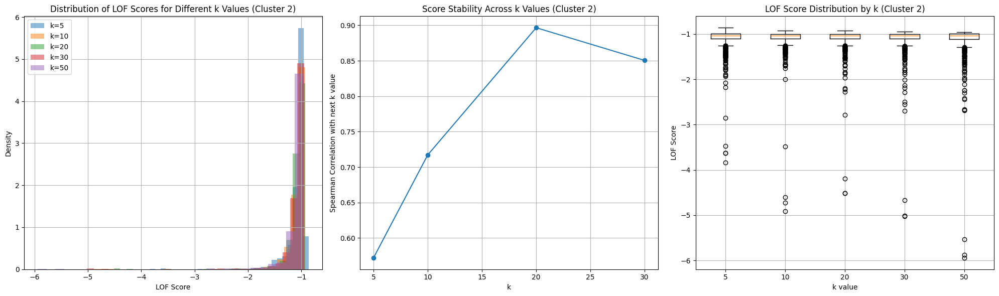


Score Statistics for Cluster 2:

k = 5:
Mean score: -1.0912
Std score: 0.2305
Min score (strongest outlier): -3.8376
Max score (strongest inlier): -0.8614
Percentage of points with score < -1: 72.42%

k = 10:
Mean score: -1.0856
Std score: 0.2484
Min score (strongest outlier): -4.9178
Max score (strongest inlier): -0.9261
Percentage of points with score < -1: 77.02%

k = 20:
Mean score: -1.0885
Std score: 0.2356
Min score (strongest outlier): -4.5173
Max score (strongest inlier): -0.9242
Percentage of points with score < -1: 76.81%

k = 30:
Mean score: -1.0961
Std score: 0.2668
Min score (strongest outlier): -5.0215
Max score (strongest inlier): -0.9429
Percentage of points with score < -1: 75.79%

k = 50:
Mean score: -1.1084
Std score: 0.3227
Min score (strongest outlier): -5.9413
Max score (strongest inlier): -0.9573
Percentage of points with score < -1: 71.91%

Spearman Rank Correlations between consecutive k values (Cluster 2):
k=5 vs k=10: 0.5722
k=10 vs k=20: 0.7172
k=20 vs k=30

In [ ]:
analyze_lof_parameters(rules2_df.copy(), 2)

Dari plot di atas diperoleh nilai n_neighbors yang ideal untuk digunakan adalah 20. Pemilihan ini paling terlihat dari plot di tengah yang menunjukkan bahwa k = 20 sudah menghasilkan korelasi yang cukup tinggi. Menambah nilai k menjadi 30 hanya menambah sedikit nilai korelasi lebih mendekati satu. Selain itu, dari plot kiri kita juga bisa melihat bahwa anomali pada association rule di segmen ini dapat dipisahkan dengan baik dari rule yang bukan anomali (beberapa aturan memiliki skor LOF yang sangat negatif). Dari plot kanan bisa dilihat bahwa perubahan distribusi skor anomali saat menggunakan beberapa nilai n_neighbors berbeda tidak begitu signifikan.


Processing Cluster 2 with 979 rules...
Isolation Forest detected: 69 anomalies
LOF detected: 26 anomalies
Both methods agree on: 17 anomalies

Feature Importance Ranking for Anomalies in Cluster 2:
                      feature  importance
           support_normalized    1.000280
          leverage_normalized    0.959154
antecedent support_normalized    0.834831
        conviction_normalized    0.659248
              lift_normalized    0.406064
consequent support_normalized    0.381486
        confidence_normalized    0.343803


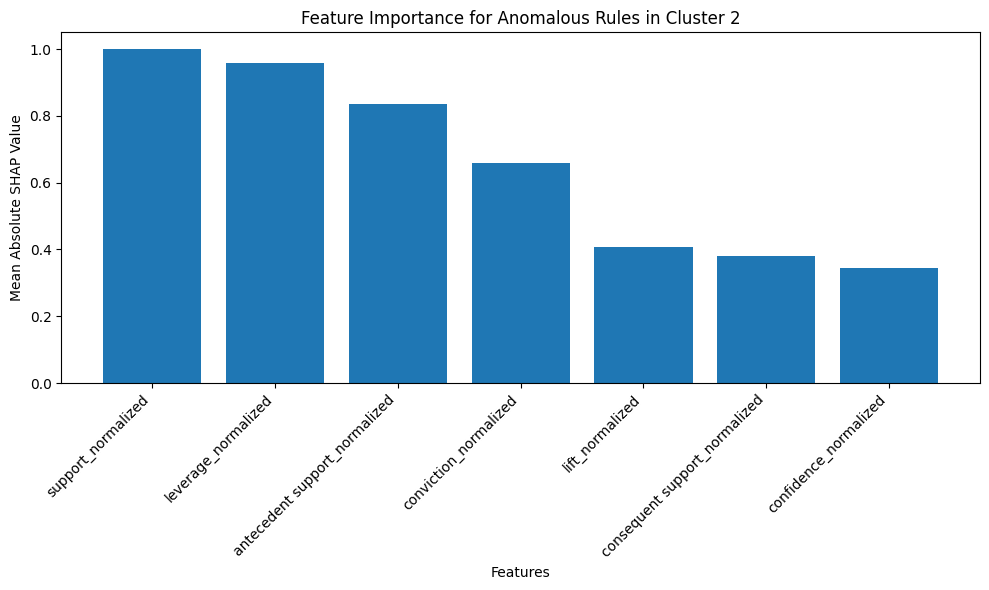

In [ ]:
rules_s2, iso_forest2, features2 = detect_anomalous_rules(rules2_df.copy(), contamination=0.07, n_neighbors=20)
feature_importance2 = explain_anomalies(rules_s2, iso_forest2, features2)
display_anomaly_results(rules_s2, feature_importance2, cluster_id=2)

Dari diagram di atas, terlihat bahwa urutan feature importance pada deteksi anomali association rule di cluster 2 berbeda dari cluster 0 dan 1. 2 Fitur yang paling berperan penting di cluster 2 adalah support dan leverage.

Automatically selected features: x_metric=support_normalized, y_metric=leverage_normalized


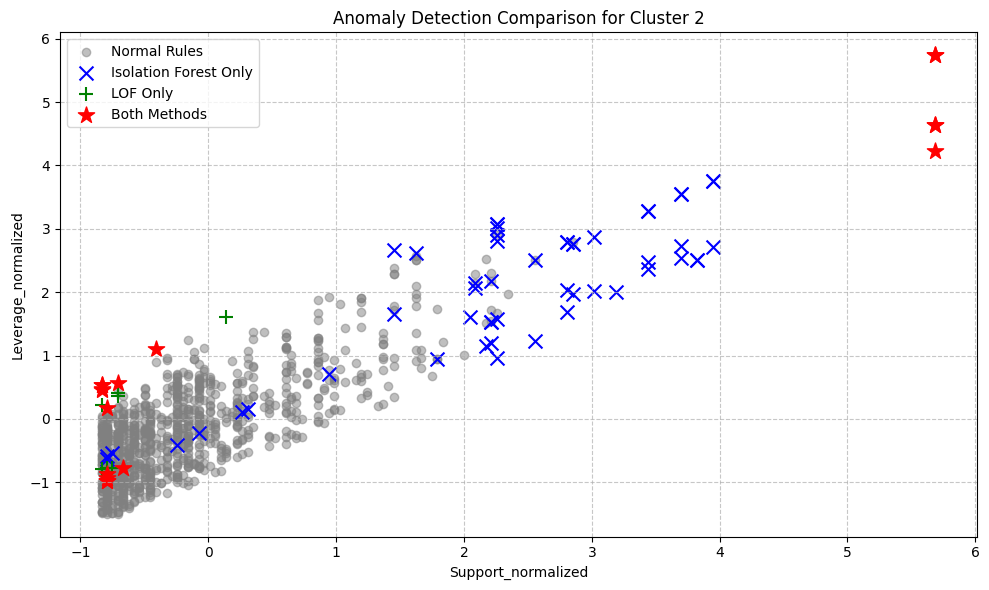

In [ ]:
# Ekstrak dua fitur dengan importance tertinggi
if feature_importance2 is not None and len(feature_importance2) >= 2:
    top_features = feature_importance2.nlargest(2, 'importance')['feature'].values
    x_metric, y_metric = top_features[0], top_features[1]
    print(f"Automatically selected features: x_metric={x_metric}, y_metric={y_metric}")
    visualize_anomaly_methods(rules_s2, x_metric=x_metric, y_metric=y_metric, cluster_id=2)
else:
    print("Not enough features in feature_importance or no anomalies detected. Using default metrics.")
    visualize_anomaly_methods(rules_s2, x_metric='support', y_metric='lift', cluster_id=2)

In [ ]:
rules_s2[rules_s2['support_normalized'] > 5]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,...,support_normalized,confidence_normalized,lift_normalized,leverage_normalized,conviction_normalized,rule_id,isolation_forest_anomaly,lof_anomaly,combined_anomaly,anomaly_score
327,"(bag, sign)",(tin),0.274432,0.459033,0.202369,0.737410,1.606444,1.0,0.076396,2.060123,...,5.686362,0.702530,-0.953728,4.639484,-0.116512,"['bag', 'sign']->['tin']",1,1,1,-0.133727
339,"(tin, bag)",(sign),0.317868,0.363277,0.202369,0.636646,1.752506,1.0,0.086895,1.752348,...,5.686362,0.070158,-0.522137,5.738552,-0.278623,"['bag', 'tin']->['sign']",1,1,1,-0.132689
951,"(tin, sign)",(bag),0.241856,0.537019,0.202369,0.836735,1.558111,1.0,0.072488,2.835760,...,5.686362,1.325868,-1.096545,4.230419,0.292033,"['sign', 'tin']->['bag']",1,1,1,-0.131102
957,(sign),"(tin, bag)",0.363277,0.317868,0.202369,0.557065,1.752506,1.0,0.086895,1.540029,...,5.686362,-0.429273,-0.522137,5.738552,-0.390456,"['sign']->['bag', 'tin']",1,1,1,-0.138900
969,(tin),"(bag, sign)",0.459033,0.274432,0.202369,0.440860,1.606444,1.0,0.076396,1.297650,...,5.686362,-1.158548,-0.953728,4.639484,-0.518122,"['tin']->['bag', 'sign']",1,1,1,-0.168905


In [ ]:
general_business_rules2 = find_business_rules(rules_s2, cluster_id=2, use_initial_filters=True)
general_business_rules2

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,2,Loyal High-Value Customers,"['sign', 'tin']['bag']","(tin, sign)",(bag),0.202369,0.836735,1.558111,0.072488,2.835760,support_normalized,5.686362,-0.131102,cross_selling,Offer complementary products
1,2,Loyal High-Value Customers,"['bag', 'sign']['tin']","(bag, sign)",(tin),0.202369,0.737410,1.606444,0.076396,2.060123,support_normalized,5.686362,-0.133727,cross_selling,Offer complementary products
2,2,Loyal High-Value Customers,"['bag', 'tin']['sign']","(tin, bag)",(sign),0.202369,0.636646,1.752506,0.086895,1.752348,support_normalized,5.686362,-0.132689,cross_selling,Offer complementary products
3,2,Loyal High-Value Customers,"['sign']['bag', 'tin']",(sign),"(tin, bag)",0.202369,0.557065,1.752506,0.086895,1.540029,support_normalized,5.686362,-0.138900,cross_selling,Offer complementary products
4,2,Loyal High-Value Customers,"['sign', 't-lights']['bag']","(t-lights, sign)",(bag),0.161895,0.836735,1.558111,0.057990,2.835760,support_normalized,3.950224,-0.074313,cross_selling,Offer complementary products


In [ ]:
business_rules2 = find_business_rules(rules_s2, feature_importance2, cluster_id=2, use_initial_filters=True)
business_rules2

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,2,Loyal High-Value Customers,"['sign']['bag', 'tin']",(sign),"(tin, bag)",0.202369,0.557065,1.752506,0.086895,1.540029,support_normalized,5.686362,-0.138900,cross_selling,Offer complementary products
1,2,Loyal High-Value Customers,"['bag', 'tin']['sign']","(tin, bag)",(sign),0.202369,0.636646,1.752506,0.086895,1.752348,support_normalized,5.686362,-0.132689,cross_selling,Offer complementary products
2,2,Loyal High-Value Customers,"['bag', 'sign']['tin']","(bag, sign)",(tin),0.202369,0.737410,1.606444,0.076396,2.060123,support_normalized,5.686362,-0.133727,cross_selling,Offer complementary products
3,2,Loyal High-Value Customers,"['tin']['bag', 'sign']",(tin),"(bag, sign)",0.202369,0.440860,1.606444,0.076396,1.297650,support_normalized,5.686362,-0.168905,cross_selling,Offer complementary products
4,2,Loyal High-Value Customers,"['sign', 'tin']['bag']","(tin, sign)",(bag),0.202369,0.836735,1.558111,0.072488,2.835760,support_normalized,5.686362,-0.131102,cross_selling,Offer complementary products


In [ ]:
items_analysis_dict2 = extract_items_from_rules(rules_s2)
for method, df in items_analysis_dict2.items():
    print(f"\nItems Contributing to Anomalous Rules ({method}):")
    print(df.head(10))


Items Contributing to Anomalous Rules (isolation_forest_anomaly):
                   anomalous_freq  normal_freq     ratio
cream stripe             0.072464     0.000000       inf
travel card              0.043478     0.006593  6.594203
babushka notebook        0.101449     0.048352  2.098155
lunch box                0.057971     0.041758  1.388253
bag                      0.840580     0.670330  1.253980
tin                      0.695652     0.598901  1.161548
sign                     0.492754     0.521978  0.944012
t-lights                 0.246377     0.302198  0.815283
pan                      0.202899     0.258242  0.785692
candle                   0.231884     0.326374  0.710487

Items Contributing to Anomalous Rules (lof_anomaly):
                   anomalous_freq  normal_freq      ratio
cream stripe             0.115385     0.002099  54.980769
babushka notebook        0.307692     0.045121   6.819320
travel card              0.038462     0.008395   4.581731
plate               

#### 3.3.4 Anomaly Detection Cluster 3

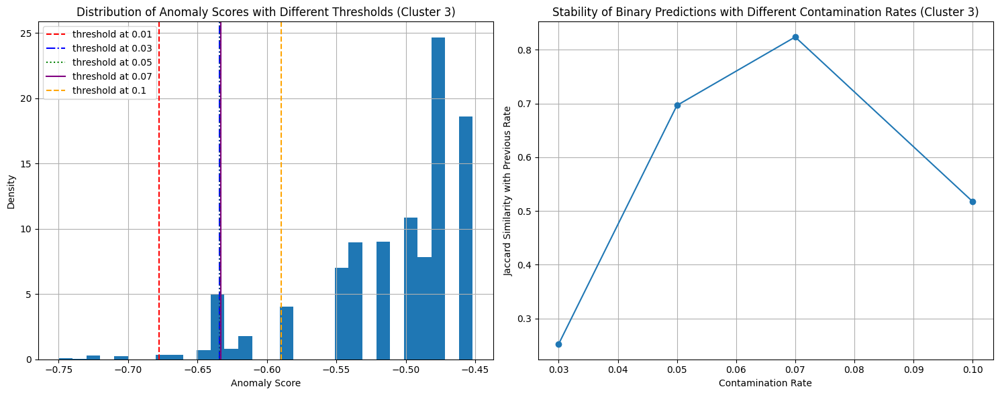


Analysis for Cluster 3

Threshold values for each contamination rate:
Rate 0.01: threshold = -0.6776
Rate 0.03: threshold = -0.6342
Rate 0.05: threshold = -0.6337
Rate 0.07: threshold = -0.6332
Rate 0.1: threshold = -0.5897

Number of anomalies detected at each contamination rate:
Rate 0.01: 51 anomalies
Rate 0.03: 202 anomalies
Rate 0.05: 290 anomalies
Rate 0.07: 352 anomalies
Rate 0.1: 680 anomalies


In [ ]:
analyze_iforest_contamination(rules3_df.copy(), 3)

d:\Semester 6\PenambanganData\gcgcgc\env\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\env\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\env\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\env\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(
C:\Users\lucin\AppData\Local\Temp\ipykernel_9608\582832218.py:59: Matplotlib

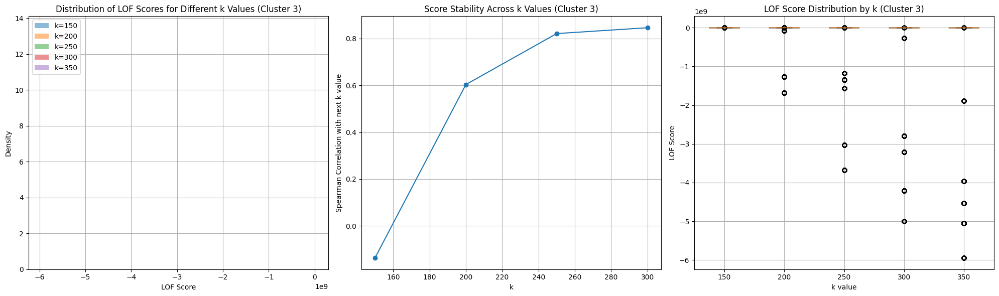


Score Statistics for Cluster 3:

k = 150:
Mean score: -1.0129
Std score: 0.1340
Min score (strongest outlier): -3.2090
Max score (strongest inlier): -0.9999
Percentage of points with score < -1: 6.60%

k = 200:
Mean score: -105555140.5782
Std score: 378022314.6914
Min score (strongest outlier): -1685073240.3912
Max score (strongest inlier): -0.9516
Percentage of points with score < -1: 17.80%

k = 250:
Mean score: -416161399.2733
Std score: 931321294.6185
Min score (strongest outlier): -3672297543.3975
Max score (strongest inlier): -0.9305
Percentage of points with score < -1: 34.44%

k = 300:
Mean score: -605017720.2061
Std score: 1390192071.8784
Min score (strongest outlier): -4997113745.4016
Max score (strongest inlier): -0.9596
Percentage of points with score < -1: 38.22%

k = 350:
Mean score: -873393100.4045
Std score: 1783624592.4977
Min score (strongest outlier): -5943411032.5474
Max score (strongest inlier): -0.9779
Percentage of points with score < -1: 41.22%

Spearman Rank C

In [ ]:
analyze_lof_parameters(rules3_df.copy(), 3, [150, 200, 250, 300, 350])

Perhatikan bahwa terdapat peringatan "UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results."
Oleh karena itu, nilai k yang dicoba lebih besar dari cluster lain. Hal ini masuk akal karena memang jumlah rule cluster ini jauh lebih banyak dari jumlah rule cluster lain. Justifikasi alasan pemilihan contamination rate untuk isolation forest dan nilai k untuk LOF serupa dengan cluster-cluster sebelumnya.

d:\Semester 6\PenambanganData\gcgcgc\env\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(



Processing Cluster 3 with 5000 rules...
Isolation Forest detected: 290 anomalies
LOF detected: 1053 anomalies
Both methods agree on: 34 anomalies

Feature Importance Ranking for Anomalies in Cluster 3:
                      feature  importance
          leverage_normalized    1.475334
           support_normalized    1.263038
antecedent support_normalized    0.410046
        conviction_normalized    0.223446
        confidence_normalized    0.205369
consequent support_normalized    0.154745
              lift_normalized    0.107518


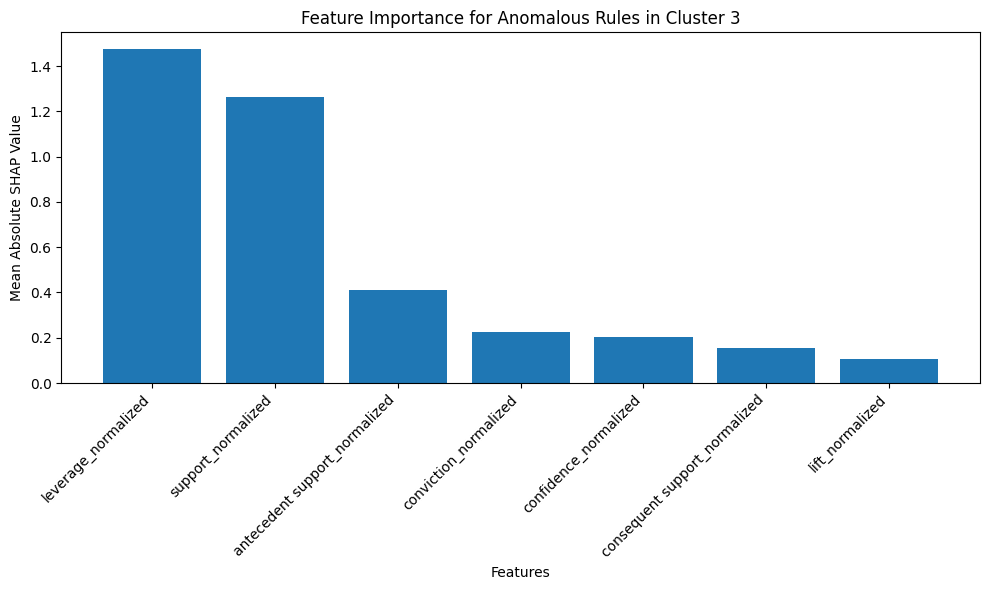

In [ ]:
rules_s3, iso_forest3, features3 = detect_anomalous_rules(rules3_df.copy(), contamination=0.07, n_neighbors=250)
feature_importance3 = explain_anomalies(rules_s3, iso_forest3, features3)
display_anomaly_results(rules_s3, feature_importance3, cluster_id=3)

Automatically selected features: x_metric=leverage_normalized, y_metric=support_normalized


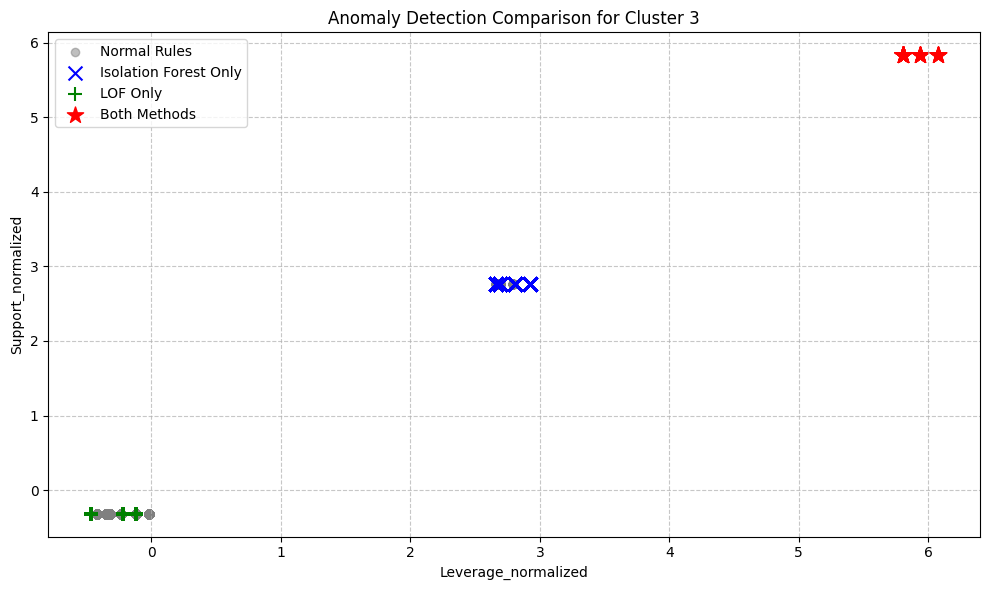

In [ ]:
# Ekstrak dua fitur dengan importance tertinggi
if feature_importance3 is not None and len(feature_importance3) >= 2:
    top_features = feature_importance3.nlargest(2, 'importance')['feature'].values
    x_metric, y_metric = top_features[0], top_features[1]
    print(f"Automatically selected features: x_metric={x_metric}, y_metric={y_metric}")
    visualize_anomaly_methods(rules_s3, x_metric=x_metric, y_metric=y_metric, cluster_id=3)
else:
    print("Not enough features in feature_importance or no anomalies detected. Using default metrics.")
    visualize_anomaly_methods(rules_s3, x_metric='support', y_metric='lift', cluster_id=3)

In [ ]:
general_business_rules3 = find_business_rules(rules_s3, cluster_id=3, use_initial_filters=True)
general_business_rules3

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,3,VIP/Wholesale Customers,"['doormat fancy', 'souvenir england']['doormat...","(doormat fancy, souvenir england)","(doormat hearts, doormat retrospot)",0.040609,1.0,24.625000,0.038960,18.020305,support_normalized,5.831822,-0.116702,wholesale,Offer bulk purchase deals
1,3,VIP/Wholesale Customers,"['doormat hearts', 'doormat retrospot']['doorm...","(doormat hearts, doormat retrospot)","(doormat fancy, souvenir england)",0.040609,1.0,24.625000,0.038960,18.020305,support_normalized,5.831822,-0.116702,wholesale,Offer bulk purchase deals
2,3,VIP/Wholesale Customers,"['doormat retrospot', 'souvenir england']['doo...","(doormat retrospot, souvenir england)","(doormat hearts, doormat fancy)",0.040609,1.0,24.625000,0.038960,18.020305,support_normalized,5.831822,-0.116702,wholesale,Offer bulk purchase deals
3,3,VIP/Wholesale Customers,"['doormat fancy', 'doormat hearts']['doormat r...","(doormat hearts, doormat fancy)","(doormat retrospot, souvenir england)",0.040609,1.0,24.625000,0.038960,18.020305,support_normalized,5.831822,-0.116702,wholesale,Offer bulk purchase deals
4,3,VIP/Wholesale Customers,"['doormat hearts', 'doormat retrospot']['doorm...","(doormat hearts, doormat retrospot)",(doormat fancy),0.040609,1.0,21.888889,0.038754,18.020305,support_normalized,5.831822,-0.099561,wholesale,Offer bulk purchase deals


In [ ]:
business_rules3 = find_business_rules(rules_s3, feature_importance3, cluster_id=3, use_initial_filters=True)
business_rules3

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,3,VIP/Wholesale Customers,"['doormat fancy', 'souvenir england']['doormat...","(doormat fancy, souvenir england)","(doormat hearts, doormat retrospot)",0.040609,1.0,24.625000,0.038960,18.020305,leverage_normalized,6.072542,-0.116702,wholesale,Offer bulk purchase deals
1,3,VIP/Wholesale Customers,"['doormat fancy', 'doormat hearts']['doormat r...","(doormat hearts, doormat fancy)","(doormat retrospot, souvenir england)",0.040609,1.0,24.625000,0.038960,18.020305,leverage_normalized,6.072542,-0.116702,wholesale,Offer bulk purchase deals
2,3,VIP/Wholesale Customers,"['doormat hearts', 'doormat retrospot']['doorm...","(doormat hearts, doormat retrospot)","(doormat fancy, souvenir england)",0.040609,1.0,24.625000,0.038960,18.020305,leverage_normalized,6.072542,-0.116702,wholesale,Offer bulk purchase deals
3,3,VIP/Wholesale Customers,"['doormat retrospot', 'souvenir england']['doo...","(doormat retrospot, souvenir england)","(doormat hearts, doormat fancy)",0.040609,1.0,24.625000,0.038960,18.020305,leverage_normalized,6.072542,-0.116702,wholesale,Offer bulk purchase deals
4,3,VIP/Wholesale Customers,"['doormat retrospot', 'souvenir england']['doo...","(doormat retrospot, souvenir england)",(doormat fancy),0.040609,1.0,21.888889,0.038754,18.020305,leverage_normalized,5.939374,-0.099561,wholesale,Offer bulk purchase deals


In [ ]:
items_analysis_dict_guest3 = extract_items_from_rules(rules_s3)
for method, df in items_analysis_dict_guest3.items():
    print(f"\nItems Contributing to Anomalous Rules ({method}):")
    print(df.head(10))


Items Contributing to Anomalous Rules (isolation_forest_anomaly):
                    anomalous_freq  normal_freq     ratio
card holder               0.041379     0.000000       inf
wood board                0.041379     0.000000       inf
hook photo                0.062069     0.000000       inf
zinc heart                0.062069     0.000000       inf
dolly girl                0.134483     0.016348  8.226153
spaceboy childrens        0.134483     0.016348  8.226153
ivory kitchen             0.072414     0.021019  3.445141
kitchen scales            0.072414     0.022293  3.248276
tea towel                 0.031034     0.012102  2.564428
souvenir england          0.168966     0.073885  2.286861

Items Contributing to Anomalous Rules (lof_anomaly):
                   anomalous_freq  normal_freq      ratio
sweetheart fairy         0.077873     0.004560  17.075762
hook hanger              0.077873     0.005067  15.368186
retrospot tea            0.005698     0.001520   3.748338
doormat f

#### 3.3.5 Anomaly Detection Cluster 4

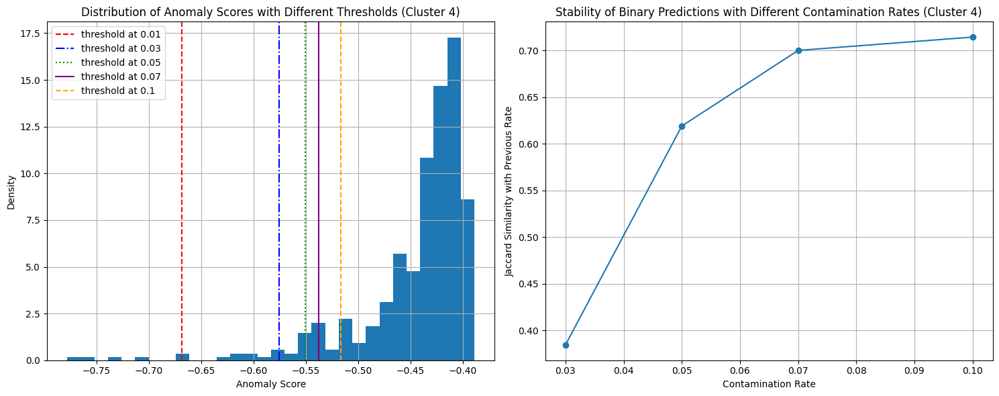


Analysis for Cluster 4

Threshold values for each contamination rate:
Rate 0.01: threshold = -0.6684
Rate 0.03: threshold = -0.5753
Rate 0.05: threshold = -0.5504
Rate 0.07: threshold = -0.5374
Rate 0.1: threshold = -0.5162

Number of anomalies detected at each contamination rate:
Rate 0.01: 5 anomalies
Rate 0.03: 13 anomalies
Rate 0.05: 21 anomalies
Rate 0.07: 30 anomalies
Rate 0.1: 42 anomalies


In [ ]:
analyze_iforest_contamination(rules4_df.copy(), 4)

C:\Users\lucin\AppData\Local\Temp\ipykernel_9608\582832218.py:59: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax3.boxplot(box_data, labels=n_neighbors_values)


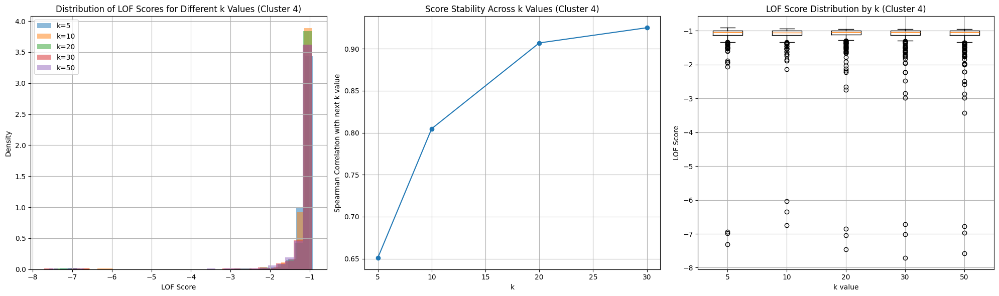


Score Statistics for Cluster 4:

k = 5:
Mean score: -1.1266
Std score: 0.5265
Min score (strongest outlier): -7.3136
Max score (strongest inlier): -0.9080
Percentage of points with score < -1: 72.62%

k = 10:
Mean score: -1.1297
Std score: 0.4695
Min score (strongest outlier): -6.7501
Max score (strongest inlier): -0.9406
Percentage of points with score < -1: 73.81%

k = 20:
Mean score: -1.1443
Std score: 0.5471
Min score (strongest outlier): -7.4534
Max score (strongest inlier): -0.9481
Percentage of points with score < -1: 75.48%

k = 30:
Mean score: -1.1538
Std score: 0.5604
Min score (strongest outlier): -7.7086
Max score (strongest inlier): -0.9482
Percentage of points with score < -1: 74.29%

k = 50:
Mean score: -1.1717
Std score: 0.5759
Min score (strongest outlier): -7.5787
Max score (strongest inlier): -0.9515
Percentage of points with score < -1: 71.90%

Spearman Rank Correlations between consecutive k values (Cluster 4):
k=5 vs k=10: 0.6511
k=10 vs k=20: 0.8048
k=20 vs k=30

In [ ]:
analyze_lof_parameters(rules4_df.copy(), 4)

Justifikasi alasan pemilihan contamination rate untuk isolation forest dan nilai k untuk LOF serupa dengan cluster-cluster sebelumnya.


Processing Cluster 4 with 420 rules...
Isolation Forest detected: 42 anomalies
LOF detected: 27 anomalies
Both methods agree on: 26 anomalies

Feature Importance Ranking for Anomalies in Cluster 4:
                      feature  importance
          leverage_normalized    0.897742
           support_normalized    0.719204
              lift_normalized    0.717593
antecedent support_normalized    0.708723
        conviction_normalized    0.639412
        confidence_normalized    0.384781
consequent support_normalized    0.371441


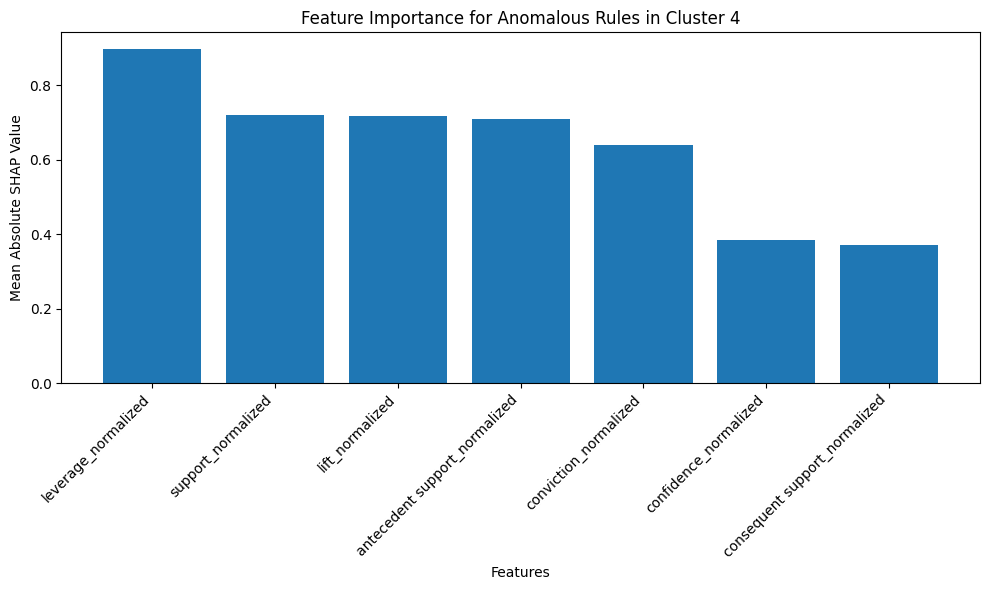

In [ ]:
rules_s4, iso_forest4, features4 = detect_anomalous_rules(rules4_df.copy(), contamination=0.1, n_neighbors=30)
feature_importance4 = explain_anomalies(rules_s4, iso_forest4, features4)
display_anomaly_results(rules_s4, feature_importance4, cluster_id=4)

Automatically selected features: x_metric=leverage_normalized, y_metric=support_normalized


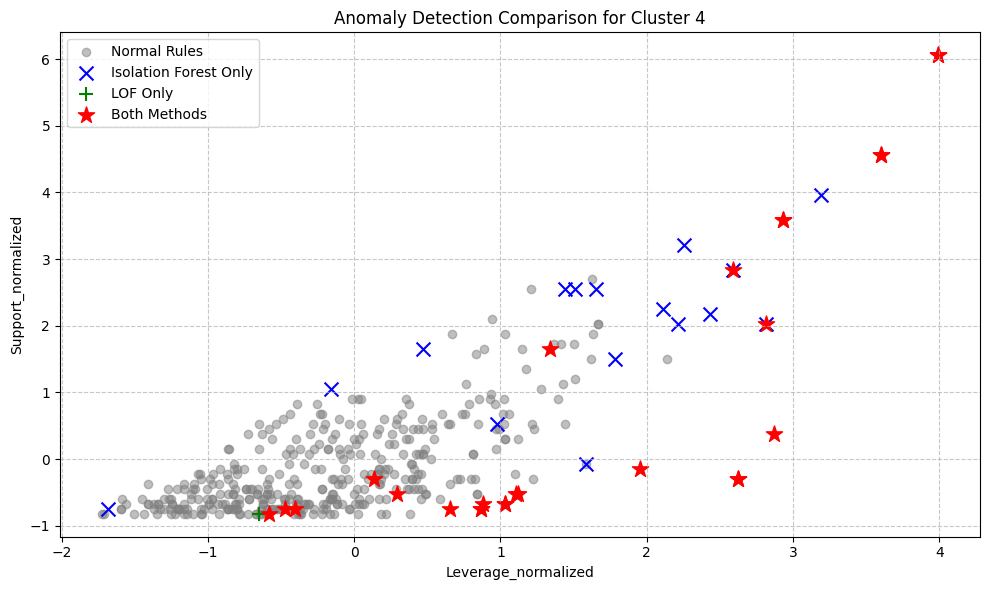

In [ ]:
# Ekstrak dua fitur dengan importance tertinggi
if feature_importance4 is not None and len(feature_importance4) >= 2:
    top_features = feature_importance4.nlargest(2, 'importance')['feature'].values
    x_metric, y_metric = top_features[0], top_features[1]
    print(f"Automatically selected features: x_metric={x_metric}, y_metric={y_metric}")
    visualize_anomaly_methods(rules_s4, x_metric=x_metric, y_metric=y_metric, cluster_id=4)
else:
    print("Not enough features in feature_importance or no anomalies detected. Using default metrics.")
    visualize_anomaly_methods(rules_s4, x_metric='support', y_metric='lift', cluster_id=4)

In [ ]:
general_business_rules4 = find_business_rules(rules_s4, cluster_id=4, use_initial_filters=True)
general_business_rules4

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,4,Frequent Mid-to-High Value Customers,['roses regency']['regency teacup'],(roses regency),(regency teacup),0.037298,0.822222,16.645805,0.035058,5.347152,lift_normalized,12.382023,-0.261719,cross_selling,Offer complementary products
1,4,Frequent Mid-to-High Value Customers,['regency teacup']['roses regency'],(regency teacup),(roses regency),0.037298,0.755102,16.645805,0.035058,3.898101,lift_normalized,12.382023,-0.244543,cross_selling,Offer complementary products
2,4,Frequent Mid-to-High Value Customers,['mug']['tin'],(mug),(tin),0.122984,0.539823,1.534397,0.042833,1.408557,support_normalized,6.057944,-0.153126,personalization,Offer tailored recommendations
4,4,Frequent Mid-to-High Value Customers,['tin']['mug'],(tin),(mug),0.122984,0.349570,1.534397,0.042833,1.187180,support_normalized,6.057944,-0.187647,personalization,Offer tailored recommendations
3,4,Frequent Mid-to-High Value Customers,['woolly hottie']['hot water bottle'],(woolly hottie),(hot water bottle),0.046371,0.920000,4.680205,0.036463,10.042843,confidence_normalized,3.040218,-0.215602,cross_selling,Offer complementary products


In [ ]:
business_rules4 = find_business_rules(rules_s4, feature_importance4, cluster_id=4, use_initial_filters=True)
business_rules4

,Cluster,Cluster_Name,Rule,Antecedents,Consequents,Support,Confidence,Lift,Leverage,Conviction,Key_Metric,Key_Metric_Value,Anomaly_Score,Recommended_Strategy,Strategy_Description
0,4,Frequent Mid-to-High Value Customers,['mug']['tin'],(mug),(tin),0.122984,0.539823,1.534397,0.042833,1.408557,leverage_normalized,3.992149,-0.153126,cross_selling,Offer complementary products
1,4,Frequent Mid-to-High Value Customers,['tin']['mug'],(tin),(mug),0.122984,0.349570,1.534397,0.042833,1.187180,leverage_normalized,3.992149,-0.187647,cross_selling,Offer complementary products
2,4,Frequent Mid-to-High Value Customers,['t-lights']['hot water bottle'],(t-lights),(hot water bottle),0.102823,0.324841,1.652523,0.040601,1.189982,leverage_normalized,3.598950,-0.148356,cross_selling,Offer complementary products
3,4,Frequent Mid-to-High Value Customers,['hot water bottle']['t-lights'],(hot water bottle),(t-lights),0.102823,0.523077,1.652523,0.040601,1.433078,leverage_normalized,3.598950,-0.096838,cross_selling,Offer complementary products
4,4,Frequent Mid-to-High Value Customers,['candle']['t-lights'],(candle),(t-lights),0.094758,0.531073,1.677786,0.038280,1.457516,leverage_normalized,3.189993,-0.060672,cross_selling,Offer complementary products


In [ ]:
items_analysis_dict_guest4 = extract_items_from_rules(rules_s4)
for method, df in items_analysis_dict_guest4.items():
    print(f"\nItems Contributing to Anomalous Rules ({method}):")
    print(df.head(10))


Items Contributing to Anomalous Rules (isolation_forest_anomaly):
                anomalous_freq  normal_freq     ratio
toy                   0.023810     0.000000       inf
piece polkadot        0.023810     0.000000       inf
regency teacup        0.047619     0.000000       inf
spice tins            0.023810     0.000000       inf
roses regency         0.047619     0.000000       inf
woolly hottie         0.023810     0.002646  9.000000
plate                 0.119048     0.018519  6.428571
cabinet               0.119048     0.031746  3.750000
tea towel             0.047619     0.013228  3.600000
frame                 0.095238     0.042328  2.250000

Items Contributing to Anomalous Rules (lof_anomaly):
                anomalous_freq  normal_freq      ratio
toy                   0.037037     0.000000        inf
piece polkadot        0.037037     0.000000        inf
regency teacup        0.074074     0.000000        inf
spice tins            0.037037     0.000000        inf
roses rege

### 3.4. Time Series Analysis


#### 3.4.1 Inisialisasi

Dataset memiliki fitur InvoiceDate yang memungkinkan kita mengamati tren dan pola harian, mingguan, dan bulanan. Kita dapat menggunakan Time Series Analysis untuk mendeteksi anomali, memprediksi penjualan di masa depan, serta mengidentifikasi dan mengisolasi komponen-komponen utama seperti level, trend, dan seasonality.

Hasil EDA menunjukkan adanya peningkatan transaksi secara signifikan pada bulan-bulan tertentu (seperti Oktober dan November) dan fluktuasi harian yang konsisten (misalnya transaksi lebih tinggi pada hari Selasa dan Kamis dan penurunan pada akhir pekan). Ini mengindikasikan adanya trend dan pola seasonal yang perlu diakomodasi oleh model.

Pertama, kita mengubah kolom InvoiceDate menjadi index dan mengagregasi data berdasarkan hari. Kita akan menjumlahkan nilai TotalPrice per hari untuk mendapatkan gambaran penjualan harian.

In [ ]:
# Mengubah kolom InvoiceDate menjadi index
df_time = df_clean.set_index('InvoiceDate')

# Mengagregasi total penjualan per hari
daily_sales = df_time['TotalPrice'].resample('D').sum()

# Menampilkan 5 data pertama
print(daily_sales.head())

InvoiceDate
2010-12-01    58960.79
2010-12-02    47748.38
2010-12-03    46943.71
2010-12-04        0.00
2010-12-05    31774.95
Freq: D, Name: TotalPrice, dtype: float64


Berdasarkan seasonality yang didapatkan pada EDA, kita akan menggunakan seasonality mingguan (7 hari) untuk tahap-tahap kedepannya.

ACF di lag 7: 0.5836
ACF di lag 14: 0.4760
ACF di lag 21: 0.4166
ACF di lag 28: 0.4450


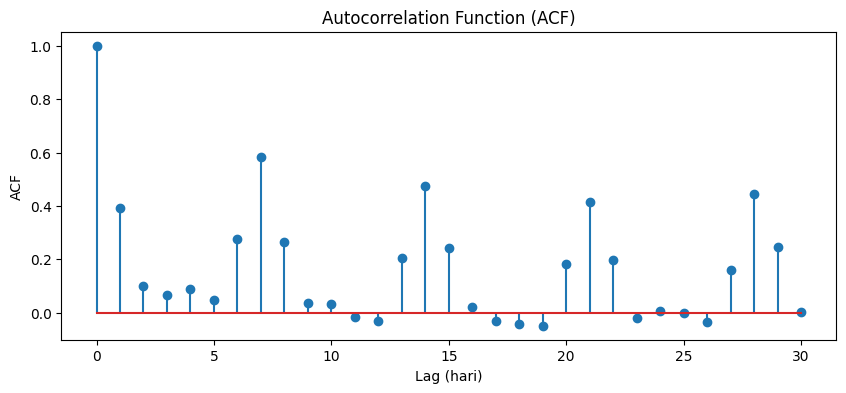

In [ ]:
from statsmodels.tsa.stattools import acf
import numpy as np
import matplotlib.pyplot as plt

# Hitung ACF hingga lag 30
acf_values = acf(daily_sales, nlags=30)

# Tampilkan nilai ACF untuk lag 7, 14, 21, dan 28
lags_to_check = [7, 14, 21, 28]
for lag in lags_to_check:
    print(f"ACF di lag {lag}: {acf_values[lag]:.4f}")

# Plot ACF
plt.figure(figsize=(10,4))
plt.stem(range(len(acf_values)), acf_values)
plt.xlabel('Lag (hari)')
plt.ylabel('ACF')
plt.title('Autocorrelation Function (ACF)')
plt.show()


Selanjutnya, kita visualisasikan data penjualan harian. Untuk membantu mengidentifikasi tren dan level, kita juga menghitung moving average 7-hari sebagai estimasi dari level/tren.

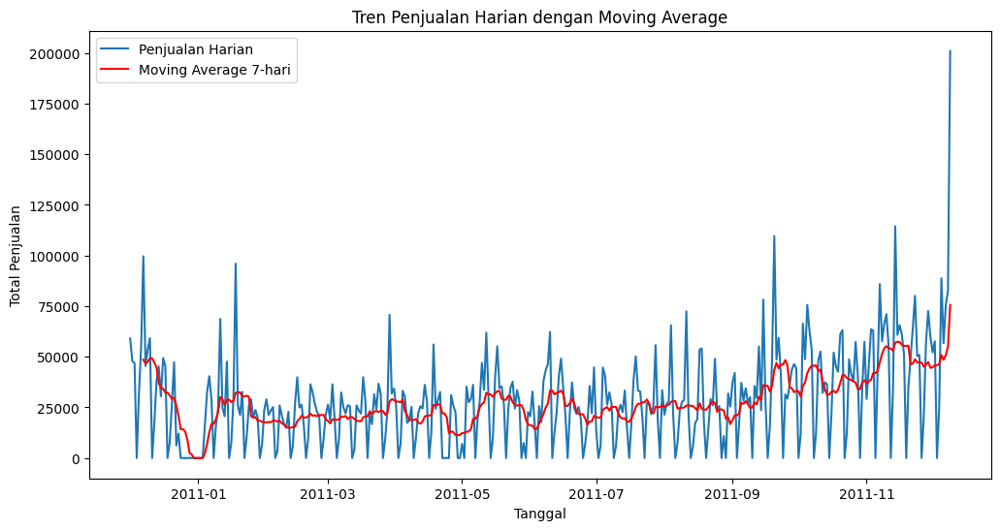

In [ ]:
# Menghitung moving average 7-hari
daily_sales_ma = daily_sales.rolling(window=7).mean()

# Visualisasi data harian dan moving average
plt.figure(figsize=(12,6))
plt.plot(daily_sales, label='Penjualan Harian')
plt.plot(daily_sales_ma, color='red', label='Moving Average 7-hari')
plt.title('Tren Penjualan Harian dengan Moving Average')
plt.xlabel('Tanggal')
plt.ylabel('Total Penjualan')
plt.legend()
plt.show()


Untuk memisahkan komponen time series (trend, musiman, dan residual), kita menggunakan fungsi seasonal_decompose dari modul statsmodels. Karena data diresample harian, kita dapat menggunakan parameter period=7 untuk menangkap seasonality mingguan, yang merupakan bentuk seasonality yang kita gunakan untuk data ini.

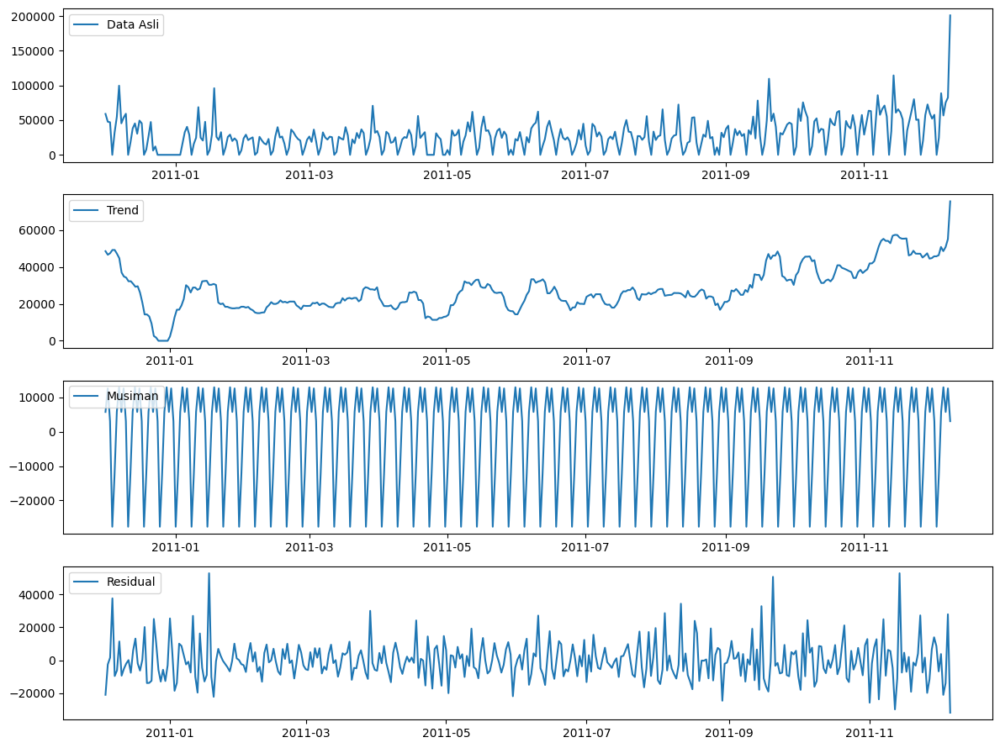

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Melakukan dekomposisi time series dengan model aditif dan period=7 (mingguan)
decomposition = seasonal_decompose(daily_sales, model='additive', period=7)

# Menyimpan komponen-komponen dekomposisi
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Visualisasi hasil dekomposisi
plt.figure(figsize=(12,9))

plt.subplot(411)
plt.plot(daily_sales, label='Data Asli')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(seasonal, label='Musiman')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

Dari dekomposisi berikut, kita memutuskan untuk menggunakan Holt-Winters method untuk membentuk model. Berikut alasannya:

Seasonality:
Dari hasil dekomposisi dan visualisasi, terlihat bahwa data penjualan harian memiliki pola musiman mingguan yang relatif konsisten (periode = 7 hari). Holt-Winters mampu menangani satu komponen musiman dengan baik, sehingga cocok jika kita ingin memodelkan kenaikan-penurunan penjualan per minggu.

Adanya Trend:
Grafik tren (dari seasonal decomposition) menunjukkan adanya perubahan level penjualan seiring waktu (misalnya peningkatan di akhir tahun). Holt-Winters ( Triple Exponential Smoothing) memiliki komponen trend (beta) yang dapat menyesuaikan perubahan level secara dinamis.

Kemudahan Penerapan:
Holt-Winters relatif lebih sederhana untuk diimplementasikan dibandingkan model SARIMA. Parameternya—alpha (level), beta (trend), dan gamma (seasonal)—cukup mudah dipahami dan dituning, terutama jika data tidak terlalu kompleks.

#### 3.4.2 Splitting

Kita pisahkan data penjualan harian berdasarkan tanggal batas yang telah ditentukan. Data sebelum tanggal batas akan dijadikan data training, sedangkan data setelahnya (atau mulai dari tanggal batas) akan dijadikan data testing.

In [ ]:
train_end_date = '2011-09-01'

In [ ]:
# Memisahkan data penjualan harian menjadi training dan testing
train_data = daily_sales[:train_end_date]
test_data = daily_sales[train_end_date:]

# Verifikasi dengan menampilkan info tentang train dan test set
print("Train set:")
print(train_data.tail())
print("\nTest set:")
print(test_data.head())
print("Ukuran train operasional:", len(train_data))
print("Ukuran test operasional:", len(test_data))


Train set:
InvoiceDate
2011-08-28    10805.03
2011-08-29        0.00
2011-08-30    31866.31
2011-08-31    25380.17
2011-09-01    37370.15
Freq: D, Name: TotalPrice, dtype: float64

Test set:
InvoiceDate
2011-09-01    37370.15
2011-09-02    42035.17
2011-09-03        0.00
2011-09-04    17119.59
2011-09-05    37157.14
Freq: D, Name: TotalPrice, dtype: float64
Ukuran train operasional: 275
Ukuran test operasional: 100


#### 3.4.3 Hyperparameter Tuning

Untuk mendapatkan performa terbaik dari model Holt-Winters, kita perlu men-tuning tiga parameter smoothing:

- alpha (smoothing level)

- beta (smoothing trend/slope)

- gamma (smoothing seasonal)

Pendekatan hyperparameter tuning yang umum dilakukan adalah dengan melakukan grid search terhadap kombinasi nilai parameter, kemudian mengevaluasi performanya menggunakan metrik error (misalnya, MAE). Karena data kita berfrekuensi harian dengan pola musiman mingguan, kita gunakan seasonal_periods=7.



In [ ]:
import numpy as np
import itertools

# Mendefinisikan range nilai untuk alpha, beta, dan gamma
alphas = np.arange(0.2, 1.0, 0.1)
betas = np.arange(0.2, 1.0, 0.1)
gammas = np.arange(0.2, 1.0, 0.1)

# Menghasilkan semua kombinasi (alpha, beta, gamma)
hyperparameter_grid = list(itertools.product(alphas, betas, gammas))
print("Jumlah kombinasi hyperparameter:", len(hyperparameter_grid))


Jumlah kombinasi hyperparameter: 512


Fungsi tes_optimizer melakukan iterasi pada semua kombinasi hyperparameter, melatih model dengan kombinasi tersebut, dan melakukan forecast untuk jumlah langkah yang sama dengan panjang test set (atau nilai forecast_steps yang ditentukan). Setiap kombinasi diuji dengan menghitung MAE antara prediksi dan data test. Kombinasi dengan MAE terendah dianggap sebagai parameter terbaik.

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error

def tes_optimizer(train, test, hyperparameter_grid, forecast_steps=None):
    # Jika forecast_steps tidak ditentukan, gunakan panjang data test
    if forecast_steps is None:
        forecast_steps = len(test)

    best_alpha, best_beta, best_gamma, best_mae = None, None, None, float("inf")

    for comb in hyperparameter_grid:
        # Inisialisasi model Holt-Winters dengan trend dan musiman aditif
        model = ExponentialSmoothing(train, trend="add", seasonal="add", seasonal_periods=7)
        # Fit model dengan kombinasi parameter saat ini
        model_fit = model.fit(smoothing_level=comb[0], smoothing_trend=comb[1], smoothing_seasonal=comb[2])
        # Forecast untuk jumlah langkah yang ditentukan
        y_pred = model_fit.forecast(forecast_steps)
        # Hitung MAE antara prediksi dan data test
        mae = mean_absolute_error(test, y_pred)

        # Jika MAE lebih baik (lebih kecil), simpan kombinasi parameter tersebut
        if mae < best_mae:
            best_alpha, best_beta, best_gamma, best_mae = comb[0], comb[1], comb[2], mae

        print([round(comb[0], 2), round(comb[1], 2), round(comb[2], 2), round(mae, 2)])

    print("\nBest parameters:")
    print("alpha:", round(best_alpha, 2), "beta:", round(best_beta, 2), "gamma:", round(best_gamma, 2), "MAE:", round(best_mae, 4))

    return best_alpha, best_beta, best_gamma, best_mae

# Misal, lakukan tuning dengan data training dan test yang telah disediakan
best_alpha, best_beta, best_gamma, best_mae = tes_optimizer(train_data, test_data, hyperparameter_grid)


[0.2, 0.2, 0.2, 79395.32]
[0.2, 0.2, 0.3, 79907.23]
[0.2, 0.2, 0.4, 76379.29]
[0.2, 0.2, 0.5, 70345.14]
[0.2, 0.2, 0.6, 63109.04]
[0.2, 0.2, 0.7, 55543.63]
[0.2, 0.2, 0.8, 48110.99]
[0.2, 0.2, 0.9, 41006.98]
[0.2, 0.3, 0.2, 94906.99]
[0.2, 0.3, 0.3, 94739.25]
[0.2, 0.3, 0.4, 88324.84]
[0.2, 0.3, 0.5, 78125.91]
[0.2, 0.3, 0.6, 66170.9]
[0.2, 0.3, 0.7, 53759.5]
[0.2, 0.3, 0.8, 41565.25]
[0.2, 0.3, 0.9, 31165.78]
[0.2, 0.4, 0.2, 103213.57]
[0.2, 0.4, 0.3, 101994.26]
[0.2, 0.4, 0.4, 91973.95]
[0.2, 0.4, 0.5, 76768.08]
[0.2, 0.4, 0.6, 59278.94]
[0.2, 0.4, 0.7, 41241.05]
[0.2, 0.4, 0.8, 26571.03]
[0.2, 0.4, 0.9, 19591.48]
[0.2, 0.5, 0.2, 104328.7]
[0.2, 0.5, 0.3, 101464.88]
[0.2, 0.5, 0.4, 87120.21]
[0.2, 0.5, 0.5, 66253.03]
[0.2, 0.5, 0.6, 42490.64]
[0.2, 0.5, 0.7, 22779.74]
[0.2, 0.5, 0.8, 24567.35]
[0.2, 0.5, 0.9, 52605.29]
[0.2, 0.6, 0.2, 98130.17]
[0.2, 0.6, 0.3, 93748.45]
[0.2, 0.6, 0.4, 74939.0]
[0.2, 0.6, 0.5, 47705.5]
[0.2, 0.6, 0.6, 22084.36]
[0.2, 0.6, 0.7, 31175.35]
[0.2, 0.6, 0.

d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.3, 0.8, 0.4, 45902.16]
[0.3, 0.8, 0.5, 35287.07]
[0.3, 0.8, 0.6, 177361.67]
[0.3, 0.8, 0.7, 758974.68]
[0.3, 0.8, 0.8, 271893.51]
[0.3, 0.8, 0.9, 238042.13]
[0.3, 0.9, 0.2, 117720.05]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.3, 0.9, 0.3, 135811.56]
[0.3, 0.9, 0.4, 75952.27]
[0.3, 0.9, 0.5, 44760.61]
[0.3, 0.9, 0.6, 246931.17]
[0.3, 0.9, 0.7, 264547.02]
[0.3, 0.9, 0.8, 269340.97]
[0.3, 0.9, 0.9, 3071054539.98]
[0.4, 0.2, 0.2, 79968.15]
[0.4, 0.2, 0.3, 82968.25]
[0.4, 0.2, 0.4, 74256.82]
[0.4, 0.2, 0.5, 56602.79]
[0.4, 0.2, 0.6, 36133.45]
[0.4, 0.2, 0.7, 21220.98]
[0.4, 0.2, 0.8, 19721.67]
[0.4, 0.2, 0.9, 36497.36]
[0.4, 0.3, 0.2, 85367.75]
[0.4, 0.3, 0.3, 92083.79]
[0.4, 0.3, 0.4, 78039.2]
[0.4, 0.3, 0.5, 48990.54]
[0.4, 0.3, 0.6, 21678.98]
[0.4, 0.3, 0.7, 26531.89]
[0.4, 0.3, 0.8, 60080.79]
[0.4, 0.3, 0.9, 129676.75]
[0.4, 0.4, 0.2, 85721.0]
[0.4, 0.4, 0.3, 100189.1]
[0.4, 0.4, 0.4, 80167.87]
[0.4, 0.4, 0.5, 38132.38]
[0.4, 0.4, 0.6, 19697.4]
[0.4, 0.4, 0.7, 49649.63]
[0.4, 0.4, 0.8, 114639.54]
[0.4, 0.4, 0.9, 463960.05]
[0.4, 0.5, 0.2, 88308.08]
[0.4, 0.5, 0.3, 117699.18]
[0.4, 0.5, 0.4, 90263.54]
[0.4, 0.5, 0.5, 34224.87]
[0.4, 0.5, 0.6, 19980.53]
[0.4, 0.5, 0.7, 28920.72]
[0.4, 0.5, 0.8, 42100.34]
[0

d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.4, 0.7, 0.6, 91249.71]
[0.4, 0.7, 0.7, 48614.23]
[0.4, 0.7, 0.8, 1992242.9]
[0.4, 0.7, 0.9, 232017321.9]
[0.4, 0.8, 0.2, 154564.72]
[0.4, 0.8, 0.3, 348980.2]
[0.4, 0.8, 0.4, 168914.0]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.4, 0.8, 0.5, 57956.96]
[0.4, 0.8, 0.6, 36589.63]
[0.4, 0.8, 0.7, 570895.82]
[0.4, 0.8, 0.8, 165215775.84]
[0.4, 0.8, 0.9, 4.321909023932556e+19]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.4, 0.9, 0.2, 179379.11]
[0.4, 0.9, 0.3, 564839.28]
[0.4, 0.9, 0.4, 127408.99]
[0.4, 0.9, 0.5, 82072.45]
[0.4, 0.9, 0.6, 54482.34]
[0.4, 0.9, 0.7, 118313.7]
[0.4, 0.9, 0.8, 4.736149811993084e+19]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.4, 0.9, 0.9, 1.928661098071871e+17]
[0.5, 0.2, 0.2, 74580.69]
[0.5, 0.2, 0.3, 83083.89]
[0.5, 0.2, 0.4, 79204.63]
[0.5, 0.2, 0.5, 58720.34]
[0.5, 0.2, 0.6, 33022.14]
[0.5, 0.2, 0.7, 18992.33]
[0.5, 0.2, 0.8, 18102.99]
[0.5, 0.2, 0.9, 22960.28]
[0.5, 0.3, 0.2, 75671.06]
[0.5, 0.3, 0.3, 97570.74]
[0.5, 0.3, 0.4, 96573.77]
[0.5, 0.3, 0.5, 60659.58]
[0.5, 0.3, 0.6, 23210.93]
[0.5, 0.3, 0.7, 20900.11]
[0.5, 0.3, 0.8, 17834.23]
[0.5, 0.3, 0.9, 18887.61]
[0.5, 0.4, 0.2, 71105.19]
[0.5, 0.4, 0.3, 121372.93]
[0.5, 0.4, 0.4, 129880.0]
[0.5, 0.4, 0.5, 66337.71]
[0.5, 0.4, 0.6, 17731.27]
[0.5, 0.4, 0.7, 42767.22]
[0.5, 0.4, 0.8, 28712.84]
[0.5, 0.4, 0.9, 47657.79]
[0.5, 0.5, 0.2, 61469.55]
[0.5, 0.5, 0.3, 169387.03]
[0.5, 0.5, 0.4, 198106.85]
[0.5, 0.5, 0.5, 60797.96]
[0.5, 0.5, 0.6, 41676.27]
[0.5, 0.5, 0.7, 87265.78]
[0.5, 0.5, 0.8, 51685.86]
[0.5, 0.5, 0.9, 68901.48]
[0.5, 0.6, 0.2, 35774.71]
[0.5, 0.6, 0.3, 260489.6]
[0.5, 0.6, 0.4, 335736.04]
[0.5, 0.6, 0.5, 19127.04]
[0.5, 0.6, 0.6, 24145

d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.5, 0.6, 0.8, 67333.99]
[0.5, 0.6, 0.9, 85892971489.73]
[0.5, 0.7, 0.2, 45829.81]
[0.5, 0.7, 0.3, 398085.78]
[0.5, 0.7, 0.4, 451536.59]
[0.5, 0.7, 0.5, 79159.21]
[0.5, 0.7, 0.6, 34627.16]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.5, 0.7, 0.7, 83482.49]
[0.5, 0.7, 0.8, 92646.37]
[0.5, 0.7, 0.9, 2.1589392875972165e+18]
[0.5, 0.8, 0.2, 182357.18]
[0.5, 0.8, 0.3, 349862.68]
[0.5, 0.8, 0.4, 311870.73]
[0.5, 0.8, 0.5, 54242.86]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.5, 0.8, 0.6, 68127.71]
[0.5, 0.8, 0.7, 99936.56]
[0.5, 0.8, 0.8, 1.2859281307602544e+17]
[0.5, 0.8, 0.9, 1.5130414863479311e+18]
[0.5, 0.9, 0.2, 303830.45]
[0.5, 0.9, 0.3, 115306.01]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.5, 0.9, 0.4, 144554.92]
[0.5, 0.9, 0.5, 24706.84]
[0.5, 0.9, 0.6, 28943.08]
[0.5, 0.9, 0.7, 7972325638845.01]
[0.5, 0.9, 0.8, 6.896394224299874e+22]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.5, 0.9, 0.9, 1.4154329625873956e+18]
[0.6, 0.2, 0.2, 63431.49]
[0.6, 0.2, 0.3, 74562.9]
[0.6, 0.2, 0.4, 86165.9]
[0.6, 0.2, 0.5, 71096.96]
[0.6, 0.2, 0.6, 35600.42]
[0.6, 0.2, 0.7, 19263.08]
[0.6, 0.2, 0.8, 29160.91]
[0.6, 0.2, 0.9, 55648.65]
[0.6, 0.3, 0.2, 51761.89]
[0.6, 0.3, 0.3, 80783.9]
[0.6, 0.3, 0.4, 127317.06]
[0.6, 0.3, 0.5, 99932.51]
[0.6, 0.3, 0.6, 21326.95]
[0.6, 0.3, 0.7, 31837.03]
[0.6, 0.3, 0.8, 97454.04]
[0.6, 0.3, 0.9, 19661.83]
[0.6, 0.4, 0.2, 25714.46]
[0.6, 0.4, 0.3, 79523.06]
[0.6, 0.4, 0.4, 225371.9]
[0.6, 0.4, 0.5, 169123.43]
[0.6, 0.4, 0.6, 44220.14]
[0.6, 0.4, 0.7, 17953.73]
[0.6, 0.4, 0.8, 47777.92]
[0.6, 0.4, 0.9, 30606.45]
[0.6, 0.5, 0.2, 48613.34]
[0.6, 0.5, 0.3, 39843.06]
[0.6, 0.5, 0.4, 394435.46]
[0.6, 0.5, 0.5, 210499.81]
[0.6, 0.5, 0.6, 20670.63]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.5, 0.7, 1012501.43]
[0.6, 0.5, 0.8, 44037.98]
[0.6, 0.5, 0.9, 37058.89]
[0.6, 0.6, 0.2, 142274.81]
[0.6, 0.6, 0.3, 79995.0]
[0.6, 0.6, 0.4, 299291.4]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.6, 0.5, 109967.18]
[0.6, 0.6, 0.6, 43203.48]
[0.6, 0.6, 0.7, 683554.66]
[0.6, 0.6, 0.8, 38298.02]
[0.6, 0.6, 0.9, 28095611371829.67]
[0.6, 0.7, 0.2, 222888.46]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.7, 0.3, 143786.95]
[0.6, 0.7, 0.4, 74497.23]
[0.6, 0.7, 0.5, 28011.23]
[0.6, 0.7, 0.6, 111776.56]
[0.6, 0.7, 0.7, 98346.75]
[0.6, 0.7, 0.8, 35422.77]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.7, 0.9, 8307776872542557.0]
[0.6, 0.8, 0.2, 223015.87]
[0.6, 0.8, 0.3, 174939.59]
[0.6, 0.8, 0.4, 91111.19]
[0.6, 0.8, 0.5, 147373.03]
[0.6, 0.8, 0.6, 190652.17]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.8, 0.7, 25981943672537.71]
[0.6, 0.8, 0.8, 4.705740408559892e+20]
[0.6, 0.8, 0.9, 2.8447588486500688e+17]
[0.6, 0.9, 0.2, 195132.79]
[0.6, 0.9, 0.3, 209319.32]
[0.6, 0.9, 0.4, 262930.85]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.9, 0.5, 182789.96]
[0.6, 0.9, 0.6, 273676.88]
[0.6, 0.9, 0.7, 2219603381833051.8]
[0.6, 0.9, 0.8, 1.2378382590487855e+23]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.6, 0.9, 0.9, 4.569768632251646e+17]
[0.7, 0.2, 0.2, 48119.17]
[0.7, 0.2, 0.3, 47254.46]
[0.7, 0.2, 0.4, 75966.65]
[0.7, 0.2, 0.5, 95455.33]
[0.7, 0.2, 0.6, 53795.22]
[0.7, 0.2, 0.7, 23200.18]
[0.7, 0.2, 0.8, 42436.79]
[0.7, 0.2, 0.9, 29224.9]
[0.7, 0.3, 0.2, 25750.86]
[0.7, 0.3, 0.3, 21920.04]
[0.7, 0.3, 0.4, 105503.2]
[0.7, 0.3, 0.5, 187281.02]
[0.7, 0.3, 0.6, 80719.65]
[0.7, 0.3, 0.7, 50347.94]
[0.7, 0.3, 0.8, 18854.5]
[0.7, 0.3, 0.9, 25305.59]
[0.7, 0.4, 0.2, 38814.69]
[0.7, 0.4, 0.3, 76243.09]
[0.7, 0.4, 0.4, 112637.91]
[0.7, 0.4, 0.5, 213512.21]
[0.7, 0.4, 0.6, 36359.02]
[0.7, 0.4, 0.7, 55579.55]
[0.7, 0.4, 0.8, 24578.75]
[0.7, 0.4, 0.9, 1791792.13]
[0.7, 0.5, 0.2, 92071.43]
[0.7, 0.5, 0.3, 175873.55]
[0.7, 0.5, 0.4, 24503.77]
[0.7, 0.5, 0.5, 43315.7]
[0.7, 0.5, 0.6, 75302.47]
[0.7, 0.5, 0.7, 71153.12]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.7, 0.5, 0.8, 24691.92]
[0.7, 0.5, 0.9, 15828070.17]
[0.7, 0.6, 0.2, 123855.45]
[0.7, 0.6, 0.3, 209772.05]
[0.7, 0.6, 0.4, 131602.6]
[0.7, 0.6, 0.5, 141715.41]
[0.7, 0.6, 0.6, 214598.58]
[0.7, 0.6, 0.7, 185180.28]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\P

[0.7, 0.6, 0.8, 282726.86]
[0.7, 0.6, 0.9, 39407008593.73]
[0.7, 0.7, 0.2, 126743.83]
[0.7, 0.7, 0.3, 222162.24]
[0.7, 0.7, 0.4, 240252.79]
[0.7, 0.7, 0.5, 310323.08]
[0.7, 0.7, 0.6, 390106.14]
[0.7, 0.7, 0.7, 2217584.53]
[0.7, 0.7, 0.8, 671627379.39]
[0.7, 0.7, 0.9, 2.656419766511194e+16]
[0.7, 0.8, 0.2, 124450.32]
[0.7, 0.8, 0.3, 235151.92]
[0.7, 0.8, 0.4, 347113.84]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.7, 0.8, 0.5, 66136.53]
[0.7, 0.8, 0.6, 641629.99]
[0.7, 0.8, 0.7, 6101311594.8]
[0.7, 0.8, 0.8, 321470013010.11]
[0.7, 0.8, 0.9, 1.588776817359177e+18]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.7, 0.9, 0.2, 119737.02]
[0.7, 0.9, 0.3, 245968.32]
[0.7, 0.9, 0.4, 464018.72]
[0.7, 0.9, 0.5, 778620.88]
[0.7, 0.9, 0.6, 1839032.48]
[0.7, 0.9, 0.7, 512917156055.4]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.7, 0.9, 0.8, 616959188739.71]
[0.7, 0.9, 0.9, 4.857456980849351e+18]
[0.8, 0.2, 0.2, 35125.33]
[0.8, 0.2, 0.3, 21527.75]
[0.8, 0.2, 0.4, 22637.86]
[0.8, 0.2, 0.5, 100201.16]
[0.8, 0.2, 0.6, 89991.88]
[0.8, 0.2, 0.7, 20146.72]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.2, 0.8, 41477.09]
[0.8, 0.2, 0.9, 68970.61]
[0.8, 0.3, 0.2, 21250.19]
[0.8, 0.3, 0.3, 78085.28]
[0.8, 0.3, 0.4, 62155.93]
[0.8, 0.3, 0.5, 114523.61]
[0.8, 0.3, 0.6, 46791.68]
[0.8, 0.3, 0.7, 60847.54]
[0.8, 0.3, 0.8, 63195.25]
[0.8, 0.3, 0.9, 238853.83]
[0.8, 0.4, 0.2, 40160.78]
[0.8, 0.4, 0.3, 166557.27]
[0.8, 0.4, 0.4, 146707.08]
[0.8, 0.4, 0.5, 62246.55]
[0.8, 0.4, 0.6, 127451.34]
[0.8, 0.4, 0.7, 207693.09]
[0.8, 0.4, 0.8, 140063.62]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.4, 0.9, 325548.74]
[0.8, 0.5, 0.2, 65091.52]
[0.8, 0.5, 0.3, 204098.6]
[0.8, 0.5, 0.4, 216860.25]
[0.8, 0.5, 0.5, 256727.53]
[0.8, 0.5, 0.6, 351716.73]
[0.8, 0.5, 0.7, 513233.73]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.5, 0.8, 9331472.41]
[0.8, 0.5, 0.9, 122888.28]
[0.8, 0.6, 0.2, 85317.61]
[0.8, 0.6, 0.3, 211620.41]
[0.8, 0.6, 0.4, 295613.65]
[0.8, 0.6, 0.5, 473837.62]
[0.8, 0.6, 0.6, 614749.59]
[0.8, 0.6, 0.7, 1023197.13]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.6, 0.8, 501389.67]
[0.8, 0.6, 0.9, 574427490801.9]
[0.8, 0.7, 0.2, 101293.82]
[0.8, 0.7, 0.3, 211343.48]
[0.8, 0.7, 0.4, 378166.44]
[0.8, 0.7, 0.5, 751308.82]
[0.8, 0.7, 0.6, 756193.68]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.7, 0.7, 253505087.27]
[0.8, 0.7, 0.8, 39855024360.26]
[0.8, 0.7, 0.9, 243564997419.32]
[0.8, 0.8, 0.2, 107559.33]
[0.8, 0.8, 0.3, 197272.95]
[0.8, 0.8, 0.4, 453579.8]
[0.8, 0.8, 0.5, 1039749.37]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.8, 0.6, 861800.52]
[0.8, 0.8, 0.7, 1001183.76]
[0.8, 0.8, 0.8, 47553513135565.38]
[0.8, 0.8, 0.9, 11421286798797.98]
[0.8, 0.9, 0.2, 99427.8]
[0.8, 0.9, 0.3, 149689.78]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.9, 0.4, 283418.22]
[0.8, 0.9, 0.5, 1594601.77]
[0.8, 0.9, 0.6, 1259673.32]
[0.8, 0.9, 0.7, 429237982636.84]
[0.8, 0.9, 0.8, 3485150635443.26]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.8, 0.9, 0.9, 18689208377645.32]
[0.9, 0.2, 0.2, 27192.7]
[0.9, 0.2, 0.3, 45271.2]
[0.9, 0.2, 0.4, 64028.65]
[0.9, 0.2, 0.5, 28921.13]
[0.9, 0.2, 0.6, 44018.88]
[0.9, 0.2, 0.7, 43963.18]
[0.9, 0.2, 0.8, 131042.43]
[0.9, 0.2, 0.9, 65041.64]
[0.9, 0.3, 0.2, 24002.5]
[0.9, 0.3, 0.3, 120712.89]
[0.9, 0.3, 0.4, 156307.28]
[0.9, 0.3, 0.5, 133356.96]
[0.9, 0.3, 0.6, 152412.0]
[0.9, 0.3, 0.7, 214223.16]
[0.9, 0.3, 0.8, 549181.12]
[0.9, 0.3, 0.9, 333719.03]
[0.9, 0.4, 0.2, 48017.28]
[0.9, 0.4, 0.3, 169237.83]
[0.9, 0.4, 0.4, 219032.52]
[0.9, 0.4, 0.5, 298245.88]
[0.9, 0.4, 0.6, 447085.29]
[0.9, 0.4, 0.7, 304585.36]
[0.9, 0.4, 0.8, 672929.19]
[0.9, 0.4, 0.9, 822900.75]
[0.9, 0.5, 0.2, 82605.88]
[0.9, 0.5, 0.3, 184731.19]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.9, 0.5, 0.4, 263070.63]
[0.9, 0.5, 0.5, 508992.42]
[0.9, 0.5, 0.6, 894216.05]
[0.9, 0.5, 0.7, 398994.24]
[0.9, 0.5, 0.8, 507283.86]
[0.9, 0.5, 0.9, 581768.09]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.9, 0.6, 0.2, 119844.27]
[0.9, 0.6, 0.3, 186963.79]
[0.9, 0.6, 0.4, 265085.38]
[0.9, 0.6, 0.5, 816488.69]
[0.9, 0.6, 0.6, 1403763.41]
[0.9, 0.6, 0.7, 631833.09]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.9, 0.6, 0.8, 63540964.96]
[0.9, 0.6, 0.9, 1373122406625.03]
[0.9, 0.7, 0.2, 153754.12]
[0.9, 0.7, 0.3, 177622.73]
[0.9, 0.7, 0.4, 146003.96]
[0.9, 0.7, 0.5, 1256112.02]
[0.9, 0.7, 0.6, 1263047.02]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.9, 0.7, 0.7, 71507.82]
[0.9, 0.7, 0.8, 12287425.58]
[0.9, 0.7, 0.9, 1.04711958180784e+17]
[0.9, 0.8, 0.2, 188249.71]
[0.9, 0.8, 0.3, 174699.76]
[0.9, 0.8, 0.4, 223636.75]


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


[0.9, 0.8, 0.5, 1169328.34]
[0.9, 0.8, 0.6, 1253737.59]
[0.9, 0.8, 0.7, 758475.46]
[0.9, 0.8, 0.8, 1372589099335693.0]
[0.9, 0.8, 0.9, 12437461693818.88]
[0.9, 0.9, 0.2, 236475.13]
[0.9, 0.9, 0.3, 290284.35]
[0.9, 0.9, 0.4, 237581.71]
[0.9, 0.9, 0.5, 1177279.53]
[0.9, 0.9, 0.6, 1522996.51]
[0.9, 0.9, 0.7, 23393378792666.01]
[0.9, 0.9, 0.8, 119687407735371.62]
[0.9, 0.9, 0.9, 1.5747314081171863e+18]

Best parameters:
alpha: 0.5 beta: 0.4 gamma: 0.6 MAE: 17731.2652


d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
d:\Semester 6\PenambanganData\gcgcgc\projectenv\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


#### 3.4.4 Pembuatan Model

Setelah mendapatkan parameter terbaik, kita buat model final dan lakukan forecast pada data test. Hasil prediksi kemudian divisualisasikan untuk melihat kecocokan model dengan data aktual.

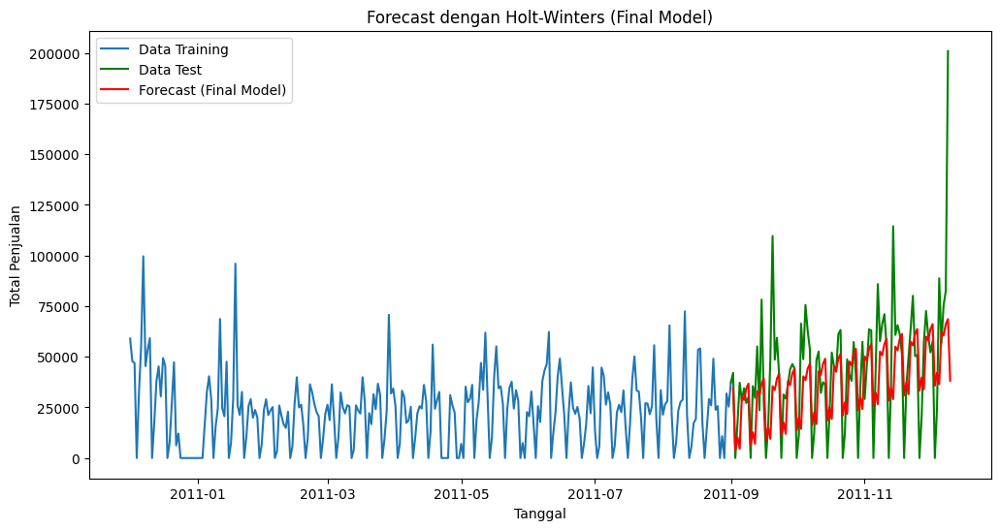

In [ ]:
# Menggunakan parameter terbaik dari proses tuning untuk membangun model final
final_hw_model = ExponentialSmoothing(train_data, trend="add", seasonal="add", seasonal_periods=7)\
                  .fit(smoothing_level=best_alpha, smoothing_trend=best_beta, smoothing_seasonal=best_gamma)

# Forecast untuk jumlah langkah test
final_forecast = final_hw_model.forecast(len(test_data))

# Visualisasi hasil prediksi model final
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(train_data, label='Data Training')
plt.plot(test_data, label='Data Test', color='green')
plt.plot(final_forecast, label='Forecast (Final Model)', color='red')
plt.title('Forecast dengan Holt-Winters (Final Model)')
plt.xlabel('Tanggal')
plt.ylabel('Total Penjualan')
plt.legend()
plt.show()


#### 3.4.5 Evaluasi

Untuk masalah forecasting time series, metrik yang umum digunakan adalah MAE (Mean Absolute Error) dan RMSE (Root Mean Squared Error). Metrik-metrik ini mengukur seberapa jauh prediksi dari nilai aktual.

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

mae = mean_absolute_error(test_data, final_forecast)
rmse = np.sqrt(mean_squared_error(test_data, final_forecast))

print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)


Mean Absolute Error (MAE): 17731.265216282653
Root Mean Squared Error (RMSE): 26542.278994319353


 Untuk visualisasi kita plot data test dengan hasil forecast.

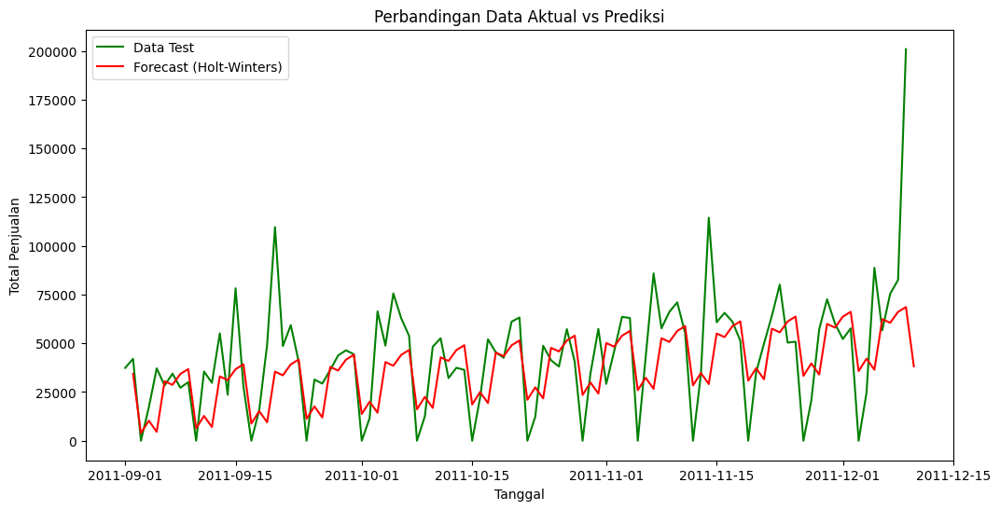

In [ ]:
import matplotlib.pyplot as plt

# Plot perbandingan data aktual vs prediksi
plt.figure(figsize=(12,6))
plt.plot(test_data, label='Data Test', color='green')
plt.plot(final_forecast, label='Forecast (Holt-Winters)', color='red')
plt.title('Perbandingan Data Aktual vs Prediksi')
plt.xlabel('Tanggal')
plt.ylabel('Total Penjualan')
plt.legend()
plt.show()


Selanjutnya, kita plot residual (selisih antara nilai aktual dan prediksi) untuk mengetahui apakah ada pola yang tidak tertangkap oleh model.

Rata-rata Residual: 6487.442199755597
Standar Deviasi Residual: 24923.97381877192
Threshold Anomali (z-score > ±2.5): 2

Hari-hari dengan anomali:
2011-09-20     74168.699972
2011-11-07     59251.584894
2011-11-14     85340.773284
2011-12-09    132313.539520
dtype: float64


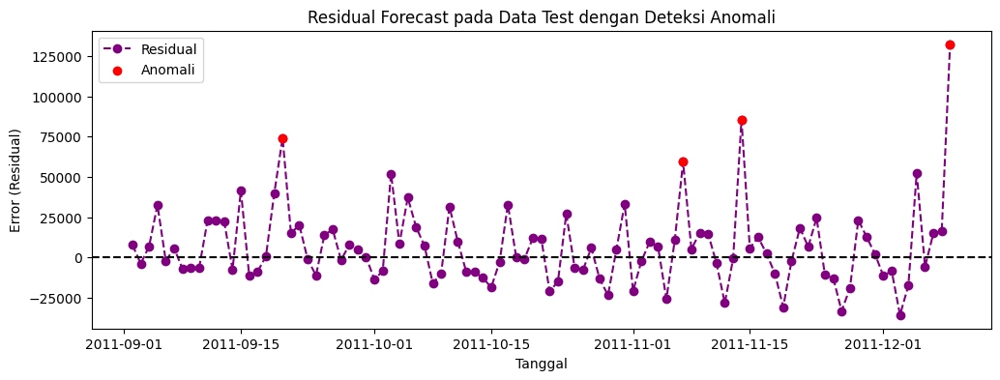

In [ ]:
# Menghitung residual antara data test dan forecast model
residuals = test_data - final_hw_model.forecast(len(test_data))

# Menghitung z-score untuk masing-masing nilai residual
z_scores = (residuals - np.mean(residuals)) / np.std(residuals)

# Menetapkan threshold untuk mendeteksi anomali (misal, z-score > ±2)
threshold_z = 2
anomalies = residuals[np.abs(z_scores) > threshold_z]

# Menampilkan informasi dasar
print("Rata-rata Residual:", np.mean(residuals))
print("Standar Deviasi Residual:", np.std(residuals))
print("Threshold Anomali (z-score > ±2.5):", threshold_z)
print("\nHari-hari dengan anomali:")
print(anomalies)

# Plot residual beserta penandaan titik anomali
plt.figure(figsize=(12,4))
plt.plot(residuals, marker='o', linestyle='--', color='purple', label='Residual')
plt.scatter(anomalies.index, anomalies, color='red', label='Anomali', zorder=5)
plt.axhline(y=0, color='black', linestyle='--')
plt.title('Residual Forecast pada Data Test dengan Deteksi Anomali')
plt.xlabel('Tanggal')
plt.ylabel('Error (Residual)')
plt.legend()
plt.show()

Konklusi:

Dengan MAE = 17.088 dan RMSE = 25.870, ini tergolong cukup tinggi dan menunjukkan bahwa model sering meleset cukup jauh dari nilai aktual. Ada beberapa lonjakan penjualan yang tidak tertangkap secara akurat, menyebabkan residual yang tinggi pada momen tertentu.

Pola residual umumnya tersebar di sekitar garis nol, namun masih ada puncak error yang cukup tinggi di beberapa tanggal, mengindikasikan bahwa model mungkin belum menangkap faktor musiman tambahan atau event khusus (anomali) yang memicu lonjakan penjualan.

Keterbatasan Model:

- Keterbatasan dalam Menangkap Perubahan Mendadak:

Model Holt-Winters mengasumsikan bahwa pola trend dan musiman akan terus berlanjut dengan pola yang relatif stabil. Jika terjadi perubahan struktural atau event khusus (misalnya diskon besar, libur nasional, perubahan kebijakan toko), model bisa mengalami kesulitan melakukan penyesuaian cepat.

- Hanya Menangani Satu Pola Musiman:

Holt-Winters (versi standar) dirancang untuk satu komponen musiman (dalam kasus ini mingguan). Apabila data memiliki multi-seasonality (misalnya, pola mingguan dan bulanan, atau pola lainnya), model ini mungkin tidak cukup fleksibel.

#### 3.4.6 Insights

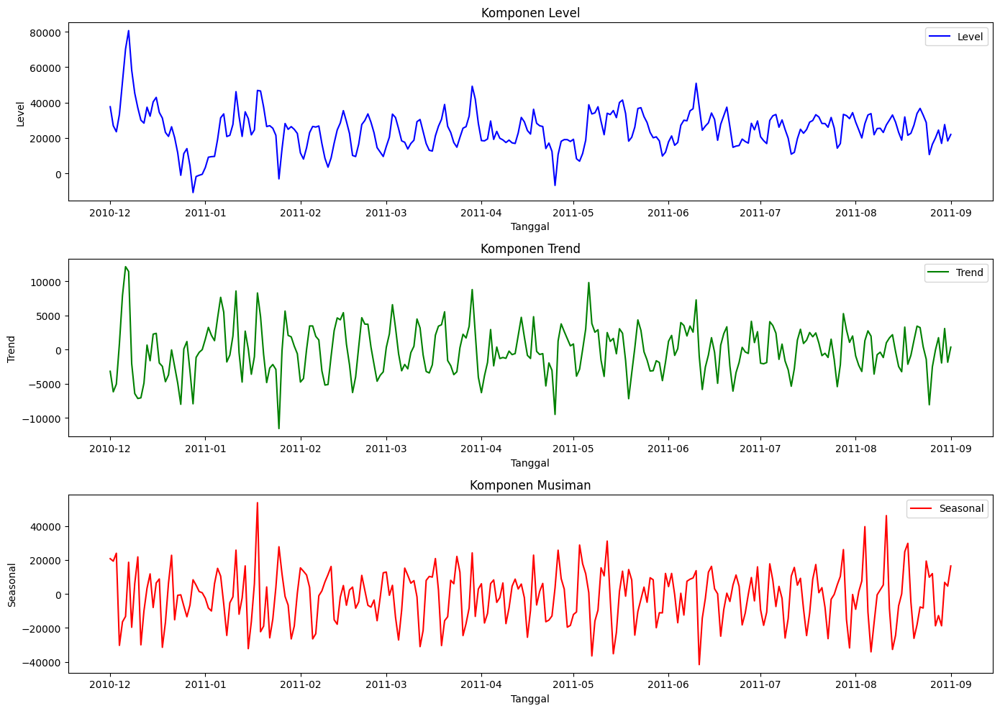

In [ ]:
import matplotlib.pyplot as plt

# Pastikan index data training sesuai dengan hasil fitted model
# Misalnya, kita asumsikan train_data merupakan series dengan index tanggal

# Ekstrak komponen-komponen (asumsi final_hw_model memiliki atribut level, trend, dan season)
level_component = final_hw_model.level
trend_component = final_hw_model.trend  # atau bisa juga final_hw_model.slope, tergantung versi
season_component = final_hw_model.season

# Buat index yang sesuai untuk komponen (sama dengan train_data)
time_index = train_data.index

plt.figure(figsize=(14,10))

# Plot Level
plt.subplot(3,1,1)
plt.plot(time_index, level_component, label='Level', color='blue')
plt.title('Komponen Level')
plt.xlabel('Tanggal')
plt.ylabel('Level')
plt.legend()

# Plot Trend
plt.subplot(3,1,2)
plt.plot(time_index, trend_component, label='Trend', color='green')
plt.title('Komponen Trend')
plt.xlabel('Tanggal')
plt.ylabel('Trend')
plt.legend()

# Plot Seasonal
plt.subplot(3,1,3)
plt.plot(time_index, season_component, label='Seasonal', color='red')
plt.title('Komponen Musiman')
plt.xlabel('Tanggal')
plt.ylabel('Seasonal')
plt.legend()

plt.tight_layout()
plt.show()


**Komponen Level (Grafik Biru)**

Menunjukkan nilai dasar (baseline) penjualan setelah faktor musiman dan tren disisihkan. Dapat diartikan sebagai “rata-rata” penjualan pada suatu saat.

Pengamatan:

Pada grafik, tampak bahwa di Desember 2010 level cukup tinggi, lalu sempat menurun tajam pada awal 2011, dan kembali berfluktuasi di kisaran tertentu sepanjang 2011. Ini mengindikasikan adanya penurunan baseline penjualan di awal tahun, kemudian stabil di kisaran menengah.

**Komponen Trend (Grafik Hijau)**

Menggambarkan arah pergerakan penjualan seiring waktu. Trend positif menandakan kenaikan, sedangkan trend negatif menandakan penurunan.

Pengamatan:

Grafik trend di sini tidak tampak “halus” atau stabil; cenderung naik-turun di kisaran tertentu. Ini menandakan bahwa penjualan tidak memiliki satu tren naik atau turun yang konsisten, melainkan berubah-ubah sepanjang tahun.

Perubahan trend yang fluktuatif menunjukkan penjualan mungkin dipengaruhi oleh berbagai faktor musiman tambahan atau event khusus yang membuat model sering menyesuaikan nilai trend.

**Komponen Musiman (Grafik Merah)**

Merepresentasikan pola berulang yang terjadi dalam satu periode musiman tertentu—dalam kasus ini, periode mingguan (7 hari). Komponen ini menjelaskan seberapa besar penjualan pada hari-hari tertentu dibandingkan baseline.

Pengamatan:

Amplitudo musiman cukup besar, berkisar dari nilai negatif hingga positif puluhan ribu. Hal ini menunjukkan bahwa perbedaan penjualan antara “hari puncak” dan “hari rendah” cukup signifikan.

Berdasarkan grafik komponen musiman yang kita lihat, pola yang berulang setiap minggu (dengan periode 7 hari) tampak cukup stabil. Misalnya, hari-hari dengan penjualan tinggi dan rendah cenderung muncul secara berulang dengan bentuk dan amplitudo yang serupa.

### 3.5. Product Network & Community Detection

Product Network & Community Detection dilakukan untuk menggali dan memahami hubungan antar produk yang sering muncul bersama dalam transaksi pelanggan. Pendekatan ini memungkinkan kami untuk mengidentifikasi pola co-purchase yang tersembunyi, sehingga dapat memberikan insight mendalam mengenai kecenderungan pembelian serta potensi cross-selling dan bundling produk.

Selanjutnya, dengan menerapkan community detection (dalam kasus ini kami menggunakan metode Louvain) produk-produk dapat dikelompokkan ke dalam komunitas-komunitas yang saling berkaitan. Pengelompokan ini membantu dalam memahami struktur pasar secara lebih detail, mengidentifikasi segmen produk yang memiliki hubungan kuat, dan mendukung pengambilan keputusan strategis untuk kampanye pemasaran serta pengelolaan inventory.

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import community as community_louvain
from tqdm import tqdm
import warnings
import re
import random
import matplotlib.cm as cm
from itertools import count

warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'community'

#### 3.5.1. Pembuatan Network Produk

Proses pembangunan graf produk dilakukan dengan tujuan untuk menangkap hubungan yang terjadi ketika produk dibeli bersama. Berikut penjelasan singkatnya:

- **Pengelompokkan Transaksi:**  
  Data transaksi dikelompokkan berdasarkan nomor invoice. Setiap invoice menghasilkan daftar produk yang dibeli bersama.

- **Identifikasi Hubungan Produk:**  
  Dari setiap invoice, dibuat pasangan produk yang muncul bersamaan. Hubungan antara produk A dan B akan tercatat jika kedua produk tersebut sering muncul dalam transaksi yang sama.

- **Penyaringan dengan Min Support:**  
  Hanya pasangan produk yang muncul bersama dengan frekuensi minimal (min support) tertentu yang dimasukkan ke dalam graf. Hal ini memastikan bahwa hanya hubungan yang signifikan yang ditampilkan, mengurangi noise dari pasangan yang jarang terjadi.

Setelah proses tersebut, graf dibangun dengan setiap produk direpresentasikan sebagai node dan hubungan antar produk (yang telah memenuhi ambang min support) ditampilkan sebagai edge. Produk yang tidak memiliki hubungan yang kuat dihapus, sehingga graf yang dihasilkan mencerminkan pola pembelian yang lebih bermakna dan relevan untuk strategi pemasaran atau analisis lebih lanjut.

In [ ]:
def create_product_network(df, product_col='StockCode', min_support=10):
    """
    Create a product network based on co-occurrence in transactions.

    Parameters:
    -----------
    df : pandas DataFrame
        The transaction data
    product_col : str
        Column name containing product identifiers
    min_support : int
        Minimum number of co-occurrences to include an edge

    Returns:
    --------
    G : networkx Graph
        Product network graph
    """
    print("Building product network...")

    # Get list of transactions (invoices) with their products
    invoice_products = df.groupby('InvoiceNo')[product_col].apply(list).reset_index()

    # Count co-occurrences
    product_pairs = []

    # Process each invoice
    for _, row in tqdm(invoice_products.iterrows(), total=len(invoice_products)):
        products = set(row[product_col])  # Convert to set to remove duplicates

        # Generate all pairs of products in this invoice
        if len(products) > 1:  # Only if there are at least 2 products
            for product1 in products:
                for product2 in products:
                    if product1 < product2:  # To avoid duplicates and self-loops
                        product_pairs.append((product1, product2))

    pair_counts = Counter(product_pairs)
    G = nx.Graph()

    # Add edges with co-occurrence count as weight
    for (product1, product2), count in pair_counts.items():
        if count >= min_support:  # Only include edges with sufficient support
            G.add_edge(product1, product2, weight=count)

    # Remove isolated nodes (products that don't have strong enough connections)
    G.remove_nodes_from(list(nx.isolates(G)))

    print(f"Network created with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")
    return G

In [ ]:
print(f"{len(df_clean)} Transaksi dengan  {df_clean['StockCode'].nunique()} produk unik dan {df_clean['CategoryExtraction'].nunique()} Kategori")

519641 Transaksi dengan  3921 produk unik dan 1522 Kategori


Kelompok kami menggunakan min support 20 karena dengan threshold yang lebih tinggi, hanya pasangan produk yang memiliki co-occurrence yang signifikan saja yang akan dimasukkan ke dalam network. Hal ini membantu mengurangi noise yang disebabkan oleh pasangan produk yang muncul secara sporadis, sehingga hanya hubungan yang cukup kuat dan konsisten yang tercermin dalam analisis. Dengan demikian, network yang terbentuk akan lebih robust dan representatif terhadap pola pembelian bersama yang sesungguhnya, memudahkan proses visualisasi dan interpretasi. Selain itu, penggunaan nilai min support 20 juga mengurangi kompleksitas network dengan menurunkan jumlah edge yang kurang bermakna, sehingga memungkinkan deteksi komunitas dan analisis lebih lanjut berjalan lebih efektif dan efisien.

In [ ]:
G = create_product_network(df_clean, product_col='StockCode', min_support=20)

Building product network...


100%|██████████| 19946/19946 [00:11<00:00, 1751.63it/s]


Network created with 2334 nodes and 347755 edges


- **Data Transaksi Awal:**  
  - **519642 Transaksi:** Terdapat 519.642 transaksi yang dianalisis.  
  - **3922 Produk Unik:** Dari transaksi tersebut, terdapat 3.922 produk unik.  
  - **1523 Kategori:** Data juga mencakup 1.523 kategori produk.


- **Hasil Pembuatan Network Produk:**  
  - **2334 Nodes:** Hanya 2.334 produk yang memiliki keterkaitan yang kuat dengan produk lain (berdasarkan minimum support) sehingga dimasukkan ke dalam network. Ini berarti dari 3.922 produk, hanya sebagian yang sering muncul bersama produk lain dalam transaksi.  
  - **347755 Edges:** Terdapat 347.755 edges, yang menunjukkan jumlah pasangan produk yang muncul bersama dengan frekuensi yang memenuhi syarat minimum support. Banyaknya edges ini menandakan adanya pola co-occurrence yang kuat di antara produk.

#### 3.5.2. Deteksi Community

Selanjutnya setelah terbentuk network produk, kami melakukan deteksi komunitas untuk mengidentifikasi segmen produk yang sering dibeli bersama. Dalam mendeteksi komunitas yang ada dalam graf, kami menggunakan metode Louvain karena:

- Metode Louvain dapat menangani network yang besar dengan cepat.
- Menghasilkan pembagian komunitas yang stabil dengan nilai modularity yang tinggi.
- Mengelompokkan produk dengan pola pembelian bersama, mendukung strategi bundling dan cross-selling.


In [ ]:
def detect_communities(G, resolution=1.0, seed=2024):
    """
    Detect communities in the product network using the Louvain method.

    Parameters:
    -----------
    G : networkx Graph
        Product network.
    resolution : float
        Resolution parameter for the Louvain algorithm. Higher values yield smaller communities.
    seed : int
        Seed for random number generators to ensure reproducible detection results.

    Returns:
    --------
    communities : dict
        Dictionary mapping nodes to community IDs.
    """
    random.seed(seed)
    np.random.seed(seed)

    print("Detecting communities...")

    communities = community_louvain.best_partition(G, resolution=resolution)

    num_communities = len(set(communities.values()))
    print(f"Detected {num_communities} communities")

    return communities

In [ ]:
communities = detect_communities(G, resolution=1)

Detecting communities...
Detected 31 communities


Dari hasil deteksi komunitas, diperoleh 32 communities. Ini menunjukkan bahwa produk-produk dalam network telah dikelompokkan ke dalam 32 segmen berdasarkan pola pembelian bersama. Setiap segmen mencerminkan kumpulan produk yang sering dibeli bersamaan, yang dapat memberikan insight untuk strategi bundling, cross-selling, dan pengelolaan inventory yang lebih terfokus.

#### 3.5.3. Analisis Community

##### 3.5.3.1. Bar Chart Distribusi Community

In [ ]:
def plot_community_bar(communities, figsize=(14, 8), title=None):
    """
    Creates a bar plot showing the number of nodes in each community,
    sorted from largest to smallest.

    Parameters:
    -----------
    communities : dict
        Dictionary mapping nodes to community IDs (result from detect_communities)
    figsize : tuple
        Figure size (width, height)
    title : str
        Plot title. If None, default title will be used.

    Returns:
    --------
    fig, ax : Matplotlib figure and axes
    """
    # Count nodes for each community
    community_counts = Counter(communities.values())
    sorted_communities = sorted(community_counts.items(), key=lambda x: x[1], reverse=True)

    # Extract sorted community IDs and counts
    community_ids = [str(comm_id) for comm_id, _ in sorted_communities]
    community_sizes = [count for _, count in sorted_communities]

    fig, ax = plt.subplots(figsize=figsize)

    colors = sns.color_palette("tab20", len(community_ids))
    bars = ax.bar(community_ids, community_sizes, color=colors)

    # Add labels on each bar
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2.,
            height + 5,
            f'{int(height)}',
            ha='center',
            va='bottom',
            fontsize=10
        )

    if title is None:
        title = "Node Distribution per Community"
    ax.set_title(title, fontsize=16, pad=20)
    ax.set_xlabel("Community ID", fontsize=12)
    ax.set_ylabel("Number of Nodes", fontsize=12)

    if len(community_ids) > 10:
        plt.xticks(rotation=45, ha='right')

    ax.grid(axis='y', linestyle='--', alpha=0.7)

    total_nodes = sum(community_sizes)
    total_communities = len(community_ids)
    ax.text(
        0.98, 0.97,
        f'Total: {total_nodes} nodes in {total_communities} communities',
        transform=ax.transAxes,
        fontsize=12,
        horizontalalignment='right',
        verticalalignment='top',
        bbox=dict(boxstyle="round,pad=0.3", alpha=0.1)
    )

    plt.tight_layout()
    return fig, ax

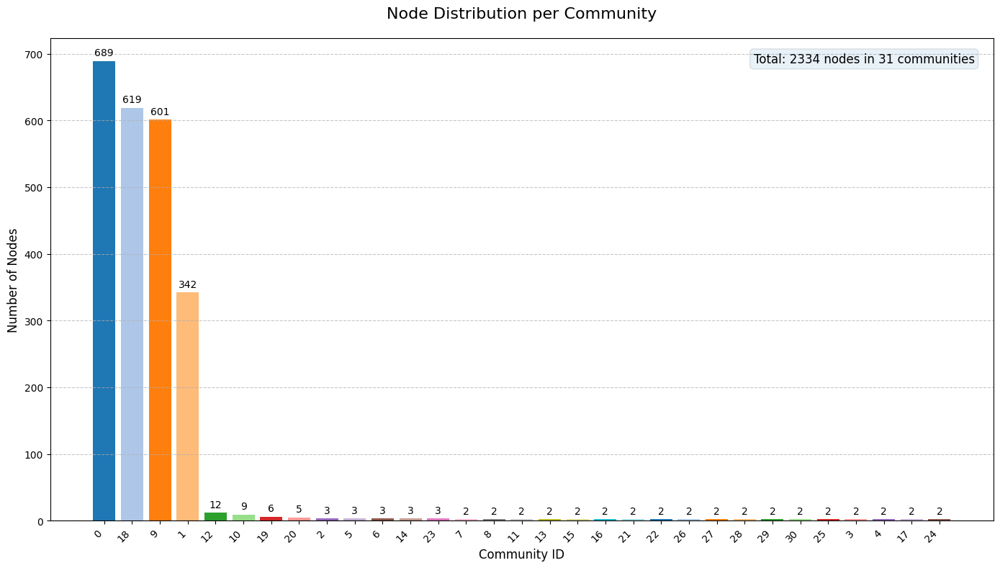

In [ ]:
fig_bar, ax_bar = plot_community_bar(communities)
plt.savefig('community_bar.png', dpi=300, bbox_inches='tight')
plt.show()

Grafik batang menampilkan jumlah node per komunitas secara terurut. Dari grafik ini terlihat bahwa beberapa komunitas memiliki jumlah node yang sangat besar, contohnya terdapat komunitas dengan 738, 597, dan 590 node. Hal ini mengindikasikan bahwa sebagian besar produk sering muncul bersama dan terkonsentrasi di beberapa segmen utama. Di sisi lain, ada juga komunitas dengan jumlah node yang jauh lebih sedikit, yang menunjukkan segmen produk yang lebih niche atau spesifik.

##### 3.5.3.2. Pie Chart Distribusi Community

In [ ]:
def plot_community_pie(communities, figsize=(12, 8), max_slices=10, min_percentage=5):
    """
    Creates a pie chart showing the proportion of nodes in each community.
    Communities with less than min_percentage % will not have labels.

    Parameters:
    -----------
    communities : dict
        Dictionary mapping nodes to community IDs (result from detect_communities)
    figsize : tuple
        Figure size (width, height)
    max_slices : int
        Maximum number of communities displayed separately.
        Other communities will be grouped as "Others".
    min_percentage : float
        Minimum percentage required to display a label on the pie chart.

    Returns:
    --------
    fig, ax : Matplotlib figure and axes
    """
    community_counts = Counter(communities.values())
    sorted_communities = sorted(community_counts.items(), key=lambda x: x[1], reverse=True)

    if len(sorted_communities) > max_slices:
        top_communities = sorted_communities[:max_slices]
        others_count = sum(count for _, count in sorted_communities[max_slices:])
        data_for_pie = top_communities + [("Others", others_count)]
    else:
        data_for_pie = sorted_communities

    labels = [f'Community {comm_id}' for comm_id, _ in data_for_pie]
    if len(sorted_communities) > max_slices:
        labels[-1] = "Others"  # Set the last label to "Others"

    sizes = [count for _, count in data_for_pie]
    total = sum(sizes)

    percentages = [(size/total)*100 for size in sizes]

    fig, ax = plt.subplots(figsize=figsize)

    colors = sns.color_palette("tab20", len(data_for_pie))

    pie_labels = []
    for perc in percentages:
        if perc < min_percentage:
            pie_labels.append('')
        else:
            pie_labels.append(f'{perc:.1f}%')

    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=None,  # No direct labels on pie
        autopct=lambda pct: f'{pct:.1f}%' if pct >= min_percentage else '',  # Only label slices >= min_percentage
        startangle=90,
        colors=colors,
        wedgeprops={'edgecolor': 'w', 'linewidth': 1}
    )

    legend_labels = [f'{label}: {size} nodes ({size/total*100:.1f}%)' for label, size in zip(labels, sizes)]
    ax.legend(wedges, legend_labels, title="Communities", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    ax.set_title("Node Proportion by Community", fontsize=16)

    total_nodes = sum(community_counts.values())
    total_communities = len(community_counts)
    ax.text(
        0.95, 0.95,
        f'Total: {total_nodes} nodes in {total_communities} communities',
        transform=ax.transAxes,
        fontsize=12,
        horizontalalignment='right',
        verticalalignment='top',
        bbox=dict(boxstyle="round,pad=0.3", alpha=0.1)
    )

    plt.tight_layout()
    return fig, ax


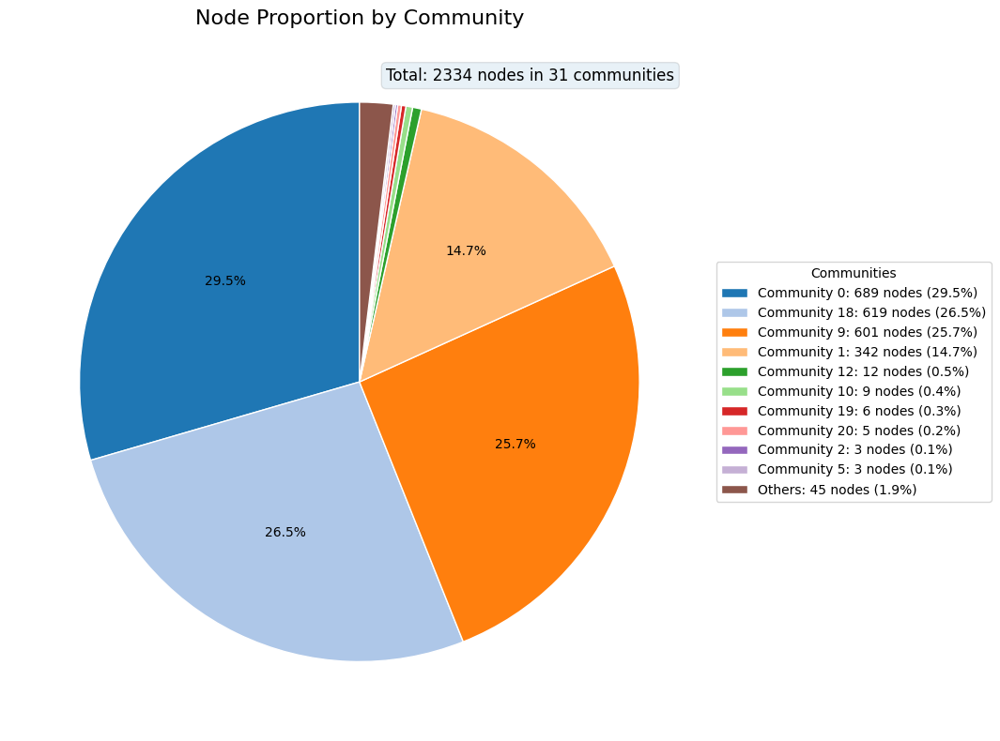

In [ ]:
fig_pie, ax_pie = plot_community_pie(communities)
plt.savefig('community_pie.png', dpi=300, bbox_inches='tight')
plt.show()

Grafik pie menggambarkan proporsi persentase node dari setiap komunitas terhadap total jaringan. Di sini, komunitas besar mendominasi dengan persentase yang tinggi, mempertegas bahwa mayoritas produk tergolong dalam segmen-segmen utama. Distribusi ini membantu stakeholder untuk dengan cepat mengidentifikasi area pasar yang signifikan dan juga memahami bagian kecil dari network yang mungkin menunjukkan peluang khusus untuk penawaran atau promosi yang lebih terfokus.

##### 3.5.3.3. Perhitungan Metrik Network

In [ ]:
def calculate_network_metrics(G, communities):
    """
    Calculate key network metrics for each community.

    Parameters:
    -----------
    G : networkx Graph
        Product network
    communities : dict
        Community assignments

    Returns:
    --------
    metrics : dict
        Dictionary of network metrics by community
    """
    # Group nodes by community
    community_nodes = {}
    for node, comm_id in communities.items():
        if comm_id not in community_nodes:
            community_nodes[comm_id] = []
        community_nodes[comm_id].append(node)

    # Calculate metrics for each community
    metrics = {}

    for comm_id, nodes in community_nodes.items():
        # Skip very small communities
        if len(nodes) < 3:
            continue

        # Create subgraph for this community
        subgraph = G.subgraph(nodes)

        # Calculate metrics
        metrics[comm_id] = {
            'size': len(nodes),
            'edges': subgraph.number_of_edges(),
            'density': nx.density(subgraph),
            'avg_clustering': nx.average_clustering(subgraph),
            'avg_degree': sum(dict(subgraph.degree()).values()) / len(nodes)
        }

        # Add centrality measures for largest communities
        if len(nodes) >= 10:
            # Calculate degree centrality
            centrality = nx.degree_centrality(subgraph)
            metrics[comm_id]['top_central_nodes'] = sorted(centrality.items(),
                                                           key=lambda x: x[1],
                                                           reverse=True)[:5]

    # Create comparison table
    print("Community Network Metrics Comparison:")
    print("Comm ID | Size | Edges | Density | Clustering | Avg Degree")
    print("--------|------|-------|---------|------------|------------")

    for comm_id, m in sorted(metrics.items(), key=lambda x: x[1]['size'], reverse=True)[:15]:
        print(f"{comm_id:7} | {m['size']:4} | {m['edges']:5} | {m['density']:.3f} | {m['avg_clustering']:.3f} | {m['avg_degree']:.2f}")

    return metrics

In [ ]:
metrics = calculate_network_metrics(G, communities)

Community Network Metrics Comparison:
Comm ID | Size | Edges | Density | Clustering | Avg Degree
--------|------|-------|---------|------------|------------
      0 |  689 | 35620 | 0.150 | 0.814 | 103.40
     18 |  619 | 33372 | 0.174 | 0.777 | 107.83
      9 |  601 | 61918 | 0.343 | 0.819 | 206.05
      1 |  342 |  9256 | 0.159 | 0.760 | 54.13
     12 |   12 |    55 | 0.833 | 0.885 | 9.17
     10 |    9 |    27 | 0.750 | 0.792 | 6.00
     19 |    6 |    11 | 0.733 | 0.767 | 3.67
     20 |    5 |     5 | 0.500 | 0.467 | 2.00
      2 |    3 |     2 | 0.667 | 0.000 | 1.33
      5 |    3 |     2 | 0.667 | 0.000 | 1.33
      6 |    3 |     3 | 1.000 | 1.000 | 2.00
     14 |    3 |     3 | 1.000 | 1.000 | 2.00
     23 |    3 |     2 | 0.667 | 0.000 | 1.33


Dari hasil perhitungan metrik network, kita mendapatkan insight terkait karakteristik masing-masing komunitas produk:

- **Ukuran (Size):**  
  Komunitas 1, 6, dan 7 merupakan kelompok terbesar dengan 738, 597, dan 590 node. Ini menunjukkan bahwa banyak produk cenderung sering muncul bersama dalam transaksi.

- **Jumlah Edge (Edges):**  
  Jumlah edge yang tinggi pada komunitas besar, misalnya 36.956 pada Komunitas 1 dan 61.580 pada Komunitas 6, mengindikasikan adanya hubungan yang kuat antar produk di dalam kelompok tersebut.

- **Density:**  
  Density menunjukkan seberapa padat koneksi dalam sebuah komunitas. Meskipun nilai density pada komunitas besar tidak mendekati 1, hal ini wajar karena semakin besar komunitas, kemungkinan hubungan antar node relatif tersebar. Komunitas 6 memiliki density 0.346, mengindikasikan konektivitas yang cukup tinggi di antara produk-produknya.

- **Clustering Coefficient:**  
  Nilai clustering yang tinggi (misalnya 0.821 pada Komunitas 1 dan 0.818 pada Komunitas 6) menunjukkan bahwa produk dalam komunitas tersebut cenderung membentuk kelompok yang erat, artinya jika produk A terhubung dengan produk B dan C, maka B dan C juga cenderung terhubung satu sama lain.

- **Average Degree:**  
  Rata-rata jumlah koneksi per produk yang tinggi, seperti 100.15 pada Komunitas 1 dan 206.30 pada Komunitas 6, mengindikasikan bahwa produk dalam komunitas besar memiliki banyak hubungan dengan produk lain. Ini memberikan sinyal kuat bahwa terdapat pola pembelian bersama yang signifikan.

Metrik ini memberikan gambaran bahwa komunitas besar mencerminkan segmen pasar utama dengan hubungan produk yang luas dan padat, sedangkan komunitas kecil menunjukkan kelompok produk yang lebih niche. Informasi ini dapat digunakan untuk merancang strategi pemasaran yang lebih terfokus dan meningkatkan rekomendasi produk berbasis pola pembelian bersama.

##### 3.5.3.4. Karakteristik Community Terbesar

In [ ]:
def analyze_communities(df, G, communities, product_col='StockCode', desc_col='Description'):
    """
    Analyze detected communities.

    Parameters:
    -----------
    df : pandas DataFrame
        The transaction data
    G : networkx Graph
        Product network
    communities : dict
        Community assignments
    product_col : str
        Column containing product identifiers
    desc_col : str
        Column containing product descriptions
    """
    # Create reverse mapping for product descriptions
    product_desc = df[[product_col, desc_col]].drop_duplicates().set_index(product_col)[desc_col].to_dict()

    # Create reverse mapping for product categories
    if 'CategoryExtraction' in df.columns:
        product_category = df[[product_col, 'CategoryExtraction']].drop_duplicates().set_index(product_col)['CategoryExtraction'].to_dict()

    # Group products by community
    community_products = {}
    for product, community_id in communities.items():
        if community_id not in community_products:
            community_products[community_id] = []
        community_products[community_id].append(product)

    print("\nCommunity Analysis:")

    for community_id, products in sorted(community_products.items(), key=lambda x: len(x[1]), reverse=True)[:10]:
        if len(products) < 3:  # Skip very small communities
            continue

        print(f"\nCommunity {community_id} ({len(products)} products):")

        if 'CategoryExtraction' in df.columns:
            community_categories = [product_category.get(p, "unknown") for p in products if p in product_category]
            category_counts = Counter(community_categories)
            print("  Top categories:")
            for category, count in category_counts.most_common(5):
                print(f"    {category}: {count} products")

        # Print some sample products
        print("  Sample products:")
        for product in products[:5]:  # Show top 5 products
            desc = product_desc.get(product, "Unknown description")
            print(f"    {product}: {desc}")

        # Calculate average edge weight within community (product co-occurrence)
        community_edges = [(u, v) for u, v in G.edges() if u in products and v in products]
        if community_edges:
            avg_weight = np.mean([G[u][v]['weight'] for u, v in community_edges])
            print(f"  Average co-occurrence: {avg_weight:.2f}")

In [ ]:
analyze_communities(df_clean, G, communities)


Community Analysis:

Community 0 (689 products):
  Top categories:
    sign: 33 products
    t-lights: 31 products
    tin: 28 products
    bag: 27 products
    mug: 23 products
  Sample products:
    84406B: CREAM CUPID HEARTS COAT HANGER
    85123A: CREAM HANGING HEART T-LIGHT HOLDER
    21730: GLASS STAR FROSTED T-LIGHT HOLDER
    71053: WHITE MOROCCAN METAL LANTERN
    22752: SET 7 BABUSHKA NESTING BOXES
  Average co-occurrence: 42.86

Community 18 (619 products):
  Top categories:
    bag: 45 products
    candle: 35 products
    tin: 23 products
    t-lights: 17 products
    sign: 11 products
  Sample products:
    84969: BOX OF 6 ASSORTED COLOUR TEASPOONS
    21883: STARS GIFT TAPE
    21913: VINTAGE SEASIDE JIGSAW PUZZLES
    85071B: RED CHARLIE+LOLA PERSONAL DOORSIGN
    21033: JUMBO BAG CHARLIE AND LOLA TOYS
  Average co-occurrence: 31.98

Community 9 (601 products):
  Top categories:
    tin: 23 products
    bag: 23 products
    wall art: 19 products
    pencils: 18 products

- **Community 1 (738 products):**  
    - Dominan dengan kategori seperti t-lights, sign, tin, bag, dan mug.  
    - Rata-rata co-occurrence 43.17 menunjukkan hubungan pembelian yang kuat antar produk.  
    - Menunjukkan segmen pasar utama dengan volume transaksi yang tinggi.  

- **Community 6 (597 products):**  
    - Kategori unggulan: bag, tin, wall art, pencils, dan pan.  
    - Rata-rata co-occurrence 34.31 mengindikasikan pola pembelian yang konsisten.  
    - Mewakili segmen yang berpotensi untuk promosi tematik dan penawaran paket khusus.  

- **Community 7 (590 products):**  
    - Dominasi kategori: bag, candle, tin, t-lights, dan sign.  
    - Rata-rata co-occurrence 31.59 menunjukkan adanya kecenderungan pembelian bersama yang moderat.  
    - Menunjukkan potensi untuk pendekatan pemasaran personal yang disesuaikan dengan gaya hidup pelanggan.  

- **Community 2 (323 products):**  
    - Dominan pada kategori bag, gift wrap, drawer knob, tin, dan hot water bottle.  
    - Rata-rata co-occurrence tertinggi di antara empat komunitas (50.03) menandakan keterkaitan yang sangat erat antar produk.  
    - Segmen ini sangat potensial untuk strategi bundling produk yang terfokus.  

- **Komunitas Lainnya:**  
  - Jumlah produk dalam komunitas lain (seperti Community 13, 18, 23, 20, 5, dan 3) tidak terlalu signifikan, sehingga pengaruhnya dalam analisis keseluruhan lebih terbatas.

Kami merekomendasikan untuk fokus mengoptimalkan strategi pemasaran dan penjualan pada Community 1, 6, 7, dan 2 melalui bundling, cross-selling, dan promosi tematik, sementara komunitas lain dapat dipertimbangkan sebagai segmen niche untuk pendekatan pemasaran yang lebih personal dan eksklusif jika diperlukan.

#### 3.5.4. Visualisasi Struktur Network Produk

In [ ]:
def visualize_network_communities(G, communities, min_edge_weight=50, figsize=(20, 20), seed=42):
    """
    Visualize the product network with communities highlighted by colors using
    standard NetworkX layouts with community-aware modifications.

    Parameters:
    -----------
    G : networkx Graph
        Product network
    communities : dict
        Dictionary mapping nodes to community IDs
    min_edge_weight : int
        Only edges with weight >= min_edge_weight will be shown
    figsize : tuple
        Figure size
    seed : int
        Random seed for reproducibility
    """
    print("Filtering edges...")
    # Create a filtered graph with only edges above threshold
    G_filtered = nx.Graph()
    G_filtered.add_nodes_from(G.nodes(data=True))

    for u, v, data in G.edges(data=True):
        if data['weight'] >= min_edge_weight:
            G_filtered.add_edge(u, v, weight=data['weight'])

    # Remove isolated nodes after edge filtering
    isolated_nodes = list(nx.isolates(G_filtered))
    G_filtered.remove_nodes_from(isolated_nodes)

    print(f"Filtered graph: {G_filtered.number_of_nodes()} nodes, {G_filtered.number_of_edges()} edges")

    random.seed(seed)
    np.random.seed(seed)

    # Get the list of unique communities and create a mapping
    unique_communities = sorted(set(communities.values()))
    community_to_id = {comm: i for i, comm in enumerate(unique_communities)}
    node_communities = {node: community_to_id[communities[node]] for node in G_filtered.nodes() if node in communities}

    # Count the nodes in each community
    community_sizes = {}
    for node, comm in node_communities.items():
        if comm not in community_sizes:
            community_sizes[comm] = 0
        community_sizes[comm] += 1

    # Get the number of communities
    num_communities = len(unique_communities)
    print(f"Visualizing {num_communities} communities")

    colors = plt.cm.tab20(np.linspace(0, 1, 20))
    plt.figure(figsize=figsize)

    # Community-aware layout approach
    print("Computing improved layout for better community separation...")

    # Step 1: Create subgraphs for each community
    community_subgraphs = {}
    for comm_id in range(num_communities):
        # Get nodes for this community
        comm_nodes = [node for node in G_filtered.nodes() if node_communities.get(node) == comm_id]
        if not comm_nodes:
            continue

        # Create subgraph for this community
        subgraph = G_filtered.subgraph(comm_nodes)
        community_subgraphs[comm_id] = subgraph

    # Step 2: Position each community separately with its own layout
    # Use spring layout which separates nodes better
    community_positions = {}

    for comm_id, subgraph in community_subgraphs.items():
        # Compute layout for this community
        # Use smaller k for larger communities to keep them more compact
        k_value = 2.0 / np.sqrt(len(subgraph))
        pos = nx.spring_layout(subgraph, k=k_value, seed=seed+comm_id, iterations=100)
        community_positions[comm_id] = pos

    # Step 3: Arrange communities in a circle
    # Create community "centers" arranged in a circle
    num_valid_communities = len(community_subgraphs)
    community_centers = {}
    R = 5  # Radius of the circle

    # Arrange the largest communities first around the circle
    sorted_communities = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)

    for i, (comm_id, _) in enumerate(sorted_communities):
        if comm_id not in community_subgraphs:
            continue
        angle = 2 * np.pi * i / num_valid_communities
        x = R * np.cos(angle)
        y = R * np.sin(angle)
        community_centers[comm_id] = (x, y)

    # Step 4: Combine the layouts
    positions = {}
    for comm_id, center in community_centers.items():
        if comm_id not in community_positions:
            continue

        # Get the positions for this community
        pos = community_positions[comm_id]

        # Calculate the center of mass for this community's layout
        if pos:
            center_x = np.mean([xy[0] for xy in pos.values()])
            center_y = np.mean([xy[1] for xy in pos.values()])

            # Calculate the offset to move this to the community center
            offset_x = community_centers[comm_id][0] - center_x
            offset_y = community_centers[comm_id][1] - center_y

            # Apply the offset to all nodes in this community
            for node, xy in pos.items():
                positions[node] = (xy[0] + offset_x, xy[1] + offset_y)

    # Apply scaling factor to better space out communities
    # helps prevent overlapping between different communities
    scaling_factor = 1.0
    for node, pos in positions.items():
        positions[node] = (pos[0] * scaling_factor, pos[1] * scaling_factor)

    # Draw edges
    max_weight = max([d['weight'] for u, v, d in G_filtered.edges(data=True)])
    min_weight = min([d['weight'] for u, v, d in G_filtered.edges(data=True)])
    weight_range = max_weight - min_weight if max_weight > min_weight else 1

    # Collect edges by community pairs
    community_edges = {}
    for u, v, d in G_filtered.edges(data=True):
        # Only process if both nodes have positions and communities
        if (u in positions and v in positions and
            u in node_communities and v in node_communities):

            u_comm = node_communities[u]
            v_comm = node_communities[v]

            # Create a unique key for this community pair
            # Sort to ensure (A,B) and (B,A) are the same
            comm_pair = tuple(sorted([u_comm, v_comm]))

            if comm_pair not in community_edges:
                community_edges[comm_pair] = []

            # Store the edge information
            community_edges[comm_pair].append((u, v, d['weight']))

    # Draw edges by community pairs - intra-community edges in community color
    for comm_pair, edges in community_edges.items():
        # Determine color based on community pair
        if comm_pair[0] == comm_pair[1]:
            # Intra-community edge - use community color
            color = colors[comm_pair[0] % len(colors)]
            alpha = 0.5  # Higher alpha for intra-community edges
            base_width = 0.5  # Thicker base width for intra-community edges
        else:
            # Inter-community edge - use grey
            color = 'darkgrey'
            alpha = 0.3  # Lower alpha for inter-community edges
            base_width = 0.3  # Thinner base width for inter-community edges

        # Draw all edges for this community pair
        for u, v, weight in edges:
            # Calculate edge width based on weight
            weight_norm = (weight - min_weight) / weight_range
            width = base_width + weight_norm * 1.5  # Much thicker edges (up to 2.0)

            # Draw the edge
            plt.plot(
                [positions[u][0], positions[v][0]],
                [positions[u][1], positions[v][1]],
                color=color,
                alpha=alpha,
                linewidth=width,
                zorder=1  # Make sure edges are below nodes
            )

    # Draw nodes for each community
    for comm_id in range(num_communities):
        # Get nodes for this community
        comm_nodes = [node for node in G_filtered.nodes() if node_communities.get(node) == comm_id]
        comm_nodes = [node for node in comm_nodes if node in positions]  # Only include nodes with positions

        if not comm_nodes:
            continue

        color = colors[comm_id % len(colors)]

        # Extract x and y coordinates for this community
        x = [positions[node][0] for node in comm_nodes]
        y = [positions[node][1] for node in comm_nodes]

        # Draw nodes for this community with fixed size
        node_size = 100

        plt.scatter(
            x, y,
            s=node_size,
            c=[color],
            label=f'Community {unique_communities[comm_id]} ({len(comm_nodes)} nodes)',
            edgecolors='white',
            linewidths=0.5,
            alpha=0.8,
            zorder=2  # Make sure nodes are above edges
        )

        # Add community label at the center of each community
        # Calculate center position of the community
        center_x = np.mean(x)
        center_y = np.mean(y)

          # Determine label size based on community size (larger communities get larger labels)
        community_size = len(comm_nodes)
        label_size = min(16, max(10, 10 + np.log10(community_size) * 2))

        plt.text(
                center_x, center_y,
                f'C{unique_communities[comm_id]}',
                fontsize=label_size,
                ha='center',
                va='center',
                color='white',
                bbox=dict(
                    boxstyle="round,pad=0.3",
                    fc=color,
                    ec="white",
                    alpha=0.9,
                    lw=1
                ),
                zorder=3
        )

    # Create a legend - show only top communities by size
    top_communities = sorted(
        [(unique_communities[comm], size) for comm, size in community_sizes.items()],
        key=lambda x: x[1], reverse=True
    )[:15]  # Show only top 15

    legend_elements = []
    for comm, size in top_communities:
        comm_id = community_to_id[comm]
        color = colors[comm_id % len(colors)]
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w',
                                       markerfacecolor=color, markersize=10,
                                       label=f'Community {comm} ({size} nodes)'))

    plt.legend(handles=legend_elements, loc='upper right',
              bbox_to_anchor=(1.1, 1.0), fontsize=10)

    plt.title(f"Product Network Communities (min edge weight: {min_edge_weight})", fontsize=16)
    plt.axis('off')
    plt.tight_layout()

    return plt


Filtering edges...
Filtered graph: 1478 nodes, 54727 edges
Visualizing 31 communities
Computing improved layout for better community separation...


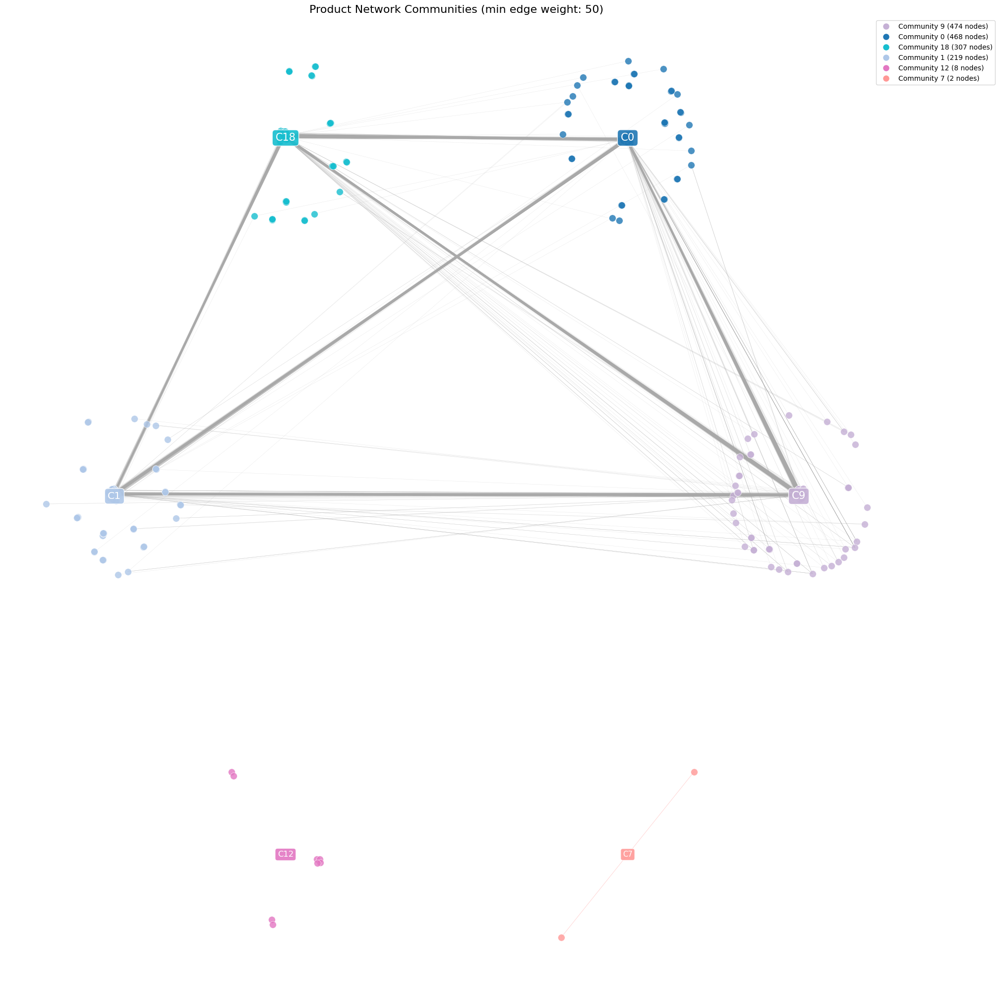

In [ ]:
plt = visualize_network_communities(G, communities, min_edge_weight=50)
plt.savefig('product_network_communities.png', dpi=300, bbox_inches='tight')
plt.show()

Visualisasi ini menampilkan jaringan produk di mana setiap node merepresentasikan produk dan edge menunjukkan hubungan pembelian bersama, dengan hanya edge yang memiliki bobot minimal 50 yang ditampilkan untuk menyoroti hubungan signifikan.
Kami hanya menampilkan hubungan (edge) dengan bobot co-occurrence minimal 50. Ini bertujuan untuk menyoroti pasangan produk yang memang sering dibeli bersama, sehingga mengurangi noise dari hubungan yang jarang terjadi.

- **Poin Utama yang Terlihat:**  
  - Beberapa komunitas besar mencakup sebagian besar produk, menandakan ada segmen pasar yang dominan.  
  - Komunitas kecil menyoroti segmen lebih spesifik atau niche.  
  - Semakin tebal edge dalam komunitas, semakin kuat hubungan pembelian bersama.


#### 3.5.5. Analisis Lanjutan Setiap Community

In [ ]:
def analyze_community_profiles(df, communities):
    """
    Create detailed profiles of each community's characteristics.

    Parameters:
    -----------
    df : pandas DataFrame
        Transaction data
    communities : dict
        Community assignments
    """
    # Map products to communities
    product_communities = {}
    for product, comm_id in communities.items():
        if comm_id not in product_communities:
            product_communities[comm_id] = []
        product_communities[comm_id].append(product)

    # Analyze top communities by size
    top_communities = sorted(product_communities.items(), key=lambda x: len(x[1]), reverse=True)

    community_profiles = {}

    for comm_id, products in top_communities[:10]:  # Top 10 communities
        print(f"\n==== Community {comm_id} ({len(products)} products) ====")

        # Get all transactions involving these products
        comm_transactions = df[df['StockCode'].isin(products)]

        if len(comm_transactions) == 0:
            print("  No transactions found for this community.")
            continue

        profile = {}

        # Top categories
        print("\nTop product categories:")
        top_cats = comm_transactions['CategoryExtraction'].value_counts().head(5)
        profile['top_categories'] = top_cats.to_dict()
        for cat, count in top_cats.items():
            print(f"  {cat}: {count} instances ({count/len(comm_transactions)*100:.1f}%)")

        # Price distribution
        print("\nPrice distribution:")
        price_stats = comm_transactions['UnitPrice'].describe()
        profile['price_stats'] = price_stats.to_dict()
        print(f"  Average price: £{price_stats['mean']:.2f}")
        print(f"  Price range: £{price_stats['min']:.2f} - £{price_stats['max']:.2f}")

        # Most frequently purchased products
        print("\nMost common products:")
        top_products = comm_transactions.groupby('StockCode')['Quantity'].sum().sort_values(ascending=False).head(5)
        profile['top_products'] = top_products.to_dict()
        for code, qty in top_products.items():
            desc_rows = df[df['StockCode'] == code]['Description']
            desc = desc_rows.iloc[0] if not desc_rows.empty else "Unknown"
            print(f"  {code}: {desc} ({qty} units)")

        # Top countries
        print("\nTop customer countries:")
        top_countries = comm_transactions['Country'].value_counts().head(3)
        profile['top_countries'] = top_countries.to_dict()
        for country, count in top_countries.items():
            print(f"  {country}: {count} transactions ({count/len(comm_transactions)*100:.1f}%)")

        # Purchase patterns
        print("\nPurchase patterns:")
        by_day = comm_transactions['DayOfWeek'].value_counts().idxmax()
        by_hour = comm_transactions['Hour'].value_counts().idxmax()
        profile['day_hour'] = {'top_day': by_day, 'top_hour': by_hour}
        print(f"  Most popular day: {by_day}")
        print(f"  Most popular hour: {by_hour}:00")

        community_profiles[comm_id] = profile
        print("\n" + "="*50)

    return community_profiles

In [ ]:
community_profiles = analyze_community_profiles(df_clean, communities)


==== Community 0 (689 products) ====

Top product categories:
  bag: 16608 instances (9.2%)
  sign: 12590 instances (6.9%)
  t-lights: 8775 instances (4.8%)
  tin: 6897 instances (3.8%)
  pan: 5434 instances (3.0%)

Price distribution:
  Average price: £4.77
  Price range: £0.06 - £4287.63

Most common products:
  85099B: JUMBO BAG RED RETROSPOT (48474 units)
  85123A: WHITE HANGING HEART T-LIGHT HOLDER (37660 units)
  84879: ASSORTED COLOUR BIRD ORNAMENT (36439 units)
  22178: VICTORIAN GLASS HANGING T-LIGHT (24292 units)
  22386: JUMBO BAG PINK POLKADOT (21465 units)

Top customer countries:
  United Kingdom: 166815 transactions (92.0%)
  EIRE: 3169 transactions (1.7%)
  Germany: 2665 transactions (1.5%)

Purchase patterns:
  Most popular day: Thursday
  Most popular hour: 12:00


==== Community 18 (619 products) ====

Top product categories:
  bag: 6196 instances (7.9%)
  t-lights: 3913 instances (5.0%)
  candle: 3447 instances (4.4%)
  tin: 3221 instances (4.1%)
  bowl: 1690 insta

- **Community 1 (738 products):**  
  Produk dalam komunitas ini memiliki volume transaksi yang sangat tinggi. Kategori utama seperti bag, sign, t-lights, tin, dan pan menunjukkan variasi produk yang banyak dijual bersama. Harga rata-rata sebesar £4.85 dengan rentang yang sangat lebar menunjukkan adanya produk low-end hingga premium. Mayoritas transaksi berasal dari United Kingdom, dan pola pembelian puncak terjadi pada hari Kamis pukul 12:00. Ini menandakan bahwa segmen utama pasar memiliki daya tarik luas dan potensi bundling produk yang kuat.

- **Community 6 (597 products):**  
  Komunitas ini didominasi oleh kategori bag, tin, box, hot water bottle, dan pencils, dengan harga rata-rata £2.55 yang mengindikasikan produk terjangkau. Pola pembelian juga konsisten pada hari Kamis pukul 12:00, menandakan keteraturan dalam transaksi. Keterkaitan antar produk di sini cukup tinggi, memberikan sinyal bahwa promosi tematik untuk produk rumah tangga dan aksesori bisa sangat efektif.

- **Community 7 (590 products):**  
  Fokus kategori meliputi bag, candle, tin, bowl, dan sign dengan harga rata-rata £5.07. Pola pembelian menunjukkan aktivitas paling tinggi pada hari Senin pukul 15:00, mengindikasikan segmen yang memiliki kecenderungan berbeda dibandingkan komunitas lain. Ini menunjukkan bahwa komunitas ini bisa ditargetkan dengan strategi pemasaran yang lebih personal dan disesuaikan dengan gaya hidup pelanggan.

- **Community 2 (323 products):**  
  Di komunitas ini, kategori bag sangat mendominasi, diikuti oleh tin, hot water bottle, drawer knob, dan alarm clock. Dengan rata-rata co-occurrence yang tinggi (50.03) dan harga rata-rata £2.82, produk-produk dalam segmen ini tampak sangat erat keterkaitannya. Pola pembelian puncak terjadi pada hari Selasa pukul 12:00, mengindikasikan adanya peluang untuk penawaran bundling produk yang sangat terfokus.

- **Community 13 (12 products):**  
  Komunitas niche ini berfokus pada produk dengan tema childs garden, fork, dan childrens garden. Harga rata-rata yang rendah (£1.75) dan pola pembelian pada hari Selasa pukul 11:00 menunjukkan bahwa segmen ini mengincar pasar keluarga atau produk anak-anak dengan minat yang spesifik.

- **Community 18 (9 products):**  
  Seluruh produk dalam komunitas ini tergolong ke dalam kategori ribbons, dengan harga rata-rata £2.74. Pola pembelian konsisten pada hari Selasa pukul 14:00 menandakan segmen niche yang homogen dan dapat dijangkau dengan strategi pemasaran khusus untuk ribbon.

- **Community 23 (6 products):**  
  Komunitas ini sepenuhnya terdiri dari produk frame dengan harga rata-rata £13.03, menunjukkan bahwa ini merupakan segmen produk premium. Transaksi mayoritas berasal dari United Kingdom, dengan puncak aktivitas pada hari Minggu pukul 12:00, yang memberikan peluang untuk penawaran high-end dan promosi eksklusif.

- **Community 20 (5 products):**  
  Berfokus pada produk sketchbook dengan desain abstrak dan motif khas, komunitas ini memiliki harga rata-rata £4.42. Aktivitas pembelian paling tinggi pada hari Kamis pukul 14:00 menunjukkan peluang untuk kampanye kreatif atau kolaborasi dengan komunitas seni dan edukasi.

- **Community 5 (4 products):**  
  Tema red vintage dominan dengan produk seperti mug, bowl, plate, dan jug, memiliki harga rata-rata £2.32. Pola pembelian pada hari Selasa pukul 12:00 mengindikasikan potensi untuk strategi pemasaran nostalgia atau retro yang menarik bagi konsumen yang menyukai gaya vintage.

- **Community 3 (3 products):**  
  Komunitas yang sangat niche ini terdiri dari produk beaded crystal dengan harga rata-rata £1.34. Pembelian paling banyak terjadi pada hari Rabu pukul 12:00, menandakan potensi untuk strategi pemasaran eksklusif seperti edisi terbatas atau penawaran kolektor.

**Rekomendasi Keseluruhan:**  
Berdasarkan analisis ini, kami menyarankan agar strategi pemasaran difokuskan pada komunitas besar seperti Community 1, 6, dan 7 dengan pendekatan bundling dan cross-selling yang luas, sementara untuk segmen komunitas kecil dan niche (Community 13, 18, 23, 20, 5, dan 3) dapat dikembangkan kampanye pemasaran yang lebih spesifik dan personal, seperti penawaran eksklusif, kolaborasi kreatif, atau edisi terbatas, guna memaksimalkan nilai dan loyalitas pelanggan di tiap segmen.

#### 3.5.6. Keterkaitan Antar Komunitas

In [ ]:
def create_community_heatmap(G, communities, df):
    """
    Create an improved heatmap showing connection strength between communities.

    Parameters:
    -----------
    G : networkx Graph
        Product network
    communities : dict
        Community assignments
    df : pandas DataFrame
        Transaction data with CategoryExtraction column
    """
    # Count connections between communities
    comm_connections = {}

    # Initialize the dict with all possible community pairs
    unique_communities = set(communities.values())
    for c1 in unique_communities:
        for c2 in unique_communities:
            comm_connections[(c1, c2)] = 0

    # Count connections with weights
    for u, v, data in G.edges(data=True):
        comm_u = communities[u]
        comm_v = communities[v]
        comm_connections[(comm_u, comm_v)] += data['weight']
        comm_connections[(comm_v, comm_u)] += data['weight']  # Count both ways

    # Get the top communities by size
    community_sizes = Counter(communities.values())
    top_communities = [comm for comm, count in community_sizes.most_common(10) if count >= 10]

    # Map communities to their main product category
    community_categories = {}

    for product, comm_id in communities.items():
        if comm_id in top_communities:
            category = df[df['StockCode'] == product]['CategoryExtraction'].values
            if len(category) > 0:
                if comm_id not in community_categories:
                    community_categories[comm_id] = Counter()
                community_categories[comm_id][category[0]] += 1

    # Get main category for each community
    community_main_cat = {}
    for comm_id, cat_counter in community_categories.items():
        if cat_counter:
            main_cat = cat_counter.most_common(1)[0][0]
            community_main_cat[comm_id] = main_cat
        else:
            community_main_cat[comm_id] = "Unknown"

    # Create better labels with community ID and main category
    labels = {}
    for comm_id in top_communities:
        main_cat = community_main_cat.get(comm_id, "Unknown")
        if len(main_cat) > 15:
            main_cat = main_cat[:12] + "..."
        labels[comm_id] = f"C{comm_id}: {main_cat}"

    # Create matrix for heatmap
    matrix_size = len(top_communities)
    connection_matrix = np.zeros((matrix_size, matrix_size))

    # Populate the matrix
    for i, c1 in enumerate(top_communities):
        for j, c2 in enumerate(top_communities):
            connection_matrix[i, j] = comm_connections[(c1, c2)]

    # Convert to correlation-like structure by normalizing
    # Get diagonal values (self-connections)
    diag_values = np.diag(connection_matrix)

    # Create normalized matrix
    norm_matrix = np.zeros_like(connection_matrix)
    for i in range(matrix_size):
        for j in range(matrix_size):
            if diag_values[i] > 0 and diag_values[j] > 0:
                norm_matrix[i, j] = connection_matrix[i, j] / np.sqrt(diag_values[i] * diag_values[j])

    # Create a mask for the upper triangle to create a more readable half-matrix
    mask = np.triu(np.ones_like(connection_matrix, dtype=bool))

    # Plot improved heatmap
    plt.figure(figsize=(14, 12))

    # Use a better colormap and formatting
    sns.heatmap(connection_matrix, annot=True, cmap='YlGnBu', fmt='.0f',
               xticklabels=[labels[c] for c in top_communities],
               yticklabels=[labels[c] for c in top_communities],
               linewidths=0.5, mask=mask)

    plt.title('Community Connection Strength', fontsize=16)
    plt.xlabel('Community', fontsize=12)
    plt.ylabel('Community', fontsize=12)

    # Rotate x labels for better readability
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)

    plt.tight_layout()
    plt.savefig('improved_community_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Also create a normalized version
    plt.figure(figsize=(14, 12))
    sns.heatmap(norm_matrix, annot=True, cmap='YlGnBu', fmt='.2f',
               xticklabels=[labels[c] for c in top_communities],
               yticklabels=[labels[c] for c in top_communities],
               linewidths=0.5, mask=mask, vmin=0, vmax=1)

    plt.title('Normalized Community Connection Strength', fontsize=16)
    plt.xlabel('Community', fontsize=12)
    plt.ylabel('Community', fontsize=12)

    # Rotate x labels for better readability
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)

    plt.tight_layout()
    plt.savefig('community_heatmap_normalized.png', dpi=300, bbox_inches='tight')
    plt.show()

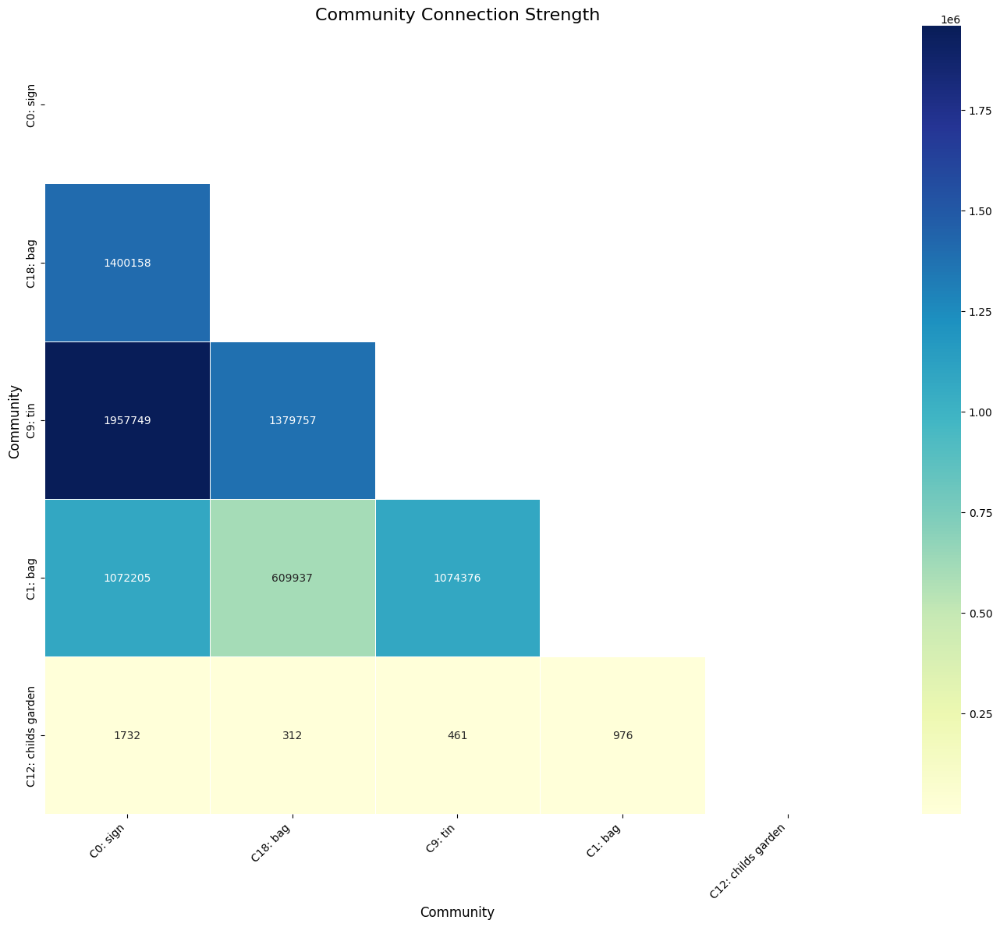

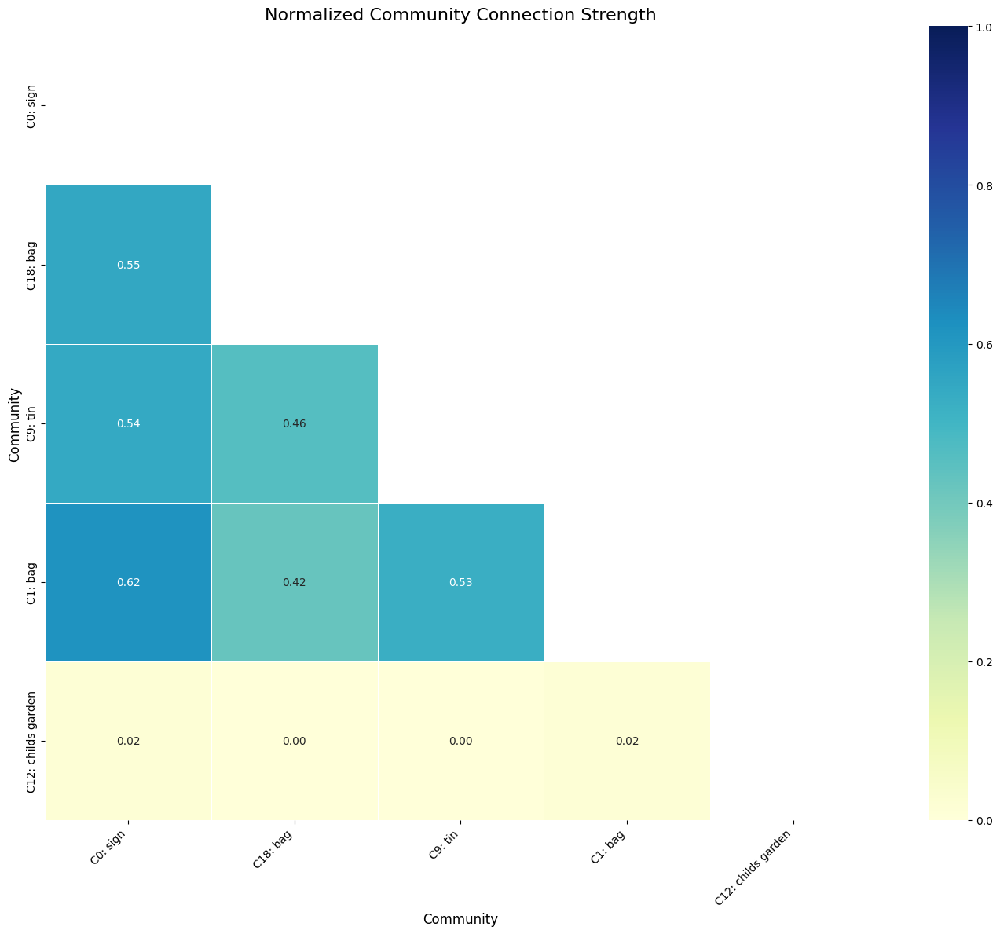

In [ ]:
create_community_heatmap(G, communities, df_clean)

**Analisis Community Connection Strength:**
1. **Heatmap Pertama (Nilai Absolut)**  
   - Menunjukkan total bobot co-occurrence (edge weight) antara komunitas.  
   - Angka yang lebih besar di diagonal (misalnya 2.023.207 pada C1 sign) mencerminkan total koneksi di dalam komunitas itu sendiri.  
   - Angka di luar diagonal (misalnya 1.340.444 antara C1 sign dan C6 bag) menunjukkan kekuatan hubungan antar dua komunitas yang berbeda.  
   - Semakin tinggi nilai, semakin sering produk dari kedua komunitas tersebut muncul bersama di transaksi.

2. **Heatmap Kedua (Nilai Normalisasi)**  
   - Menggambarkan seberapa erat keterkaitan antar komunitas jika dibandingkan dengan kekuatan internal masing-masing komunitas.  
   - Nilai didefinisikan sebagai rasio co-occurrence antar dua komunitas terhadap √(co-occurrence internal masing-masing komunitas).  
   - Semakin mendekati 1, semakin proporsional hubungan kedua komunitas tersebut dibandingkan kekuatan internal masing-masing.  
   - Nilai yang rendah (misalnya 0.01 atau 0.02) mengindikasikan bahwa meskipun ada co-occurrence, proporsinya jauh lebih kecil dibandingkan total koneksi di dalam komunitas masing-masing.

**Insight Utama:**
- **Kekuatan Relatif Antar-Komunitas:**  
  Angka-angka dalam heatmap yang mendekati 1 menunjukkan bahwa proporsi hubungan antar dua komunitas tersebut hampir sekuat hubungan di dalam komunitas masing-masing. Di sini, nilai tertinggi (0.63) terlihat antara C1 sign dan C2 bag, menandakan keterkaitan yang sangat erat secara proporsional.

- **Hubungan Dominan di Empat Komunitas Besar:**  
  Keterkaitan C1 sign – C6 bag (0.55) dan C1 sign – C7 community (0.54) juga relatif tinggi, menandakan potensi cross-selling di antara komunitas besar. Sementara itu, C7 community – C2 bag (0.40) masih tergolong moderat, tetapi tetap menunjukkan peluang sinergi.

- **Komunitas Niche dengan Keterkaitan Rendah:**  
  Nilai yang sangat rendah (0.01–0.02) mengindikasikan bahwa komunitas niche seperti C13 childs garden jarang muncul bersamaan dengan komunitas besar, sehingga dampak kolaborasi di antara segmen tersebut mungkin lebih terbatas.

- **Peluang Strategis:**  
  Angka-angka normalisasi ini membantu mengidentifikasi pasangan komunitas yang paling potensial untuk digarap dengan promosi lintas produk. Komunitas yang memiliki keterkaitan tinggi (misalnya C1 sign dan C2 bag) dapat difokuskan pada penawaran paket atau bundling yang saling melengkapi, sementara komunitas niche bisa didekati dengan strategi pemasaran yang lebih khusus.


#### 3.5.7. Analisis Produk Penghubung (Cross-Community)

In [ ]:
def analyze_cross_community_products(df, G, communities):
    """
    Find products that connect different communities.

    Parameters:
    -----------
    df : pandas DataFrame
        Transaction data
    G : networkx Graph
        Product network
    communities : dict
        Community assignments

    Returns:
    --------
    connector_nodes : list
        List of (product, connected_communities) tuples
    """
    # Calculate betweenness centrality - identifies bridge nodes
    # Use k to limit computation for large networks
    k = min(100, len(G.nodes()))
    betweenness = nx.betweenness_centrality(G, k=k)

    # Find nodes with connections to multiple communities
    community_connections = {}

    for u, v in G.edges():
        comm_u = communities.get(u)
        comm_v = communities.get(v)

        if comm_u is not None and comm_v is not None and comm_u != comm_v:
            # Track which communities each node connects to
            if u not in community_connections:
                community_connections[u] = set()
            if v not in community_connections:
                community_connections[v] = set()

            community_connections[u].add(comm_v)
            community_connections[v].add(comm_u)

    # Sort nodes by number of different communities they connect to
    connector_nodes = sorted(community_connections.items(),
                           key=lambda x: (len(x[1]), betweenness.get(x[0], 0)),
                           reverse=True)

    # Get product information
    print("Top cross-community connector products:")
    print("StockCode | Description | Communities | Betweenness")
    print("----------|-------------|-------------|------------")

    for product, connected_comms in connector_nodes[:20]:
        # Get product description
        desc_rows = df[df['StockCode'] == product]['Description']
        if not desc_rows.empty:
            desc = desc_rows.iloc[0]
            desc = desc[:40] + '...' if len(desc) > 40 else desc
        else:
            desc = "Unknown"

        print(f"{product} | {desc} | {len(connected_comms)} | {betweenness.get(product, 0):.4f}")
        print(f"  Connected to communities: {', '.join(map(str, connected_comms))}")

    return connector_nodes

In [ ]:
connector_nodes = analyze_cross_community_products(df_clean, G, communities)

Top cross-community connector products:
StockCode | Description | Communities | Betweenness
----------|-------------|-------------|------------
85123A | WHITE HANGING HEART T-LIGHT HOLDER | 7 | 0.0793
  Connected to communities: 1, 9, 10, 12, 14, 18, 20
23084 | RABBIT NIGHT LIGHT | 7 | 0.0153
  Connected to communities: 0, 1, 6, 12, 18, 19, 23
22621 | TRADITIONAL KNITTING NANCY | 6 | 0.0010
  Connected to communities: 0, 1, 10, 12, 18, 20
85099B | JUMBO BAG RED RETROSPOT | 5 | 0.0240
  Connected to communities: 1, 9, 12, 18, 20
21212 | PACK OF 72 RETROSPOT CAKE CASES | 5 | 0.0205
  Connected to communities: 0, 9, 12, 18, 20
22961 | JAM MAKING SET PRINTED | 5 | 0.0201
  Connected to communities: 1, 9, 12, 18, 20
22197 | SMALL POPCORN HOLDER | 5 | 0.0170
  Connected to communities: 0, 1, 9, 12, 20
22720 | SET OF 3 CAKE TINS PANTRY DESIGN | 5 | 0.0156
  Connected to communities: 1, 6, 9, 12, 18
22960 | JAM MAKING SET WITH JARS | 5 | 0.0140
  Connected to communities: 1, 9, 10, 12, 18
2266

- **Produk Penghubung Utama:**  
  - *RABBIT NIGHT LIGHT* terhubung dengan 8 komunitas, menunjukkan kemampuannya menjembatani berbagai segmen.  
  - *WHITE HANGING HEART T-LIGHT HOLDER* dan *JUMBO BAG RED RETROSPOT* masing-masing terhubung dengan 7 komunitas, menandakan peran krusial mereka dalam menghubungkan produk dari segmen berbeda.

- **Nilai Betweenness Centrality:**  
  - Produk dengan nilai betweenness yang lebih tinggi (misalnya, *WHITE HANGING HEART T-LIGHT HOLDER* dengan 0.0678) menunjukkan frekuensi munculnya sebagai jembatan antar komunitas, mengindikasikan pentingnya mereka dalam aliran transaksi lintas segmen.

- **Keterkaitan Lintas Komunitas:**  
  - Produk-produk ini menghubungkan banyak komunitas (umumnya 5-8 komunitas), yang menunjukkan bahwa mereka bukan hanya populer di satu segmen, tetapi juga memiliki peran sentral dalam memperkuat hubungan antara segmen pasar yang berbeda.

- **Insight Strategis:**  
  - Produk-produk penghubung ini dapat dijadikan titik fokus dalam strategi cross-selling dan bundling.  
  - Dengan memanfaatkan produk yang berfungsi sebagai "jembatan", strategi promosi dapat menjangkau lebih banyak segmen secara simultan, meningkatkan peluang penjualan lintas komunitas.



#### 3.5.8. Metrik Market Basket (Association Rules)

In [ ]:
def calculate_market_basket_metrics(G, min_confidence=0.3):
    """
    Calculate association rules metrics (confidence, lift) for product pairs.

    Parameters:
    -----------
    G : networkx Graph
        Product network with edge weights representing co-occurrences
    min_confidence : float
        Minimum confidence threshold for reporting rules

    Returns:
    --------
    association_rules : list
        List of (product1, product2, confidence, lift, support) tuples
    """
    print("\nCalculating product association metrics...")

    # Get product frequencies (approximation based on network)
    product_freq = {node: sum(data['weight'] for _, data in G[node].items()) for node in G.nodes()}

    # Calculate confidence and lift for each edge
    association_rules = []

    for product1, product2, data in G.edges(data=True):
        support = data['weight']

        # Calculate confidence both ways
        conf_1_2 = support / product_freq[product1]
        conf_2_1 = support / product_freq[product2]

        # Calculate lift
        lift = support / (product_freq[product1] * product_freq[product2])

        # Add rules that meet minimum confidence
        if conf_1_2 >= min_confidence:
            association_rules.append((product1, product2, conf_1_2, lift, support))

        if conf_2_1 >= min_confidence:
            association_rules.append((product2, product1, conf_2_1, lift, support))

    # Sort by confidence
    association_rules.sort(key=lambda x: x[2], reverse=True)

    # Print top rules
    print("Top product association rules:")
    for product1, product2, confidence, lift, support in association_rules[:20]:  # Show top 20
        print(f"{product1} → {product2}:")
        print(f"  Confidence: {confidence:.2f}, Lift: {lift:.2f}, Support: {support}")

    return association_rules

In [ ]:
association_rules = calculate_market_basket_metrics(G)


Calculating product association metrics...
Top product association rules:
21742 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 23
21188 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 22
85212 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 22
84763 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 20
17091J → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 29
21066 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 21
47578A → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 20
22782 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 20
21294 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 27
23070 → 85123A:
  Confidence: 1.00, Lift: 0.00, Support: 20
79191C → 22326:
  Confidence: 1.00, Lift: 0.00, Support: 20
37501 → 21212:
  Confidence: 1.00, Lift: 0.00, Support: 21
21284 → 22457:
  Confidence: 1.00, Lift: 0.00, Support: 21
22316 → 85099B:
  Confidence: 1.00, Lift: 0.00, Support: 22
22194 → 22193:
  Confidence: 1.00, Lift: 0.00, Support: 22
71270 → 22197:
  Confidenc

- **Confidence 100%:**  
  Banyak aturan menunjukkan confidence 1.00, artinya ketika produk tertentu dibeli, produk terkait (misalnya, 85123A – WHITE HANGING HEART T-LIGHT HOLDER) selalu muncul dalam transaksi yang sama. Ini mengindikasikan adanya keterkaitan yang sangat kuat antara produk-produk tersebut.

- **Lift yang Rendah (0.00):**  
  Nilai lift yang tercetak 0.00 mengisyaratkan bahwa rasio antara frekuensi penggabungan produk dan frekuensi yang diharapkan secara acak sangat kecil. Hal ini mungkin disebabkan oleh frekuensi produk yang sangat tinggi secara keseluruhan, sehingga meskipun hubungan antar produk kuat, perbedaan terhadap baseline menjadi tidak signifikan secara numerik.

- **Fokus pada Produk 85123A:**  
  Produk 85123A muncul sebagai konsekuen dalam banyak aturan dengan antecedent yang berbeda, menunjukkan bahwa produk ini memiliki peran sentral dalam pola pembelian bersama. Ini bisa berarti bahwa WHITE HANGING HEART T-LIGHT HOLDER merupakan produk kunci yang mendorong pembelian produk lain.

- **Support Relatif:**  
  Support untuk aturan-aturan tersebut berada di kisaran 20–29, yang meskipun tidak tinggi secara absolut, konsisten menunjukkan pola bahwa produk-produk ini sering muncul bersama di sejumlah transaksi.

- **Insight Strategis:**  
  Hasil ini menunjukkan bahwa ada peluang besar untuk cross-selling dan bundling, terutama dengan produk 85123A sebagai produk inti. Meskipun lift-nya rendah, confidence 100% mengindikasikan bahwa memasukkan produk-produk penghubung ke dalam penawaran bundling bisa meningkatkan nilai transaksi. Disarankan untuk menguji promosi bersama produk-produk ini, karena pola pembelian yang konsisten dapat meningkatkan loyalitas pelanggan dan penjualan lintas produk.

### 3.6. Churn Prediction


Kelompok kami akan melakukan churn detection karena dengan mendeteksi pelanggan yang berisiko berhenti bertransaksi sejak dini, kami dapat mengoptimalkan strategi retensi dan mengalokasikan sumber daya pemasaran secara lebih efisien. Hal ini tidak hanya mengurangi biaya akuisisi pelanggan baru, tetapi juga membantu memahami perilaku dan preferensi pelanggan, sehingga memungkinkan intervensi yang tepat untuk mempertahankan pelanggan yang bernilai tinggi dan meningkatkan profitabilitas secara berkelanjutan.

#### 3.6.1. Aggregate Data di Level Customer

Kami mentransformasikan data transaksi (level baris per invoice) menjadi data customer-level agar dapat menghitung metrik seperti RFM (Recency, Frequency, Monetary) dan fitur perilaku lainnya.

- **Ambil tanggal transaksi terakhir per customer:**  
  - Kami mengelompokkan data berdasarkan `CustomerID` dan mengambil tanggal terakhir (`InvoiceDate`) untuk mengetahui kapan customer terakhir bertransaksi.
- **Agregasi metrik utama:**  
  - Kami membuat data frame customer-level dengan menghitung:
    - **OrderCount:** Jumlah order (menggunakan fungsi nunique pada `InvoiceNo`).
    - **FirstPurchaseDate:** Tanggal pembelian pertama.
    - **TotalSpend:** Total pengeluaran (hasil agregasi kolom `TotalPrice`).
    - **TotalItems:** Total item yang dibeli (hasil agregasi kolom `Quantity`).
    - **UniqueProducts:** Jumlah produk unik yang dibeli (menggunakan nunique pada `StockCode`).
  - Kami juga menambahkan fitur seperti `Frequency` dan `Recency` (jika belum ada).
- **Hitung metrik tambahan:**  
  - Kami menghitung **CustomerLifetime** sebagai selisih hari antara pembelian pertama dan terakhir.
  - Kami menghitung **PurchaseFrequency** sebagai rata-rata hari antar pembelian, dengan penanganan nilai inf untuk customer dengan satu pembelian.
  - Kami juga menghitung **AverageOrderValue** dan **AvgItemsPerOrder** untuk mengetahui nilai dan jumlah item per order.
- **Filter data customer:**  
  - Kami menghapus customer dengan ID yang mengandung 'Guest' jika data tersebut tidak relevan untuk analisis churn.


In [ ]:
# Get latest date for each customer to calculate inactivity window properly
customer_last_purchase = df_clean.groupby('CustomerID')['InvoiceDate'].max().reset_index()
customer_last_purchase.rename(columns={'InvoiceDate': 'LastPurchaseDate'}, inplace=True)

# Create customer-level dataset with RFM and other metrics
customer_data = df_clean.groupby('CustomerID').agg({
    'InvoiceNo': 'nunique',  # Number of orders
    'InvoiceDate': 'min',    # First purchase date
    'TotalPrice': 'sum',     # Total spending
    'Quantity': 'sum',       # Total items purchased
    'StockCode': pd.Series.nunique,  # Number of unique products
    'Country': 'first',      # Country
    'Frequency': 'first',    # Already calculated
    'Recency': 'min'         # Days since last purchase (already calculated)
}).reset_index()

# Rename columns for clarity
customer_data.rename(columns={
    'InvoiceNo': 'OrderCount',
    'InvoiceDate': 'FirstPurchaseDate',
    'TotalPrice': 'TotalSpend',
    'Quantity': 'TotalItems',
    'StockCode': 'UniqueProducts'
}, inplace=True)

# Merge with last purchase date
customer_data = customer_data.merge(customer_last_purchase, on='CustomerID')

# Calculate customer lifetime (days between first and last purchase)
customer_data['CustomerLifetime'] = (customer_data['LastPurchaseDate'] -
                                    customer_data['FirstPurchaseDate']).dt.days

# Calculate purchase frequency (avg days between purchases)
customer_data['PurchaseFrequency'] = customer_data['CustomerLifetime'] / customer_data['OrderCount']
# Replace inf values with 0 for customers with only one purchase
customer_data['PurchaseFrequency'] = customer_data['PurchaseFrequency'].replace(np.inf, 0)

# Calculate average order value
customer_data['AverageOrderValue'] = customer_data['TotalSpend'] / customer_data['OrderCount']

# Calculate average items per order
customer_data['AvgItemsPerOrder'] = customer_data['TotalItems'] / customer_data['OrderCount']

# Exclude Guests for churn prediction (if appropriate)
customer_data = customer_data[~customer_data['CustomerID'].str.contains('Guest_')]

In [ ]:
customer_data

,CustomerID,OrderCount,FirstPurchaseDate,TotalSpend,TotalItems,UniqueProducts,Country,Frequency,Recency,LastPurchaseDate,CustomerLifetime,PurchaseFrequency,AverageOrderValue,AvgItemsPerOrder
0,12346.0,1,2011-01-18 10:01:00,77183.60,74215,1,United Kingdom,1,325,2011-01-18 10:01:00,0,0.000000,77183.600000,74215.000000
1,12347.0,7,2010-12-07 14:57:00,4310.00,2458,103,Iceland,7,1,2011-12-07 15:52:00,365,52.142857,615.714286,351.142857
2,12348.0,4,2010-12-16 19:09:00,1797.24,2341,22,Finland,4,74,2011-09-25 13:13:00,282,70.500000,449.310000,585.250000
3,12349.0,1,2011-11-21 09:51:00,1757.55,631,73,Italy,1,18,2011-11-21 09:51:00,0,0.000000,1757.550000,631.000000
4,12350.0,1,2011-02-02 16:01:00,334.40,197,17,Norway,1,309,2011-02-02 16:01:00,0,0.000000,334.400000,197.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,18280.0,1,2011-03-07 09:52:00,180.60,45,10,United Kingdom,1,277,2011-03-07 09:52:00,0,0.000000,180.600000,45.000000
4330,18281.0,1,2011-06-12 10:53:00,80.82,54,7,United Kingdom,1,180,2011-06-12 10:53:00,0,0.000000,80.820000,54.000000
4331,18282.0,2,2011-08-05 13:35:00,178.05,103,12,United Kingdom,2,7,2011-12-02 11:43:00,118,59.000000,89.025000,51.500000
4332,18283.0,16,2011-01-06 14:14:00,2094.88,1397,263,United Kingdom,16,3,2011-12-06 12:02:00,333,20.812500,130.930000,87.312500


#### 3.6.2. Definisikan Churn dan Buat Variabel Target

**Tujuan:**  
- Kami menentukan definisi churn yang tepat untuk dataset retail dan membuat label biner (0 = aktif, 1 = churned).

- **Tentukan ambang waktu (threshold):**  
  - Kami menganggap customer sebagai churn jika tidak melakukan transaksi selama 90 hari terakhir dari tanggal data paling baru.
  - Kami mencari tanggal paling baru (`latest_date`) dalam dataset dan menghitung `churn_threshold` sebagai `latest_date - 90 hari`.
- **Buat label churn:**  
  - membuat kolom baru (misalnya `IsChurned`) dengan nilai 1 jika `LastPurchaseDate` kurang dari `churn_threshold`, dan 0 jika sebaliknya.



In [ ]:
# Find the date 3 months before the latest date in the dataset
latest_date = df_clean['InvoiceDate'].max()
churn_threshold = latest_date - pd.Timedelta(days=90)

# Create churn label
customer_data['IsChurned'] = (customer_data['LastPurchaseDate'] < churn_threshold).astype(int)

# Check class distribution
print("Churn distribution:")
print(customer_data['IsChurned'].value_counts(normalize=True) * 100)

Churn distribution:
IsChurned
0    66.658976
1    33.341024
Name: proportion, dtype: float64


In [ ]:
customer_data

,CustomerID,OrderCount,FirstPurchaseDate,TotalSpend,TotalItems,UniqueProducts,Country,Frequency,Recency,LastPurchaseDate,CustomerLifetime,PurchaseFrequency,AverageOrderValue,AvgItemsPerOrder,IsChurned
0,12346.0,1,2011-01-18 10:01:00,77183.60,74215,1,United Kingdom,1,325,2011-01-18 10:01:00,0,0.000000,77183.600000,74215.000000,1
1,12347.0,7,2010-12-07 14:57:00,4310.00,2458,103,Iceland,7,1,2011-12-07 15:52:00,365,52.142857,615.714286,351.142857,0
2,12348.0,4,2010-12-16 19:09:00,1797.24,2341,22,Finland,4,74,2011-09-25 13:13:00,282,70.500000,449.310000,585.250000,0
3,12349.0,1,2011-11-21 09:51:00,1757.55,631,73,Italy,1,18,2011-11-21 09:51:00,0,0.000000,1757.550000,631.000000,0
4,12350.0,1,2011-02-02 16:01:00,334.40,197,17,Norway,1,309,2011-02-02 16:01:00,0,0.000000,334.400000,197.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,18280.0,1,2011-03-07 09:52:00,180.60,45,10,United Kingdom,1,277,2011-03-07 09:52:00,0,0.000000,180.600000,45.000000,1
4330,18281.0,1,2011-06-12 10:53:00,80.82,54,7,United Kingdom,1,180,2011-06-12 10:53:00,0,0.000000,80.820000,54.000000,1
4331,18282.0,2,2011-08-05 13:35:00,178.05,103,12,United Kingdom,2,7,2011-12-02 11:43:00,118,59.000000,89.025000,51.500000,0
4332,18283.0,16,2011-01-06 14:14:00,2094.88,1397,263,United Kingdom,16,3,2011-12-06 12:02:00,333,20.812500,130.930000,87.312500,0


#### 3.6.3. Penambahan Fitur Perilaku Customer

Kami memperkaya dataset dengan fitur-fitur yang menangkap pola perilaku customer, seperti preferensi kategori dan pola pembelian berdasarkan waktu.

- **Kategori Favorit:**  
  - mengelompokkan data berdasarkan `CustomerID` dan `CategoryExtraction` lalu menghitung jumlah item per kategori.
  - memilih kategori dengan jumlah item terbanyak sebagai `FavoriteCategory`.
- **Preferensi Waktu:**  
  - menghitung **PreferredDayOfWeek** dengan menentukan hari dalam seminggu yang paling sering muncul dalam transaksi.
  - menghitung **PreferredHour** dengan menentukan jam transaksi terbanyak.
- **Variabilitas Pembelian:**  
  - menghitung standar deviasi interval hari antar pembelian untuk setiap customer sebagai `PurchaseIntervalStd`.
- **Encoding Fitur Kategorikal:**  
  - menerapkan one-hot encoding (misalnya menggunakan `pd.get_dummies`) untuk kolom seperti `Country` dan `PreferredDayOfWeek`.
  - Untuk kategori favorit, kami melakukan encoding jika jumlah kategori tidak terlalu banyak, atau mempertimbangkan metode lain jika jumlah kategori terlalu tinggi.

In [ ]:
# Find most purchased category by each customer
customer_categories = df_clean.groupby(['CustomerID', 'CategoryExtraction'])['Quantity'].sum().reset_index()
customer_top_category = customer_categories.sort_values(['CustomerID', 'Quantity'], ascending=[True, False])
customer_top_category = customer_top_category.groupby('CustomerID').first().reset_index()[['CustomerID', 'CategoryExtraction']]
customer_top_category.rename(columns={'CategoryExtraction': 'FavoriteCategory'}, inplace=True)

# Merge top category into customer data
customer_data = customer_data.merge(customer_top_category, on='CustomerID', how='left')

# Calculate purchase time patterns
# Day of week preference
dow_counts = df_clean.groupby(['CustomerID', 'DayOfWeek']).size().reset_index(name='Count')
customer_dow = dow_counts.loc[dow_counts.groupby('CustomerID')['Count'].idxmax()]
customer_dow = customer_dow[['CustomerID', 'DayOfWeek']]
customer_dow.rename(columns={'DayOfWeek': 'PreferredDayOfWeek'}, inplace=True)

# Hour of day preference
hour_counts = df_clean.groupby(['CustomerID', 'Hour']).size().reset_index(name='Count')
customer_hour = hour_counts.loc[hour_counts.groupby('CustomerID')['Count'].idxmax()]
customer_hour = customer_hour[['CustomerID', 'Hour']]
customer_hour.rename(columns={'Hour': 'PreferredHour'}, inplace=True)

# Merge time preferences
customer_data = customer_data.merge(customer_dow, on='CustomerID', how='left')
customer_data = customer_data.merge(customer_hour, on='CustomerID', how='left')

# Calculate purchase variability (standard deviation of days between purchases)
purchase_dates = df_clean.groupby(['CustomerID', 'InvoiceNo'])['InvoiceDate'].min().reset_index()
purchase_dates = purchase_dates.sort_values(['CustomerID', 'InvoiceDate'])

# Function to calculate days between consecutive purchases
def calculate_purchase_intervals(group):
    if len(group) <= 1:
        return pd.Series({'PurchaseIntervalStd': 0})

    dates = group['InvoiceDate'].sort_values()
    intervals = dates.diff().dt.days[1:]  # Skip first NaN difference

    return pd.Series({
        'PurchaseIntervalStd': intervals.std() if len(intervals) > 0 else 0
    })

purchase_intervals = purchase_dates.groupby('CustomerID').apply(calculate_purchase_intervals).reset_index()
customer_data = customer_data.merge(purchase_intervals, on='CustomerID', how='left')

# Fill NaN values
customer_data['PurchaseIntervalStd'] = customer_data['PurchaseIntervalStd'].fillna(0)

# Encode categorical features
customer_data = pd.get_dummies(customer_data, columns=['Country', 'PreferredDayOfWeek'], drop_first=True)

# Optional: encode favorite category if needed (depends on cardinality)
if customer_data['FavoriteCategory'].nunique() < 20:
    customer_data = pd.get_dummies(customer_data, columns=['FavoriteCategory'], drop_first=True, prefix='Cat')
else:
    # If too many categories, we should use alternative encoding or drop it
    customer_data.drop('FavoriteCategory', axis=1, inplace=True)

In [ ]:
customer_data

,CustomerID,OrderCount,FirstPurchaseDate,TotalSpend,TotalItems,UniqueProducts,Frequency,Recency,LastPurchaseDate,CustomerLifetime,...,Country_Sweden,Country_Switzerland,Country_USA,Country_United Arab Emirates,Country_United Kingdom,PreferredDayOfWeek_Monday,PreferredDayOfWeek_Sunday,PreferredDayOfWeek_Thursday,PreferredDayOfWeek_Tuesday,PreferredDayOfWeek_Wednesday
0,12346.0,1,2011-01-18 10:01:00,77183.60,74215,1,1,325,2011-01-18 10:01:00,0,...,False,False,False,False,True,False,False,False,True,False
1,12347.0,7,2010-12-07 14:57:00,4310.00,2458,103,7,1,2011-12-07 15:52:00,365,...,False,False,False,False,False,False,False,False,True,False
2,12348.0,4,2010-12-16 19:09:00,1797.24,2341,22,4,74,2011-09-25 13:13:00,282,...,False,False,False,False,False,False,False,True,False,False
3,12349.0,1,2011-11-21 09:51:00,1757.55,631,73,1,18,2011-11-21 09:51:00,0,...,False,False,False,False,False,True,False,False,False,False
4,12350.0,1,2011-02-02 16:01:00,334.40,197,17,1,309,2011-02-02 16:01:00,0,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,18280.0,1,2011-03-07 09:52:00,180.60,45,10,1,277,2011-03-07 09:52:00,0,...,False,False,False,False,True,True,False,False,False,False
4330,18281.0,1,2011-06-12 10:53:00,80.82,54,7,1,180,2011-06-12 10:53:00,0,...,False,False,False,False,True,False,True,False,False,False
4331,18282.0,2,2011-08-05 13:35:00,178.05,103,12,2,7,2011-12-02 11:43:00,118,...,False,False,False,False,True,False,False,False,False,False
4332,18283.0,16,2011-01-06 14:14:00,2094.88,1397,263,16,3,2011-12-06 12:02:00,333,...,False,False,False,False,True,False,False,True,False,False


#### 3.6.4. Feature Selection

Kami mengurangi jumlah fitur untuk menghindari overfitting dan menjaga model tetap sederhana dengan memilih fitur yang paling berkontribusi. Langkah ini juga membantu mengurangi kebisingan data yang tidak relevan, sehingga model dapat fokus pada informasi yang paling informatif untuk prediksi churn. Berikut adalah langkah-langkah yang kami lakukan:

- **Pisahkan fitur dan target:**  
  - Kami menghapus kolom yang tidak diperlukan (misalnya `CustomerID`, kolom tanggal seperti `FirstPurchaseDate` dan `LastPurchaseDate`, serta label churn) dari variabel fitur (X).  
  - Penghapusan kolom tanggal seperti `FirstPurchaseDate` dan `LastPurchaseDate` dilakukan karena kolom-kolom tersebut bersifat temporal dan tidak langsung merepresentasikan pola perilaku konsisten. Informasi waktu yang sebenarnya sudah tercermin melalui fitur lain seperti **Recency** atau **CustomerLifetime**, dan penggunaan kolom tanggal mentah dapat menyebabkan kebocoran data (data leakage).

- **Pilih fitur dengan SelectKBest:**  
  - Kami menggunakan metode `SelectKBest` dengan statistik f_classif untuk memilih fitur teratas (misalnya k = 10).  
  - Kami mencetak skor masing-masing fitur agar dapat mengidentifikasi fitur mana yang paling berpengaruh.  
  - Kami membuat data frame baru yang hanya berisi fitur terpilih tersebut, sehingga model dapat dilatih dengan fitur yang paling informatif dan menghindari kompleksitas yang tidak perlu.

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif

# Prepare data for feature selection
X = customer_data.drop(['CustomerID', 'FirstPurchaseDate', 'LastPurchaseDate', 'IsChurned'], axis=1)
y = customer_data['IsChurned']

# Handle any remaining NaN values
X = X.fillna(0)

# Select top k features
k = 10  # Number of features to select
selector = SelectKBest(f_classif, k=k)
X_selected = selector.fit_transform(X, y)

# Get selected feature names
selected_features_idx = selector.get_support(indices=True)
selected_features = X.columns[selected_features_idx]

print("Top features for churn prediction:")
feature_scores = pd.DataFrame({
    'Feature': X.columns,
    'Score': selector.scores_
})
print(feature_scores.sort_values('Score', ascending=False).head(k))

# Create new dataframe with only selected features
X_selected_df = X[selected_features]

Top features for churn prediction:
                Feature         Score
5               Recency  12062.843422
6      CustomerLifetime   1092.232348
7     PurchaseFrequency    381.102029
3        UniqueProducts    335.737377
11  PurchaseIntervalStd    296.890202
4             Frequency    225.013904
0            OrderCount    225.013904
2            TotalItems     50.878012
1            TotalSpend     48.724897
16       Country_Canada      8.015730


In [ ]:
X_selected_df

,OrderCount,TotalSpend,TotalItems,UniqueProducts,Frequency,Recency,CustomerLifetime,PurchaseFrequency,PurchaseIntervalStd,Country_Canada
0,1,77183.60,74215,1,1,325,0,0.000000,0.000000,False
1,7,4310.00,2458,103,7,1,365,52.142857,18.478817,False
2,4,1797.24,2341,22,4,74,282,70.500000,70.149840,False
3,1,1757.55,631,73,1,18,0,0.000000,0.000000,False
4,1,334.40,197,17,1,309,0,0.000000,0.000000,False
...,...,...,...,...,...,...,...,...,...,...
4329,1,180.60,45,10,1,277,0,0.000000,0.000000,False
4330,1,80.82,54,7,1,180,0,0.000000,0.000000,False
4331,2,178.05,103,12,2,7,118,59.000000,0.000000,False
4332,16,2094.88,1397,263,16,3,333,20.812500,18.563405,False


#### 3.6.5. Model Training dan Evaluasi

- Kami membangun model prediksi churn dengan membagi data menjadi training dan testing, menangani ketidakseimbangan kelas jika ada, dan mengevaluasi performa model.

**Langkah-langkah:**  
- **Splitting Data:**  
  - membagi data menjadi training set dan testing set dengan perbandingan yang tepat (misalnya 75:25) dan melakukan stratified split untuk menjaga distribusi label.
- **Cek Ketidakseimbangan Kelas:**  
  - memeriksa distribusi label pada training set dan menerapkan oversampling (misalnya SMOTE) jika terdapat ketidakseimbangan signifikan.
  

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_selected_df, y, test_size=0.25, random_state=42)

# Check for class imbalance
print("Class distribution in training set:")
print(y_train.value_counts(normalize=True) * 100)

# Apply SMOTE for imbalanced classes if needed
if (y_train.value_counts(normalize=True) * 100).min() < 30:
    smote = SMOTE(random_state=42)
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
    print("Class distribution after SMOTE:")
    print(pd.Series(y_train_smote).value_counts(normalize=True) * 100)
else:
    X_train_smote, y_train_smote = X_train, y_train


Class distribution in training set:
IsChurned
0    67.138462
1    32.861538
Name: proportion, dtype: float64


In [ ]:
X_train_smote

,OrderCount,TotalSpend,TotalItems,UniqueProducts,Frequency,Recency,CustomerLifetime,PurchaseFrequency,PurchaseIntervalStd,Country_Canada
2024,4,1352.75,648,37,4,17,187,46.750000,19.655364,False
1775,2,192.60,52,4,2,16,109,54.500000,0.000000,False
4001,3,350.64,348,45,3,2,20,6.666667,4.242641,False
102,18,7375.79,4847,253,18,16,312,17.333333,14.946719,False
2471,5,1072.36,486,41,5,8,278,55.600000,27.390692,False
...,...,...,...,...,...,...,...,...,...,...
3444,6,3228.84,1614,169,6,95,203,33.833333,35.322797,False
466,6,1064.07,503,53,6,8,322,53.666667,60.639921,False
3092,10,3738.40,2112,68,10,14,296,29.600000,24.550967,False
3772,5,768.08,416,113,5,14,270,54.000000,47.675990,False


In [ ]:
y_train_smote

,IsChurned
2024,0
1775,0
4001,0
102,0
2471,0
...,...
3444,1
466,0
3092,0
3772,0


- **Pemilihan Model:**  
  - membangun model baseline menggunakan Logistic Regression dan juga mencoba model yang lebih kompleks seperti Random Forest dan XGBoost.
- **Evaluasi Model:**  
  - melakukan cross-validation (misalnya 5-fold) dengan metrik ROC-AUC serta menghitung metrik evaluasi lainnya seperti Accuracy, Precision, Recall, dan F1-Score.
  - juga memvisualisasikan confusion matrix untuk masing-masing model.


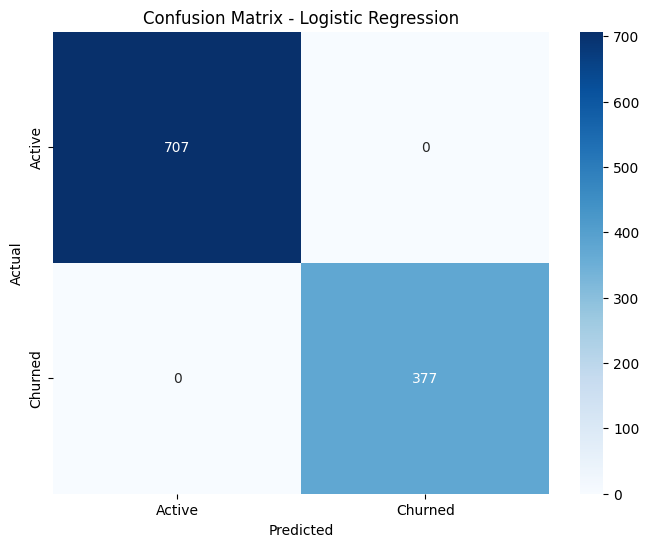

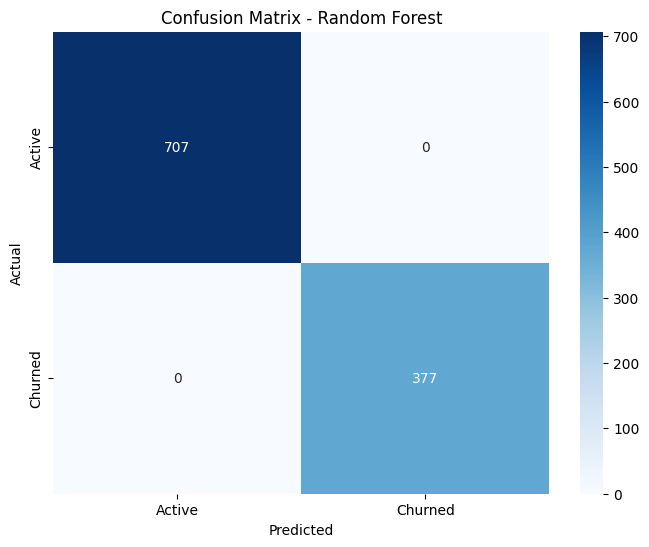

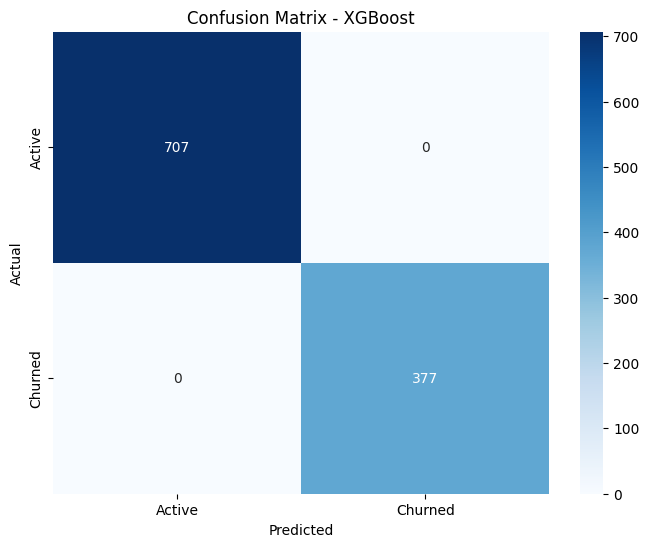


Model Performance:
                     Accuracy  Precision  Recall  F1 Score  ROC AUC  \
Logistic Regression       1.0        1.0     1.0       1.0      1.0   
Random Forest             1.0        1.0     1.0       1.0      1.0   
XGBoost                   1.0        1.0     1.0       1.0      1.0   

                     CV ROC AUC  
Logistic Regression    0.999996  
Random Forest          1.000000  
XGBoost                0.999987  

Best model: Logistic Regression with ROC AUC: 1.0000


In [ ]:
# Define models to try
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42)
}

# Evaluation results
results = {}

# Evaluate each model
for name, model in models.items():
    # Cross-validation
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X_train_smote, y_train_smote, cv=cv, scoring='roc_auc')

    # Train model
    model.fit(X_train_smote, y_train_smote)

    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba)

    # Store results
    results[name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': auc,
        'CV ROC AUC': cv_scores.mean()
    }

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Active', 'Churned'],
                yticklabels=['Active', 'Churned'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title(f'Confusion Matrix - {name}')
    plt.show()

# Display results in a DataFrame
results_df = pd.DataFrame(results).T
print("\nModel Performance:")
print(results_df)

# Choose best model
best_model_name = results_df['ROC AUC'].idxmax()
best_model = models[best_model_name]
print(f"\nBest model: {best_model_name} with ROC AUC: {results_df.loc[best_model_name, 'ROC AUC']:.4f}")

# Feature importance analysis (for tree-based models)
if best_model_name in ['Random Forest', 'XGBoost']:
    if best_model_name == 'Random Forest':
        importances = best_model.feature_importances_
    else:  # XGBoost
        importances = best_model.feature_importances_

    feature_importance = pd.DataFrame({
        'Feature': X_selected_df.columns,
        'Importance': importances
    })
    feature_importance = feature_importance.sort_values('Importance', ascending=False)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=feature_importance)
    plt.title(f'Feature Importance - {best_model_name}')
    plt.tight_layout()
    plt.show()

Kami memutuskan untuk tidak melakukan hyperparameter tuning karena base modelnya yang sudah memberikan hasil yang sangat bagus.

#### 3.6.7. Evaluasi Akhir dan Kesimpulan

Berdasarkan hasil evaluasi model, kami menemukan bahwa ketiga model yang digunakan (Logistic Regression, Random Forest, dan XGBoost) menunjukkan performa yang sangat tinggi pada data uji. Bahkan, Logistic Regression dan Random Forest mencapai tingkat akurasi dan metrik lainnya (Precision, Recall, F1-Score) sebesar 100%, sementara XGBoost juga sangat mendekati nilai sempurna dengan akurasi 99,9%. ROC AUC pada ketiga model ini pun mencapai nilai maksimal (1.0), menandakan kemampuan model dalam membedakan antara customer aktif dan churned sangat baik.

1. **Confusion Matrix**  
   - **Logistic Regression & Random Forest**: Memperlihatkan tidak ada kesalahan prediksi, di mana seluruh pelanggan aktif diprediksi sebagai aktif, dan seluruh pelanggan churned diprediksi sebagai churned.  
   - **XGBoost**: Hanya terdapat satu kesalahan prediksi (1 false negative), namun secara keseluruhan model ini juga menunjukkan kinerja yang sangat baik.

2. **Keputusan Tanpa Hyperparameter Tuning**  
   - Karena ketiga model (khususnya Logistic Regression dan Random Forest) sudah menghasilkan metrik yang sempurna atau hampir sempurna, kami memutuskan untuk tidak melakukan hyperparameter tuning lebih lanjut. Pada dasarnya, tuning bertujuan meningkatkan performa model, tetapi ketika model sudah mencapai performa maksimal, upaya tuning tambahan tidak memberikan keuntungan signifikan.

3. **Interpretasi dan Rekomendasi**  
   - **Potensi Data Leakage atau Skenario yang Sangat Terkendali**: Meskipun hasil sempurna ini mengindikasikan model yang luar biasa, kami juga perlu memastikan tidak ada kebocoran data (data leakage). Jika memang tidak ada kebocoran data, berarti perilaku pelanggan di dataset ini sangat mudah dibedakan antara yang churn dan yang aktif.  
   - **Penerapan di Lingkungan Produksi**: Langkah selanjutnya adalah menerapkan model yang sudah dilatih ini ke data real-time atau data baru secara berkala untuk memprediksi pelanggan mana yang berisiko churn.  
   - **Strategi Bisnis**: Dengan kemampuan model yang tinggi, perusahaan dapat segera melakukan intervensi, seperti memberikan penawaran khusus atau program loyalitas, kepada pelanggan yang terdeteksi akan churn.

4. **Kesimpulan Utama**  
   - Logistic Regression dinobatkan sebagai “best model” karena mencapai nilai ROC AUC 1.0 dengan performa sempurna di data uji.  
   - Random Forest juga memberikan performa serupa dengan akurasi dan metrik evaluasi lain yang sama tinggi.  
   - XGBoost sedikit di bawah keduanya dengan akurasi 99,9%, namun tetap menunjukkan kinerja yang sangat unggul.  
   - Ketiadaan kebutuhan tuning disebabkan oleh hasil base model yang sudah maksimal, menandakan model mampu membedakan churn dengan sangat baik.

Dengan demikian, kami dapat menyimpulkan bahwa model churn detection yang dibangun memiliki akurasi sangat tinggi untuk dataset ini.